In [31]:
from skXCS import XCS
from skXCS import StringEnumerator

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from sklearn.model_selection import cross_val_score

from mlxtend.evaluate import paired_ttest_5x2cv

# Note:
This notebook compares different mixing models on the XCS-scikit basis. 

Classifiers with continous updated inverse variance take a long time to train, because the inverse variance is calculated over
the entire training set for each classifier updated. This is not reasonable in real application.

# Content:
* [6 Bit Mulitplexer](#6-bit-mulitplexer)  
    * [Training Accuracy](#6-bit-training)  
    * [Cross-validation](#6-bit-cross)
    * [Boxplot](#6-bit-boxplot)
    * [T-Test](#6-bit-ttest)
* [11 Bit Mulitplexer](#11-bit-mulitplexer)
    * [Training Accuracy](#11-bit-training)  
    * [Cross-validation](#11-bit-cross)
    * [Boxplot](#11-bit-boxplot)
    * [T-Test](#11-bit-ttest)
* [20 Bit Mulitplexer](#20-bit-mulitplexer)
    * [Training Accuracy](#20-bit-training)  
    * [Cross-validation](#20-bit-cross)
    * [Boxplot](#20-bit-boxplot)
    * [T-Test](#20-bit-ttest)
* [Mulitclass](#20-bit-mulitplexer)
    * [Training Accuracy](#20-bit-training)  
    * [Cross-validation](#20-bit-cross)
    * [Boxplot](#20-bit-boxplot)
    * [T-Test](#20-bit-ttest)

<div id='6-bit-mulitplexer' />

# 6 Bit Multiplexer

In [83]:
dataPath = "test/DataSets/Real/Multiplexer6Modified.csv"
converter = StringEnumerator(dataPath,"Class")
headers, classLabel, dataFeatures, dataActions = converter.get_params()

In [84]:
clf_inv_var_continous_update = XCS(learning_iterations=4000, N=500, do_action_set_subsumption=True, mixing_method="inv-var-continous-update")
clf_inv_var_only_mixing = XCS(learning_iterations=4000, N=500, do_action_set_subsumption=True, mixing_method="inv-var-only-mixing")
clf_evenly_distributed = XCS(learning_iterations=4000, N=500, do_action_set_subsumption=True, mixing_method="evenly-distributed")
clf_normal = XCS(learning_iterations=4000, N=500, do_action_set_subsumption=True, mixing_method="normal")

<div id='6-bit-training'/>

### Training accuracy

In [90]:
score_inv_var_continous_update = []
score_inv_var_only_mixing = []
score_evenly_distributed = []
score_normal = []

In [91]:
for i in range(10):
    clf_inv_var_continous_update.fit(dataFeatures, dataActions)
    clf_inv_var_only_mixing .fit(dataFeatures, dataActions)
    clf_evenly_distributed.fit(dataFeatures, dataActions)
    clf_normal.fit(dataFeatures, dataActions)
    
    score_inv_var_continous_update.append(clf_inv_var_continous_update.get_final_training_accuracy())
    score_inv_var_only_mixing.append( clf_inv_var_only_mixing .get_final_training_accuracy())
    score_evenly_distributed.append(clf_evenly_distributed.get_final_training_accuracy())
    score_normal.append(clf_normal.get_final_training_accuracy())


print("Final training accuracy of clf_inv_var_continous_update is %.2f" % (np.mean(score_inv_var_continous_update)))
print("Final training accuracy of clf_inv_var_only_mixing  is %.2f" %(np.mean(score_inv_var_only_mixing))) 
print("Final training accuracy of clf_evenly_distributed is %.2f" %(np.mean(score_evenly_distributed)))
print("Final training accuracy of clf_normal is %.2f" %(np.mean(score_normal)))


Final training accuracy of clf_inv_var_continous_update is 0.86
Final training accuracy of clf_inv_var_only_mixing  is 0.59
Final training accuracy of clf_evenly_distributed is 0.96
Final training accuracy of clf_normal is 1.00


In [87]:
score_normal

[0.7978597520193446,
 0.8154464852257721,
 0.8548387096774193,
 0.8622729845140711,
 0.8462511361492686,
 0.8709677419354839,
 0.8491836874689167,
 0.8593532952616144,
 0.8621700879765395,
 0.8299763337963677,
 0.8521419629229476,
 0.7272727272727273,
 0.8125182212618545,
 0.7816664094253228,
 0.7903225806451613,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0,
 1.0]

<div id='6-bit-cross'/>


### Cross-validation

In [22]:
number_folds = 5
iterations = 3


score_inv_var_continous_update = []
score_inv_var_only_mixing = []
score_evenly_distributed = []
score_normal = []

for i in range(iterations):
    score_inv_var_continous_update.extend(cross_val_score(clf_inv_var_continous_update, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_inv_var_only_mixing.extend(cross_val_score(clf_inv_var_only_mixing , dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_evenly_distributed.extend(cross_val_score(clf_evenly_distributed, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_normal.extend(cross_val_score(clf_normal, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))



In [23]:
print("Cross validation score of clf_inv_var_continous_update is %.2f" % (np.mean(score_inv_var_continous_update)))
print("Cross validation score of clf_inv_var_only_mixing  is %.2f" %(np.mean(score_inv_var_only_mixing))) 
print("Cross validation score of clf_evenly_distributed is %.2f" %(np.mean(score_evenly_distributed)))
print("Cross validation score of clf_normal is %.2f" %(np.mean(score_normal)))

Cross validation score of clf_inv_var_continous_update is 0.83
Cross validation score of clf_inv_var_only_mixing  is 0.70
Cross validation score of clf_evenly_distributed is 0.88
Cross validation score of clf_normal is 0.98


<div id='6-bit-boxplot'>

### Boxplot

In [ ]:
def printBoxplot(scores_inv_var, scores):
    fig, (ax1, ax2) = plt.subplots(ncols=2, sharey=True)

    ax1.boxplot(scores_inv_var)
    ax1.set_title("inv-var")
    ax2.boxplot(scores)
    ax2.set_title("normal xcs")

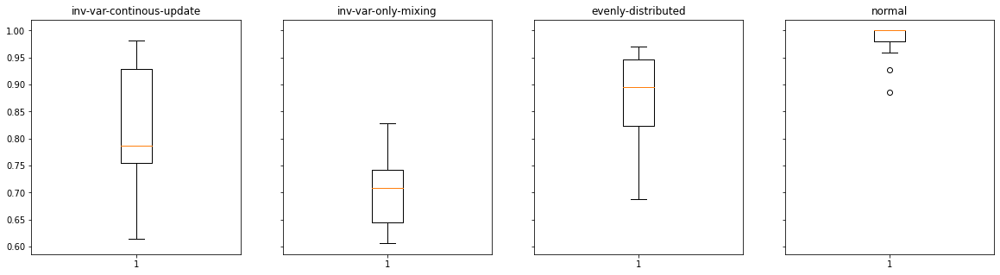

In [26]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, sharey=True, figsize=(20,5))

ax1.boxplot(score_inv_var_continous_update)
ax1.set_title("inv-var-continous-update")
ax2.boxplot(score_inv_var_only_mixing)
ax2.set_title("inv-var-only-mixing")
ax3.boxplot(score_evenly_distributed)
ax3.set_title("evenly-distributed")
ax4.boxplot(score_normal)
ax4.set_title("normal");

<div id='6-bit-ttest'>

### T-Test

In [56]:
clfs = [clf_inv_var_continous_update, clf_inv_var_only_mixing, clf_evenly_distributed, clf_normal]

clfs[2].fit(dataFeatures, dataActions)

matrix = np.zeros((4,4))

for i, clf1 in enumerate(clfs):
    for j, clf2 in enumerate(clfs):
        if j >= i:
            break
        t, p = paired_ttest_5x2cv(estimator1=clf1, estimator2=clf2, X=dataFeatures, y=dataActions)
        matrix[j, i] = p
        



array([[0.00000000e+00, 1.44957512e-03, 6.81381307e-02, 3.17071765e-02],
       [0.00000000e+00, 0.00000000e+00, 2.30790375e-04, 1.98544826e-05],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 7.40314261e-01],
       [0.00000000e+00, 0.00000000e+00, 0.00000000e+00, 0.00000000e+00]])

In [57]:
names = ["inv-var-continous-update", "inv-var-only-mixing", "evenly-distributed", "normal" ]
df = pd.DataFrame(matrix, columns=names, index=names)
df.style.applymap(lambda x: 'background-color : yellow' if x < 0.05 and not x == 0.0 else '')

,inv-var-continous-update,inv-var-only-mixing,evenly-distributed,normal
inv-var-continous-update,0.000000,0.001450,0.068138,0.031707
inv-var-only-mixing,0.000000,0.000000,0.000231,0.000020
evenly-distributed,0.000000,0.000000,0.000000,0.740314
normal,0.000000,0.000000,0.000000,0.000000


<div id='11-bit-mulitplexer' />

# 11 Bit Multiplexer

In [66]:
#Use StringEnumerator to gather data
converter = StringEnumerator("test/DataSets/Real/Multiplexer11.csv","class")
headers,actionLabel,dataFeatures,dataActions = converter.get_params()

#Shuffle data
formatted = np.insert(dataFeatures,dataFeatures.shape[1],dataActions,1)
np.random.shuffle(formatted)
dataFeatures = np.delete(formatted,-1,axis=1)
dataActions = formatted[:,-1]


In [67]:
clf_inv_var_continous_update = XCS(learning_iterations=4000, N=500, do_action_set_subsumption=True, mixing_method="inv-var-continous-update")
clf_inv_var_only_mixing = XCS(learning_iterations=4000, N=500, do_action_set_subsumption=True, mixing_method="inv-var-only-mixing")
clf_evenly_distributed = XCS(learning_iterations=4000, N=500, do_action_set_subsumption=True, mixing_method="evenly-distributed")
clf_normal = XCS(learning_iterations=4000, N=500, do_action_set_subsumption=True, mixing_method="normal")

<div id='11-bit-training'/>

### Training accuracy

In [68]:
score_inv_var_continous_update = []
score_inv_var_only_mixing = []
score_evenly_distributed = []
score_normal = []

In [70]:
for i in range(1):
    clf_inv_var_continous_update.fit(dataFeatures, dataActions)
    clf_inv_var_only_mixing .fit(dataFeatures, dataActions)
    clf_evenly_distributed.fit(dataFeatures, dataActions)
    clf_normal.fit(dataFeatures, dataActions)
    
    score_inv_var_continous_update.append(clf_inv_var_continous_update.get_final_training_accuracy())
    score_inv_var_only_mixing.append( clf_inv_var_only_mixing .get_final_training_accuracy())
    score_evenly_distributed.append(clf_evenly_distributed.get_final_training_accuracy())
    score_normal.append(clf_normal.get_final_training_accuracy())


print("Final training accuracy of clf_inv_var_continous_update is %.2f" % (np.mean(score_inv_var_continous_update)))
print("Final training accuracy of clf_inv_var_only_mixing  is %.2f" %(np.mean(score_inv_var_only_mixing))) 
print("Final training accuracy of clf_evenly_distributed is %.2f" %(np.mean(score_evenly_distributed)))
print("Final training accuracy of clf_normal is %.2f" %(np.mean(score_normal)))


Final training accuracy of clf_inv_var_continous_update is 0.85
Final training accuracy of clf_inv_var_only_mixing  is 0.78
Final training accuracy of clf_evenly_distributed is 0.78
Final training accuracy of clf_normal is 0.86


<div id='11-bit-cross'/>


### Cross-validation

In [74]:
number_folds = 3
iterations = 5


score_inv_var_continous_update = []
score_inv_var_only_mixing = []
score_evenly_distributed = []
score_normal = []

for i in range(iterations):
    score_inv_var_continous_update.extend(cross_val_score(clf_inv_var_continous_update, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_inv_var_only_mixing.extend(cross_val_score(clf_inv_var_only_mixing , dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_evenly_distributed.extend(cross_val_score(clf_evenly_distributed, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_normal.extend(cross_val_score(clf_normal, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))



In [92]:
print("Cross validation score of clf_inv_var_continous_update is %.2f" % (np.mean(score_inv_var_continous_update)))
print("Cross validation score of clf_inv_var_only_mixing  is %.2f" %(np.mean(score_inv_var_only_mixing))) 
print("Cross validation score of clf_evenly_distributed is %.2f" %(np.mean(score_evenly_distributed)))
print("Cross validation score of clf_normal is %.2f" %(np.mean(score_normal)))

Cross validation score of clf_inv_var_continous_update is 0.86
Cross validation score of clf_inv_var_only_mixing  is 0.59
Cross validation score of clf_evenly_distributed is 0.96
Cross validation score of clf_normal is 1.00


In [93]:
score_inv_var_only_mixing

[0.5709935897435897,
 0.5733974358974359,
 0.6000000000000001,
 0.5740384615384615,
 0.6052884615384615,
 0.5927884615384615,
 0.5758012820512821,
 0.594551282051282,
 0.5963141025641026,
 0.5894230769230769]

<div id=11-bit-boxplot'>

### Boxplot

In [94]:
def printBoxplot(scores_inv_var, scores):
    fig, (ax1, ax2) = plt.subplots(ncols=2, sharey=True)

    ax1.boxplot(scores_inv_var)
    ax1.set_title("inv-var")
    ax2.boxplot(scores)
    ax2.set_title("normal xcs")

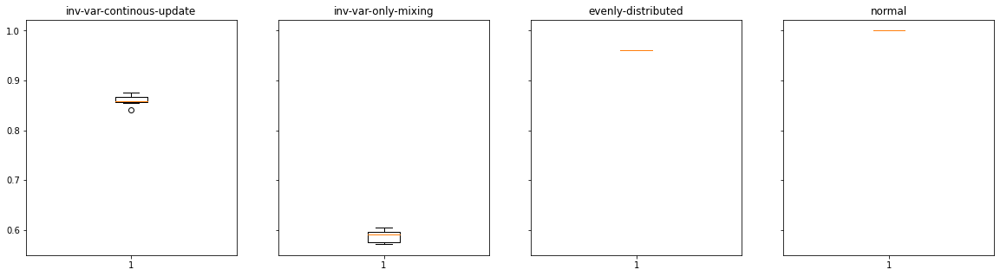

In [96]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, sharey=True, figsize=(20,5))

ax1.boxplot(score_inv_var_continous_update)
ax1.set_title("inv-var-continous-update")
ax2.boxplot(score_inv_var_only_mixing)
ax2.set_title("inv-var-only-mixing")
ax3.boxplot(score_evenly_distributed)
ax3.set_title("evenly-distributed")
ax4.boxplot(score_normal)
ax4.set_title("normal");

<div id='11-bit-ttest'>

### T-Test

In [ ]:
clfs = [clf_inv_var_continous_update, clf_inv_var_only_mixing, clf_evenly_distributed, clf_normal]

clfs[2].fit(dataFeatures, dataActions)

matrix = np.zeros((4,4))

for i, clf1 in enumerate(clfs):
    for j, clf2 in enumerate(clfs):
        if j >= i:
            break
        t, p = paired_ttest_5x2cv(estimator1=clf1, estimator2=clf2, X=dataFeatures, y=dataActions)
        matrix[j, i] = p
        



In [ ]:
names = ["inv-var-continous-update", "inv-var-only-mixing", "evenly-distributed", "normal" ]
df = pd.DataFrame(matrix, columns=names, index=names)
df.style.applymap(lambda x: 'background-color : yellow' if x < 0.05 and not x == 0.0 else '')

<div id='20-bit-mulitplexer'/>

## 20 Bit Multiplexer

In [61]:
dataPath = "test/DataSets/Real/Multiplexer20Modified.csv"
converter = StringEnumerator(dataPath,"Class")
headers, classLabel, dataFeatures, dataActions = converter.get_params()

In [62]:
clf_inv_var_continous_update = XCS(learning_iterations=40000, N=2000, do_action_set_subsumption=True, mixing_method="inv-var-continous-update")
clf_inv_var_only_mixing = XCS(learning_iterations=40000, N=2000, do_action_set_subsumption=True, mixing_method="inv-var-only-mixing")
clf_evenly_distributed = XCS(learning_iterations=40000, N=2000, do_action_set_subsumption=True, mixing_method="evenly-distributed")
clf_normal = XCS(learning_iterations=40000, N=2000, do_action_set_subsumption=True, mixing_method="normal")

<div id='20-bit-training'/>

### Training accuracy

In [63]:
score_inv_var_continous_update = []
score_inv_var_only_mixing = []
score_evenly_distributed = []
score_normal = []

In [65]:
for i in range(2):
    clf_inv_var_continous_update.fit(dataFeatures, dataActions)
    clf_inv_var_only_mixing.fit(dataFeatures, dataActions)
    clf_evenly_distributed.fit(dataFeatures, dataActions)
    clf_normal.fit(dataFeatures, dataActions)
    
    score_inv_var_continous_update.append(clf_inv_var_continous_update.get_final_training_accuracy())
    score_inv_var_only_mixing.append( clf_inv_var_only_mixing .get_final_training_accuracy())
    score_evenly_distributed.append(clf_evenly_distributed.get_final_training_accuracy())
    score_normal.append(clf_normal.get_final_training_accuracy())


print("Final training accuracy of clf_inv_var_continous_update is %.2f" % (np.mean(score_inv_var_continous_update)))
print("Final training accuracy of clf_inv_var_only_mixing  is %.2f" %(np.mean(score_inv_var_only_mixing))) 
print("Final training accuracy of clf_evenly_distributed is %.2f" %(np.mean(score_evenly_distributed)))
print("Final training accuracy of clf_normal is %.2f" %(np.mean(score_normal)))


KeyboardInterrupt: 

<div id='20-bit-cross'/>


### Cross-validation

In [22]:
number_folds = 2
iterations = 1


score_inv_var_continous_update = []
score_inv_var_only_mixing = []
score_evenly_distributed = []
score_normal = []

for i in range(iterations):
    score_inv_var_continous_update.extend(cross_val_score(clf_inv_var_continous_update, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_inv_var_only_mixing.extend(cross_val_score(clf_inv_var_only_mixing , dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_evenly_distributed.extend(cross_val_score(clf_evenly_distributed, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))
    score_normal.extend(cross_val_score(clf_normal, dataFeatures, dataActions, n_jobs=-1, cv=number_folds))



In [23]:
print("Cross validation score of clf_inv_var_continous_update is %.2f" % (np.mean(score_inv_var_continous_update)))
print("Cross validation score of clf_inv_var_only_mixing  is %.2f" %(np.mean(score_inv_var_only_mixing))) 
print("Cross validation score of clf_evenly_distributed is %.2f" %(np.mean(score_evenly_distributed)))
print("Cross validation score of clf_normal is %.2f" %(np.mean(score_normal)))

Cross validation score of clf_inv_var_continous_update is 0.83
Cross validation score of clf_inv_var_only_mixing  is 0.70
Cross validation score of clf_evenly_distributed is 0.88
Cross validation score of clf_normal is 0.98


<div id='20-bit-boxplot'>

### Boxplot

In [ ]:
def printBoxplot(scores_inv_var, scores):
    fig, (ax1, ax2) = plt.subplots(ncols=2, sharey=True)

    ax1.boxplot(scores_inv_var)
    ax1.set_title("inv-var")
    ax2.boxplot(scores)
    ax2.set_title("normal xcs")

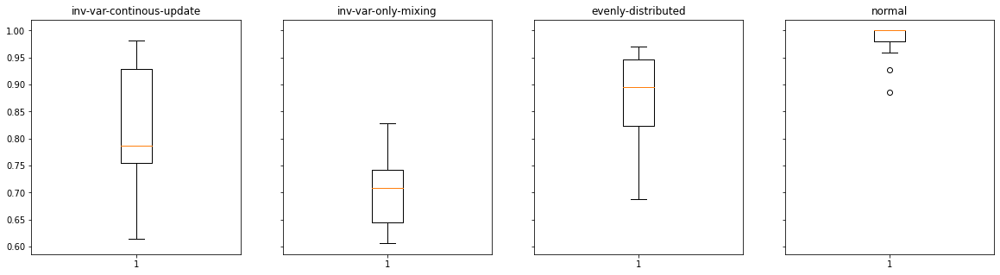

In [26]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(ncols=4, sharey=True, figsize=(20,5))

ax1.boxplot(score_inv_var_continous_update)
ax1.set_title("inv-var-continous-update")
ax2.boxplot(score_inv_var_only_mixing)
ax2.set_title("inv-var-only-mixing")
ax3.boxplot(score_evenly_distributed)
ax3.set_title("evenly-distributed")
ax4.boxplot(score_normal)
ax4.set_title("normal");

<div id='20-bit-ttest'>

### T-Test

In [ ]:
clfs = [clf_inv_var_continous_update, clf_inv_var_only_mixing, clf_evenly_distributed, clf_normal]

clfs[2].fit(dataFeatures, dataActions)

matrix = np.zeros((4,4))

for i, clf1 in enumerate(clfs):
    for j, clf2 in enumerate(clfs):
        if j >= i:
            break
        t, p = paired_ttest_5x2cv(estimator1=clf1, estimator2=clf2, X=dataFeatures, y=dataActions)
        matrix[j, i] = p
        



In [57]:
names = ["inv-var-continous-update", "inv-var-only-mixing", "evenly-distributed", "normal" ]
df = pd.DataFrame(matrix, columns=names, index=names)
df.style.applymap(lambda x: 'background-color : yellow' if x < 0.05 and not x == 0.0 else '')

,inv-var-continous-update,inv-var-only-mixing,evenly-distributed,normal
inv-var-continous-update,0.000000,0.001450,0.068138,0.031707
inv-var-only-mixing,0.000000,0.000000,0.000231,0.000020
evenly-distributed,0.000000,0.000000,0.000000,0.740314
normal,0.000000,0.000000,0.000000,0.000000


# Auswertung

In [11]:
def cumulativeFreq(freq):
    a = []
    c = []
    for i in freq:
        a.append(i+sum(c))
        c.append(i)
    return np.array(a)

def movingAvg(a,threshold=300):
    weights = np.repeat(1.0,threshold)/threshold
    conv = np.convolve(a,weights,'valid')
    return np.append(conv,np.full(threshold-1,conv[conv.size-1]),)

class TrainingData():
    def __init__(self, clf, path="defaultExportDir/iterationData.csv"):
        
        
        
        self.clf = clf
        self.path = path
        
        self.clf.export_iteration_tracking_data(path)
        dataTracking = pd.read_csv(path)
        
        self.iterations = dataTracking["Iteration"].values
        self.accuracy = dataTracking['Accuracy (approx)'].values
        self.generality = dataTracking['Average Population Generality'].values
        self.macroPop = dataTracking["Macropopulation Size"].values
        self.microPop = dataTracking["Micropopulation Size"].values
        self.mSize = dataTracking["Match Set Size"].values
        self.aSize = dataTracking["Action Set Size"].values
        self.experience = dataTracking["Average Iteration Age of Action Set Classifiers"].values
        self.subsumption = dataTracking["# Classifiers Subsumed in Iteration"].values
        self.crossover = dataTracking["# Crossover Operations Performed in Iteration"].values
        self.mutation = dataTracking["# Mutation Operations Performed in Iteration"].values
        self.covering = dataTracking["# Covering Operations Performed in Iteration"].values
        self.deletion = dataTracking["# Deletion Operations Performed in Iteration"].values

        self.gTime = dataTracking["Total Global Time"].values
        self.mTime = dataTracking["Total Matching Time"].values
        self.delTime = dataTracking["Total Deletion Time"].values
        self.subTime = dataTracking["Total Subsumption Time"].values
        self.selTime = dataTracking["Total GA Time"].values
        self.evalTime = dataTracking["Total Evaluation Time"].values
    


In [21]:
#Use StringEnumerator to gather data
converter = StringEnumerator("test/DataSets/Real/Multiplexer11.csv","class")
headers,actionLabel,dataFeatures,dataActions = converter.get_params()

#Shuffle data
formatted = np.insert(dataFeatures,dataFeatures.shape[1],dataActions,1)
np.random.shuffle(formatted)
dataFeatures = np.delete(formatted,-1,axis=1)
dataActions = formatted[:,-1]

#Initialize and train model
clf = XCS(learning_iterations = 5000)
clf.fit(dataFeatures,dataActions)

clf_inv_var = XCS(learning_iterations=5000, use_inverse_varinance=True)
clf_inv_var.fit(dataFeatures, dataActions)

Summe der inversen Invarianzen: 0.2
Infinity Count: 0
Updating Gating Param of cls 0:
 0.5
Updating Gating Param of cls 1:
 0.5
Summe der inversen Invarianzen: 0.2
Infinity Count: 0
Updating Gating Param of cls 2:
 0.5
Updating Gating Param of cls 3:
 0.5
Summe der inversen Invarianzen: 0.2
Infinity Count: 0
Updating Gating Param of cls 4:
 0.5
Updating Gating Param of cls 5:
 0.5
Summe der inversen Invarianzen: 0.2
Infinity Count: 0
Updating Gating Param of cls 6:
 0.5
Updating Gating Param of cls 7:
 0.5
Summe der inversen Invarianzen: 0.2
Infinity Count: 0
Updating Gating Param of cls 8:
 0.5
Updating Gating Param of cls 9:
 0.5
Summe der inversen Invarianzen: 0.2
Infinity Count: 0
Updating Gating Param of cls 10:
 0.5
Updating Gating Param of cls 11:
 0.5
Summe der inversen Invarianzen: 0.2
Infinity Count: 0
Updating Gating Param of cls 12:
 0.5
Updating Gating Param of cls 13:
 0.5
Summe der inversen Invarianzen: 0.2
Infinity Count: 0
Updating Gating Param of cls 14:
 0.5
Updating

Updating Gating Param of cls 64:
 -0.0
Updating Gating Param of cls 66:
 -0.0
Updating Gating Param of cls 79:
 0.5
Updating Gating Param of cls 121:
 0.0
Updating Gating Param of cls 127:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 2
Updating Gating Param of cls 25:
 0.5
Updating Gating Param of cls 41:
 0.5
Updating Gating Param of cls 83:
 0.0
Updating Gating Param of cls 130:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 4
Updating Gating Param of cls 13:
 0.25
Updating Gating Param of cls 29:
 0.25
Updating Gating Param of cls 82:
 -0.0
Updating Gating Param of cls 107:
 0.25
Updating Gating Param of cls 115:
 0.25
Summe der inversen Invarianzen: inf
Infinity Count: 2
Updating Gating Param of cls 12:
 0.5
Updating Gating Param of cls 89:
 0.0
Updating Gating Param of cls 98:
 0.5
Updating Gating Param of cls 131:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 1
Updating Gating Param of cls 22:
 1.0
Updating Gating Param of cls 66:
 -0.0
Updating G

 0.1111111111111111
Updating Gating Param of cls 19:
 0.1111111111111111
Updating Gating Param of cls 21:
 0.1111111111111111
Updating Gating Param of cls 36:
 0.1111111111111111
Updating Gating Param of cls 41:
 0.1111111111111111
Updating Gating Param of cls 88:
 0.1111111111111111
Updating Gating Param of cls 101:
 0.0
Updating Gating Param of cls 130:
 0.1111111111111111
Updating Gating Param of cls 131:
 0.1111111111111111
Updating Gating Param of cls 147:
 0.1111111111111111
Updating Gating Param of cls 164:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 2
Updating Gating Param of cls 5:
 0.5
Updating Gating Param of cls 59:
 0.5
Updating Gating Param of cls 85:
 -0.0
Updating Gating Param of cls 181:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 5
Updating Gating Param of cls 7:
 0.2
Updating Gating Param of cls 68:
 0.2
Updating Gating Param of cls 95:
 0.0
Updating Gating Param of cls 150:
 0.2
Updating Gating Param of cls 156:
 0.2
Updating Gating Param 

Updating Gating Param of cls 85:
 -0.0
Updating Gating Param of cls 117:
 0.1111111111111111
Updating Gating Param of cls 130:
 0.1111111111111111
Updating Gating Param of cls 147:
 0.1111111111111111
Updating Gating Param of cls 148:
 -0.0
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 193:
 0.1111111111111111
Updating Gating Param of cls 201:
 0.1111111111111111
Updating Gating Param of cls 202:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 7
Updating Gating Param of cls 6:
 0.14285714285714285
Updating Gating Param of cls 21:
 0.14285714285714285
Updating Gating Param of cls 29:
 0.14285714285714285
Updating Gating Param of cls 35:
 0.14285714285714285
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.14285714285714285
Updating Gating Param of cls 81:
 0.14285714285714285
Updating Gating Param of cls 136:
 0.14285714285714285
Summe der inversen Invarianzen: inf
Infinity Count: 5
Updating Gating Param of cls 41:
 0.2
Updating Ga

 0.1
Updating Gating Param of cls 160:
 0.1
Updating Gating Param of cls 167:
 0.1
Updating Gating Param of cls 174:
 0.1
Updating Gating Param of cls 178:
 0.1
Summe der inversen Invarianzen: inf
Infinity Count: 9
Updating Gating Param of cls 13:
 0.1111111111111111
Updating Gating Param of cls 17:
 0.1111111111111111
Updating Gating Param of cls 29:
 0.1111111111111111
Updating Gating Param of cls 107:
 0.1111111111111111
Updating Gating Param of cls 125:
 0.1111111111111111
Updating Gating Param of cls 139:
 0.1111111111111111
Updating Gating Param of cls 150:
 0.1111111111111111
Updating Gating Param of cls 160:
 0.1111111111111111
Updating Gating Param of cls 184:
 0.1111111111111111
Updating Gating Param of cls 205:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 12
Updating Gating Param of cls 7:
 0.08333333333333333
Updating Gating Param of cls 21:
 0.08333333333333333
Updating Gating Param of cls 34:
 0.08333333333333333
Updating Gating Param of cls 61:
 0.08333333333

Updating Gating Param of cls 209:
 0.09090909090909091
Updating Gating Param of cls 213:
 0.0
Updating Gating Param of cls 215:
 0.09090909090909091
Summe der inversen Invarianzen: inf
Infinity Count: 8
Updating Gating Param of cls 9:
 0.125
Updating Gating Param of cls 25:
 0.125
Updating Gating Param of cls 52:
 0.125
Updating Gating Param of cls 107:
 0.125
Updating Gating Param of cls 114:
 0.125
Updating Gating Param of cls 150:
 0.125
Updating Gating Param of cls 152:
 0.125
Updating Gating Param of cls 165:
 0.0
Updating Gating Param of cls 179:
 0.125
Updating Gating Param of cls 204:
 0.0
Updating Gating Param of cls 213:
 0.0
Updating Gating Param of cls 220:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 5
Updating Gating Param of cls 59:
 0.2
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 70:
 0.2
Updating Gating Param of cls 71:
 0.2
Updating Gating Param of cls 172:
 0.2
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of cls 185:

Updating Gating Param of cls 35:
 0.06666666666666667
Updating Gating Param of cls 41:
 0.06666666666666667
Updating Gating Param of cls 61:
 0.06666666666666667
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.06666666666666667
Updating Gating Param of cls 85:
 0.0
Updating Gating Param of cls 103:
 0.06666666666666667
Updating Gating Param of cls 130:
 0.06666666666666667
Updating Gating Param of cls 136:
 0.06666666666666667
Updating Gating Param of cls 138:
 0.06666666666666667
Updating Gating Param of cls 142:
 0.06666666666666667
Updating Gating Param of cls 148:
 -0.0
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 167:
 0.06666666666666667
Updating Gating Param of cls 193:
 0.06666666666666667
Updating Gating Param of cls 201:
 0.06666666666666667
Updating Gating Param of cls 216:
 0.0
Updating Gating Param of cls 221:
 0.06666666666666667
Updating Gating Param of cls 233:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 9
Up

 0.09090909090909091
Updating Gating Param of cls 131:
 0.09090909090909091
Updating Gating Param of cls 147:
 0.09090909090909091
Updating Gating Param of cls 184:
 0.09090909090909091
Updating Gating Param of cls 189:
 0.09090909090909091
Updating Gating Param of cls 192:
 0.09090909090909091
Updating Gating Param of cls 193:
 0.09090909090909091
Updating Gating Param of cls 201:
 0.09090909090909091
Updating Gating Param of cls 202:
 0.09090909090909091
Updating Gating Param of cls 240:
 0.09090909090909091
Summe der inversen Invarianzen: inf
Infinity Count: 13
Updating Gating Param of cls 17:
 0.07692307692307693
Updating Gating Param of cls 23:
 0.07692307692307693
Updating Gating Param of cls 25:
 0.07692307692307693
Updating Gating Param of cls 59:
 0.07692307692307693
Updating Gating Param of cls 100:
 0.07692307692307693
Updating Gating Param of cls 107:
 0.07692307692307693
Updating Gating Param of cls 112:
 0.07692307692307693
Updating Gating Param of cls 139:
 0.07692307692

 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 7
Updating Gating Param of cls 17:
 0.14285714285714285
Updating Gating Param of cls 65:
 0.14285714285714285
Updating Gating Param of cls 150:
 0.14285714285714285
Updating Gating Param of cls 164:
 -0.0
Updating Gating Param of cls 180:
 0.14285714285714285
Updating Gating Param of cls 183:
 0.14285714285714285
Updating Gating Param of cls 219:
 0.14285714285714285
Updating Gating Param of cls 244:
 0.14285714285714285
Updating Gating Param of cls 246:
 0.0
Updating Gating Param of cls 250:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 7
Updating Gating Param of cls 1:
 0.14285714285714285
Updating Gating Param of cls 63:
 0.14285714285714285
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 122:
 0.14285714285714285
Updating Gating Param of cls 166:
 0.14285714285714285
Updating Gating Param of cls 167:
 0.14285714285714285
Updating Gating Param of cls 174:
 0.1

Updating Gating Param of cls 253:
 0.0
Updating Gating Param of cls 263:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 12
Updating Gating Param of cls 5:
 0.08333333333333333
Updating Gating Param of cls 7:
 0.08333333333333333
Updating Gating Param of cls 95:
 0.08333333333333333
Updating Gating Param of cls 152:
 0.08333333333333333
Updating Gating Param of cls 170:
 0.08333333333333333
Updating Gating Param of cls 178:
 0.08333333333333333
Updating Gating Param of cls 182:
 0.08333333333333333
Updating Gating Param of cls 199:
 0.08333333333333333
Updating Gating Param of cls 240:
 0.08333333333333333
Updating Gating Param of cls 243:
 0.08333333333333333
Updating Gating Param of cls 247:
 0.08333333333333333
Updating Gating Param of cls 261:
 0.0
Updating Gating Param of cls 265:
 0.08333333333333333
Summe der inversen Invarianzen: inf
Infinity Count: 10
Updating Gating Param of cls 57:
 0.1
Updating Gating Param of cls 97:
 0.1
Updating Gating Param of cls 147:
 0.1
Upd

Updating Gating Param of cls 223:
 0.058823529411764705
Updating Gating Param of cls 234:
 0.0
Updating Gating Param of cls 235:
 0.058823529411764705
Updating Gating Param of cls 259:
 0.058823529411764705
Updating Gating Param of cls 267:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 25:
 0.0625
Updating Gating Param of cls 26:
 0.0625
Updating Gating Param of cls 33:
 0.0625
Updating Gating Param of cls 35:
 0.0625
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 102:
 0.0625
Updating Gating Param of cls 104:
 0.0625
Updating Gating Param of cls 152:
 0.0625
Updating Gating Param of cls 186:
 0.0625
Updating Gating Param of cls 187:
 0.0625
Updating Gating Param of cls 200:
 0.0625
Updating Gating Param of cls 213:
 0.0625
Updating Gating Param of cls 222:
 0.0625
Updating Gating Param of cls 223:
 0.0625
Updating Gating Param of cls 235:
 0.0625
Updating Gating Param of cls 259:
 0.0625
Updating Gating Param of cls 261:
 

Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 0:
 0.0
Updating Gating Param of cls 17:
 0.043478260869565216
Updating Gating Param of cls 45:
 0.043478260869565216
Updating Gating Param of cls 107:
 0.043478260869565216
Updating Gating Param of cls 133:
 0.043478260869565216
Updating Gating Param of cls 139:
 0.043478260869565216
Updating Gating Param of cls 150:
 0.043478260869565216
Updating Gating Param of cls 160:
 0.043478260869565216
Updating Gating Param of cls 168:
 0.043478260869565216
Updating Gating Param of cls 175:
 0.043478260869565216
Updating Gating Param of cls 178:
 0.043478260869565216
Updating Gating Param of cls 182:
 0.043478260869565216
Updating Gating Param of cls 184:
 0.043478260869565216
Updating Gating Param of cls 195:
 0.043478260869565216
Updating Gating Param of cls 205:
 -0.0
Updating Gating Param of cls 212:
 -0.0
Updating Gating Param of cls 218:
 0.043478260869565216
Updating Gating Param of cls 229:
 0.043478260

Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 22:
 0.06666666666666667
Updating Gating Param of cls 59:
 0.06666666666666667
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 128:
 0.06666666666666667
Updating Gating Param of cls 129:
 0.06666666666666667
Updating Gating Param of cls 132:
 0.06666666666666667
Updating Gating Param of cls 143:
 0.06666666666666667
Updating Gating Param of cls 152:
 0.06666666666666667
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of cls 194:
 0.06666666666666667
Updating Gating Param of cls 201:
 0.06666666666666667
Updating Gating Param of cls 203:
 0.06666666666666667
Updating Gating Param of cls 209:
 0.06666666666666667
Updating Gating Param of cls 215:
 0.06666666666666667
Updating Gating Param of cls 259:
 0.06666666666666667
Updating Gating Param of cls 263:
 -0.0
Updating Gating Param of cls 264:
 0.06666666666666667
Updating Gating Param 

 0.0625
Updating Gating Param of cls 254:
 0.0625
Updating Gating Param of cls 265:
 0.0625
Updating Gating Param of cls 278:
 0.0625
Updating Gating Param of cls 297:
 0.0625
Updating Gating Param of cls 310:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 10
Updating Gating Param of cls 85:
 0.0
Updating Gating Param of cls 162:
 0.0
Updating Gating Param of cls 170:
 0.1
Updating Gating Param of cls 178:
 0.1
Updating Gating Param of cls 182:
 0.1
Updating Gating Param of cls 240:
 0.1
Updating Gating Param of cls 243:
 0.1
Updating Gating Param of cls 247:
 0.1
Updating Gating Param of cls 253:
 0.1
Updating Gating Param of cls 265:
 0.1
Updating Gating Param of cls 277:
 0.1
Updating Gating Param of cls 286:
 0.1
Summe der inversen Invarianzen: inf
Infinity Count: 9
Updating Gating Param of cls 150:
 0.1111111111111111
Updating Gating Param of cls 152:
 0.1111111111111111
Updating Gating Param of cls 160:
 0.1111111111111111
Updating Gating Param of cls 200:
 0.1111111111

Summe der inversen Invarianzen: inf
Infinity Count: 18
Updating Gating Param of cls 15:
 0.0
Updating Gating Param of cls 36:
 0.05555555555555555
Updating Gating Param of cls 42:
 0.05555555555555555
Updating Gating Param of cls 43:
 0.05555555555555555
Updating Gating Param of cls 51:
 0.05555555555555555
Updating Gating Param of cls 88:
 0.05555555555555555
Updating Gating Param of cls 92:
 0.05555555555555555
Updating Gating Param of cls 126:
 -0.0
Updating Gating Param of cls 151:
 0.05555555555555555
Updating Gating Param of cls 164:
 0.0
Updating Gating Param of cls 184:
 0.05555555555555555
Updating Gating Param of cls 209:
 0.05555555555555555
Updating Gating Param of cls 210:
 0.05555555555555555
Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 215:
 0.05555555555555555
Updating Gating Param of cls 250:
 0.05555555555555555
Updating Gating Param of cls 254:
 0.05555555555555555
Updating Gating Param of cls 273:
 -0.0
Updating Gating Param of cls 295:
 0.055

Updating Gating Param of cls 125:
 0.041666666666666664
Updating Gating Param of cls 126:
 -0.0
Updating Gating Param of cls 133:
 0.041666666666666664
Updating Gating Param of cls 139:
 0.041666666666666664
Updating Gating Param of cls 164:
 0.0
Updating Gating Param of cls 168:
 0.041666666666666664
Updating Gating Param of cls 175:
 0.041666666666666664
Updating Gating Param of cls 178:
 0.041666666666666664
Updating Gating Param of cls 184:
 0.041666666666666664
Updating Gating Param of cls 219:
 0.041666666666666664
Updating Gating Param of cls 229:
 0.041666666666666664
Updating Gating Param of cls 248:
 -0.0
Updating Gating Param of cls 254:
 0.041666666666666664
Updating Gating Param of cls 265:
 0.041666666666666664
Updating Gating Param of cls 276:
 0.041666666666666664
Updating Gating Param of cls 285:
 0.041666666666666664
Updating Gating Param of cls 286:
 0.041666666666666664
Updating Gating Param of cls 290:
 0.041666666666666664
Updating Gating Param of cls 297:
 0.0416

Updating Gating Param of cls 103:
 0.058823529411764705
Updating Gating Param of cls 104:
 0.058823529411764705
Updating Gating Param of cls 137:
 0.058823529411764705
Updating Gating Param of cls 167:
 0.058823529411764705
Updating Gating Param of cls 181:
 0.058823529411764705
Updating Gating Param of cls 186:
 0.058823529411764705
Updating Gating Param of cls 201:
 0.058823529411764705
Updating Gating Param of cls 221:
 0.058823529411764705
Updating Gating Param of cls 222:
 0.058823529411764705
Updating Gating Param of cls 235:
 0.058823529411764705
Updating Gating Param of cls 248:
 -0.0
Updating Gating Param of cls 259:
 0.058823529411764705
Updating Gating Param of cls 263:
 -0.0
Updating Gating Param of cls 267:
 0.058823529411764705
Updating Gating Param of cls 297:
 0.058823529411764705
Summe der inversen Invarianzen: inf
Infinity Count: 27
Updating Gating Param of cls 11:
 0.037037037037037035
Updating Gating Param of cls 13:
 0.037037037037037035
Updating Gating Param of cl

 0.03225806451612903
Updating Gating Param of cls 43:
 0.03225806451612903
Updating Gating Param of cls 92:
 0.03225806451612903
Updating Gating Param of cls 107:
 0.03225806451612903
Updating Gating Param of cls 109:
 0.03225806451612903
Updating Gating Param of cls 114:
 0.03225806451612903
Updating Gating Param of cls 115:
 0.03225806451612903
Updating Gating Param of cls 133:
 0.03225806451612903
Updating Gating Param of cls 139:
 0.03225806451612903
Updating Gating Param of cls 150:
 0.03225806451612903
Updating Gating Param of cls 151:
 0.03225806451612903
Updating Gating Param of cls 164:
 0.0
Updating Gating Param of cls 177:
 0.03225806451612903
Updating Gating Param of cls 178:
 0.03225806451612903
Updating Gating Param of cls 179:
 0.03225806451612903
Updating Gating Param of cls 184:
 0.03225806451612903
Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 239:
 0.03225806451612903
Updating Gating Param of cls 245:
 0.03225806451612903
Updating Gating Param o

Updating Gating Param of cls 178:
 0.038461538461538464
Updating Gating Param of cls 179:
 0.038461538461538464
Updating Gating Param of cls 184:
 0.038461538461538464
Updating Gating Param of cls 213:
 0.038461538461538464
Updating Gating Param of cls 239:
 0.038461538461538464
Updating Gating Param of cls 255:
 0.038461538461538464
Updating Gating Param of cls 265:
 0.038461538461538464
Updating Gating Param of cls 280:
 0.038461538461538464
Updating Gating Param of cls 283:
 0.038461538461538464
Updating Gating Param of cls 288:
 0.038461538461538464
Updating Gating Param of cls 310:
 0.038461538461538464
Updating Gating Param of cls 318:
 0.038461538461538464
Updating Gating Param of cls 321:
 0.038461538461538464
Updating Gating Param of cls 329:
 0.0
Updating Gating Param of cls 334:
 0.038461538461538464
Updating Gating Param of cls 335:
 0.0
Updating Gating Param of cls 358:
 0.038461538461538464
Updating Gating Param of cls 359:
 0.0
Summe der inversen Invarianzen: inf
Infinit

Updating Gating Param of cls 363:
 0.0625
Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 59:
 0.06666666666666667
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 102:
 0.06666666666666667
Updating Gating Param of cls 129:
 0.06666666666666667
Updating Gating Param of cls 143:
 0.06666666666666667
Updating Gating Param of cls 152:
 0.06666666666666667
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of cls 201:
 0.06666666666666667
Updating Gating Param of cls 215:
 0.06666666666666667
Updating Gating Param of cls 259:
 0.06666666666666667
Updating Gating Param of cls 261:
 0.06666666666666667
Updating Gating Param of cls 263:
 0.0
Updating Gating Param of cls 264:
 0.06666666666666667
Updating Gating Param of cls 267:
 0.06666666666666667
Updating Gating Param of cls 268:
 0.0
Updating Gating Param of cls 298:
 0.06666666666666667
Updating Gating Param of cls 300:
 0.06666666666666

 0.027777777777777776
Updating Gating Param of cls 339:
 0.027777777777777776
Updating Gating Param of cls 344:
 0.027777777777777776
Updating Gating Param of cls 367:
 -0.0
Updating Gating Param of cls 371:
 0.027777777777777776
Updating Gating Param of cls 380:
 0.027777777777777776
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 12:
 0.043478260869565216
Updating Gating Param of cls 21:
 0.043478260869565216
Updating Gating Param of cls 29:
 0.043478260869565216
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 79:
 0.043478260869565216
Updating Gating Param of cls 96:
 0.043478260869565216
Updating Gating Param of cls 97:
 0.043478260869565216
Updating Gating Param of cls 131:
 0.043478260869565216
Updating Gating Param of cls 146:
 0.043478260869565216
Updating Gating Param of cls 147:
 0.043478260869565216
Updating Gating Param of cls 184:
 0.043478260869565216
Updating Gating Param of cls 193:
 0.043478260869565216
Updating Ga

Updating Gating Param of cls 377:
 0.045454545454545456
Updating Gating Param of cls 388:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 7
Updating Gating Param of cls 6:
 0.14285714285714285
Updating Gating Param of cls 14:
 0.14285714285714285
Updating Gating Param of cls 35:
 0.14285714285714285
Updating Gating Param of cls 38:
 0.14285714285714285
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.14285714285714285
Updating Gating Param of cls 142:
 0.14285714285714285
Updating Gating Param of cls 231:
 0.14285714285714285
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 389:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 10
Updating Gating Param of cls 10:
 0.1
Updating Gating Param of cls 41:
 0.1
Updating Gating Param of cls 130:
 0.1
Updating Gating Param of cls 178:
 0.1
Updating Gating Param of cls 235:
 0.1
Updating Gating Param of cls 240:
 0.1
Updating Gating Param of cls 247:
 0.1
Updating Gating Param of cls 2

 0.04
Updating Gating Param of cls 394:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cls 46:
 0.034482758620689655
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 72:
 0.034482758620689655
Updating Gating Param of cls 102:
 0.034482758620689655
Updating Gating Param of cls 122:
 0.034482758620689655
Updating Gating Param of cls 129:
 0.034482758620689655
Updating Gating Param of cls 152:
 0.034482758620689655
Updating Gating Param of cls 166:
 0.034482758620689655
Updating Gating Param of cls 174:
 0.034482758620689655
Updating Gating Param of cls 187:
 0.034482758620689655
Updating Gating Param of cls 215:
 0.034482758620689655
Updating Gating Param of cls 241:
 0.034482758620689655
Updating Gating Param of cls 259:
 0.034482758620689655
Updating Gating Param of cls 261:
 0.034482758620689655
Updating Gating Param of cls 267:
 0.034482758620689655
Updating Gating Param of cls 268:
 0.03448

Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 9:
 0.05
Updating Gating Param of cls 11:
 0.05
Updating Gating Param of cls 21:
 0.05
Updating Gating Param of cls 107:
 0.05
Updating Gating Param of cls 150:
 0.05
Updating Gating Param of cls 156:
 0.05
Updating Gating Param of cls 183:
 0.05
Updating Gating Param of cls 254:
 0.05
Updating Gating Param of cls 265:
 0.05
Updating Gating Param of cls 275:
 0.05
Updating Gating Param of cls 287:
 0.05
Updating Gating Param of cls 290:
 0.05
Updating Gating Param of cls 291:
 0.05
Updating Gating Param of cls 302:
 0.05
Updating Gating Param of cls 308:
 0.05
Updating Gating Param of cls 334:
 0.05
Updating Gating Param of cls 335:
 0.05
Updating Gating Param of cls 339:
 0.05
Updating Gating Param of cls 348:
 0.05
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 383:
 0.0
Updating Gating Param of cls 391:
 0.05
Updating Gating Param of cls 403:
 0.0
Summe der inversen Invarianzen: 

 0.030303030303030304
Updating Gating Param of cls 283:
 0.030303030303030304
Updating Gating Param of cls 284:
 0.030303030303030304
Updating Gating Param of cls 334:
 0.030303030303030304
Updating Gating Param of cls 335:
 0.030303030303030304
Updating Gating Param of cls 348:
 0.030303030303030304
Updating Gating Param of cls 358:
 0.030303030303030304
Updating Gating Param of cls 362:
 0.030303030303030304
Updating Gating Param of cls 365:
 0.030303030303030304
Updating Gating Param of cls 366:
 0.030303030303030304
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 373:
 0.030303030303030304
Updating Gating Param of cls 374:
 0.030303030303030304
Updating Gating Param of cls 389:
 0.030303030303030304
Updating Gating Param of cls 397:
 0.030303030303030304
Updating Gating Param of cls 399:
 0.030303030303030304
Updating Gating Param of cls 403:
 0.030303030303030304
Updating Gating Param of cls 409:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 21
Updat

 0.041666666666666664
Updating Gating Param of cls 288:
 0.041666666666666664
Updating Gating Param of cls 292:
 0.041666666666666664
Updating Gating Param of cls 321:
 0.041666666666666664
Updating Gating Param of cls 323:
 0.041666666666666664
Updating Gating Param of cls 324:
 0.041666666666666664
Updating Gating Param of cls 358:
 0.041666666666666664
Updating Gating Param of cls 395:
 0.041666666666666664
Updating Gating Param of cls 404:
 0.041666666666666664
Updating Gating Param of cls 405:
 0.041666666666666664
Updating Gating Param of cls 412:
 -0.0
Updating Gating Param of cls 414:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 12
Updating Gating Param of cls 10:
 0.08333333333333333
Updating Gating Param of cls 58:
 0.08333333333333333
Updating Gating Param of cls 107:
 0.08333333333333333
Updating Gating Param of cls 136:
 0.08333333333333333
Updating Gating Param of cls 154:
 0.08333333333333333
Updating Gating Param of cls 155:
 0.08333333333333333
Updating Gat

 0.0
Updating Gating Param of cls 179:
 0.03225806451612903
Updating Gating Param of cls 184:
 0.03225806451612903
Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 231:
 0.03225806451612903
Updating Gating Param of cls 239:
 0.03225806451612903
Updating Gating Param of cls 245:
 0.03225806451612903
Updating Gating Param of cls 246:
 0.03225806451612903
Updating Gating Param of cls 249:
 0.03225806451612903
Updating Gating Param of cls 250:
 0.03225806451612903
Updating Gating Param of cls 265:
 0.03225806451612903
Updating Gating Param of cls 286:
 0.03225806451612903
Updating Gating Param of cls 302:
 0.03225806451612903
Updating Gating Param of cls 308:
 0.03225806451612903
Updating Gating Param of cls 309:
 0.03225806451612903
Updating Gating Param of cls 310:
 0.03225806451612903
Updating Gating Param of cls 321:
 0.03225806451612903
Updating Gating Param of cls 333:
 0.03225806451612903
Updating Gating Param of cls 335:
 0.03225806451612903
Updating Gating Param

Summe der inversen Invarianzen: inf
Infinity Count: 13
Updating Gating Param of cls 79:
 0.07692307692307693
Updating Gating Param of cls 164:
 0.0
Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 215:
 0.07692307692307693
Updating Gating Param of cls 231:
 0.07692307692307693
Updating Gating Param of cls 250:
 0.07692307692307693
Updating Gating Param of cls 296:
 0.07692307692307693
Updating Gating Param of cls 302:
 0.07692307692307693
Updating Gating Param of cls 308:
 0.07692307692307693
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 381:
 0.07692307692307693
Updating Gating Param of cls 398:
 0.07692307692307693
Updating Gating Param of cls 403:
 0.07692307692307693
Updating Gating Param of cls 406:
 0.07692307692307693
Updating Gating Param of cls 408:
 0.07692307692307693
Updating Gating Param of cls 429:
 0.07692307692307693
Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 10:
 0.06666666666666667
Updat

Updating Gating Param of cls 271:
 0.043478260869565216
Updating Gating Param of cls 278:
 0.043478260869565216
Updating Gating Param of cls 286:
 0.043478260869565216
Updating Gating Param of cls 295:
 0.043478260869565216
Updating Gating Param of cls 308:
 0.043478260869565216
Updating Gating Param of cls 315:
 0.043478260869565216
Updating Gating Param of cls 320:
 0.043478260869565216
Updating Gating Param of cls 321:
 0.043478260869565216
Updating Gating Param of cls 323:
 0.043478260869565216
Updating Gating Param of cls 328:
 0.0
Updating Gating Param of cls 339:
 0.043478260869565216
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 388:
 0.0
Updating Gating Param of cls 413:
 0.043478260869565216
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 420:
 0.043478260869565216
Updating Gating Param of cls 427:
 0.0
Updating Gating Param of cls 435:
 0.043478260869565216
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param 

Updating Gating Param of cls 437:
 0.05263157894736842
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 2:
 -0.0
Updating Gating Param of cls 15:
 0.0
Updating Gating Param of cls 65:
 0.0625
Updating Gating Param of cls 85:
 0.0
Updating Gating Param of cls 90:
 0.0625
Updating Gating Param of cls 105:
 0.0625
Updating Gating Param of cls 138:
 0.0625
Updating Gating Param of cls 161:
 0.0625
Updating Gating Param of cls 162:
 0.0
Updating Gating Param of cls 163:
 0.0625
Updating Gating Param of cls 164:
 0.0
Updating Gating Param of cls 168:
 0.0625
Updating Gating Param of cls 175:
 0.0625
Updating Gating Param of cls 180:
 0.0625
Updating Gating Param of cls 244:
 0.0625
Updating Gating Param of cls 265:
 0.0625
Updating Gating Param of cls 286:
 0.0625
Updating Gating Param of cls 309:
 0.0625
Updating Gating Param of cls 313:
 -0.0
Updating Gating Param of cls 314:
 -0.0
Updating Gating Param of cls 323:
 0.0625
Updating Gating Param of cls 360

Updating Gating Param of cls 341:
 0.021739130434782608
Updating Gating Param of cls 344:
 0.021739130434782608
Updating Gating Param of cls 359:
 0.021739130434782608
Updating Gating Param of cls 380:
 0.021739130434782608
Updating Gating Param of cls 392:
 0.0
Updating Gating Param of cls 393:
 0.021739130434782608
Updating Gating Param of cls 394:
 0.021739130434782608
Updating Gating Param of cls 399:
 0.021739130434782608
Updating Gating Param of cls 402:
 0.021739130434782608
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 420:
 0.021739130434782608
Updating Gating Param of cls 427:
 -0.0
Updating Gating Param of cls 443:
 0.0
Updating Gating Param of cls 453:
 0.0
Updating Gating Param of cls 459:
 0.021739130434782608
Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 19:
 0.027777777777777776
Updating Gating Param of cls 25:
 0.027777777777777776
Updating Gating Param of cls 41:
 0.027777777777777776
Updating Gating Param of

Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 27:
 0.043478260869565216
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 79:
 0.043478260869565216
Updating Gating Param of cls 142:
 0.043478260869565216
Updating Gating Param of cls 193:
 0.043478260869565216
Updating Gating Param of cls 201:
 0.043478260869565216
Updating Gating Param of cls 215:
 0.043478260869565216
Updating Gating Param of cls 240:
 0.043478260869565216
Updating Gating Param of cls 253:
 0.043478260869565216
Updating Gating Param of cls 296:
 0.043478260869565216
Updating Gating Param of cls 302:
 0.043478260869565216
Updating Gating Param of cls 307:
 0.043478260869565216
Updating Gating Param of cls 332:
 0.043478260869565216
Updating Gating Param of cls 336:
 0.043478260869565216
Updating Gating Param of cls 368:
 0.043478260869565216
Updating Gating Param of cls 378:
 0.043478260869565216
Updating Gating Param of cls 38

 0.034482758620689655
Updating Gating Param of cls 182:
 0.034482758620689655
Updating Gating Param of cls 188:
 0.034482758620689655
Updating Gating Param of cls 230:
 0.034482758620689655
Updating Gating Param of cls 235:
 0.034482758620689655
Updating Gating Param of cls 236:
 0.034482758620689655
Updating Gating Param of cls 243:
 0.034482758620689655
Updating Gating Param of cls 265:
 0.034482758620689655
Updating Gating Param of cls 267:
 0.034482758620689655
Updating Gating Param of cls 278:
 0.034482758620689655
Updating Gating Param of cls 301:
 0.034482758620689655
Updating Gating Param of cls 311:
 0.034482758620689655
Updating Gating Param of cls 324:
 0.034482758620689655
Updating Gating Param of cls 363:
 0.034482758620689655
Updating Gating Param of cls 369:
 0.034482758620689655
Updating Gating Param of cls 385:
 0.034482758620689655
Updating Gating Param of cls 404:
 0.034482758620689655
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 414:
 0.0
Upda

 -0.0
Updating Gating Param of cls 476:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 24
Updating Gating Param of cls 17:
 0.041666666666666664
Updating Gating Param of cls 21:
 0.041666666666666664
Updating Gating Param of cls 30:
 0.041666666666666664
Updating Gating Param of cls 39:
 0.041666666666666664
Updating Gating Param of cls 107:
 0.041666666666666664
Updating Gating Param of cls 110:
 0.041666666666666664
Updating Gating Param of cls 112:
 0.041666666666666664
Updating Gating Param of cls 136:
 0.041666666666666664
Updating Gating Param of cls 138:
 0.041666666666666664
Updating Gating Param of cls 139:
 0.041666666666666664
Updating Gating Param of cls 150:
 0.041666666666666664
Updating Gating Param of cls 183:
 0.041666666666666664
Updating Gating Param of cls 184:
 0.041666666666666664
Updating Gating Param of cls 229:
 0.041666666666666664
Updating Gating Param of cls 231:
 0.041666666666666664
Updating Gating Param of cls 249:
 0.041666666666666664
Updating

 0.047619047619047616
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 420:
 0.047619047619047616
Updating Gating Param of cls 426:
 0.047619047619047616
Updating Gating Param of cls 440:
 0.047619047619047616
Updating Gating Param of cls 462:
 0.0
Updating Gating Param of cls 478:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 51
Updating Gating Param of cls 15:
 0.0
Updating Gating Param of cls 17:
 0.0196078431372549
Updating Gating Param of cls 36:
 0.0196078431372549
Updating Gating Param of cls 43:
 0.0196078431372549
Updating Gating Param of cls 77:
 0.0196078431372549
Updating Gating Param of cls 88:
 0.0196078431372549
Updating Gating Param of cls 107:
 0.0196078431372549
Updating Gating Param of cls 115:
 0.0196078431372549
Updating Gating Param of cls 125:
 0.0196078431372549
Updating Gating Param of cls 126:
 0.0
Updating Gating Param of cls 133:
 0.0196078431372549
Updating Gating Param of cls 139:
 0.0196078431372549
Updating Gating Param of c

Updating Gating Param of cls 399:
 0.023255813953488372
Updating Gating Param of cls 402:
 0.023255813953488372
Updating Gating Param of cls 403:
 0.023255813953488372
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 420:
 0.023255813953488372
Updating Gating Param of cls 440:
 0.023255813953488372
Updating Gating Param of cls 446:
 0.023255813953488372
Updating Gating Param of cls 452:
 0.023255813953488372
Updating Gating Param of cls 466:
 0.0
Updating Gating Param of cls 478:
 0.0
Updating Gating Param of cls 482:
 0.023255813953488372
Updating Gating Param of cls 483:
 0.023255813953488372
Updating Gating Param of cls 489:
 0.023255813953488372
Updating Gating Param of cls 493:
 0.0
Updating Gating Param of cls 494:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 79:
 0.03571428571428571
Updating Gating Param of cls 104:
 0.03571428571428571
Updating Gating Param of cls 112:
 0.03571428571428571
Updating Gating Param of c

Updating Gating Param of cls 138:
 0.029411764705882353
Updating Gating Param of cls 148:
 0.0
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 171:
 0.029411764705882353
Updating Gating Param of cls 193:
 0.029411764705882353
Updating Gating Param of cls 201:
 0.029411764705882353
Updating Gating Param of cls 203:
 0.029411764705882353
Updating Gating Param of cls 216:
 0.029411764705882353
Updating Gating Param of cls 221:
 0.029411764705882353
Updating Gating Param of cls 229:
 0.029411764705882353
Updating Gating Param of cls 233:
 0.029411764705882353
Updating Gating Param of cls 240:
 0.029411764705882353
Updating Gating Param of cls 254:
 0.029411764705882353
Updating Gating Param of cls 260:
 0.029411764705882353
Updating Gating Param of cls 263:
 0.0
Updating Gating Param of cls 282:
 0.029411764705882353
Updating Gating Param of cls 298:
 0.029411764705882353
Updating Gating Param of cls 362:
 0.029411764705882353
Updating Gating Param of cls 363:
 0.029411

Summe der inversen Invarianzen: inf
Infinity Count: 19
Updating Gating Param of cls 26:
 0.05263157894736842
Updating Gating Param of cls 79:
 0.05263157894736842
Updating Gating Param of cls 90:
 0.05263157894736842
Updating Gating Param of cls 104:
 0.05263157894736842
Updating Gating Param of cls 112:
 0.05263157894736842
Updating Gating Param of cls 136:
 0.05263157894736842
Updating Gating Param of cls 137:
 0.05263157894736842
Updating Gating Param of cls 138:
 0.05263157894736842
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 221:
 0.05263157894736842
Updating Gating Param of cls 225:
 0.05263157894736842
Updating Gating Param of cls 231:
 0.05263157894736842
Updating Gating Param of cls 282:
 0.05263157894736842
Updating Gating Param of cls 323:
 0.05263157894736842
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 388:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 445:
 0.05263157894736842
Updating Gating Param 

Summe der inversen Invarianzen: inf
Infinity Count: 34
Updating Gating Param of cls 12:
 0.029411764705882353
Updating Gating Param of cls 21:
 0.029411764705882353
Updating Gating Param of cls 39:
 0.029411764705882353
Updating Gating Param of cls 49:
 0.029411764705882353
Updating Gating Param of cls 61:
 0.029411764705882353
Updating Gating Param of cls 68:
 0.029411764705882353
Updating Gating Param of cls 85:
 0.0
Updating Gating Param of cls 97:
 0.029411764705882353
Updating Gating Param of cls 110:
 0.029411764705882353
Updating Gating Param of cls 116:
 0.029411764705882353
Updating Gating Param of cls 131:
 0.029411764705882353
Updating Gating Param of cls 147:
 0.029411764705882353
Updating Gating Param of cls 148:
 0.0
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 184:
 0.029411764705882353
Updating Gating Param of cls 193:
 0.029411764705882353
Updating Gating Param of cls 201:
 0.029411764705882353
Updating Gating Param of cls 202:
 0.029411764705882

 0.03125
Updating Gating Param of cls 491:
 0.03125
Updating Gating Param of cls 506:
 0.0
Updating Gating Param of cls 509:
 0.03125
Updating Gating Param of cls 513:
 0.03125
Updating Gating Param of cls 520:
 0.03125
Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 17:
 0.02702702702702703
Updating Gating Param of cls 21:
 0.02702702702702703
Updating Gating Param of cls 30:
 0.02702702702702703
Updating Gating Param of cls 39:
 0.02702702702702703
Updating Gating Param of cls 68:
 0.02702702702702703
Updating Gating Param of cls 107:
 0.02702702702702703
Updating Gating Param of cls 110:
 0.02702702702702703
Updating Gating Param of cls 136:
 0.02702702702702703
Updating Gating Param of cls 138:
 0.02702702702702703
Updating Gating Param of cls 139:
 0.02702702702702703
Updating Gating Param of cls 150:
 0.02702702702702703
Updating Gating Param of cls 160:
 0.02702702702702703
Updating Gating Param of cls 182:
 0.02702702702702703
Updating Gating

Summe der inversen Invarianzen: inf
Infinity Count: 26
Updating Gating Param of cls 17:
 0.038461538461538464
Updating Gating Param of cls 68:
 0.038461538461538464
Updating Gating Param of cls 73:
 0.038461538461538464
Updating Gating Param of cls 90:
 0.038461538461538464
Updating Gating Param of cls 125:
 0.038461538461538464
Updating Gating Param of cls 137:
 0.038461538461538464
Updating Gating Param of cls 150:
 0.038461538461538464
Updating Gating Param of cls 160:
 0.038461538461538464
Updating Gating Param of cls 168:
 0.038461538461538464
Updating Gating Param of cls 178:
 0.038461538461538464
Updating Gating Param of cls 182:
 0.038461538461538464
Updating Gating Param of cls 235:
 0.038461538461538464
Updating Gating Param of cls 243:
 0.038461538461538464
Updating Gating Param of cls 265:
 0.038461538461538464
Updating Gating Param of cls 277:
 0.038461538461538464
Updating Gating Param of cls 278:
 0.038461538461538464
Updating Gating Param of cls 311:
 0.0384615384615384

 0.041666666666666664
Updating Gating Param of cls 320:
 0.041666666666666664
Updating Gating Param of cls 324:
 0.041666666666666664
Updating Gating Param of cls 333:
 0.041666666666666664
Updating Gating Param of cls 339:
 0.041666666666666664
Updating Gating Param of cls 349:
 0.041666666666666664
Updating Gating Param of cls 381:
 0.041666666666666664
Updating Gating Param of cls 399:
 0.041666666666666664
Updating Gating Param of cls 403:
 0.041666666666666664
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 413:
 0.041666666666666664
Updating Gating Param of cls 420:
 0.041666666666666664
Updating Gating Param of cls 435:
 0.041666666666666664
Updating Gating Param of cls 448:
 0.041666666666666664
Updating Gating Param of cls 498:
 0.041666666666666664
Updating Gating Param of cls 515:
 0.0
Updating Gating Param of cls 536:
 0.041666666666666664
Summe der inversen Invarianzen: inf
Infinity Count: 48
Updating Gating Param of cls 17:
 0.020833333333333332
Updati

 0.043478260869565216
Updating Gating Param of cls 310:
 0.043478260869565216
Updating Gating Param of cls 323:
 0.043478260869565216
Updating Gating Param of cls 346:
 0.0
Updating Gating Param of cls 359:
 0.043478260869565216
Updating Gating Param of cls 362:
 0.043478260869565216
Updating Gating Param of cls 363:
 0.043478260869565216
Updating Gating Param of cls 388:
 0.0
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 424:
 0.0
Updating Gating Param of cls 427:
 0.0
Updating Gating Param of cls 440:
 0.043478260869565216
Updating Gating Param of cls 482:
 0.043478260869565216
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 493:
 0.043478260869565216
Updating Gating Param of cls 494:
 0.043478260869565216
Updating Gating Param of cls 497:
 0.043478260869565216
Updating Gating Param of cls 527:
 0.0
Updating Gating Param of cls 535:
 -0.0
Updating Gating Param of cls 559:
 0.0
Summe der inversen Invarian

 0.041666666666666664
Updating Gating Param of cls 171:
 0.041666666666666664
Updating Gating Param of cls 178:
 0.041666666666666664
Updating Gating Param of cls 229:
 0.041666666666666664
Updating Gating Param of cls 249:
 0.041666666666666664
Updating Gating Param of cls 254:
 0.041666666666666664
Updating Gating Param of cls 265:
 0.041666666666666664
Updating Gating Param of cls 278:
 0.041666666666666664
Updating Gating Param of cls 319:
 0.041666666666666664
Updating Gating Param of cls 352:
 0.041666666666666664
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 388:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 440:
 0.041666666666666664
Updating Gating Param of cls 451:
 0.041666666666666664
Updating Gating Param of cls 501:
 0.041666666666666664
Updating Gating Param of cls 513:
 0.041666666666666664
Updating Gating Param of cls 540:
 0.041666666666666664
Updating Gating Param of cls 549:
 0.041666666666666664
Updating Gating Param

 0.03333333333333333
Updating Gating Param of cls 497:
 0.03333333333333333
Updating Gating Param of cls 519:
 0.03333333333333333
Updating Gating Param of cls 520:
 0.03333333333333333
Updating Gating Param of cls 535:
 -0.0
Updating Gating Param of cls 546:
 0.03333333333333333
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 112:
 0.045454545454545456
Updating Gating Param of cls 117:
 0.045454545454545456
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 207:
 0.045454545454545456
Updating Gating Param of cls 225:
 0.045454545454545456
Updating Gating Param of cls 271:
 0.045454545454545456
Updating Gating Param of cls 281:
 0.045454545454545456
Updating Gating Param of cls 282:
 0.045454545454545456
Updating Gating Param of cls 305:
 0.045454545454545456
Updating Gating Param of cls 321:
 0.045454545454545456
Updating Gating Param of cls 323:
 0.045454545454545456
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of c

Infinity Count: 32
Updating Gating Param of cls 14:
 0.03125
Updating Gating Param of cls 38:
 0.03125
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.03125
Updating Gating Param of cls 109:
 0.03125
Updating Gating Param of cls 145:
 0.03125
Updating Gating Param of cls 203:
 0.03125
Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 215:
 0.03125
Updating Gating Param of cls 231:
 0.03125
Updating Gating Param of cls 245:
 0.03125
Updating Gating Param of cls 258:
 0.03125
Updating Gating Param of cls 275:
 0.03125
Updating Gating Param of cls 302:
 0.03125
Updating Gating Param of cls 308:
 0.03125
Updating Gating Param of cls 335:
 0.03125
Updating Gating Param of cls 362:
 0.03125
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 389:
 0.03125
Updating Gating Param of cls 399:
 0.03125
Updating Gating Param of cls 403:
 0.03125
Updating Gating Param of cls 416:
 0.03125
Updating Gating Param of cls 420:
 0.03125
Updating

 0.03225806451612903
Updating Gating Param of cls 157:
 0.03225806451612903
Updating Gating Param of cls 167:
 0.03225806451612903
Updating Gating Param of cls 175:
 0.03225806451612903
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of cls 193:
 0.03225806451612903
Updating Gating Param of cls 201:
 0.03225806451612903
Updating Gating Param of cls 215:
 0.03225806451612903
Updating Gating Param of cls 216:
 0.03225806451612903
Updating Gating Param of cls 221:
 0.03225806451612903
Updating Gating Param of cls 233:
 0.03225806451612903
Updating Gating Param of cls 240:
 0.03225806451612903
Updating Gating Param of cls 259:
 0.03225806451612903
Updating Gating Param of cls 260:
 0.03225806451612903
Updating Gating Param of cls 263:
 0.0
Updating Gating Param of cls 264:
 0.03225806451612903
Updating Gating Param of cls 267:
 0.03225806451612903
Updating Gating Param of cls 346:
 0.0
Updating Gating Param of cls 347:
 0.03225806451612903
Updating Gating Param of cls 363:
 0.

Updating Gating Param of cls 295:
 0.043478260869565216
Updating Gating Param of cls 306:
 0.043478260869565216
Updating Gating Param of cls 308:
 0.043478260869565216
Updating Gating Param of cls 323:
 0.043478260869565216
Updating Gating Param of cls 337:
 0.043478260869565216
Updating Gating Param of cls 346:
 0.0
Updating Gating Param of cls 347:
 0.043478260869565216
Updating Gating Param of cls 350:
 0.043478260869565216
Updating Gating Param of cls 363:
 0.043478260869565216
Updating Gating Param of cls 398:
 0.043478260869565216
Updating Gating Param of cls 402:
 0.043478260869565216
Updating Gating Param of cls 406:
 0.043478260869565216
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 427:
 0.0
Updating Gating Param of cls 447:
 0.043478260869565216
Updating Gating Param of cls 470:
 0.043478260869565216
Updating Gating Param of cls 494:
 0.043478260869565216
Updating Gating Param of cls 497:
 0.043478260869565216
Upda

Updating Gating Param of cls 520:
 0.03571428571428571
Updating Gating Param of cls 521:
 0.03571428571428571
Updating Gating Param of cls 530:
 0.03571428571428571
Updating Gating Param of cls 547:
 0.03571428571428571
Updating Gating Param of cls 557:
 0.03571428571428571
Updating Gating Param of cls 572:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 82:
 -0.0
Updating Gating Param of cls 85:
 0.0
Updating Gating Param of cls 88:
 0.05
Updating Gating Param of cls 148:
 0.0
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 157:
 0.05
Updating Gating Param of cls 162:
 0.0
Updating Gating Param of cls 171:
 0.05
Updating Gating Param of cls 175:
 0.05
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of cls 201:
 0.05
Updating Gating Param of cls 209:
 0.05
Updating Gating Param of cls 210:
 0.05
Updating Gating Param of cls 211:
 0.05
Updating Gating Param of cls 215:
 0.05
U

 0.018518518518518517
Updating Gating Param of cls 403:
 0.018518518518518517
Updating Gating Param of cls 404:
 0.018518518518518517
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 419:
 0.018518518518518517
Updating Gating Param of cls 420:
 0.018518518518518517
Updating Gating Param of cls 432:
 0.018518518518518517
Updating Gating Param of cls 436:
 0.018518518518518517
Updating Gating Param of cls 439:
 0.018518518518518517
Updating Gating Param of cls 440:
 0.018518518518518517
Updating Gating Param of cls 446:
 0.018518518518518517
Updating Gating Param of cls 452:
 0.018518518518518517
Updating Gating Param of cls 466:
 0.0
Updating Gating Param of cls 467:
 0.018518518518518517
Updating Gating Param of cls 477:
 0.018518518518518517
Updating Gating Param of cls 479:
 0.018518518518518517
Updating Gating Param of cls 484:
 0.018518518518518517
Updating Gating Param of cls 494:
 0.018518518518518517
Updating Gating Param of cls 507:
 0.018518518518518517
Upda

Updating Gating Param of cls 521:
 0.041666666666666664
Updating Gating Param of cls 536:
 0.041666666666666664
Updating Gating Param of cls 537:
 0.041666666666666664
Updating Gating Param of cls 557:
 0.041666666666666664
Updating Gating Param of cls 577:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 24
Updating Gating Param of cls 136:
 0.041666666666666664
Updating Gating Param of cls 137:
 0.041666666666666664
Updating Gating Param of cls 150:
 0.041666666666666664
Updating Gating Param of cls 156:
 0.041666666666666664
Updating Gating Param of cls 160:
 0.041666666666666664
Updating Gating Param of cls 167:
 0.041666666666666664
Updating Gating Param of cls 235:
 0.041666666666666664
Updating Gating Param of cls 265:
 0.041666666666666664
Updating Gating Param of cls 267:
 0.041666666666666664
Updating Gating Param of cls 324:
 0.041666666666666664
Updating Gating Param of cls 334:
 0.041666666666666664
Updating Gating Param of cls 363:
 0.041666666666666664
Updating G

Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 215:
 0.03225806451612903
Updating Gating Param of cls 221:
 0.03225806451612903
Updating Gating Param of cls 229:
 0.03225806451612903
Updating Gating Param of cls 250:
 0.03225806451612903
Updating Gating Param of cls 254:
 0.03225806451612903
Updating Gating Param of cls 295:
 0.03225806451612903
Updating Gating Param of cls 308:
 0.03225806451612903
Updating Gating Param of cls 310:
 0.03225806451612903
Updating Gating Param of cls 314:
 -0.0
Updating Gating Param of cls 315:
 0.03225806451612903
Updating Gating Param of cls 323:
 0.03225806451612903
Updating Gating Param of cls 328:
 0.0
Updating Gating Param of cls 330:
 0.03225806451612903
Updating Gating Param of cls 346:
 0.0
Updating Gating Param of cls 359:
 0.03225806451612903
Updating Gating Param of cls 362:
 0.03225806451612903
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 388:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Ga

Updating Gating Param of cls 350:
 0.03225806451612903
Updating Gating Param of cls 356:
 0.03225806451612903
Updating Gating Param of cls 363:
 0.03225806451612903
Updating Gating Param of cls 378:
 0.03225806451612903
Updating Gating Param of cls 398:
 0.03225806451612903
Updating Gating Param of cls 402:
 0.03225806451612903
Updating Gating Param of cls 406:
 0.03225806451612903
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 447:
 0.03225806451612903
Updating Gating Param of cls 470:
 0.03225806451612903
Updating Gating Param of cls 480:
 0.03225806451612903
Updating Gating Param of cls 495:
 0.03225806451612903
Updating Gating Param of cls 496:
 0.03225806451612903
Updating Gating Param of cls 497:
 0.03225806451612903
Updating Gating Param of cls 535:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 39
Updating Gating Param of cls 25:
 0.02564102564102564
Updating Gating Param of cls 41:
 0.02564102564102564
Updat

Updating Gating Param of cls 472:
 0.0
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 497:
 0.041666666666666664
Updating Gating Param of cls 541:
 0.041666666666666664
Updating Gating Param of cls 545:
 0.041666666666666664
Updating Gating Param of cls 559:
 -0.0
Updating Gating Param of cls 575:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 12:
 0.027777777777777776
Updating Gating Param of cls 20:
 0.027777777777777776
Updating Gating Param of cls 113:
 0.027777777777777776
Updating Gating Param of cls 131:
 0.027777777777777776
Updating Gating Param of cls 147:
 0.027777777777777776
Updating Gating Param of cls 184:
 0.027777777777777776
Updating Gating Param of cls 189:
 0.027777777777777776
Updating Gating Param of cls 192:
 0.027777777777777776
Updating Gating Param of cls 201:
 0.027777777777777776
Updating Gating Param of cls 209:
 0.027777777777777776
Updating Gating Param of cls 218:
 0.027777777777777776
Updati

 0.03333333333333333
Updating Gating Param of cls 482:
 0.03333333333333333
Updating Gating Param of cls 484:
 0.03333333333333333
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 497:
 0.03333333333333333
Updating Gating Param of cls 498:
 0.03333333333333333
Updating Gating Param of cls 515:
 0.0
Updating Gating Param of cls 524:
 0.03333333333333333
Updating Gating Param of cls 525:
 0.03333333333333333
Updating Gating Param of cls 536:
 0.03333333333333333
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 579:
 0.03333333333333333
Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 88:
 0.03571428571428571
Updating Gating Param of cls 157:
 0.03571428571428571
Updating Gating Param of cls 171:
 0.03571428571428571
Updating Gating Param of cls 175:
 0.03571428571428571
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of cls 186:
 0.03571428571428571
Updating Gating 

 0.020833333333333332
Updating Gating Param of cls 278:
 0.020833333333333332
Updating Gating Param of cls 286:
 0.020833333333333332
Updating Gating Param of cls 288:
 0.020833333333333332
Updating Gating Param of cls 289:
 0.020833333333333332
Updating Gating Param of cls 290:
 0.020833333333333332
Updating Gating Param of cls 291:
 0.020833333333333332
Updating Gating Param of cls 295:
 0.020833333333333332
Updating Gating Param of cls 306:
 0.020833333333333332
Updating Gating Param of cls 308:
 0.020833333333333332
Updating Gating Param of cls 311:
 0.020833333333333332
Updating Gating Param of cls 318:
 0.020833333333333332
Updating Gating Param of cls 321:
 0.020833333333333332
Updating Gating Param of cls 323:
 0.020833333333333332
Updating Gating Param of cls 324:
 0.020833333333333332
Updating Gating Param of cls 339:
 0.020833333333333332
Updating Gating Param of cls 344:
 0.020833333333333332
Updating Gating Param of cls 380:
 0.020833333333333332
Updating Gating Param of c

 0.02127659574468085
Updating Gating Param of cls 218:
 0.02127659574468085
Updating Gating Param of cls 243:
 0.02127659574468085
Updating Gating Param of cls 249:
 0.02127659574468085
Updating Gating Param of cls 265:
 0.02127659574468085
Updating Gating Param of cls 277:
 0.02127659574468085
Updating Gating Param of cls 278:
 0.02127659574468085
Updating Gating Param of cls 288:
 0.02127659574468085
Updating Gating Param of cls 292:
 0.02127659574468085
Updating Gating Param of cls 293:
 0.02127659574468085
Updating Gating Param of cls 310:
 0.02127659574468085
Updating Gating Param of cls 311:
 0.02127659574468085
Updating Gating Param of cls 318:
 0.02127659574468085
Updating Gating Param of cls 321:
 0.02127659574468085
Updating Gating Param of cls 323:
 0.02127659574468085
Updating Gating Param of cls 324:
 0.02127659574468085
Updating Gating Param of cls 343:
 0.02127659574468085
Updating Gating Param of cls 359:
 0.02127659574468085
Updating Gating Param of cls 388:
 0.0
Updat

Summe der inversen Invarianzen: inf
Infinity Count: 34
Updating Gating Param of cls 0:
 0.0
Updating Gating Param of cls 7:
 0.029411764705882353
Updating Gating Param of cls 21:
 0.029411764705882353
Updating Gating Param of cls 57:
 0.029411764705882353
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 134:
 0.029411764705882353
Updating Gating Param of cls 138:
 0.029411764705882353
Updating Gating Param of cls 157:
 0.029411764705882353
Updating Gating Param of cls 171:
 0.029411764705882353
Updating Gating Param of cls 172:
 0.029411764705882353
Updating Gating Param of cls 175:
 0.029411764705882353
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of cls 185:
 0.029411764705882353
Updating Gating Param of cls 188:
 0.029411764705882353
Updating Gating Param of cls 203:
 0.029411764705882353
Updating Gating Param of cls 205:
 0.0
Updating Gating Param of cls 215:
 0.029411764705882353
Updating Gating Param of cls 2

Updating Gating Param of cls 516:
 0.045454545454545456
Updating Gating Param of cls 542:
 0.045454545454545456
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 607:
 0.045454545454545456
Updating Gating Param of cls 615:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 46
Updating Gating Param of cls 14:
 0.021739130434782608
Updating Gating Param of cls 15:
 0.0
Updating Gating Param of cls 79:
 0.021739130434782608
Updating Gating Param of cls 121:
 0.021739130434782608
Updating Gating Param of cls 132:
 0.021739130434782608
Updating Gating Param of cls 164:
 0.0
Updating Gating Param of cls 184:
 0.021739130434782608
Updating Gating Param of cls 194:
 0.021739130434782608
Updating Gating Param of cls 203:
 0.021739130434782608
Updating Gating Param of cls 209:
 0.021739130434782608
Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 215:
 0.021739130434782608
Updating Gating Param of cls 231:
 0.021739130434782608
Updating Gating Param of 

Summe der inversen Invarianzen: inf
Infinity Count: 30
Updating Gating Param of cls 13:
 0.03333333333333333
Updating Gating Param of cls 65:
 0.03333333333333333
Updating Gating Param of cls 96:
 0.03333333333333333
Updating Gating Param of cls 180:
 0.03333333333333333
Updating Gating Param of cls 219:
 0.03333333333333333
Updating Gating Param of cls 240:
 0.03333333333333333
Updating Gating Param of cls 244:
 0.03333333333333333
Updating Gating Param of cls 247:
 0.03333333333333333
Updating Gating Param of cls 265:
 0.03333333333333333
Updating Gating Param of cls 277:
 0.03333333333333333
Updating Gating Param of cls 285:
 0.03333333333333333
Updating Gating Param of cls 286:
 0.03333333333333333
Updating Gating Param of cls 290:
 0.03333333333333333
Updating Gating Param of cls 296:
 0.03333333333333333
Updating Gating Param of cls 302:
 0.03333333333333333
Updating Gating Param of cls 324:
 0.03333333333333333
Updating Gating Param of cls 332:
 0.03333333333333333
Updating Gati

Updating Gating Param of cls 85:
 0.0
Updating Gating Param of cls 130:
 0.047619047619047616
Updating Gating Param of cls 170:
 0.047619047619047616
Updating Gating Param of cls 178:
 0.047619047619047616
Updating Gating Param of cls 240:
 0.047619047619047616
Updating Gating Param of cls 247:
 0.047619047619047616
Updating Gating Param of cls 265:
 0.047619047619047616
Updating Gating Param of cls 331:
 0.047619047619047616
Updating Gating Param of cls 354:
 0.047619047619047616
Updating Gating Param of cls 355:
 0.047619047619047616
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 370:
 0.047619047619047616
Updating Gating Param of cls 376:
 0.047619047619047616
Updating Gating Param of cls 388:
 0.0
Updating Gating Param of cls 411:
 0.047619047619047616
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 420:
 0.047619047619047616
Updating Gating Param of cls 448:
 0.047619047619047616
Updating Gating Param of cls 459:
 0.047619047619047616
Updat

 0.03333333333333333
Updating Gating Param of cls 363:
 0.03333333333333333
Updating Gating Param of cls 382:
 0.0
Updating Gating Param of cls 404:
 0.03333333333333333
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 440:
 0.03333333333333333
Updating Gating Param of cls 482:
 0.03333333333333333
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 497:
 0.03333333333333333
Updating Gating Param of cls 509:
 0.03333333333333333
Updating Gating Param of cls 513:
 0.03333333333333333
Updating Gating Param of cls 514:
 0.03333333333333333
Updating Gating Param of cls 526:
 0.03333333333333333
Updating Gating Param of cls 575:
 0.03333333333333333
Updating Gating Param of cls 576:
 0.03333333333333333
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 580:
 0.03333333333333333
Updating Gating Param of cls 607:
 0.03333333333333333
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 6

 0.03333333333333333
Updating Gating Param of cls 243:
 0.03333333333333333
Updating Gating Param of cls 247:
 0.03333333333333333
Updating Gating Param of cls 265:
 0.03333333333333333
Updating Gating Param of cls 267:
 0.03333333333333333
Updating Gating Param of cls 290:
 0.03333333333333333
Updating Gating Param of cls 301:
 0.03333333333333333
Updating Gating Param of cls 324:
 0.03333333333333333
Updating Gating Param of cls 363:
 0.03333333333333333
Updating Gating Param of cls 378:
 0.03333333333333333
Updating Gating Param of cls 405:
 0.03333333333333333
Updating Gating Param of cls 406:
 0.03333333333333333
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 526:
 0.03333333333333333
Updating Gating Param of cls 545:
 0.03333333333333333
Updating Gating Param of cls 549:
 0.03333333333333333
Updating Gating Param of cls 575:
 0.03333333333333333
Updating Gating Param of cls 580:
 0.03333333333333333
Updating Gating Param

Summe der inversen Invarianzen: inf
Infinity Count: 48
Updating Gating Param of cls 29:
 0.020833333333333332
Updating Gating Param of cls 57:
 0.020833333333333332
Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 132:
 0.020833333333333332
Updating Gating Param of cls 166:
 0.020833333333333332
Updating Gating Param of cls 184:
 0.020833333333333332
Updating Gating Param of cls 194:
 0.020833333333333332
Updating Gating Param of cls 203:
 0.020833333333333332
Updating Gating Param of cls 205:
 0.0
Updating Gating Param of cls 209:
 0.020833333333333332
Updating Gating Param of cls 210:
 0.020833333333333332
Updating Gating Param of cls 215:
 0.020833333333333332
Updating Gating Param of cls 250:
 0.020833333333333332
Updating Gating Param of cls 254:
 0.020833333333333332
Updating Gating Param of cls 259:
 0.020833333333333332
Updating Gating Param of cls 273:
 0.0
Updating Gating Param of cls 284:
 0.020833333333333332
Updating Gating Param of cls 302:
 0.0208333333

 0.029411764705882353
Updating Gating Param of cls 440:
 0.029411764705882353
Updating Gating Param of cls 447:
 0.029411764705882353
Updating Gating Param of cls 470:
 0.029411764705882353
Updating Gating Param of cls 489:
 0.029411764705882353
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 497:
 0.029411764705882353
Updating Gating Param of cls 507:
 0.029411764705882353
Updating Gating Param of cls 509:
 0.029411764705882353
Updating Gating Param of cls 542:
 0.029411764705882353
Updating Gating Param of cls 545:
 0.029411764705882353
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 641:
 0.0
Updating Gating Param of cls 656:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 34
Updating Gating Param of cls 19:
 0.029411764705882353
Updating Gating Param of cls 21:
 0.029411764705882353
Updating Gating Param of cls 36:
 0.029411764705882353
Updating Gating Param of cls 41:
 0.029411764705882353
Upd

 0.02564102564102564
Updating Gating Param of cls 273:
 0.0
Updating Gating Param of cls 321:
 0.02564102564102564
Updating Gating Param of cls 332:
 0.02564102564102564
Updating Gating Param of cls 335:
 0.02564102564102564
Updating Gating Param of cls 362:
 0.02564102564102564
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 373:
 0.02564102564102564
Updating Gating Param of cls 374:
 0.02564102564102564
Updating Gating Param of cls 389:
 0.02564102564102564
Updating Gating Param of cls 399:
 0.02564102564102564
Updating Gating Param of cls 420:
 0.02564102564102564
Updating Gating Param of cls 421:
 0.02564102564102564
Updating Gating Param of cls 426:
 0.02564102564102564
Updating Gating Param of cls 445:
 0.02564102564102564
Updating Gating Param of cls 447:
 0.02564102564102564
Updating Gating Param of cls 448:
 0.02564102564102564
Updating Gating Param of cls 479:
 0.02564102564102564
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 497:
 0.

Updating Gating Param of cls 310:
 0.014925373134328358
Updating Gating Param of cls 321:
 0.014925373134328358
Updating Gating Param of cls 328:
 0.0
Updating Gating Param of cls 334:
 0.014925373134328358
Updating Gating Param of cls 335:
 0.014925373134328358
Updating Gating Param of cls 339:
 0.014925373134328358
Updating Gating Param of cls 359:
 0.014925373134328358
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 399:
 0.014925373134328358
Updating Gating Param of cls 402:
 0.014925373134328358
Updating Gating Param of cls 403:
 0.014925373134328358
Updating Gating Param of cls 407:
 0.014925373134328358
Updating Gating Param of cls 413:
 0.014925373134328358
Updating Gating Param of cls 420:
 0.014925373134328358
Updating Gating Param of cls 427:
 0.0
Updating Gating Param of cls 440:
 0.014925373134328358
Updating Gating Param of cls 446:
 0.014925373134328358
Updating Gating Param of cls 451:
 0.014925373134328358
Updating Gating Param of cls 452:
 0.014925

Summe der inversen Invarianzen: inf
Infinity Count: 41
Updating Gating Param of cls 39:
 0.024390243902439025
Updating Gating Param of cls 41:
 0.024390243902439025
Updating Gating Param of cls 59:
 0.024390243902439025
Updating Gating Param of cls 79:
 0.024390243902439025
Updating Gating Param of cls 85:
 0.0
Updating Gating Param of cls 130:
 0.024390243902439025
Updating Gating Param of cls 131:
 0.024390243902439025
Updating Gating Param of cls 147:
 0.024390243902439025
Updating Gating Param of cls 148:
 0.0
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 184:
 0.024390243902439025
Updating Gating Param of cls 192:
 0.024390243902439025
Updating Gating Param of cls 193:
 0.024390243902439025
Updating Gating Param of cls 201:
 0.024390243902439025
Updating Gating Param of cls 202:
 0.024390243902439025
Updating Gating Param of cls 203:
 0.024390243902439025
Updating Gating Param of cls 233:
 0.024390243902439025
Updating Gating Param of cls 240:
 0.024390243902

Updating Gating Param of cls 546:
 0.029411764705882353
Updating Gating Param of cls 564:
 0.029411764705882353
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 585:
 0.029411764705882353
Updating Gating Param of cls 639:
 0.029411764705882353
Updating Gating Param of cls 653:
 0.029411764705882353
Updating Gating Param of cls 660:
 0.029411764705882353
Updating Gating Param of cls 661:
 0.029411764705882353
Updating Gating Param of cls 671:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 43
Updating Gating Param of cls 14:
 0.023255813953488372
Updating Gating Param of cls 59:
 0.023255813953488372
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.023255813953488372
Updating Gating Param of cls 121:
 0.023255813953488372
Updating Gating Param of cls 143:
 0.023255813953488372
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 161:
 0.023255813953488372
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of c

Updating Gating Param of cls 511:
 0.037037037037037035
Updating Gating Param of cls 521:
 0.037037037037037035
Updating Gating Param of cls 530:
 0.037037037037037035
Updating Gating Param of cls 547:
 0.037037037037037035
Updating Gating Param of cls 556:
 0.037037037037037035
Updating Gating Param of cls 557:
 0.037037037037037035
Updating Gating Param of cls 588:
 0.037037037037037035
Updating Gating Param of cls 593:
 0.037037037037037035
Updating Gating Param of cls 628:
 0.037037037037037035
Updating Gating Param of cls 659:
 0.037037037037037035
Summe der inversen Invarianzen: inf
Infinity Count: 13
Updating Gating Param of cls 225:
 0.07692307692307693
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 403:
 0.07692307692307693
Updating Gating Param of cls 429:
 0.07692307692307693
Updating Gating Param of cls 467:
 0.07692307692307693
Updating Gating Param of cls 488:
 0.07692307692307693
Updating Gating Param of cls 494:
 0.07692307692307693
Updating Gating 

Updating Gating Param of cls 408:
 0.02127659574468085
Updating Gating Param of cls 409:
 0.02127659574468085
Updating Gating Param of cls 420:
 0.02127659574468085
Updating Gating Param of cls 435:
 0.02127659574468085
Updating Gating Param of cls 444:
 0.02127659574468085
Updating Gating Param of cls 464:
 0.02127659574468085
Updating Gating Param of cls 474:
 0.02127659574468085
Updating Gating Param of cls 488:
 0.02127659574468085
Updating Gating Param of cls 497:
 0.02127659574468085
Updating Gating Param of cls 510:
 0.02127659574468085
Updating Gating Param of cls 519:
 0.02127659574468085
Updating Gating Param of cls 520:
 0.02127659574468085
Updating Gating Param of cls 523:
 0.02127659574468085
Updating Gating Param of cls 529:
 0.02127659574468085
Updating Gating Param of cls 546:
 0.02127659574468085
Updating Gating Param of cls 554:
 0.02127659574468085
Updating Gating Param of cls 574:
 0.02127659574468085
Updating Gating Param of cls 593:
 0.02127659574468085
Updating G

 0.0196078431372549
Updating Gating Param of cls 557:
 0.0196078431372549
Updating Gating Param of cls 563:
 0.0196078431372549
Updating Gating Param of cls 581:
 0.0196078431372549
Updating Gating Param of cls 607:
 0.0196078431372549
Updating Gating Param of cls 608:
 0.0196078431372549
Updating Gating Param of cls 622:
 0.0196078431372549
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 653:
 0.0196078431372549
Updating Gating Param of cls 664:
 0.0196078431372549
Updating Gating Param of cls 672:
 0.0196078431372549
Updating Gating Param of cls 677:
 0.0196078431372549
Updating Gating Param of cls 678:
 0.0196078431372549
Updating Gating Param of cls 682:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 15:
 0.0
Updating Gating Param of cls 56:
 0.03571428571428571
Updating Gating Param of cls 96:
 0.03571428571428571
Updating Gating Param of cls 107:
 0.03571428571428571
Updating Gating Param of cls 139:
 0.035714285714285

Updating Gating Param of cls 494:
 0.023255813953488372
Updating Gating Param of cls 504:
 0.023255813953488372
Updating Gating Param of cls 520:
 0.023255813953488372
Updating Gating Param of cls 535:
 0.0
Updating Gating Param of cls 540:
 0.023255813953488372
Updating Gating Param of cls 543:
 0.023255813953488372
Updating Gating Param of cls 550:
 0.023255813953488372
Updating Gating Param of cls 559:
 0.0
Updating Gating Param of cls 562:
 0.023255813953488372
Updating Gating Param of cls 567:
 0.023255813953488372
Updating Gating Param of cls 570:
 0.023255813953488372
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 625:
 0.023255813953488372
Updating Gating Param of cls 637:
 0.023255813953488372
Updating Gating Param of cls 661:
 0.023255813953488372
Updating Gating Param of cls 667:
 0.023255813953488372
Updating Gating Param of cls 680:
 0.023255813953488372
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cls 17:
 0.03448275

 0.02040816326530612
Updating Gating Param of cls 129:
 0.02040816326530612
Updating Gating Param of cls 174:
 0.02040816326530612
Updating Gating Param of cls 201:
 0.02040816326530612
Updating Gating Param of cls 215:
 0.02040816326530612
Updating Gating Param of cls 253:
 0.02040816326530612
Updating Gating Param of cls 296:
 0.02040816326530612
Updating Gating Param of cls 302:
 0.02040816326530612
Updating Gating Param of cls 307:
 0.02040816326530612
Updating Gating Param of cls 325:
 0.02040816326530612
Updating Gating Param of cls 332:
 0.02040816326530612
Updating Gating Param of cls 336:
 0.02040816326530612
Updating Gating Param of cls 350:
 0.02040816326530612
Updating Gating Param of cls 378:
 0.02040816326530612
Updating Gating Param of cls 380:
 0.02040816326530612
Updating Gating Param of cls 381:
 0.02040816326530612
Updating Gating Param of cls 382:
 0.0
Updating Gating Param of cls 389:
 0.02040816326530612
Updating Gating Param of cls 393:
 0.02040816326530612
Updat

Summe der inversen Invarianzen: inf
Infinity Count: 45
Updating Gating Param of cls 8:
 0.022222222222222223
Updating Gating Param of cls 21:
 0.022222222222222223
Updating Gating Param of cls 41:
 0.022222222222222223
Updating Gating Param of cls 61:
 0.022222222222222223
Updating Gating Param of cls 75:
 0.022222222222222223
Updating Gating Param of cls 88:
 0.022222222222222223
Updating Gating Param of cls 107:
 0.022222222222222223
Updating Gating Param of cls 130:
 0.022222222222222223
Updating Gating Param of cls 133:
 0.022222222222222223
Updating Gating Param of cls 156:
 0.022222222222222223
Updating Gating Param of cls 171:
 0.022222222222222223
Updating Gating Param of cls 175:
 0.022222222222222223
Updating Gating Param of cls 178:
 0.022222222222222223
Updating Gating Param of cls 229:
 0.022222222222222223
Updating Gating Param of cls 230:
 0.022222222222222223
Updating Gating Param of cls 240:
 0.022222222222222223
Updating Gating Param of cls 247:
 0.022222222222222223


Updating Gating Param of cls 66:
 0.0
Updating Gating Param of cls 95:
 0.02857142857142857
Updating Gating Param of cls 109:
 0.02857142857142857
Updating Gating Param of cls 143:
 0.02857142857142857
Updating Gating Param of cls 152:
 0.02857142857142857
Updating Gating Param of cls 176:
 0.0
Updating Gating Param of cls 193:
 0.02857142857142857
Updating Gating Param of cls 199:
 0.02857142857142857
Updating Gating Param of cls 201:
 0.02857142857142857
Updating Gating Param of cls 215:
 0.02857142857142857
Updating Gating Param of cls 233:
 0.02857142857142857
Updating Gating Param of cls 238:
 0.02857142857142857
Updating Gating Param of cls 240:
 0.02857142857142857
Updating Gating Param of cls 259:
 0.02857142857142857
Updating Gating Param of cls 263:
 0.0
Updating Gating Param of cls 264:
 0.02857142857142857
Updating Gating Param of cls 346:
 0.0
Updating Gating Param of cls 347:
 0.02857142857142857
Updating Gating Param of cls 362:
 0.02857142857142857
Updating Gating Param

 0.023255813953488372
Updating Gating Param of cls 448:
 0.023255813953488372
Updating Gating Param of cls 457:
 0.023255813953488372
Updating Gating Param of cls 488:
 0.023255813953488372
Updating Gating Param of cls 497:
 0.023255813953488372
Updating Gating Param of cls 519:
 0.023255813953488372
Updating Gating Param of cls 520:
 0.023255813953488372
Updating Gating Param of cls 539:
 0.023255813953488372
Updating Gating Param of cls 546:
 0.023255813953488372
Updating Gating Param of cls 547:
 0.023255813953488372
Updating Gating Param of cls 554:
 0.023255813953488372
Updating Gating Param of cls 564:
 0.023255813953488372
Updating Gating Param of cls 569:
 0.023255813953488372
Updating Gating Param of cls 574:
 0.023255813953488372
Updating Gating Param of cls 593:
 0.023255813953488372
Updating Gating Param of cls 617:
 0.023255813953488372
Updating Gating Param of cls 630:
 0.023255813953488372
Updating Gating Param of cls 633:
 0.023255813953488372
Updating Gating Param of c

 0.03125
Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 215:
 0.03125
Updating Gating Param of cls 272:
 0.03125
Updating Gating Param of cls 296:
 0.03125
Updating Gating Param of cls 302:
 0.03125
Updating Gating Param of cls 308:
 0.03125
Updating Gating Param of cls 328:
 0.0
Updating Gating Param of cls 349:
 0.03125
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 381:
 0.03125
Updating Gating Param of cls 382:
 0.0
Updating Gating Param of cls 389:
 0.03125
Updating Gating Param of cls 398:
 0.03125
Updating Gating Param of cls 399:
 0.03125
Updating Gating Param of cls 403:
 0.03125
Updating Gating Param of cls 408:
 0.03125
Updating Gating Param of cls 413:
 0.03125
Updating Gating Param of cls 420:
 0.03125
Updating Gating Param of cls 429:
 0.03125
Updating Gating Param of cls 435:
 0.03125
Updating Gating Param of cls 448:
 0.03125
Updating Gating Param of cls 488:
 0.03125
Updating Gating Param of cls 497:
 0.03125
Updating Gating Pa

Updating Gating Param of cls 633:
 0.030303030303030304
Updating Gating Param of cls 661:
 0.030303030303030304
Updating Gating Param of cls 696:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 35
Updating Gating Param of cls 7:
 0.02857142857142857
Updating Gating Param of cls 95:
 0.02857142857142857
Updating Gating Param of cls 150:
 0.02857142857142857
Updating Gating Param of cls 152:
 0.02857142857142857
Updating Gating Param of cls 160:
 0.02857142857142857
Updating Gating Param of cls 170:
 0.02857142857142857
Updating Gating Param of cls 178:
 0.02857142857142857
Updating Gating Param of cls 182:
 0.02857142857142857
Updating Gating Param of cls 199:
 0.02857142857142857
Updating Gating Param of cls 200:
 0.02857142857142857
Updating Gating Param of cls 235:
 0.02857142857142857
Updating Gating Param of cls 243:
 0.02857142857142857
Updating Gating Param of cls 261:
 0.02857142857142857
Updating Gating Param of cls 265:
 0.02857142857142857
Updating Gating Param of cl

 0.0
Updating Gating Param of cls 389:
 0.02
Updating Gating Param of cls 393:
 0.02
Updating Gating Param of cls 394:
 0.02
Updating Gating Param of cls 398:
 0.02
Updating Gating Param of cls 408:
 0.02
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 420:
 0.02
Updating Gating Param of cls 428:
 0.02
Updating Gating Param of cls 435:
 0.02
Updating Gating Param of cls 442:
 0.02
Updating Gating Param of cls 447:
 0.02
Updating Gating Param of cls 455:
 0.0
Updating Gating Param of cls 457:
 0.02
Updating Gating Param of cls 458:
 0.02
Updating Gating Param of cls 459:
 0.02
Updating Gating Param of cls 460:
 0.0
Updating Gating Param of cls 465:
 0.02
Updating Gating Param of cls 487:
 0.02
Updating Gating Param of cls 488:
 0.02
Updating Gating Param of cls 497:
 0.02
Updating Gating Param of cls 519:
 0.02
Updating Gating Param of cls 538:
 0.02
Updating Gating Param of cls 539:
 0.02
Updating Gating Param of cls 541:
 0.02
Updating Gating Param of cls 547:
 0.0

 0.018518518518518517
Updating Gating Param of cls 43:
 0.018518518518518517
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 72:
 0.018518518518518517
Updating Gating Param of cls 152:
 0.018518518518518517
Updating Gating Param of cls 186:
 0.018518518518518517
Updating Gating Param of cls 187:
 0.018518518518518517
Updating Gating Param of cls 209:
 0.018518518518518517
Updating Gating Param of cls 213:
 0.018518518518518517
Updating Gating Param of cls 215:
 0.018518518518518517
Updating Gating Param of cls 257:
 0.018518518518518517
Updating Gating Param of cls 259:
 0.018518518518518517
Updating Gating Param of cls 272:
 0.018518518518518517
Updating Gating Param of cls 273:
 0.0
Updating Gating Param of cls 275:
 0.018518518518518517
Updating Gating Param of cls 283:
 0.018518518518518517
Updating Gating Param of cls 284:
 0.018518518518518517
Updating Gating Param of cls 302:
 0.018518518518518517
Updating Gating Param of cls 308:
 0.018518518518518517
Updatin

Updating Gating Param of cls 504:
 0.022727272727272728
Updating Gating Param of cls 507:
 0.022727272727272728
Updating Gating Param of cls 509:
 0.022727272727272728
Updating Gating Param of cls 535:
 0.0
Updating Gating Param of cls 540:
 0.022727272727272728
Updating Gating Param of cls 542:
 0.022727272727272728
Updating Gating Param of cls 554:
 0.022727272727272728
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 621:
 0.0
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 625:
 0.022727272727272728
Updating Gating Param of cls 667:
 0.022727272727272728
Updating Gating Param of cls 708:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 30
Updating Gating Param of cls 18:
 0.03333333333333333
Updating Gating Param of cls 39:
 0.03333333333333333
Updating Gating Param of cls 93:
 0.03333333333333333
Updating Gating Param of cls 107:
 0.03333333333333333
Updating Gating Param of cls 111:
 0.03333333333333333
Updating Gating Param of cls 1

Updating Gating Param of cls 88:
 0.025
Updating Gating Param of cls 107:
 0.025
Updating Gating Param of cls 112:
 0.025
Updating Gating Param of cls 133:
 0.025
Updating Gating Param of cls 139:
 0.025
Updating Gating Param of cls 150:
 0.025
Updating Gating Param of cls 178:
 0.025
Updating Gating Param of cls 183:
 0.025
Updating Gating Param of cls 184:
 0.025
Updating Gating Param of cls 229:
 0.025
Updating Gating Param of cls 254:
 0.025
Updating Gating Param of cls 265:
 0.025
Updating Gating Param of cls 278:
 0.025
Updating Gating Param of cls 297:
 0.025
Updating Gating Param of cls 310:
 0.025
Updating Gating Param of cls 323:
 0.025
Updating Gating Param of cls 359:
 0.025
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 391:
 0.025
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 440:
 0.025
Updating Gating Param of cls 451:
 0.025
Updating Gating Param of cls 477:
 0.025
Updating Gating Param of cls 494:
 0.025
Updating Gating Param

Summe der inversen Invarianzen: inf
Infinity Count: 41
Updating Gating Param of cls 26:
 0.024390243902439025
Updating Gating Param of cls 27:
 0.024390243902439025
Updating Gating Param of cls 35:
 0.024390243902439025
Updating Gating Param of cls 59:
 0.024390243902439025
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.024390243902439025
Updating Gating Param of cls 85:
 0.0
Updating Gating Param of cls 104:
 0.024390243902439025
Updating Gating Param of cls 143:
 0.024390243902439025
Updating Gating Param of cls 148:
 0.0
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 181:
 0.024390243902439025
Updating Gating Param of cls 201:
 0.024390243902439025
Updating Gating Param of cls 222:
 0.024390243902439025
Updating Gating Param of cls 263:
 0.0
Updating Gating Param of cls 270:
 0.024390243902439025
Updating Gating Param of cls 282:
 0.024390243902439025
Updating Gating Param of cls 298:
 0.024390243902439025
Updating Gating Param of cls 

 0.020833333333333332
Updating Gating Param of cls 601:
 0.020833333333333332
Updating Gating Param of cls 607:
 0.020833333333333332
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 643:
 0.020833333333333332
Updating Gating Param of cls 644:
 0.020833333333333332
Updating Gating Param of cls 649:
 0.020833333333333332
Updating Gating Param of cls 651:
 0.020833333333333332
Updating Gating Param of cls 656:
 -0.0
Updating Gating Param of cls 660:
 0.020833333333333332
Updating Gating Param of cls 670:
 0.020833333333333332
Updating Gating Param of cls 671:
 0.020833333333333332
Updating Gating Param of cls 675:
 0.020833333333333332
Updating Gating Param of cls 676:
 0.020833333333333332
Updating Gating Param of cls 685:
 0.020833333333333332
Updating Gating Param of cls 703:
 0.020833333333333332
Updating Gating Param of cls 706:
 -0.0
Updating Gating Param of cls 708:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 50
Updating Gating Param of cls 0:
 0.0


 0.02564102564102564
Updating Gating Param of cls 259:
 0.02564102564102564
Updating Gating Param of cls 263:
 0.0
Updating Gating Param of cls 273:
 0.0
Updating Gating Param of cls 297:
 0.02564102564102564
Updating Gating Param of cls 315:
 0.02564102564102564
Updating Gating Param of cls 326:
 0.02564102564102564
Updating Gating Param of cls 328:
 0.0
Updating Gating Param of cls 346:
 0.0
Updating Gating Param of cls 347:
 0.02564102564102564
Updating Gating Param of cls 362:
 0.02564102564102564
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 372:
 0.02564102564102564
Updating Gating Param of cls 380:
 0.02564102564102564
Updating Gating Param of cls 382:
 0.0
Updating Gating Param of cls 389:
 0.02564102564102564
Updating Gating Param of cls 392:
 0.02564102564102564
Updating Gating Param of cls 393:
 0.02564102564102564
Updating Gating Param of cls 394:
 0.02564102564102564
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 420:
 0.025641025

Updating Gating Param of cls 152:
 0.017857142857142856
Updating Gating Param of cls 165:
 0.017857142857142856
Updating Gating Param of cls 179:
 0.017857142857142856
Updating Gating Param of cls 204:
 0.017857142857142856
Updating Gating Param of cls 252:
 0.017857142857142856
Updating Gating Param of cls 265:
 0.017857142857142856
Updating Gating Param of cls 275:
 0.017857142857142856
Updating Gating Param of cls 283:
 0.017857142857142856
Updating Gating Param of cls 288:
 0.017857142857142856
Updating Gating Param of cls 290:
 0.017857142857142856
Updating Gating Param of cls 302:
 0.017857142857142856
Updating Gating Param of cls 331:
 0.017857142857142856
Updating Gating Param of cls 332:
 0.017857142857142856
Updating Gating Param of cls 334:
 0.017857142857142856
Updating Gating Param of cls 335:
 0.017857142857142856
Updating Gating Param of cls 344:
 0.017857142857142856
Updating Gating Param of cls 348:
 0.017857142857142856
Updating Gating Param of cls 353:
 0.01785714285

Updating Gating Param of cls 744:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 30
Updating Gating Param of cls 38:
 0.03333333333333333
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.03333333333333333
Updating Gating Param of cls 167:
 0.03333333333333333
Updating Gating Param of cls 212:
 0.0
Updating Gating Param of cls 215:
 0.03333333333333333
Updating Gating Param of cls 231:
 0.03333333333333333
Updating Gating Param of cls 296:
 0.03333333333333333
Updating Gating Param of cls 302:
 0.03333333333333333
Updating Gating Param of cls 308:
 0.03333333333333333
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 381:
 0.03333333333333333
Updating Gating Param of cls 398:
 0.03333333333333333
Updating Gating Param of cls 403:
 0.03333333333333333
Updating Gating Param of cls 406:
 0.03333333333333333
Updating Gating Param of cls 408:
 0.03333333333333333
Updating Gating Param of cls 429:
 0.03333333333333333
Updating Gating Param 

 0.014705882352941176
Updating Gating Param of cls 409:
 0.014705882352941176
Updating Gating Param of cls 416:
 0.014705882352941176
Updating Gating Param of cls 426:
 0.014705882352941176
Updating Gating Param of cls 429:
 0.014705882352941176
Updating Gating Param of cls 430:
 0.014705882352941176
Updating Gating Param of cls 431:
 0.014705882352941176
Updating Gating Param of cls 436:
 0.014705882352941176
Updating Gating Param of cls 440:
 0.014705882352941176
Updating Gating Param of cls 445:
 0.014705882352941176
Updating Gating Param of cls 446:
 0.014705882352941176
Updating Gating Param of cls 447:
 0.014705882352941176
Updating Gating Param of cls 452:
 0.014705882352941176
Updating Gating Param of cls 467:
 0.014705882352941176
Updating Gating Param of cls 473:
 0.014705882352941176
Updating Gating Param of cls 489:
 0.014705882352941176
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 492:
 0.014705882352941176
Updating Gating Param of cls 497:
 0.014705

Updating Gating Param of cls 447:
 0.018518518518518517
Updating Gating Param of cls 453:
 0.018518518518518517
Updating Gating Param of cls 466:
 0.018518518518518517
Updating Gating Param of cls 470:
 0.018518518518518517
Updating Gating Param of cls 480:
 0.018518518518518517
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 497:
 0.018518518518518517
Updating Gating Param of cls 507:
 0.018518518518518517
Updating Gating Param of cls 509:
 0.018518518518518517
Updating Gating Param of cls 529:
 0.018518518518518517
Updating Gating Param of cls 538:
 0.018518518518518517
Updating Gating Param of cls 547:
 0.018518518518518517
Updating Gating Param of cls 548:
 0.018518518518518517
Updating Gating Param of cls 706:
 0.0
Updating Gating Param of cls 707:
 0.018518518518518517
Updating Gating Param of cls 709:
 0.018518518518518517
Updating Gating Param of cls 710:
 0.018518518518518517
Updating Gating Param of cls 723:
 0.018518518518518517
Updating Gating Param of c

Updating Gating Param of cls 406:
 0.027777777777777776
Updating Gating Param of cls 412:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 427:
 0.0
Updating Gating Param of cls 494:
 0.027777777777777776
Updating Gating Param of cls 497:
 0.027777777777777776
Updating Gating Param of cls 526:
 0.027777777777777776
Updating Gating Param of cls 535:
 0.0
Updating Gating Param of cls 575:
 0.027777777777777776
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 583:
 0.027777777777777776
Updating Gating Param of cls 603:
 0.0
Updating Gating Param of cls 607:
 0.027777777777777776
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 624:
 0.027777777777777776
Updating Gating Param of cls 625:
 0.027777777777777776
Updating Gating Param of cls 643:
 0.027777777777777776
Updating Gating Param of cls 645:
 0.027777777777777776
Updating Gating Param of cls 646:
 0.027777777777777776
Updating Gating Param of cls 667:
 0.027777777777777776

 0.0
Updating Gating Param of cls 447:
 0.03225806451612903
Updating Gating Param of cls 455:
 0.0
Updating Gating Param of cls 456:
 0.0
Updating Gating Param of cls 460:
 0.0
Updating Gating Param of cls 465:
 0.03225806451612903
Updating Gating Param of cls 472:
 0.0
Updating Gating Param of cls 497:
 0.03225806451612903
Updating Gating Param of cls 502:
 0.03225806451612903
Updating Gating Param of cls 503:
 0.03225806451612903
Updating Gating Param of cls 541:
 0.03225806451612903
Updating Gating Param of cls 545:
 0.03225806451612903
Updating Gating Param of cls 617:
 0.03225806451612903
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 636:
 0.03225806451612903
Updating Gating Param of cls 649:
 0.03225806451612903
Updating Gating Param of cls 662:
 0.03225806451612903
Updating Gating Param of cls 681:
 0.03225806451612903
Updating Gating Param of cls 685:
 0.03225806451612903
Updating Gating Param of cls 703:
 0.03225806451612903
Updating Gating Param of cls 7

 0.018518518518518517
Updating Gating Param of cls 297:
 0.018518518518518517
Updating Gating Param of cls 313:
 0.0
Updating Gating Param of cls 321:
 0.018518518518518517
Updating Gating Param of cls 323:
 0.018518518518518517
Updating Gating Param of cls 331:
 0.018518518518518517
Updating Gating Param of cls 344:
 0.018518518518518517
Updating Gating Param of cls 354:
 0.018518518518518517
Updating Gating Param of cls 355:
 0.018518518518518517
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 380:
 0.018518518518518517
Updating Gating Param of cls 385:
 0.018518518518518517
Updating Gating Param of cls 393:
 0.018518518518518517
Updating Gating Param of cls 394:
 0.018518518518518517
Updating Gating Param of cls 402:
 0.018518518518518517
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 420:
 0.018518518518518517
Updating Gating Param of cls 435:
 0.018518518518518517
Updating Gating Param of cls 458:
 0.018518518518518517
Updating Gating Param

 0.017543859649122806
Updating Gating Param of cls 597:
 0.017543859649122806
Updating Gating Param of cls 625:
 0.017543859649122806
Updating Gating Param of cls 666:
 0.017543859649122806
Updating Gating Param of cls 694:
 0.017543859649122806
Updating Gating Param of cls 705:
 0.017543859649122806
Updating Gating Param of cls 756:
 0.0
Updating Gating Param of cls 762:
 0.017543859649122806
Updating Gating Param of cls 771:
 0.017543859649122806
Summe der inversen Invarianzen: inf
Infinity Count: 61
Updating Gating Param of cls 15:
 0.0
Updating Gating Param of cls 132:
 0.01639344262295082
Updating Gating Param of cls 164:
 0.0
Updating Gating Param of cls 184:
 0.01639344262295082
Updating Gating Param of cls 194:
 0.01639344262295082
Updating Gating Param of cls 203:
 0.01639344262295082
Updating Gating Param of cls 209:
 0.01639344262295082
Updating Gating Param of cls 210:
 0.01639344262295082
Updating Gating Param of cls 213:
 0.01639344262295082
Updating Gating Param of cls 2

Updating Gating Param of cls 550:
 0.022727272727272728
Updating Gating Param of cls 557:
 0.022727272727272728
Updating Gating Param of cls 562:
 0.022727272727272728
Updating Gating Param of cls 570:
 0.022727272727272728
Updating Gating Param of cls 589:
 0.022727272727272728
Updating Gating Param of cls 663:
 0.022727272727272728
Updating Gating Param of cls 680:
 0.022727272727272728
Updating Gating Param of cls 686:
 0.022727272727272728
Updating Gating Param of cls 687:
 0.022727272727272728
Updating Gating Param of cls 699:
 0.022727272727272728
Updating Gating Param of cls 705:
 0.022727272727272728
Updating Gating Param of cls 738:
 0.022727272727272728
Updating Gating Param of cls 781:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 30
Updating Gating Param of cls 136:
 0.03333333333333333
Updating Gating Param of cls 150:
 0.03333333333333333
Updating Gating Param of cls 156:
 0.03333333333333333
Updating Gating Param of cls 160:
 0.03333333333333333
Updating Gatin

 0.023255813953488372
Updating Gating Param of cls 577:
 0.0
Updating Gating Param of cls 582:
 0.023255813953488372
Updating Gating Param of cls 617:
 0.023255813953488372
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 641:
 0.023255813953488372
Updating Gating Param of cls 649:
 0.023255813953488372
Updating Gating Param of cls 660:
 0.023255813953488372
Updating Gating Param of cls 679:
 0.023255813953488372
Updating Gating Param of cls 708:
 0.0
Updating Gating Param of cls 716:
 0.023255813953488372
Updating Gating Param of cls 720:
 0.023255813953488372
Updating Gating Param of cls 742:
 0.023255813953488372
Updating Gating Param of cls 767:
 0.023255813953488372
Updating Gating Param of cls 774:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 39
Updating Gating Param of cls 35:
 0.02564102564102564
Updating Gating Param of cls 59:
 0.02564102564102564
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.02564102564102564
Updatin

Summe der inversen Invarianzen: inf
Infinity Count: 51
Updating Gating Param of cls 33:
 0.0196078431372549
Updating Gating Param of cls 36:
 0.0196078431372549
Updating Gating Param of cls 42:
 0.0196078431372549
Updating Gating Param of cls 88:
 0.0196078431372549
Updating Gating Param of cls 104:
 0.0196078431372549
Updating Gating Param of cls 184:
 0.0196078431372549
Updating Gating Param of cls 209:
 0.0196078431372549
Updating Gating Param of cls 210:
 0.0196078431372549
Updating Gating Param of cls 213:
 0.0196078431372549
Updating Gating Param of cls 223:
 0.0196078431372549
Updating Gating Param of cls 254:
 0.0196078431372549
Updating Gating Param of cls 259:
 0.0196078431372549
Updating Gating Param of cls 273:
 0.0
Updating Gating Param of cls 283:
 0.0196078431372549
Updating Gating Param of cls 284:
 0.0196078431372549
Updating Gating Param of cls 310:
 0.0196078431372549
Updating Gating Param of cls 329:
 0.0196078431372549
Updating Gating Param of cls 334:
 0.019607843

 0.030303030303030304
Updating Gating Param of cls 362:
 0.030303030303030304
Updating Gating Param of cls 367:
 0.0
Updating Gating Param of cls 374:
 0.030303030303030304
Updating Gating Param of cls 388:
 0.0
Updating Gating Param of cls 400:
 0.0
Updating Gating Param of cls 414:
 0.0
Updating Gating Param of cls 426:
 0.030303030303030304
Updating Gating Param of cls 431:
 0.030303030303030304
Updating Gating Param of cls 447:
 0.030303030303030304
Updating Gating Param of cls 487:
 0.030303030303030304
Updating Gating Param of cls 490:
 0.0
Updating Gating Param of cls 497:
 0.030303030303030304
Updating Gating Param of cls 505:
 0.030303030303030304
Updating Gating Param of cls 540:
 0.030303030303030304
Updating Gating Param of cls 554:
 0.030303030303030304
Updating Gating Param of cls 559:
 0.0
Updating Gating Param of cls 561:
 0.030303030303030304
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 630:
 0.030303030303030304
Updating Gating Param of cls 634:

Updating Gating Param of cls 791:
 0.01694915254237288
Summe der inversen Invarianzen: inf
Infinity Count: 42
Updating Gating Param of cls 90:
 0.023809523809523808
Updating Gating Param of cls 136:
 0.023809523809523808
Updating Gating Param of cls 137:
 0.023809523809523808
Updating Gating Param of cls 138:
 0.023809523809523808
Updating Gating Param of cls 150:
 0.023809523809523808
Updating Gating Param of cls 156:
 0.023809523809523808
Updating Gating Param of cls 167:
 0.023809523809523808
Updating Gating Param of cls 168:
 0.023809523809523808
Updating Gating Param of cls 181:
 0.023809523809523808
Updating Gating Param of cls 188:
 0.023809523809523808
Updating Gating Param of cls 230:
 0.023809523809523808
Updating Gating Param of cls 235:
 0.023809523809523808
Updating Gating Param of cls 236:
 0.023809523809523808
Updating Gating Param of cls 265:
 0.023809523809523808
Updating Gating Param of cls 267:
 0.023809523809523808
Updating Gating Param of cls 278:
 0.02380952380952

Summe der inversen Invarianzen: inf
Infinity Count: 42
Updating Gating Param of cls 14:
 0.023809523809523808
Updating Gating Param of cls 26:
 0.023809523809523808
Updating Gating Param of cls 35:
 0.023809523809523808
Updating Gating Param of cls 59:
 0.023809523809523808
Updating Gating Param of cls 64:
 0.0
Updating Gating Param of cls 79:
 0.023809523809523808
Updating Gating Param of cls 104:
 0.023809523809523808
Updating Gating Param of cls 143:
 0.023809523809523808
Updating Gating Param of cls 149:
 0.0
Updating Gating Param of cls 181:
 0.023809523809523808
Updating Gating Param of cls 197:
 0.023809523809523808
Updating Gating Param of cls 222:
 0.023809523809523808
Updating Gating Param of cls 231:
 0.023809523809523808
Updating Gating Param of cls 270:
 0.023809523809523808
Updating Gating Param of cls 282:
 0.023809523809523808
Updating Gating Param of cls 366:
 0.0
Updating Gating Param of cls 369:
 0.023809523809523808
Updating Gating Param of cls 374:
 0.0238095238095

Summe der inversen Invarianzen: inf
Infinity Count: 39
Updating Gating Param of cls 59:
 0.02564102564102564
Updating Gating Param of cls 107:
 0.02564102564102564
Updating Gating Param of cls 109:
 0.02564102564102564
Updating Gating Param of cls 149:
 0.02564102564102564
Updating Gating Param of cls 159:
 0.02564102564102564
Updating Gating Param of cls 178:
 0.02564102564102564
Updating Gating Param of cls 181:
 0.02564102564102564
Updating Gating Param of cls 204:
 0.0
Updating Gating Param of cls 211:
 0.0
Updating Gating Param of cls 237:
 0.02564102564102564
Updating Gating Param of cls 242:
 0.02564102564102564
Updating Gating Param of cls 248:
 0.02564102564102564
Updating Gating Param of cls 264:
 0.02564102564102564
Updating Gating Param of cls 277:
 0.02564102564102564
Updating Gating Param of cls 290:
 0.02564102564102564
Updating Gating Param of cls 305:
 0.02564102564102564
Updating Gating Param of cls 308:
 0.02564102564102564
Updating Gating Param of cls 321:
 0.025641

 0.020833333333333332
Updating Gating Param of cls 305:
 0.020833333333333332
Updating Gating Param of cls 309:
 0.0
Updating Gating Param of cls 317:
 0.020833333333333332
Updating Gating Param of cls 327:
 0.020833333333333332
Updating Gating Param of cls 328:
 0.020833333333333332
Updating Gating Param of cls 331:
 0.020833333333333332
Updating Gating Param of cls 349:
 0.020833333333333332
Updating Gating Param of cls 363:
 0.0
Updating Gating Param of cls 379:
 0.020833333333333332
Updating Gating Param of cls 395:
 0.020833333333333332
Updating Gating Param of cls 403:
 0.020833333333333332
Updating Gating Param of cls 407:
 0.020833333333333332
Updating Gating Param of cls 416:
 0.020833333333333332
Updating Gating Param of cls 429:
 0.020833333333333332
Updating Gating Param of cls 430:
 0.020833333333333332
Updating Gating Param of cls 444:
 0.020833333333333332
Updating Gating Param of cls 447:
 0.020833333333333332
Updating Gating Param of cls 470:
 0.020833333333333332
Upda

Updating Gating Param of cls 126:
 0.025
Updating Gating Param of cls 127:
 0.025
Updating Gating Param of cls 130:
 0.025
Updating Gating Param of cls 190:
 0.025
Updating Gating Param of cls 197:
 0.025
Updating Gating Param of cls 199:
 0.025
Updating Gating Param of cls 205:
 0.025
Updating Gating Param of cls 211:
 0.025
Updating Gating Param of cls 214:
 0.025
Updating Gating Param of cls 254:
 0.025
Updating Gating Param of cls 269:
 0.0
Updating Gating Param of cls 301:
 0.025
Updating Gating Param of cls 326:
 0.025
Updating Gating Param of cls 330:
 0.025
Updating Gating Param of cls 343:
 0.025
Updating Gating Param of cls 355:
 0.025
Updating Gating Param of cls 373:
 0.025
Updating Gating Param of cls 382:
 0.025
Updating Gating Param of cls 386:
 0.025
Updating Gating Param of cls 387:
 0.025
Updating Gating Param of cls 392:
 0.025
Updating Gating Param of cls 405:
 0.0
Updating Gating Param of cls 413:
 0.025
Updating Gating Param of cls 419:
 0.025
Updating Gating Para

Summe der inversen Invarianzen: inf
Infinity Count: 54
Updating Gating Param of cls 24:
 0.018518518518518517
Updating Gating Param of cls 31:
 0.018518518518518517
Updating Gating Param of cls 87:
 0.018518518518518517
Updating Gating Param of cls 102:
 0.018518518518518517
Updating Gating Param of cls 129:
 0.018518518518518517
Updating Gating Param of cls 133:
 0.018518518518518517
Updating Gating Param of cls 145:
 0.018518518518518517
Updating Gating Param of cls 179:
 0.018518518518518517
Updating Gating Param of cls 187:
 0.018518518518518517
Updating Gating Param of cls 196:
 0.018518518518518517
Updating Gating Param of cls 204:
 0.018518518518518517
Updating Gating Param of cls 218:
 0.018518518518518517
Updating Gating Param of cls 254:
 0.018518518518518517
Updating Gating Param of cls 268:
 0.0
Updating Gating Param of cls 278:
 0.018518518518518517
Updating Gating Param of cls 279:
 0.018518518518518517
Updating Gating Param of cls 313:
 0.018518518518518517
Updating Gati

 0.023255813953488372
Updating Gating Param of cls 349:
 0.023255813953488372
Updating Gating Param of cls 352:
 0.023255813953488372
Updating Gating Param of cls 357:
 0.0
Updating Gating Param of cls 379:
 0.023255813953488372
Updating Gating Param of cls 388:
 0.023255813953488372
Updating Gating Param of cls 392:
 0.023255813953488372
Updating Gating Param of cls 402:
 0.023255813953488372
Updating Gating Param of cls 408:
 0.023255813953488372
Updating Gating Param of cls 415:
 0.0
Updating Gating Param of cls 417:
 0.023255813953488372
Updating Gating Param of cls 428:
 0.023255813953488372
Updating Gating Param of cls 436:
 0.023255813953488372
Updating Gating Param of cls 440:
 0.023255813953488372
Updating Gating Param of cls 469:
 0.023255813953488372
Updating Gating Param of cls 476:
 0.0
Updating Gating Param of cls 479:
 0.023255813953488372
Updating Gating Param of cls 480:
 0.023255813953488372
Updating Gating Param of cls 483:
 0.023255813953488372
Updating Gating Param

Updating Gating Param of cls 300:
 0.023809523809523808
Updating Gating Param of cls 312:
 0.023809523809523808
Updating Gating Param of cls 319:
 0.023809523809523808
Updating Gating Param of cls 321:
 0.023809523809523808
Updating Gating Param of cls 349:
 0.023809523809523808
Updating Gating Param of cls 364:
 0.023809523809523808
Updating Gating Param of cls 376:
 0.023809523809523808
Updating Gating Param of cls 389:
 0.023809523809523808
Updating Gating Param of cls 397:
 0.0
Updating Gating Param of cls 403:
 0.023809523809523808
Updating Gating Param of cls 420:
 0.023809523809523808
Updating Gating Param of cls 421:
 0.023809523809523808
Updating Gating Param of cls 464:
 0.023809523809523808
Updating Gating Param of cls 493:
 0.023809523809523808
Updating Gating Param of cls 494:
 0.023809523809523808
Updating Gating Param of cls 512:
 0.023809523809523808
Updating Gating Param of cls 530:
 0.023809523809523808
Updating Gating Param of cls 574:
 0.023809523809523808
Updating 

Summe der inversen Invarianzen: inf
Infinity Count: 44
Updating Gating Param of cls 56:
 0.022727272727272728
Updating Gating Param of cls 63:
 0.0
Updating Gating Param of cls 125:
 0.022727272727272728
Updating Gating Param of cls 143:
 0.022727272727272728
Updating Gating Param of cls 166:
 0.0
Updating Gating Param of cls 190:
 0.022727272727272728
Updating Gating Param of cls 203:
 0.022727272727272728
Updating Gating Param of cls 247:
 0.022727272727272728
Updating Gating Param of cls 251:
 0.0
Updating Gating Param of cls 252:
 0.022727272727272728
Updating Gating Param of cls 305:
 0.022727272727272728
Updating Gating Param of cls 307:
 0.022727272727272728
Updating Gating Param of cls 310:
 0.022727272727272728
Updating Gating Param of cls 332:
 0.022727272727272728
Updating Gating Param of cls 338:
 0.022727272727272728
Updating Gating Param of cls 357:
 0.022727272727272728
Updating Gating Param of cls 360:
 0.022727272727272728
Updating Gating Param of cls 362:
 0.022727272

Summe der inversen Invarianzen: inf
Infinity Count: 47
Updating Gating Param of cls 20:
 0.02127659574468085
Updating Gating Param of cls 58:
 0.02127659574468085
Updating Gating Param of cls 72:
 0.02127659574468085
Updating Gating Param of cls 82:
 0.0
Updating Gating Param of cls 104:
 0.02127659574468085
Updating Gating Param of cls 129:
 0.02127659574468085
Updating Gating Param of cls 135:
 0.02127659574468085
Updating Gating Param of cls 157:
 0.0
Updating Gating Param of cls 168:
 0.02127659574468085
Updating Gating Param of cls 172:
 0.02127659574468085
Updating Gating Param of cls 174:
 0.02127659574468085
Updating Gating Param of cls 217:
 0.02127659574468085
Updating Gating Param of cls 228:
 0.02127659574468085
Updating Gating Param of cls 231:
 0.02127659574468085
Updating Gating Param of cls 235:
 0.02127659574468085
Updating Gating Param of cls 242:
 0.02127659574468085
Updating Gating Param of cls 253:
 0.02127659574468085
Updating Gating Param of cls 265:
 0.021276595

 0.023255813953488372
Updating Gating Param of cls 766:
 0.023255813953488372
Updating Gating Param of cls 806:
 0.023255813953488372
Summe der inversen Invarianzen: inf
Infinity Count: 32
Updating Gating Param of cls 6:
 0.03125
Updating Gating Param of cls 20:
 0.03125
Updating Gating Param of cls 33:
 0.03125
Updating Gating Param of cls 34:
 0.03125
Updating Gating Param of cls 36:
 0.03125
Updating Gating Param of cls 40:
 0.03125
Updating Gating Param of cls 48:
 0.03125
Updating Gating Param of cls 61:
 0.0
Updating Gating Param of cls 85:
 0.03125
Updating Gating Param of cls 105:
 0.03125
Updating Gating Param of cls 238:
 0.03125
Updating Gating Param of cls 259:
 0.03125
Updating Gating Param of cls 313:
 0.03125
Updating Gating Param of cls 318:
 0.03125
Updating Gating Param of cls 339:
 0.03125
Updating Gating Param of cls 344:
 0.0
Updating Gating Param of cls 359:
 0.0
Updating Gating Param of cls 379:
 0.03125
Updating Gating Param of cls 403:
 0.03125
Updating Gating 

 0.017543859649122806
Updating Gating Param of cls 173:
 0.017543859649122806
Updating Gating Param of cls 189:
 0.0
Updating Gating Param of cls 202:
 0.017543859649122806
Updating Gating Param of cls 212:
 0.017543859649122806
Updating Gating Param of cls 226:
 0.017543859649122806
Updating Gating Param of cls 233:
 0.017543859649122806
Updating Gating Param of cls 237:
 0.017543859649122806
Updating Gating Param of cls 248:
 0.017543859649122806
Updating Gating Param of cls 260:
 0.017543859649122806
Updating Gating Param of cls 261:
 0.017543859649122806
Updating Gating Param of cls 268:
 0.017543859649122806
Updating Gating Param of cls 269:
 0.017543859649122806
Updating Gating Param of cls 272:
 0.017543859649122806
Updating Gating Param of cls 273:
 0.017543859649122806
Updating Gating Param of cls 274:
 0.017543859649122806
Updating Gating Param of cls 287:
 0.017543859649122806
Updating Gating Param of cls 288:
 0.017543859649122806
Updating Gating Param of cls 300:
 0.017543

Updating Gating Param of cls 743:
 0.024390243902439025
Updating Gating Param of cls 757:
 0.024390243902439025
Updating Gating Param of cls 780:
 0.024390243902439025
Updating Gating Param of cls 781:
 -0.0
Updating Gating Param of cls 806:
 -0.0
Updating Gating Param of cls 812:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 41
Updating Gating Param of cls 86:
 0.024390243902439025
Updating Gating Param of cls 103:
 0.024390243902439025
Updating Gating Param of cls 110:
 0.024390243902439025
Updating Gating Param of cls 163:
 0.024390243902439025
Updating Gating Param of cls 173:
 0.024390243902439025
Updating Gating Param of cls 182:
 0.024390243902439025
Updating Gating Param of cls 246:
 0.024390243902439025
Updating Gating Param of cls 272:
 0.024390243902439025
Updating Gating Param of cls 299:
 0.024390243902439025
Updating Gating Param of cls 306:
 0.024390243902439025
Updating Gating Param of cls 308:
 0.024390243902439025
Updating Gating Param of cls 331:
 0.024390

 0.023809523809523808
Updating Gating Param of cls 692:
 0.023809523809523808
Updating Gating Param of cls 707:
 0.023809523809523808
Updating Gating Param of cls 714:
 0.023809523809523808
Updating Gating Param of cls 725:
 0.023809523809523808
Updating Gating Param of cls 731:
 0.023809523809523808
Updating Gating Param of cls 739:
 0.023809523809523808
Updating Gating Param of cls 752:
 0.023809523809523808
Summe der inversen Invarianzen: inf
Infinity Count: 51
Updating Gating Param of cls 47:
 0.0196078431372549
Updating Gating Param of cls 54:
 0.0196078431372549
Updating Gating Param of cls 65:
 0.0196078431372549
Updating Gating Param of cls 92:
 0.0196078431372549
Updating Gating Param of cls 93:
 0.0196078431372549
Updating Gating Param of cls 125:
 0.0196078431372549
Updating Gating Param of cls 167:
 0.0196078431372549
Updating Gating Param of cls 182:
 0.0196078431372549
Updating Gating Param of cls 190:
 0.0196078431372549
Updating Gating Param of cls 191:
 0.0196078431372

 0.030303030303030304
Updating Gating Param of cls 606:
 0.030303030303030304
Updating Gating Param of cls 612:
 0.030303030303030304
Updating Gating Param of cls 646:
 0.030303030303030304
Updating Gating Param of cls 647:
 0.030303030303030304
Updating Gating Param of cls 694:
 0.030303030303030304
Updating Gating Param of cls 715:
 0.030303030303030304
Updating Gating Param of cls 724:
 0.030303030303030304
Updating Gating Param of cls 725:
 0.030303030303030304
Updating Gating Param of cls 773:
 0.0
Updating Gating Param of cls 785:
 0.030303030303030304
Updating Gating Param of cls 789:
 0.030303030303030304
Updating Gating Param of cls 791:
 0.030303030303030304
Summe der inversen Invarianzen: inf
Infinity Count: 61
Updating Gating Param of cls 24:
 0.01639344262295082
Updating Gating Param of cls 49:
 0.01639344262295082
Updating Gating Param of cls 140:
 0.01639344262295082
Updating Gating Param of cls 153:
 0.01639344262295082
Updating Gating Param of cls 184:
 0.0163934426229

 0.018867924528301886
Updating Gating Param of cls 376:
 0.018867924528301886
Updating Gating Param of cls 388:
 0.018867924528301886
Updating Gating Param of cls 391:
 0.018867924528301886
Updating Gating Param of cls 398:
 0.018867924528301886
Updating Gating Param of cls 427:
 0.018867924528301886
Updating Gating Param of cls 463:
 0.018867924528301886
Updating Gating Param of cls 465:
 0.018867924528301886
Updating Gating Param of cls 475:
 0.018867924528301886
Updating Gating Param of cls 493:
 0.018867924528301886
Updating Gating Param of cls 500:
 0.018867924528301886
Updating Gating Param of cls 501:
 0.018867924528301886
Updating Gating Param of cls 509:
 0.018867924528301886
Updating Gating Param of cls 514:
 0.018867924528301886
Updating Gating Param of cls 522:
 0.018867924528301886
Updating Gating Param of cls 540:
 0.018867924528301886
Updating Gating Param of cls 541:
 0.018867924528301886
Updating Gating Param of cls 547:
 0.018867924528301886
Updating Gating Param of c

 0.025
Updating Gating Param of cls 674:
 0.025
Updating Gating Param of cls 726:
 0.025
Updating Gating Param of cls 794:
 0.025
Updating Gating Param of cls 801:
 0.025
Updating Gating Param of cls 803:
 0.025
Summe der inversen Invarianzen: inf
Infinity Count: 40
Updating Gating Param of cls 12:
 0.025
Updating Gating Param of cls 205:
 0.025
Updating Gating Param of cls 219:
 0.025
Updating Gating Param of cls 226:
 0.025
Updating Gating Param of cls 232:
 0.025
Updating Gating Param of cls 244:
 0.025
Updating Gating Param of cls 256:
 0.025
Updating Gating Param of cls 265:
 0.025
Updating Gating Param of cls 274:
 0.025
Updating Gating Param of cls 294:
 0.025
Updating Gating Param of cls 297:
 0.025
Updating Gating Param of cls 304:
 0.025
Updating Gating Param of cls 339:
 0.025
Updating Gating Param of cls 349:
 0.025
Updating Gating Param of cls 368:
 0.025
Updating Gating Param of cls 380:
 0.025
Updating Gating Param of cls 381:
 0.0
Updating Gating Param of cls 388:
 0.02

Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 114:
 0.02702702702702703
Updating Gating Param of cls 134:
 0.02702702702702703
Updating Gating Param of cls 157:
 0.02702702702702703
Updating Gating Param of cls 230:
 0.02702702702702703
Updating Gating Param of cls 242:
 0.02702702702702703
Updating Gating Param of cls 299:
 0.02702702702702703
Updating Gating Param of cls 343:
 0.02702702702702703
Updating Gating Param of cls 362:
 0.02702702702702703
Updating Gating Param of cls 367:
 0.02702702702702703
Updating Gating Param of cls 375:
 0.0
Updating Gating Param of cls 382:
 0.02702702702702703
Updating Gating Param of cls 396:
 0.02702702702702703
Updating Gating Param of cls 400:
 0.02702702702702703
Updating Gating Param of cls 405:
 0.02702702702702703
Updating Gating Param of cls 406:
 0.02702702702702703
Updating Gating Param of cls 415:
 0.02702702702702703
Updating Gating Param of cls 435:
 0.02702702702702703
Updating Gating Param of c

 0.027777777777777776
Updating Gating Param of cls 367:
 0.027777777777777776
Updating Gating Param of cls 392:
 0.027777777777777776
Updating Gating Param of cls 405:
 0.027777777777777776
Updating Gating Param of cls 465:
 0.027777777777777776
Updating Gating Param of cls 483:
 0.027777777777777776
Updating Gating Param of cls 486:
 0.027777777777777776
Updating Gating Param of cls 501:
 0.0
Updating Gating Param of cls 502:
 0.027777777777777776
Updating Gating Param of cls 504:
 0.027777777777777776
Updating Gating Param of cls 519:
 0.0
Updating Gating Param of cls 578:
 0.027777777777777776
Updating Gating Param of cls 708:
 0.027777777777777776
Updating Gating Param of cls 714:
 0.027777777777777776
Updating Gating Param of cls 760:
 0.027777777777777776
Updating Gating Param of cls 764:
 -0.0
Updating Gating Param of cls 772:
 0.027777777777777776
Updating Gating Param of cls 774:
 0.027777777777777776
Updating Gating Param of cls 816:
 0.0
Summe der inversen Invarianzen: inf
I

 0.015873015873015872
Updating Gating Param of cls 405:
 0.015873015873015872
Updating Gating Param of cls 411:
 0.015873015873015872
Updating Gating Param of cls 417:
 0.015873015873015872
Updating Gating Param of cls 421:
 0.015873015873015872
Updating Gating Param of cls 426:
 0.015873015873015872
Updating Gating Param of cls 430:
 0.015873015873015872
Updating Gating Param of cls 450:
 0.015873015873015872
Updating Gating Param of cls 452:
 0.015873015873015872
Updating Gating Param of cls 475:
 0.015873015873015872
Updating Gating Param of cls 487:
 0.015873015873015872
Updating Gating Param of cls 488:
 0.015873015873015872
Updating Gating Param of cls 501:
 0.015873015873015872
Updating Gating Param of cls 510:
 0.015873015873015872
Updating Gating Param of cls 527:
 0.015873015873015872
Updating Gating Param of cls 528:
 0.015873015873015872
Updating Gating Param of cls 535:
 0.015873015873015872
Updating Gating Param of cls 550:
 0.015873015873015872
Updating Gating Param of c

 0.02564102564102564
Updating Gating Param of cls 288:
 0.02564102564102564
Updating Gating Param of cls 292:
 0.02564102564102564
Updating Gating Param of cls 300:
 0.02564102564102564
Updating Gating Param of cls 302:
 0.02564102564102564
Updating Gating Param of cls 328:
 0.0
Updating Gating Param of cls 338:
 0.02564102564102564
Updating Gating Param of cls 348:
 0.0
Updating Gating Param of cls 358:
 0.0
Updating Gating Param of cls 364:
 0.02564102564102564
Updating Gating Param of cls 382:
 0.0
Updating Gating Param of cls 416:
 0.02564102564102564
Updating Gating Param of cls 432:
 0.02564102564102564
Updating Gating Param of cls 437:
 0.02564102564102564
Updating Gating Param of cls 459:
 0.02564102564102564
Updating Gating Param of cls 474:
 0.02564102564102564
Updating Gating Param of cls 481:
 0.02564102564102564
Updating Gating Param of cls 503:
 0.02564102564102564
Updating Gating Param of cls 513:
 0.0
Updating Gating Param of cls 519:
 0.02564102564102564
Updating Gatin

 0.022222222222222223
Updating Gating Param of cls 246:
 0.022222222222222223
Updating Gating Param of cls 247:
 0.022222222222222223
Updating Gating Param of cls 260:
 0.022222222222222223
Updating Gating Param of cls 273:
 0.022222222222222223
Updating Gating Param of cls 274:
 0.022222222222222223
Updating Gating Param of cls 284:
 0.022222222222222223
Updating Gating Param of cls 286:
 0.022222222222222223
Updating Gating Param of cls 303:
 0.022222222222222223
Updating Gating Param of cls 304:
 0.022222222222222223
Updating Gating Param of cls 346:
 0.0
Updating Gating Param of cls 360:
 0.022222222222222223
Updating Gating Param of cls 368:
 0.0
Updating Gating Param of cls 370:
 0.022222222222222223
Updating Gating Param of cls 375:
 0.022222222222222223
Updating Gating Param of cls 398:
 0.022222222222222223
Updating Gating Param of cls 431:
 0.022222222222222223
Updating Gating Param of cls 435:
 0.022222222222222223
Updating Gating Param of cls 439:
 0.022222222222222223
Upda

Summe der inversen Invarianzen: inf
Infinity Count: 53
Updating Gating Param of cls 13:
 0.018867924528301886
Updating Gating Param of cls 24:
 0.018867924528301886
Updating Gating Param of cls 31:
 0.018867924528301886
Updating Gating Param of cls 34:
 0.018867924528301886
Updating Gating Param of cls 58:
 0.0
Updating Gating Param of cls 72:
 0.018867924528301886
Updating Gating Param of cls 95:
 0.018867924528301886
Updating Gating Param of cls 192:
 0.018867924528301886
Updating Gating Param of cls 193:
 0.018867924528301886
Updating Gating Param of cls 201:
 0.018867924528301886
Updating Gating Param of cls 324:
 0.0
Updating Gating Param of cls 330:
 0.018867924528301886
Updating Gating Param of cls 345:
 0.018867924528301886
Updating Gating Param of cls 353:
 0.018867924528301886
Updating Gating Param of cls 357:
 0.018867924528301886
Updating Gating Param of cls 372:
 0.018867924528301886
Updating Gating Param of cls 375:
 0.018867924528301886
Updating Gating Param of cls 379:


Updating Gating Param of cls 167:
 0.02857142857142857
Updating Gating Param of cls 199:
 0.02857142857142857
Updating Gating Param of cls 218:
 0.0
Updating Gating Param of cls 224:
 0.02857142857142857
Updating Gating Param of cls 235:
 0.02857142857142857
Updating Gating Param of cls 279:
 0.02857142857142857
Updating Gating Param of cls 284:
 0.02857142857142857
Updating Gating Param of cls 317:
 0.02857142857142857
Updating Gating Param of cls 324:
 0.0
Updating Gating Param of cls 334:
 0.02857142857142857
Updating Gating Param of cls 344:
 0.0
Updating Gating Param of cls 422:
 0.02857142857142857
Updating Gating Param of cls 446:
 0.02857142857142857
Updating Gating Param of cls 460:
 0.02857142857142857
Updating Gating Param of cls 470:
 0.02857142857142857
Updating Gating Param of cls 485:
 0.02857142857142857
Updating Gating Param of cls 499:
 0.02857142857142857
Updating Gating Param of cls 538:
 0.02857142857142857
Updating Gating Param of cls 563:
 0.02857142857142857
Upd

Summe der inversen Invarianzen: inf
Infinity Count: 38
Updating Gating Param of cls 32:
 0.02631578947368421
Updating Gating Param of cls 74:
 0.0
Updating Gating Param of cls 79:
 0.02631578947368421
Updating Gating Param of cls 97:
 0.02631578947368421
Updating Gating Param of cls 104:
 0.02631578947368421
Updating Gating Param of cls 120:
 0.02631578947368421
Updating Gating Param of cls 133:
 0.02631578947368421
Updating Gating Param of cls 136:
 0.02631578947368421
Updating Gating Param of cls 150:
 0.02631578947368421
Updating Gating Param of cls 217:
 0.02631578947368421
Updating Gating Param of cls 222:
 0.02631578947368421
Updating Gating Param of cls 223:
 0.02631578947368421
Updating Gating Param of cls 232:
 0.02631578947368421
Updating Gating Param of cls 239:
 0.02631578947368421
Updating Gating Param of cls 288:
 0.02631578947368421
Updating Gating Param of cls 290:
 0.02631578947368421
Updating Gating Param of cls 295:
 0.02631578947368421
Updating Gating Param of cls 3

Updating Gating Param of cls 793:
 0.021739130434782608
Updating Gating Param of cls 801:
 0.0
Updating Gating Param of cls 817:
 0.0
Updating Gating Param of cls 820:
 0.021739130434782608
Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 31:
 0.027777777777777776
Updating Gating Param of cls 57:
 0.0
Updating Gating Param of cls 71:
 0.027777777777777776
Updating Gating Param of cls 291:
 0.027777777777777776
Updating Gating Param of cls 326:
 0.027777777777777776
Updating Gating Param of cls 341:
 0.027777777777777776
Updating Gating Param of cls 352:
 0.027777777777777776
Updating Gating Param of cls 353:
 0.027777777777777776
Updating Gating Param of cls 361:
 0.0
Updating Gating Param of cls 367:
 0.027777777777777776
Updating Gating Param of cls 374:
 0.027777777777777776
Updating Gating Param of cls 380:
 0.027777777777777776
Updating Gating Param of cls 383:
 0.027777777777777776
Updating Gating Param of cls 389:
 0.027777777777777776
Updating

Updating Gating Param of cls 663:
 0.02564102564102564
Updating Gating Param of cls 680:
 0.02564102564102564
Updating Gating Param of cls 683:
 0.02564102564102564
Updating Gating Param of cls 690:
 0.02564102564102564
Updating Gating Param of cls 692:
 0.02564102564102564
Updating Gating Param of cls 705:
 0.02564102564102564
Updating Gating Param of cls 706:
 0.02564102564102564
Updating Gating Param of cls 711:
 0.02564102564102564
Updating Gating Param of cls 725:
 0.02564102564102564
Updating Gating Param of cls 731:
 0.02564102564102564
Updating Gating Param of cls 741:
 0.02564102564102564
Updating Gating Param of cls 764:
 0.0
Updating Gating Param of cls 772:
 0.02564102564102564
Updating Gating Param of cls 791:
 0.02564102564102564
Updating Gating Param of cls 815:
 0.0
Updating Gating Param of cls 820:
 0.02564102564102564
Summe der inversen Invarianzen: inf
Infinity Count: 33
Updating Gating Param of cls 71:
 0.030303030303030304
Updating Gating Param of cls 277:
 0.03030

Updating Gating Param of cls 164:
 0.017543859649122806
Updating Gating Param of cls 172:
 0.017543859649122806
Updating Gating Param of cls 173:
 0.0
Updating Gating Param of cls 185:
 0.017543859649122806
Updating Gating Param of cls 206:
 0.017543859649122806
Updating Gating Param of cls 213:
 0.017543859649122806
Updating Gating Param of cls 216:
 0.017543859649122806
Updating Gating Param of cls 217:
 0.017543859649122806
Updating Gating Param of cls 231:
 0.017543859649122806
Updating Gating Param of cls 240:
 0.017543859649122806
Updating Gating Param of cls 249:
 0.017543859649122806
Updating Gating Param of cls 254:
 0.017543859649122806
Updating Gating Param of cls 267:
 0.017543859649122806
Updating Gating Param of cls 277:
 0.017543859649122806
Updating Gating Param of cls 287:
 0.017543859649122806
Updating Gating Param of cls 293:
 0.017543859649122806
Updating Gating Param of cls 332:
 0.017543859649122806
Updating Gating Param of cls 351:
 0.017543859649122806
Updating 

 0.029411764705882353
Updating Gating Param of cls 366:
 0.029411764705882353
Updating Gating Param of cls 370:
 0.029411764705882353
Updating Gating Param of cls 395:
 0.029411764705882353
Updating Gating Param of cls 426:
 0.029411764705882353
Updating Gating Param of cls 436:
 0.029411764705882353
Updating Gating Param of cls 463:
 0.029411764705882353
Updating Gating Param of cls 475:
 0.029411764705882353
Updating Gating Param of cls 526:
 0.029411764705882353
Updating Gating Param of cls 541:
 0.029411764705882353
Updating Gating Param of cls 542:
 0.0
Updating Gating Param of cls 578:
 0.029411764705882353
Updating Gating Param of cls 588:
 0.029411764705882353
Updating Gating Param of cls 594:
 0.029411764705882353
Updating Gating Param of cls 622:
 0.0
Updating Gating Param of cls 661:
 0.0
Updating Gating Param of cls 692:
 0.029411764705882353
Updating Gating Param of cls 695:
 0.029411764705882353
Updating Gating Param of cls 743:
 0.029411764705882353
Updating Gating Param

 0.02857142857142857
Updating Gating Param of cls 404:
 0.02857142857142857
Updating Gating Param of cls 417:
 0.02857142857142857
Updating Gating Param of cls 445:
 0.02857142857142857
Updating Gating Param of cls 488:
 0.0
Updating Gating Param of cls 569:
 0.02857142857142857
Updating Gating Param of cls 570:
 0.02857142857142857
Updating Gating Param of cls 615:
 0.02857142857142857
Updating Gating Param of cls 616:
 0.02857142857142857
Updating Gating Param of cls 666:
 0.02857142857142857
Updating Gating Param of cls 700:
 0.02857142857142857
Updating Gating Param of cls 736:
 0.02857142857142857
Updating Gating Param of cls 737:
 0.02857142857142857
Updating Gating Param of cls 777:
 0.02857142857142857
Updating Gating Param of cls 807:
 0.0
Updating Gating Param of cls 809:
 0.02857142857142857
Summe der inversen Invarianzen: inf
Infinity Count: 46
Updating Gating Param of cls 30:
 0.021739130434782608
Updating Gating Param of cls 56:
 0.0
Updating Gating Param of cls 59:
 0.02

Summe der inversen Invarianzen: inf
Infinity Count: 31
Updating Gating Param of cls 16:
 0.03225806451612903
Updating Gating Param of cls 17:
 0.03225806451612903
Updating Gating Param of cls 20:
 0.03225806451612903
Updating Gating Param of cls 25:
 0.03225806451612903
Updating Gating Param of cls 34:
 0.03225806451612903
Updating Gating Param of cls 77:
 0.03225806451612903
Updating Gating Param of cls 97:
 0.03225806451612903
Updating Gating Param of cls 99:
 0.03225806451612903
Updating Gating Param of cls 118:
 0.03225806451612903
Updating Gating Param of cls 123:
 0.03225806451612903
Updating Gating Param of cls 131:
 0.03225806451612903
Updating Gating Param of cls 152:
 0.03225806451612903
Updating Gating Param of cls 153:
 0.03225806451612903
Updating Gating Param of cls 193:
 0.03225806451612903
Updating Gating Param of cls 213:
 0.03225806451612903
Updating Gating Param of cls 227:
 0.03225806451612903
Updating Gating Param of cls 237:
 0.03225806451612903
Updating Gating Pa

Updating Gating Param of cls 430:
 0.023809523809523808
Updating Gating Param of cls 431:
 0.023809523809523808
Updating Gating Param of cls 452:
 0.023809523809523808
Updating Gating Param of cls 474:
 0.023809523809523808
Updating Gating Param of cls 480:
 0.023809523809523808
Updating Gating Param of cls 483:
 0.0
Updating Gating Param of cls 498:
 0.023809523809523808
Updating Gating Param of cls 508:
 0.0
Updating Gating Param of cls 524:
 0.0
Updating Gating Param of cls 530:
 0.023809523809523808
Updating Gating Param of cls 564:
 0.023809523809523808
Updating Gating Param of cls 570:
 0.023809523809523808
Updating Gating Param of cls 599:
 0.023809523809523808
Updating Gating Param of cls 644:
 0.023809523809523808
Updating Gating Param of cls 665:
 0.023809523809523808
Updating Gating Param of cls 675:
 0.023809523809523808
Updating Gating Param of cls 722:
 0.023809523809523808
Updating Gating Param of cls 723:
 0.023809523809523808
Updating Gating Param of cls 738:
 0.023809

Summe der inversen Invarianzen: inf
Infinity Count: 59
Updating Gating Param of cls 56:
 0.0
Updating Gating Param of cls 90:
 0.01694915254237288
Updating Gating Param of cls 152:
 0.01694915254237288
Updating Gating Param of cls 173:
 0.01694915254237288
Updating Gating Param of cls 175:
 0.01694915254237288
Updating Gating Param of cls 218:
 0.01694915254237288
Updating Gating Param of cls 224:
 0.01694915254237288
Updating Gating Param of cls 237:
 0.01694915254237288
Updating Gating Param of cls 238:
 0.01694915254237288
Updating Gating Param of cls 248:
 0.01694915254237288
Updating Gating Param of cls 250:
 0.01694915254237288
Updating Gating Param of cls 276:
 0.01694915254237288
Updating Gating Param of cls 288:
 0.01694915254237288
Updating Gating Param of cls 302:
 0.01694915254237288
Updating Gating Param of cls 303:
 0.0
Updating Gating Param of cls 316:
 0.01694915254237288
Updating Gating Param of cls 324:
 0.01694915254237288
Updating Gating Param of cls 331:
 0.0169491

Updating Gating Param of cls 616:
 0.018867924528301886
Updating Gating Param of cls 619:
 0.018867924528301886
Updating Gating Param of cls 621:
 0.018867924528301886
Updating Gating Param of cls 653:
 0.018867924528301886
Updating Gating Param of cls 656:
 0.018867924528301886
Updating Gating Param of cls 669:
 0.018867924528301886
Updating Gating Param of cls 677:
 0.018867924528301886
Updating Gating Param of cls 679:
 0.018867924528301886
Updating Gating Param of cls 680:
 0.018867924528301886
Updating Gating Param of cls 722:
 0.018867924528301886
Updating Gating Param of cls 729:
 0.018867924528301886
Updating Gating Param of cls 771:
 0.018867924528301886
Updating Gating Param of cls 778:
 0.018867924528301886
Updating Gating Param of cls 795:
 0.018867924528301886
Updating Gating Param of cls 814:
 0.018867924528301886
Updating Gating Param of cls 826:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 39
Updating Gating Param of cls 12:
 0.02564102564102564
Updating Gat

Summe der inversen Invarianzen: inf
Infinity Count: 31
Updating Gating Param of cls 16:
 0.03225806451612903
Updating Gating Param of cls 25:
 0.03225806451612903
Updating Gating Param of cls 97:
 0.03225806451612903
Updating Gating Param of cls 127:
 0.03225806451612903
Updating Gating Param of cls 139:
 0.03225806451612903
Updating Gating Param of cls 147:
 0.03225806451612903
Updating Gating Param of cls 166:
 0.03225806451612903
Updating Gating Param of cls 204:
 0.03225806451612903
Updating Gating Param of cls 218:
 0.03225806451612903
Updating Gating Param of cls 228:
 0.03225806451612903
Updating Gating Param of cls 259:
 0.03225806451612903
Updating Gating Param of cls 262:
 0.03225806451612903
Updating Gating Param of cls 298:
 0.0
Updating Gating Param of cls 318:
 0.0
Updating Gating Param of cls 398:
 0.03225806451612903
Updating Gating Param of cls 401:
 0.03225806451612903
Updating Gating Param of cls 431:
 0.03225806451612903
Updating Gating Param of cls 454:
 0.03225806

Updating Gating Param of cls 340:
 0.02702702702702703
Updating Gating Param of cls 352:
 0.02702702702702703
Updating Gating Param of cls 361:
 0.02702702702702703
Updating Gating Param of cls 363:
 0.02702702702702703
Updating Gating Param of cls 399:
 0.02702702702702703
Updating Gating Param of cls 400:
 0.02702702702702703
Updating Gating Param of cls 413:
 0.02702702702702703
Updating Gating Param of cls 431:
 0.02702702702702703
Updating Gating Param of cls 468:
 0.0
Updating Gating Param of cls 497:
 0.02702702702702703
Updating Gating Param of cls 507:
 0.02702702702702703
Updating Gating Param of cls 512:
 0.0
Updating Gating Param of cls 513:
 0.02702702702702703
Updating Gating Param of cls 521:
 0.02702702702702703
Updating Gating Param of cls 522:
 0.02702702702702703
Updating Gating Param of cls 538:
 0.02702702702702703
Updating Gating Param of cls 565:
 0.02702702702702703
Updating Gating Param of cls 601:
 0.02702702702702703
Updating Gating Param of cls 602:
 0.02702

 0.0
Updating Gating Param of cls 597:
 0.023255813953488372
Updating Gating Param of cls 604:
 0.023255813953488372
Updating Gating Param of cls 628:
 0.0
Updating Gating Param of cls 641:
 0.023255813953488372
Updating Gating Param of cls 698:
 0.023255813953488372
Updating Gating Param of cls 711:
 0.023255813953488372
Updating Gating Param of cls 717:
 0.023255813953488372
Updating Gating Param of cls 722:
 0.023255813953488372
Updating Gating Param of cls 724:
 0.023255813953488372
Updating Gating Param of cls 728:
 -0.0
Updating Gating Param of cls 737:
 0.023255813953488372
Updating Gating Param of cls 754:
 0.0
Updating Gating Param of cls 756:
 0.023255813953488372
Updating Gating Param of cls 764:
 0.023255813953488372
Updating Gating Param of cls 783:
 0.023255813953488372
Updating Gating Param of cls 802:
 0.023255813953488372
Updating Gating Param of cls 806:
 0.0
Updating Gating Param of cls 807:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 46
Updating Gating 

Updating Gating Param of cls 105:
 0.02127659574468085
Updating Gating Param of cls 142:
 0.02127659574468085
Updating Gating Param of cls 175:
 0.02127659574468085
Updating Gating Param of cls 198:
 0.02127659574468085
Updating Gating Param of cls 215:
 0.02127659574468085
Updating Gating Param of cls 224:
 0.02127659574468085
Updating Gating Param of cls 232:
 0.02127659574468085
Updating Gating Param of cls 234:
 0.02127659574468085
Updating Gating Param of cls 239:
 0.02127659574468085
Updating Gating Param of cls 253:
 0.02127659574468085
Updating Gating Param of cls 265:
 0.02127659574468085
Updating Gating Param of cls 267:
 0.02127659574468085
Updating Gating Param of cls 290:
 0.02127659574468085
Updating Gating Param of cls 304:
 0.02127659574468085
Updating Gating Param of cls 309:
 0.02127659574468085
Updating Gating Param of cls 322:
 0.02127659574468085
Updating Gating Param of cls 326:
 0.02127659574468085
Updating Gating Param of cls 332:
 0.0
Updating Gating Param of c

 0.03333333333333333
Updating Gating Param of cls 310:
 0.0
Updating Gating Param of cls 322:
 0.03333333333333333
Updating Gating Param of cls 330:
 0.0
Updating Gating Param of cls 392:
 0.03333333333333333
Updating Gating Param of cls 463:
 0.0
Updating Gating Param of cls 484:
 0.03333333333333333
Updating Gating Param of cls 507:
 0.0
Updating Gating Param of cls 509:
 0.03333333333333333
Updating Gating Param of cls 587:
 0.03333333333333333
Updating Gating Param of cls 606:
 0.03333333333333333
Updating Gating Param of cls 611:
 0.03333333333333333
Updating Gating Param of cls 615:
 0.03333333333333333
Updating Gating Param of cls 624:
 0.03333333333333333
Updating Gating Param of cls 642:
 0.0
Updating Gating Param of cls 660:
 0.03333333333333333
Updating Gating Param of cls 668:
 -0.0
Updating Gating Param of cls 674:
 0.03333333333333333
Updating Gating Param of cls 722:
 0.0
Updating Gating Param of cls 749:
 0.03333333333333333
Updating Gating Param of cls 759:
 0.03333333

Updating Gating Param of cls 411:
 0.015873015873015872
Updating Gating Param of cls 425:
 0.015873015873015872
Updating Gating Param of cls 444:
 0.015873015873015872
Updating Gating Param of cls 452:
 0.015873015873015872
Updating Gating Param of cls 469:
 0.015873015873015872
Updating Gating Param of cls 476:
 0.015873015873015872
Updating Gating Param of cls 479:
 0.015873015873015872
Updating Gating Param of cls 485:
 0.015873015873015872
Updating Gating Param of cls 503:
 0.015873015873015872
Updating Gating Param of cls 535:
 0.015873015873015872
Updating Gating Param of cls 540:
 0.015873015873015872
Updating Gating Param of cls 566:
 0.015873015873015872
Updating Gating Param of cls 568:
 0.015873015873015872
Updating Gating Param of cls 579:
 0.015873015873015872
Updating Gating Param of cls 629:
 0.015873015873015872
Updating Gating Param of cls 643:
 0.015873015873015872
Updating Gating Param of cls 661:
 0.015873015873015872
Updating Gating Param of cls 665:
 0.01587301587

Updating Gating Param of cls 27:
 0.02127659574468085
Updating Gating Param of cls 53:
 0.0
Updating Gating Param of cls 66:
 0.02127659574468085
Updating Gating Param of cls 107:
 0.02127659574468085
Updating Gating Param of cls 155:
 0.02127659574468085
Updating Gating Param of cls 160:
 0.02127659574468085
Updating Gating Param of cls 172:
 0.02127659574468085
Updating Gating Param of cls 199:
 0.02127659574468085
Updating Gating Param of cls 204:
 0.02127659574468085
Updating Gating Param of cls 216:
 0.02127659574468085
Updating Gating Param of cls 258:
 0.02127659574468085
Updating Gating Param of cls 261:
 0.02127659574468085
Updating Gating Param of cls 290:
 0.02127659574468085
Updating Gating Param of cls 291:
 0.02127659574468085
Updating Gating Param of cls 303:
 0.02127659574468085
Updating Gating Param of cls 324:
 0.02127659574468085
Updating Gating Param of cls 328:
 0.02127659574468085
Updating Gating Param of cls 331:
 0.02127659574468085
Updating Gating Param of cls 

Summe der inversen Invarianzen: inf
Infinity Count: 43
Updating Gating Param of cls 41:
 0.023255813953488372
Updating Gating Param of cls 54:
 0.0
Updating Gating Param of cls 80:
 0.023255813953488372
Updating Gating Param of cls 81:
 0.023255813953488372
Updating Gating Param of cls 107:
 0.023255813953488372
Updating Gating Param of cls 143:
 0.023255813953488372
Updating Gating Param of cls 155:
 0.023255813953488372
Updating Gating Param of cls 157:
 0.023255813953488372
Updating Gating Param of cls 160:
 0.023255813953488372
Updating Gating Param of cls 161:
 0.023255813953488372
Updating Gating Param of cls 165:
 0.023255813953488372
Updating Gating Param of cls 171:
 0.023255813953488372
Updating Gating Param of cls 178:
 0.023255813953488372
Updating Gating Param of cls 206:
 0.023255813953488372
Updating Gating Param of cls 207:
 0.023255813953488372
Updating Gating Param of cls 214:
 0.023255813953488372
Updating Gating Param of cls 236:
 0.023255813953488372
Updating Gatin

 0.017857142857142856
Updating Gating Param of cls 354:
 0.017857142857142856
Updating Gating Param of cls 367:
 0.017857142857142856
Updating Gating Param of cls 374:
 0.017857142857142856
Updating Gating Param of cls 384:
 0.017857142857142856
Updating Gating Param of cls 406:
 0.017857142857142856
Updating Gating Param of cls 428:
 0.017857142857142856
Updating Gating Param of cls 453:
 0.017857142857142856
Updating Gating Param of cls 454:
 0.017857142857142856
Updating Gating Param of cls 455:
 0.017857142857142856
Updating Gating Param of cls 460:
 0.017857142857142856
Updating Gating Param of cls 476:
 0.017857142857142856
Updating Gating Param of cls 518:
 0.017857142857142856
Updating Gating Param of cls 523:
 0.017857142857142856
Updating Gating Param of cls 548:
 0.017857142857142856
Updating Gating Param of cls 551:
 0.017857142857142856
Updating Gating Param of cls 556:
 0.017857142857142856
Updating Gating Param of cls 612:
 0.017857142857142856
Updating Gating Param of c

Summe der inversen Invarianzen: inf
Infinity Count: 31
Updating Gating Param of cls 19:
 0.03225806451612903
Updating Gating Param of cls 32:
 0.03225806451612903
Updating Gating Param of cls 48:
 0.03225806451612903
Updating Gating Param of cls 104:
 0.03225806451612903
Updating Gating Param of cls 111:
 0.03225806451612903
Updating Gating Param of cls 145:
 0.03225806451612903
Updating Gating Param of cls 184:
 0.03225806451612903
Updating Gating Param of cls 189:
 0.03225806451612903
Updating Gating Param of cls 204:
 0.03225806451612903
Updating Gating Param of cls 207:
 0.03225806451612903
Updating Gating Param of cls 242:
 0.03225806451612903
Updating Gating Param of cls 244:
 0.03225806451612903
Updating Gating Param of cls 250:
 0.03225806451612903
Updating Gating Param of cls 269:
 0.03225806451612903
Updating Gating Param of cls 311:
 0.03225806451612903
Updating Gating Param of cls 317:
 0.03225806451612903
Updating Gating Param of cls 420:
 0.03225806451612903
Updating Gati

 0.034482758620689655
Updating Gating Param of cls 222:
 0.034482758620689655
Updating Gating Param of cls 242:
 0.034482758620689655
Updating Gating Param of cls 270:
 0.0
Updating Gating Param of cls 288:
 0.034482758620689655
Updating Gating Param of cls 291:
 0.0
Updating Gating Param of cls 302:
 0.034482758620689655
Updating Gating Param of cls 303:
 0.034482758620689655
Updating Gating Param of cls 309:
 0.034482758620689655
Updating Gating Param of cls 316:
 0.034482758620689655
Updating Gating Param of cls 373:
 0.034482758620689655
Updating Gating Param of cls 426:
 0.034482758620689655
Updating Gating Param of cls 458:
 0.0
Updating Gating Param of cls 509:
 0.034482758620689655
Updating Gating Param of cls 527:
 0.034482758620689655
Updating Gating Param of cls 534:
 0.034482758620689655
Updating Gating Param of cls 543:
 0.034482758620689655
Updating Gating Param of cls 572:
 0.034482758620689655
Updating Gating Param of cls 604:
 0.034482758620689655
Updating Gating Param

 0.029411764705882353
Updating Gating Param of cls 379:
 0.029411764705882353
Updating Gating Param of cls 420:
 0.029411764705882353
Updating Gating Param of cls 426:
 0.029411764705882353
Updating Gating Param of cls 496:
 0.029411764705882353
Updating Gating Param of cls 533:
 0.029411764705882353
Updating Gating Param of cls 539:
 0.029411764705882353
Updating Gating Param of cls 543:
 0.029411764705882353
Updating Gating Param of cls 643:
 0.029411764705882353
Updating Gating Param of cls 672:
 0.029411764705882353
Updating Gating Param of cls 706:
 0.029411764705882353
Updating Gating Param of cls 720:
 0.029411764705882353
Updating Gating Param of cls 756:
 0.029411764705882353
Updating Gating Param of cls 774:
 0.029411764705882353
Updating Gating Param of cls 782:
 0.029411764705882353
Updating Gating Param of cls 825:
 0.0
Updating Gating Param of cls 831:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 30
Updating Gating Param of cls 26:
 0.03333333333333333
Updatin

Updating Gating Param of cls 568:
 0.01694915254237288
Updating Gating Param of cls 572:
 0.01694915254237288
Updating Gating Param of cls 574:
 0.01694915254237288
Updating Gating Param of cls 590:
 0.01694915254237288
Updating Gating Param of cls 595:
 0.01694915254237288
Updating Gating Param of cls 597:
 0.0
Updating Gating Param of cls 614:
 0.01694915254237288
Updating Gating Param of cls 615:
 0.01694915254237288
Updating Gating Param of cls 623:
 0.0
Updating Gating Param of cls 651:
 0.01694915254237288
Updating Gating Param of cls 652:
 0.0
Updating Gating Param of cls 664:
 0.01694915254237288
Updating Gating Param of cls 669:
 0.01694915254237288
Updating Gating Param of cls 682:
 0.01694915254237288
Updating Gating Param of cls 684:
 0.01694915254237288
Updating Gating Param of cls 688:
 0.01694915254237288
Updating Gating Param of cls 727:
 0.01694915254237288
Updating Gating Param of cls 744:
 -0.0
Updating Gating Param of cls 749:
 0.01694915254237288
Updating Gating Pa

Updating Gating Param of cls 34:
 0.04
Updating Gating Param of cls 52:
 0.0
Updating Gating Param of cls 73:
 0.04
Updating Gating Param of cls 118:
 0.0
Updating Gating Param of cls 154:
 0.04
Updating Gating Param of cls 157:
 0.04
Updating Gating Param of cls 163:
 0.04
Updating Gating Param of cls 170:
 0.04
Updating Gating Param of cls 194:
 0.04
Updating Gating Param of cls 203:
 0.04
Updating Gating Param of cls 231:
 0.04
Updating Gating Param of cls 242:
 0.04
Updating Gating Param of cls 254:
 0.0
Updating Gating Param of cls 285:
 0.0
Updating Gating Param of cls 407:
 0.0
Updating Gating Param of cls 450:
 0.04
Updating Gating Param of cls 465:
 0.0
Updating Gating Param of cls 466:
 0.04
Updating Gating Param of cls 470:
 0.04
Updating Gating Param of cls 476:
 0.04
Updating Gating Param of cls 501:
 0.04
Updating Gating Param of cls 580:
 0.04
Updating Gating Param of cls 650:
 0.0
Updating Gating Param of cls 660:
 0.04
Updating Gating Param of cls 680:
 0.04
Updating G

Updating Gating Param of cls 294:
 0.02857142857142857
Updating Gating Param of cls 373:
 0.02857142857142857
Updating Gating Param of cls 374:
 0.02857142857142857
Updating Gating Param of cls 389:
 0.02857142857142857
Updating Gating Param of cls 393:
 0.02857142857142857
Updating Gating Param of cls 439:
 0.02857142857142857
Updating Gating Param of cls 450:
 0.02857142857142857
Updating Gating Param of cls 459:
 0.02857142857142857
Updating Gating Param of cls 512:
 0.02857142857142857
Updating Gating Param of cls 517:
 0.02857142857142857
Updating Gating Param of cls 538:
 0.02857142857142857
Updating Gating Param of cls 567:
 0.02857142857142857
Updating Gating Param of cls 578:
 0.02857142857142857
Updating Gating Param of cls 579:
 0.02857142857142857
Updating Gating Param of cls 590:
 0.02857142857142857
Updating Gating Param of cls 599:
 0.02857142857142857
Updating Gating Param of cls 647:
 0.0
Updating Gating Param of cls 657:
 0.02857142857142857
Updating Gating Param of c

Updating Gating Param of cls 697:
 0.02127659574468085
Updating Gating Param of cls 725:
 0.02127659574468085
Updating Gating Param of cls 743:
 0.02127659574468085
Updating Gating Param of cls 749:
 0.02127659574468085
Updating Gating Param of cls 770:
 0.02127659574468085
Updating Gating Param of cls 826:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 165:
 0.04
Updating Gating Param of cls 174:
 0.04
Updating Gating Param of cls 212:
 0.04
Updating Gating Param of cls 244:
 0.04
Updating Gating Param of cls 309:
 0.04
Updating Gating Param of cls 320:
 0.04
Updating Gating Param of cls 353:
 0.04
Updating Gating Param of cls 373:
 0.04
Updating Gating Param of cls 382:
 0.04
Updating Gating Param of cls 402:
 0.04
Updating Gating Param of cls 504:
 0.04
Updating Gating Param of cls 509:
 0.04
Updating Gating Param of cls 510:
 0.04
Updating Gating Param of cls 566:
 0.04
Updating Gating Param of cls 571:
 0.04
Updating Gating Param of cls 57

Updating Gating Param of cls 307:
 0.02127659574468085
Updating Gating Param of cls 311:
 0.02127659574468085
Updating Gating Param of cls 318:
 0.02127659574468085
Updating Gating Param of cls 351:
 0.02127659574468085
Updating Gating Param of cls 370:
 0.02127659574468085
Updating Gating Param of cls 371:
 0.02127659574468085
Updating Gating Param of cls 374:
 0.02127659574468085
Updating Gating Param of cls 415:
 0.02127659574468085
Updating Gating Param of cls 431:
 0.02127659574468085
Updating Gating Param of cls 450:
 0.02127659574468085
Updating Gating Param of cls 464:
 0.02127659574468085
Updating Gating Param of cls 490:
 0.02127659574468085
Updating Gating Param of cls 521:
 0.02127659574468085
Updating Gating Param of cls 533:
 0.02127659574468085
Updating Gating Param of cls 567:
 0.02127659574468085
Updating Gating Param of cls 585:
 0.02127659574468085
Updating Gating Param of cls 586:
 0.02127659574468085
Updating Gating Param of cls 604:
 0.02127659574468085
Updating G

Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 13:
 0.02702702702702703
Updating Gating Param of cls 16:
 0.02702702702702703
Updating Gating Param of cls 21:
 0.02702702702702703
Updating Gating Param of cls 29:
 0.02702702702702703
Updating Gating Param of cls 53:
 0.02702702702702703
Updating Gating Param of cls 88:
 0.02702702702702703
Updating Gating Param of cls 93:
 0.02702702702702703
Updating Gating Param of cls 104:
 0.02702702702702703
Updating Gating Param of cls 109:
 0.02702702702702703
Updating Gating Param of cls 122:
 0.02702702702702703
Updating Gating Param of cls 134:
 0.02702702702702703
Updating Gating Param of cls 168:
 0.02702702702702703
Updating Gating Param of cls 181:
 0.02702702702702703
Updating Gating Param of cls 196:
 0.02702702702702703
Updating Gating Param of cls 204:
 0.02702702702702703
Updating Gating Param of cls 205:
 0.02702702702702703
Updating Gating Param of cls 226:
 0.02702702702702703
Updating Gating P

Updating Gating Param of cls 423:
 0.025
Updating Gating Param of cls 434:
 0.025
Updating Gating Param of cls 481:
 0.025
Updating Gating Param of cls 512:
 0.025
Updating Gating Param of cls 514:
 0.025
Updating Gating Param of cls 556:
 0.025
Updating Gating Param of cls 575:
 0.025
Updating Gating Param of cls 584:
 0.025
Updating Gating Param of cls 594:
 0.025
Updating Gating Param of cls 612:
 0.025
Updating Gating Param of cls 630:
 0.025
Updating Gating Param of cls 631:
 0.025
Updating Gating Param of cls 644:
 0.025
Updating Gating Param of cls 678:
 0.025
Updating Gating Param of cls 690:
 0.025
Updating Gating Param of cls 705:
 0.025
Updating Gating Param of cls 707:
 0.025
Updating Gating Param of cls 775:
 0.025
Updating Gating Param of cls 779:
 0.025
Updating Gating Param of cls 781:
 0.025
Updating Gating Param of cls 799:
 0.025
Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 65:
 0.02702702702702703
Updating Gating Param of cls 8

 0.03333333333333333
Updating Gating Param of cls 660:
 0.03333333333333333
Updating Gating Param of cls 662:
 0.03333333333333333
Updating Gating Param of cls 681:
 0.03333333333333333
Updating Gating Param of cls 775:
 0.03333333333333333
Updating Gating Param of cls 779:
 0.03333333333333333
Updating Gating Param of cls 789:
 0.03333333333333333
Updating Gating Param of cls 820:
 0.03333333333333333
Summe der inversen Invarianzen: inf
Infinity Count: 35
Updating Gating Param of cls 10:
 0.02857142857142857
Updating Gating Param of cls 29:
 0.02857142857142857
Updating Gating Param of cls 46:
 0.02857142857142857
Updating Gating Param of cls 63:
 0.02857142857142857
Updating Gating Param of cls 115:
 0.0
Updating Gating Param of cls 141:
 0.02857142857142857
Updating Gating Param of cls 197:
 0.02857142857142857
Updating Gating Param of cls 206:
 0.02857142857142857
Updating Gating Param of cls 228:
 0.02857142857142857
Updating Gating Param of cls 272:
 0.0
Updating Gating Param of 

Updating Gating Param of cls 321:
 0.017543859649122806
Updating Gating Param of cls 351:
 0.017543859649122806
Updating Gating Param of cls 358:
 0.017543859649122806
Updating Gating Param of cls 359:
 0.017543859649122806
Updating Gating Param of cls 367:
 0.017543859649122806
Updating Gating Param of cls 383:
 0.017543859649122806
Updating Gating Param of cls 386:
 0.017543859649122806
Updating Gating Param of cls 406:
 0.017543859649122806
Updating Gating Param of cls 430:
 0.017543859649122806
Updating Gating Param of cls 443:
 0.017543859649122806
Updating Gating Param of cls 484:
 0.017543859649122806
Updating Gating Param of cls 489:
 0.017543859649122806
Updating Gating Param of cls 490:
 0.017543859649122806
Updating Gating Param of cls 534:
 0.017543859649122806
Updating Gating Param of cls 544:
 0.017543859649122806
Updating Gating Param of cls 550:
 0.017543859649122806
Updating Gating Param of cls 554:
 0.017543859649122806
Updating Gating Param of cls 586:
 0.01754385964

Updating Gating Param of cls 485:
 0.02564102564102564
Updating Gating Param of cls 498:
 0.02564102564102564
Updating Gating Param of cls 505:
 0.02564102564102564
Updating Gating Param of cls 508:
 0.02564102564102564
Updating Gating Param of cls 531:
 0.02564102564102564
Updating Gating Param of cls 554:
 0.02564102564102564
Updating Gating Param of cls 566:
 0.0
Updating Gating Param of cls 569:
 0.02564102564102564
Updating Gating Param of cls 582:
 0.02564102564102564
Updating Gating Param of cls 585:
 0.02564102564102564
Updating Gating Param of cls 592:
 0.0
Updating Gating Param of cls 612:
 0.02564102564102564
Updating Gating Param of cls 663:
 0.02564102564102564
Updating Gating Param of cls 669:
 0.02564102564102564
Updating Gating Param of cls 674:
 0.02564102564102564
Updating Gating Param of cls 679:
 0.02564102564102564
Updating Gating Param of cls 687:
 0.02564102564102564
Updating Gating Param of cls 705:
 0.02564102564102564
Updating Gating Param of cls 714:
 0.02564

Updating Gating Param of cls 679:
 0.02857142857142857
Updating Gating Param of cls 712:
 0.02857142857142857
Updating Gating Param of cls 714:
 0.02857142857142857
Updating Gating Param of cls 740:
 0.02857142857142857
Updating Gating Param of cls 744:
 -0.0
Updating Gating Param of cls 784:
 0.02857142857142857
Updating Gating Param of cls 795:
 0.02857142857142857
Updating Gating Param of cls 810:
 0.02857142857142857
Updating Gating Param of cls 811:
 0.0
Updating Gating Param of cls 831:
 0.0
Updating Gating Param of cls 834:
 0.02857142857142857
Summe der inversen Invarianzen: inf
Infinity Count: 38
Updating Gating Param of cls 39:
 0.02631578947368421
Updating Gating Param of cls 129:
 0.02631578947368421
Updating Gating Param of cls 172:
 0.02631578947368421
Updating Gating Param of cls 176:
 0.02631578947368421
Updating Gating Param of cls 181:
 0.02631578947368421
Updating Gating Param of cls 190:
 0.02631578947368421
Updating Gating Param of cls 198:
 0.02631578947368421
Upd

 0.045454545454545456
Updating Gating Param of cls 794:
 0.045454545454545456
Updating Gating Param of cls 795:
 0.045454545454545456
Updating Gating Param of cls 797:
 0.0
Updating Gating Param of cls 817:
 0.045454545454545456
Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 32:
 0.03571428571428571
Updating Gating Param of cls 59:
 0.03571428571428571
Updating Gating Param of cls 190:
 0.03571428571428571
Updating Gating Param of cls 195:
 0.03571428571428571
Updating Gating Param of cls 211:
 0.03571428571428571
Updating Gating Param of cls 233:
 0.03571428571428571
Updating Gating Param of cls 276:
 0.03571428571428571
Updating Gating Param of cls 354:
 0.03571428571428571
Updating Gating Param of cls 369:
 0.03571428571428571
Updating Gating Param of cls 372:
 0.03571428571428571
Updating Gating Param of cls 425:
 0.03571428571428571
Updating Gating Param of cls 484:
 0.03571428571428571
Updating Gating Param of cls 488:
 0.03571428571428571
Upd

 -0.0
Updating Gating Param of cls 643:
 0.06666666666666667
Updating Gating Param of cls 648:
 0.06666666666666667
Updating Gating Param of cls 662:
 0.06666666666666667
Updating Gating Param of cls 701:
 0.0
Updating Gating Param of cls 706:
 0.06666666666666667
Updating Gating Param of cls 713:
 -0.0
Updating Gating Param of cls 742:
 0.0
Updating Gating Param of cls 743:
 -0.0
Updating Gating Param of cls 747:
 -0.0
Updating Gating Param of cls 760:
 0.06666666666666667
Updating Gating Param of cls 765:
 0.0
Updating Gating Param of cls 809:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 33
Updating Gating Param of cls 4:
 0.030303030303030304
Updating Gating Param of cls 5:
 0.030303030303030304
Updating Gating Param of cls 129:
 0.030303030303030304
Updating Gating Param of cls 143:
 0.030303030303030304
Updating Gating Param of cls 188:
 0.030303030303030304
Updating Gating Param of cls 229:
 0.030303030303030304
Updating Gating Param of cls 245:
 0.030303030303030304

 0.02
Updating Gating Param of cls 203:
 0.02
Updating Gating Param of cls 229:
 0.02
Updating Gating Param of cls 230:
 0.02
Updating Gating Param of cls 233:
 0.02
Updating Gating Param of cls 270:
 0.02
Updating Gating Param of cls 286:
 0.0
Updating Gating Param of cls 318:
 0.02
Updating Gating Param of cls 339:
 0.02
Updating Gating Param of cls 386:
 0.02
Updating Gating Param of cls 401:
 0.02
Updating Gating Param of cls 410:
 0.02
Updating Gating Param of cls 418:
 0.02
Updating Gating Param of cls 450:
 0.02
Updating Gating Param of cls 487:
 0.02
Updating Gating Param of cls 494:
 0.02
Updating Gating Param of cls 502:
 0.02
Updating Gating Param of cls 541:
 0.02
Updating Gating Param of cls 542:
 0.02
Updating Gating Param of cls 543:
 0.02
Updating Gating Param of cls 552:
 0.02
Updating Gating Param of cls 576:
 0.02
Updating Gating Param of cls 597:
 0.02
Updating Gating Param of cls 615:
 0.02
Updating Gating Param of cls 626:
 0.02
Updating Gating Param of cls 627:
 

Updating Gating Param of cls 221:
 0.02702702702702703
Updating Gating Param of cls 277:
 0.02702702702702703
Updating Gating Param of cls 374:
 0.02702702702702703
Updating Gating Param of cls 396:
 0.02702702702702703
Updating Gating Param of cls 478:
 0.02702702702702703
Updating Gating Param of cls 485:
 0.02702702702702703
Updating Gating Param of cls 491:
 0.02702702702702703
Updating Gating Param of cls 512:
 0.02702702702702703
Updating Gating Param of cls 522:
 0.02702702702702703
Updating Gating Param of cls 523:
 0.02702702702702703
Updating Gating Param of cls 537:
 0.02702702702702703
Updating Gating Param of cls 556:
 0.02702702702702703
Updating Gating Param of cls 579:
 0.02702702702702703
Updating Gating Param of cls 642:
 0.02702702702702703
Updating Gating Param of cls 654:
 0.02702702702702703
Updating Gating Param of cls 664:
 0.02702702702702703
Updating Gating Param of cls 681:
 0.02702702702702703
Updating Gating Param of cls 691:
 0.02702702702702703
Updating G

Summe der inversen Invarianzen: inf
Infinity Count: 39
Updating Gating Param of cls 7:
 0.02564102564102564
Updating Gating Param of cls 8:
 0.02564102564102564
Updating Gating Param of cls 14:
 0.02564102564102564
Updating Gating Param of cls 22:
 0.02564102564102564
Updating Gating Param of cls 29:
 0.02564102564102564
Updating Gating Param of cls 99:
 0.02564102564102564
Updating Gating Param of cls 103:
 0.02564102564102564
Updating Gating Param of cls 168:
 0.02564102564102564
Updating Gating Param of cls 172:
 0.02564102564102564
Updating Gating Param of cls 186:
 0.02564102564102564
Updating Gating Param of cls 228:
 0.02564102564102564
Updating Gating Param of cls 229:
 0.02564102564102564
Updating Gating Param of cls 230:
 0.02564102564102564
Updating Gating Param of cls 237:
 0.02564102564102564
Updating Gating Param of cls 259:
 0.02564102564102564
Updating Gating Param of cls 272:
 0.02564102564102564
Updating Gating Param of cls 347:
 0.02564102564102564
Updating Gating Pa

Updating Gating Param of cls 105:
 0.03125
Updating Gating Param of cls 113:
 0.03125
Updating Gating Param of cls 158:
 0.03125
Updating Gating Param of cls 174:
 0.03125
Updating Gating Param of cls 186:
 0.03125
Updating Gating Param of cls 195:
 0.03125
Updating Gating Param of cls 206:
 0.03125
Updating Gating Param of cls 221:
 0.03125
Updating Gating Param of cls 225:
 0.03125
Updating Gating Param of cls 226:
 0.03125
Updating Gating Param of cls 257:
 0.03125
Updating Gating Param of cls 285:
 0.0
Updating Gating Param of cls 314:
 0.03125
Updating Gating Param of cls 329:
 0.03125
Updating Gating Param of cls 360:
 0.03125
Updating Gating Param of cls 365:
 0.03125
Updating Gating Param of cls 375:
 0.0
Updating Gating Param of cls 394:
 0.03125
Updating Gating Param of cls 420:
 0.03125
Updating Gating Param of cls 475:
 0.03125
Updating Gating Param of cls 502:
 0.03125
Updating Gating Param of cls 503:
 0.03125
Updating Gating Param of cls 526:
 0.03125
Updating Gating Par

Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 47:
 0.0
Updating Gating Param of cls 48:
 0.0
Updating Gating Param of cls 100:
 0.027777777777777776
Updating Gating Param of cls 121:
 0.027777777777777776
Updating Gating Param of cls 142:
 0.027777777777777776
Updating Gating Param of cls 181:
 0.027777777777777776
Updating Gating Param of cls 201:
 0.027777777777777776
Updating Gating Param of cls 214:
 0.027777777777777776
Updating Gating Param of cls 229:
 0.027777777777777776
Updating Gating Param of cls 274:
 0.027777777777777776
Updating Gating Param of cls 286:
 0.027777777777777776
Updating Gating Param of cls 337:
 0.027777777777777776
Updating Gating Param of cls 415:
 0.027777777777777776
Updating Gating Param of cls 439:
 0.027777777777777776
Updating Gating Param of cls 455:
 0.027777777777777776
Updating Gating Param of cls 456:
 0.027777777777777776
Updating Gating Param of cls 465:
 0.027777777777777776
Updating Gating Param of cls 

Updating Gating Param of cls 48:
 0.0
Updating Gating Param of cls 97:
 0.030303030303030304
Updating Gating Param of cls 98:
 0.030303030303030304
Updating Gating Param of cls 120:
 0.030303030303030304
Updating Gating Param of cls 141:
 0.030303030303030304
Updating Gating Param of cls 198:
 0.030303030303030304
Updating Gating Param of cls 211:
 0.030303030303030304
Updating Gating Param of cls 226:
 0.030303030303030304
Updating Gating Param of cls 235:
 0.030303030303030304
Updating Gating Param of cls 283:
 0.030303030303030304
Updating Gating Param of cls 435:
 0.030303030303030304
Updating Gating Param of cls 442:
 0.030303030303030304
Updating Gating Param of cls 451:
 0.030303030303030304
Updating Gating Param of cls 484:
 0.030303030303030304
Updating Gating Param of cls 493:
 0.030303030303030304
Updating Gating Param of cls 503:
 0.030303030303030304
Updating Gating Param of cls 505:
 0.030303030303030304
Updating Gating Param of cls 595:
 0.0
Updating Gating Param of cls 

Updating Gating Param of cls 540:
 0.01818181818181818
Updating Gating Param of cls 542:
 0.01818181818181818
Updating Gating Param of cls 552:
 0.01818181818181818
Updating Gating Param of cls 559:
 0.01818181818181818
Updating Gating Param of cls 572:
 0.01818181818181818
Updating Gating Param of cls 573:
 0.01818181818181818
Updating Gating Param of cls 579:
 0.01818181818181818
Updating Gating Param of cls 643:
 0.01818181818181818
Updating Gating Param of cls 645:
 0.01818181818181818
Updating Gating Param of cls 659:
 0.01818181818181818
Updating Gating Param of cls 692:
 0.0
Updating Gating Param of cls 725:
 0.01818181818181818
Updating Gating Param of cls 731:
 0.01818181818181818
Updating Gating Param of cls 741:
 0.01818181818181818
Updating Gating Param of cls 772:
 0.01818181818181818
Updating Gating Param of cls 818:
 0.01818181818181818
Summe der inversen Invarianzen: inf
Infinity Count: 19
Updating Gating Param of cls 23:
 0.05263157894736842
Updating Gating Param of cl

Updating Gating Param of cls 379:
 0.03125
Updating Gating Param of cls 430:
 0.03125
Updating Gating Param of cls 459:
 0.03125
Updating Gating Param of cls 493:
 0.03125
Updating Gating Param of cls 510:
 0.03125
Updating Gating Param of cls 533:
 0.03125
Updating Gating Param of cls 549:
 0.03125
Updating Gating Param of cls 561:
 0.03125
Updating Gating Param of cls 568:
 0.03125
Updating Gating Param of cls 576:
 0.03125
Updating Gating Param of cls 583:
 0.03125
Updating Gating Param of cls 584:
 0.0
Updating Gating Param of cls 674:
 0.03125
Updating Gating Param of cls 676:
 0.03125
Updating Gating Param of cls 677:
 -0.0
Updating Gating Param of cls 686:
 0.03125
Updating Gating Param of cls 723:
 0.03125
Updating Gating Param of cls 739:
 0.03125
Updating Gating Param of cls 791:
 0.03125
Updating Gating Param of cls 798:
 0.03125
Updating Gating Param of cls 808:
 0.03125
Summe der inversen Invarianzen: inf
Infinity Count: 24
Updating Gating Param of cls 16:
 0.0416666666666

Updating Gating Param of cls 786:
 0.02857142857142857
Updating Gating Param of cls 793:
 0.02857142857142857
Updating Gating Param of cls 801:
 0.02857142857142857
Updating Gating Param of cls 822:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 31
Updating Gating Param of cls 7:
 0.03225806451612903
Updating Gating Param of cls 93:
 0.03225806451612903
Updating Gating Param of cls 101:
 0.03225806451612903
Updating Gating Param of cls 103:
 0.03225806451612903
Updating Gating Param of cls 108:
 0.03225806451612903
Updating Gating Param of cls 179:
 0.03225806451612903
Updating Gating Param of cls 192:
 0.03225806451612903
Updating Gating Param of cls 203:
 0.03225806451612903
Updating Gating Param of cls 220:
 0.03225806451612903
Updating Gating Param of cls 221:
 0.03225806451612903
Updating Gating Param of cls 222:
 0.03225806451612903
Updating Gating Param of cls 228:
 0.03225806451612903
Updating Gating Param of cls 263:
 0.03225806451612903
Updating Gating Param of cls 

Updating Gating Param of cls 766:
 0.02564102564102564
Updating Gating Param of cls 767:
 0.02564102564102564
Updating Gating Param of cls 770:
 0.02564102564102564
Updating Gating Param of cls 796:
 0.02564102564102564
Updating Gating Param of cls 811:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 49
Updating Gating Param of cls 9:
 0.02040816326530612
Updating Gating Param of cls 22:
 0.02040816326530612
Updating Gating Param of cls 27:
 0.02040816326530612
Updating Gating Param of cls 45:
 0.0
Updating Gating Param of cls 78:
 0.02040816326530612
Updating Gating Param of cls 97:
 0.02040816326530612
Updating Gating Param of cls 101:
 0.02040816326530612
Updating Gating Param of cls 154:
 0.02040816326530612
Updating Gating Param of cls 157:
 0.02040816326530612
Updating Gating Param of cls 161:
 0.02040816326530612
Updating Gating Param of cls 193:
 0.02040816326530612
Updating Gating Param of cls 220:
 0.02040816326530612
Updating Gating Param of cls 221:
 0.020408163265

Summe der inversen Invarianzen: inf
Infinity Count: 54
Updating Gating Param of cls 27:
 0.018518518518518517
Updating Gating Param of cls 62:
 0.018518518518518517
Updating Gating Param of cls 96:
 0.018518518518518517
Updating Gating Param of cls 131:
 0.018518518518518517
Updating Gating Param of cls 155:
 0.018518518518518517
Updating Gating Param of cls 159:
 0.018518518518518517
Updating Gating Param of cls 163:
 0.018518518518518517
Updating Gating Param of cls 167:
 0.018518518518518517
Updating Gating Param of cls 174:
 0.018518518518518517
Updating Gating Param of cls 177:
 0.018518518518518517
Updating Gating Param of cls 217:
 0.018518518518518517
Updating Gating Param of cls 218:
 0.018518518518518517
Updating Gating Param of cls 219:
 0.018518518518518517
Updating Gating Param of cls 226:
 0.018518518518518517
Updating Gating Param of cls 230:
 0.018518518518518517
Updating Gating Param of cls 244:
 0.018518518518518517
Updating Gating Param of cls 247:
 0.018518518518518

Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 12:
 0.027777777777777776
Updating Gating Param of cls 48:
 0.027777777777777776
Updating Gating Param of cls 57:
 0.027777777777777776
Updating Gating Param of cls 70:
 0.027777777777777776
Updating Gating Param of cls 98:
 0.027777777777777776
Updating Gating Param of cls 99:
 0.027777777777777776
Updating Gating Param of cls 141:
 0.027777777777777776
Updating Gating Param of cls 166:
 0.027777777777777776
Updating Gating Param of cls 173:
 0.027777777777777776
Updating Gating Param of cls 181:
 0.027777777777777776
Updating Gating Param of cls 187:
 0.027777777777777776
Updating Gating Param of cls 209:
 0.027777777777777776
Updating Gating Param of cls 230:
 0.027777777777777776
Updating Gating Param of cls 248:
 0.027777777777777776
Updating Gating Param of cls 275:
 0.027777777777777776
Updating Gating Param of cls 320:
 0.027777777777777776
Updating Gating Param of cls 321:
 0.027777777777777776

Summe der inversen Invarianzen: inf
Infinity Count: 31
Updating Gating Param of cls 14:
 0.03225806451612903
Updating Gating Param of cls 36:
 0.03225806451612903
Updating Gating Param of cls 84:
 0.03225806451612903
Updating Gating Param of cls 93:
 0.03225806451612903
Updating Gating Param of cls 113:
 0.03225806451612903
Updating Gating Param of cls 174:
 0.03225806451612903
Updating Gating Param of cls 281:
 0.03225806451612903
Updating Gating Param of cls 310:
 0.03225806451612903
Updating Gating Param of cls 425:
 0.03225806451612903
Updating Gating Param of cls 431:
 0.03225806451612903
Updating Gating Param of cls 454:
 0.03225806451612903
Updating Gating Param of cls 482:
 0.03225806451612903
Updating Gating Param of cls 493:
 0.03225806451612903
Updating Gating Param of cls 534:
 0.03225806451612903
Updating Gating Param of cls 564:
 0.03225806451612903
Updating Gating Param of cls 569:
 0.03225806451612903
Updating Gating Param of cls 592:
 0.03225806451612903
Updating Gatin

 0.02857142857142857
Updating Gating Param of cls 469:
 0.02857142857142857
Updating Gating Param of cls 478:
 0.02857142857142857
Updating Gating Param of cls 554:
 0.02857142857142857
Updating Gating Param of cls 594:
 0.02857142857142857
Updating Gating Param of cls 602:
 0.02857142857142857
Updating Gating Param of cls 618:
 0.02857142857142857
Updating Gating Param of cls 619:
 0.02857142857142857
Updating Gating Param of cls 626:
 0.02857142857142857
Updating Gating Param of cls 632:
 0.02857142857142857
Updating Gating Param of cls 646:
 0.02857142857142857
Updating Gating Param of cls 647:
 0.02857142857142857
Updating Gating Param of cls 663:
 0.02857142857142857
Updating Gating Param of cls 695:
 0.02857142857142857
Updating Gating Param of cls 698:
 0.02857142857142857
Updating Gating Param of cls 729:
 0.02857142857142857
Updating Gating Param of cls 746:
 0.02857142857142857
Updating Gating Param of cls 771:
 0.02857142857142857
Updating Gating Param of cls 814:
 0.0285714

Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 11:
 0.03571428571428571
Updating Gating Param of cls 45:
 0.0
Updating Gating Param of cls 112:
 0.03571428571428571
Updating Gating Param of cls 158:
 0.03571428571428571
Updating Gating Param of cls 188:
 0.03571428571428571
Updating Gating Param of cls 189:
 0.03571428571428571
Updating Gating Param of cls 196:
 0.03571428571428571
Updating Gating Param of cls 246:
 0.03571428571428571
Updating Gating Param of cls 250:
 0.03571428571428571
Updating Gating Param of cls 357:
 0.03571428571428571
Updating Gating Param of cls 373:
 0.0
Updating Gating Param of cls 403:
 0.03571428571428571
Updating Gating Param of cls 430:
 0.03571428571428571
Updating Gating Param of cls 477:
 0.03571428571428571
Updating Gating Param of cls 482:
 0.03571428571428571
Updating Gating Param of cls 498:
 0.03571428571428571
Updating Gating Param of cls 524:
 0.03571428571428571
Updating Gating Param of cls 525:
 0.0357142

 0.0
Updating Gating Param of cls 713:
 0.03225806451612903
Updating Gating Param of cls 726:
 0.03225806451612903
Updating Gating Param of cls 750:
 0.03225806451612903
Updating Gating Param of cls 774:
 0.03225806451612903
Updating Gating Param of cls 793:
 0.03225806451612903
Updating Gating Param of cls 794:
 0.03225806451612903
Updating Gating Param of cls 798:
 0.03225806451612903
Updating Gating Param of cls 801:
 0.03225806451612903
Updating Gating Param of cls 803:
 0.03225806451612903
Updating Gating Param of cls 805:
 0.03225806451612903
Updating Gating Param of cls 813:
 -0.0
Updating Gating Param of cls 825:
 0.03225806451612903
Updating Gating Param of cls 828:
 0.03225806451612903
Updating Gating Param of cls 843:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cls 96:
 0.034482758620689655
Updating Gating Param of cls 97:
 0.034482758620689655
Updating Gating Param of cls 100:
 0.034482758620689655
Updating Gating Param of cls 169:
 

 0.029411764705882353
Updating Gating Param of cls 457:
 0.029411764705882353
Updating Gating Param of cls 549:
 0.029411764705882353
Updating Gating Param of cls 550:
 0.029411764705882353
Updating Gating Param of cls 558:
 0.029411764705882353
Updating Gating Param of cls 578:
 0.029411764705882353
Updating Gating Param of cls 584:
 0.029411764705882353
Updating Gating Param of cls 586:
 0.029411764705882353
Updating Gating Param of cls 616:
 0.029411764705882353
Updating Gating Param of cls 628:
 0.029411764705882353
Updating Gating Param of cls 631:
 0.029411764705882353
Updating Gating Param of cls 653:
 0.029411764705882353
Updating Gating Param of cls 682:
 0.029411764705882353
Updating Gating Param of cls 718:
 0.029411764705882353
Updating Gating Param of cls 724:
 0.029411764705882353
Updating Gating Param of cls 729:
 0.029411764705882353
Updating Gating Param of cls 789:
 0.029411764705882353
Updating Gating Param of cls 790:
 0.029411764705882353
Updating Gating Param of c

 0.03225806451612903
Updating Gating Param of cls 199:
 0.03225806451612903
Updating Gating Param of cls 227:
 0.03225806451612903
Updating Gating Param of cls 278:
 0.03225806451612903
Updating Gating Param of cls 297:
 0.03225806451612903
Updating Gating Param of cls 326:
 0.03225806451612903
Updating Gating Param of cls 368:
 0.03225806451612903
Updating Gating Param of cls 406:
 0.03225806451612903
Updating Gating Param of cls 433:
 0.03225806451612903
Updating Gating Param of cls 439:
 0.03225806451612903
Updating Gating Param of cls 440:
 0.03225806451612903
Updating Gating Param of cls 475:
 0.03225806451612903
Updating Gating Param of cls 476:
 0.03225806451612903
Updating Gating Param of cls 478:
 0.03225806451612903
Updating Gating Param of cls 503:
 0.03225806451612903
Updating Gating Param of cls 536:
 0.03225806451612903
Updating Gating Param of cls 575:
 0.03225806451612903
Updating Gating Param of cls 644:
 0.03225806451612903
Updating Gating Param of cls 699:
 0.0322580

Summe der inversen Invarianzen: inf
Infinity Count: 19
Updating Gating Param of cls 73:
 0.05263157894736842
Updating Gating Param of cls 92:
 0.05263157894736842
Updating Gating Param of cls 137:
 0.05263157894736842
Updating Gating Param of cls 138:
 0.05263157894736842
Updating Gating Param of cls 143:
 0.05263157894736842
Updating Gating Param of cls 162:
 0.05263157894736842
Updating Gating Param of cls 183:
 0.05263157894736842
Updating Gating Param of cls 244:
 0.05263157894736842
Updating Gating Param of cls 320:
 0.05263157894736842
Updating Gating Param of cls 422:
 0.05263157894736842
Updating Gating Param of cls 470:
 0.05263157894736842
Updating Gating Param of cls 493:
 0.05263157894736842
Updating Gating Param of cls 529:
 0.05263157894736842
Updating Gating Param of cls 709:
 0.05263157894736842
Updating Gating Param of cls 711:
 0.05263157894736842
Updating Gating Param of cls 716:
 0.05263157894736842
Updating Gating Param of cls 771:
 0.05263157894736842
Updating Gat

Updating Gating Param of cls 667:
 0.043478260869565216
Updating Gating Param of cls 693:
 0.043478260869565216
Updating Gating Param of cls 698:
 0.043478260869565216
Updating Gating Param of cls 725:
 0.043478260869565216
Updating Gating Param of cls 771:
 0.043478260869565216
Updating Gating Param of cls 777:
 0.043478260869565216
Updating Gating Param of cls 810:
 0.043478260869565216
Updating Gating Param of cls 830:
 0.043478260869565216
Updating Gating Param of cls 844:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 40
Updating Gating Param of cls 80:
 0.025
Updating Gating Param of cls 112:
 0.025
Updating Gating Param of cls 145:
 0.025
Updating Gating Param of cls 149:
 0.025
Updating Gating Param of cls 161:
 0.025
Updating Gating Param of cls 197:
 0.025
Updating Gating Param of cls 200:
 0.025
Updating Gating Param of cls 239:
 0.025
Updating Gating Param of cls 243:
 0.025
Updating Gating Param of cls 248:
 0.025
Updating Gating Param of cls 265:
 0.025
Updating

 0.03571428571428571
Updating Gating Param of cls 595:
 0.03571428571428571
Updating Gating Param of cls 628:
 0.03571428571428571
Updating Gating Param of cls 637:
 0.03571428571428571
Updating Gating Param of cls 641:
 0.03571428571428571
Updating Gating Param of cls 642:
 0.03571428571428571
Updating Gating Param of cls 675:
 0.03571428571428571
Updating Gating Param of cls 680:
 0.03571428571428571
Updating Gating Param of cls 704:
 0.03571428571428571
Updating Gating Param of cls 716:
 0.03571428571428571
Updating Gating Param of cls 771:
 0.03571428571428571
Updating Gating Param of cls 781:
 0.0
Updating Gating Param of cls 802:
 0.0
Updating Gating Param of cls 807:
 0.0
Updating Gating Param of cls 823:
 0.03571428571428571
Updating Gating Param of cls 832:
 0.0
Updating Gating Param of cls 837:
 0.03571428571428571
Updating Gating Param of cls 838:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 20:
 0.045454545454545456
Updating Gatin

 0.02631578947368421
Updating Gating Param of cls 396:
 0.02631578947368421
Updating Gating Param of cls 400:
 0.02631578947368421
Updating Gating Param of cls 432:
 0.02631578947368421
Updating Gating Param of cls 436:
 0.02631578947368421
Updating Gating Param of cls 510:
 0.02631578947368421
Updating Gating Param of cls 515:
 0.02631578947368421
Updating Gating Param of cls 604:
 0.0
Updating Gating Param of cls 623:
 0.02631578947368421
Updating Gating Param of cls 632:
 0.02631578947368421
Updating Gating Param of cls 637:
 0.02631578947368421
Updating Gating Param of cls 656:
 0.02631578947368421
Updating Gating Param of cls 660:
 0.02631578947368421
Updating Gating Param of cls 670:
 0.02631578947368421
Updating Gating Param of cls 672:
 0.02631578947368421
Updating Gating Param of cls 673:
 0.02631578947368421
Updating Gating Param of cls 688:
 0.02631578947368421
Updating Gating Param of cls 691:
 0.02631578947368421
Updating Gating Param of cls 707:
 0.02631578947368421
Updat

 0.023255813953488372
Updating Gating Param of cls 642:
 0.023255813953488372
Updating Gating Param of cls 666:
 0.023255813953488372
Updating Gating Param of cls 668:
 0.023255813953488372
Updating Gating Param of cls 689:
 0.023255813953488372
Updating Gating Param of cls 710:
 0.023255813953488372
Updating Gating Param of cls 727:
 0.023255813953488372
Updating Gating Param of cls 734:
 0.023255813953488372
Updating Gating Param of cls 743:
 0.023255813953488372
Updating Gating Param of cls 746:
 0.023255813953488372
Updating Gating Param of cls 747:
 0.023255813953488372
Updating Gating Param of cls 754:
 0.023255813953488372
Updating Gating Param of cls 756:
 0.023255813953488372
Updating Gating Param of cls 766:
 0.0
Updating Gating Param of cls 796:
 0.023255813953488372
Updating Gating Param of cls 833:
 0.0
Updating Gating Param of cls 836:
 0.023255813953488372
Updating Gating Param of cls 842:
 0.0
Updating Gating Param of cls 843:
 0.0
Summe der inversen Invarianzen: inf
In

 0.038461538461538464
Updating Gating Param of cls 608:
 0.038461538461538464
Updating Gating Param of cls 646:
 0.038461538461538464
Updating Gating Param of cls 649:
 0.038461538461538464
Updating Gating Param of cls 662:
 0.038461538461538464
Updating Gating Param of cls 673:
 0.038461538461538464
Updating Gating Param of cls 691:
 0.038461538461538464
Updating Gating Param of cls 744:
 0.038461538461538464
Updating Gating Param of cls 753:
 0.038461538461538464
Updating Gating Param of cls 769:
 0.038461538461538464
Updating Gating Param of cls 772:
 0.038461538461538464
Updating Gating Param of cls 777:
 0.038461538461538464
Updating Gating Param of cls 797:
 0.038461538461538464
Summe der inversen Invarianzen: inf
Infinity Count: 17
Updating Gating Param of cls 19:
 0.058823529411764705
Updating Gating Param of cls 125:
 0.058823529411764705
Updating Gating Param of cls 167:
 0.058823529411764705
Updating Gating Param of cls 203:
 0.058823529411764705
Updating Gating Param of cls

Updating Gating Param of cls 743:
 0.03125
Updating Gating Param of cls 756:
 0.03125
Updating Gating Param of cls 759:
 0.03125
Updating Gating Param of cls 762:
 0.03125
Updating Gating Param of cls 767:
 0.03125
Updating Gating Param of cls 784:
 0.03125
Updating Gating Param of cls 787:
 0.03125
Updating Gating Param of cls 819:
 0.03125
Updating Gating Param of cls 836:
 0.0
Updating Gating Param of cls 837:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 32
Updating Gating Param of cls 19:
 0.03125
Updating Gating Param of cls 103:
 0.03125
Updating Gating Param of cls 155:
 0.03125
Updating Gating Param of cls 231:
 0.03125
Updating Gating Param of cls 233:
 0.03125
Updating Gating Param of cls 239:
 0.03125
Updating Gating Param of cls 244:
 0.03125
Updating Gating Param of cls 269:
 0.03125
Updating Gating Param of cls 272:
 0.03125
Updating Gating Param of cls 287:
 0.03125
Updating Gating Param of cls 297:
 0.03125
Updating Gating Param of cls 309:
 0.03125
Updating

Updating Gating Param of cls 806:
 0.038461538461538464
Summe der inversen Invarianzen: inf
Infinity Count: 19
Updating Gating Param of cls 9:
 0.05263157894736842
Updating Gating Param of cls 15:
 0.05263157894736842
Updating Gating Param of cls 17:
 0.05263157894736842
Updating Gating Param of cls 146:
 0.05263157894736842
Updating Gating Param of cls 172:
 0.05263157894736842
Updating Gating Param of cls 269:
 0.05263157894736842
Updating Gating Param of cls 276:
 0.05263157894736842
Updating Gating Param of cls 414:
 0.05263157894736842
Updating Gating Param of cls 442:
 0.05263157894736842
Updating Gating Param of cls 489:
 0.05263157894736842
Updating Gating Param of cls 553:
 0.05263157894736842
Updating Gating Param of cls 576:
 0.05263157894736842
Updating Gating Param of cls 645:
 0.05263157894736842
Updating Gating Param of cls 685:
 0.05263157894736842
Updating Gating Param of cls 748:
 0.05263157894736842
Updating Gating Param of cls 752:
 0.05263157894736842
Updating Gati

 0.02631578947368421
Updating Gating Param of cls 777:
 0.0
Updating Gating Param of cls 817:
 0.02631578947368421
Updating Gating Param of cls 837:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 17:
 0.03571428571428571
Updating Gating Param of cls 22:
 0.03571428571428571
Updating Gating Param of cls 82:
 0.03571428571428571
Updating Gating Param of cls 129:
 0.03571428571428571
Updating Gating Param of cls 202:
 0.03571428571428571
Updating Gating Param of cls 257:
 0.03571428571428571
Updating Gating Param of cls 259:
 0.03571428571428571
Updating Gating Param of cls 260:
 0.03571428571428571
Updating Gating Param of cls 261:
 0.03571428571428571
Updating Gating Param of cls 283:
 0.03571428571428571
Updating Gating Param of cls 287:
 0.03571428571428571
Updating Gating Param of cls 317:
 0.03571428571428571
Updating Gating Param of cls 318:
 0.03571428571428571
Updating Gating Param of cls 330:
 0.03571428571428571
Updating Gating Param of

Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 10:
 0.02702702702702703
Updating Gating Param of cls 120:
 0.02702702702702703
Updating Gating Param of cls 121:
 0.02702702702702703
Updating Gating Param of cls 130:
 0.02702702702702703
Updating Gating Param of cls 140:
 0.02702702702702703
Updating Gating Param of cls 204:
 0.02702702702702703
Updating Gating Param of cls 211:
 0.02702702702702703
Updating Gating Param of cls 274:
 0.02702702702702703
Updating Gating Param of cls 293:
 0.02702702702702703
Updating Gating Param of cls 316:
 0.02702702702702703
Updating Gating Param of cls 345:
 0.0
Updating Gating Param of cls 375:
 0.02702702702702703
Updating Gating Param of cls 395:
 0.02702702702702703
Updating Gating Param of cls 414:
 0.02702702702702703
Updating Gating Param of cls 441:
 0.02702702702702703
Updating Gating Param of cls 528:
 0.02702702702702703
Updating Gating Param of cls 546:
 0.02702702702702703
Updating Gating Param of cl

Updating Gating Param of cls 173:
 0.045454545454545456
Updating Gating Param of cls 350:
 0.045454545454545456
Updating Gating Param of cls 399:
 0.045454545454545456
Updating Gating Param of cls 410:
 0.045454545454545456
Updating Gating Param of cls 428:
 0.045454545454545456
Updating Gating Param of cls 458:
 0.045454545454545456
Updating Gating Param of cls 471:
 0.045454545454545456
Updating Gating Param of cls 472:
 0.045454545454545456
Updating Gating Param of cls 540:
 0.045454545454545456
Updating Gating Param of cls 573:
 0.045454545454545456
Updating Gating Param of cls 574:
 0.045454545454545456
Updating Gating Param of cls 726:
 0.045454545454545456
Updating Gating Param of cls 729:
 0.045454545454545456
Updating Gating Param of cls 739:
 0.045454545454545456
Updating Gating Param of cls 783:
 0.045454545454545456
Updating Gating Param of cls 799:
 0.045454545454545456
Updating Gating Param of cls 806:
 0.045454545454545456
Updating Gating Param of cls 817:
 0.04545454545

 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 30:
 0.04
Updating Gating Param of cls 124:
 0.04
Updating Gating Param of cls 137:
 0.04
Updating Gating Param of cls 224:
 0.04
Updating Gating Param of cls 308:
 0.04
Updating Gating Param of cls 332:
 0.04
Updating Gating Param of cls 369:
 0.04
Updating Gating Param of cls 387:
 0.04
Updating Gating Param of cls 422:
 0.04
Updating Gating Param of cls 471:
 0.04
Updating Gating Param of cls 502:
 0.04
Updating Gating Param of cls 520:
 0.04
Updating Gating Param of cls 542:
 0.04
Updating Gating Param of cls 548:
 0.04
Updating Gating Param of cls 600:
 0.04
Updating Gating Param of cls 627:
 0.04
Updating Gating Param of cls 633:
 0.04
Updating Gating Param of cls 644:
 0.04
Updating Gating Param of cls 650:
 0.04
Updating Gating Param of cls 693:
 0.04
Updating Gating Param of cls 702:
 0.04
Updating Gating Param of cls 737:
 0.04
Updating Gating Param of cls 749:
 0.04
Updating Gating Param

Updating Gating Param of cls 522:
 0.043478260869565216
Updating Gating Param of cls 553:
 0.043478260869565216
Updating Gating Param of cls 626:
 0.043478260869565216
Updating Gating Param of cls 656:
 0.043478260869565216
Updating Gating Param of cls 677:
 0.0
Updating Gating Param of cls 706:
 0.043478260869565216
Updating Gating Param of cls 781:
 0.043478260869565216
Updating Gating Param of cls 812:
 0.0
Updating Gating Param of cls 816:
 0.043478260869565216
Updating Gating Param of cls 836:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 39:
 0.0
Updating Gating Param of cls 130:
 0.04
Updating Gating Param of cls 176:
 0.04
Updating Gating Param of cls 195:
 0.04
Updating Gating Param of cls 244:
 0.04
Updating Gating Param of cls 320:
 0.04
Updating Gating Param of cls 349:
 0.04
Updating Gating Param of cls 354:
 0.04
Updating Gating Param of cls 376:
 0.04
Updating Gating Param of cls 394:
 0.0
Updating Gating Param of cls 406:
 0.04

Summe der inversen Invarianzen: inf
Infinity Count: 18
Updating Gating Param of cls 1:
 0.0
Updating Gating Param of cls 3:
 0.05555555555555555
Updating Gating Param of cls 65:
 0.05555555555555555
Updating Gating Param of cls 96:
 0.05555555555555555
Updating Gating Param of cls 135:
 0.05555555555555555
Updating Gating Param of cls 298:
 0.0
Updating Gating Param of cls 365:
 0.05555555555555555
Updating Gating Param of cls 399:
 0.05555555555555555
Updating Gating Param of cls 406:
 0.05555555555555555
Updating Gating Param of cls 421:
 0.05555555555555555
Updating Gating Param of cls 422:
 0.05555555555555555
Updating Gating Param of cls 423:
 0.05555555555555555
Updating Gating Param of cls 470:
 0.0
Updating Gating Param of cls 532:
 0.0
Updating Gating Param of cls 556:
 -0.0
Updating Gating Param of cls 573:
 0.05555555555555555
Updating Gating Param of cls 578:
 0.0
Updating Gating Param of cls 609:
 0.05555555555555555
Updating Gating Param of cls 617:
 0.0
Updating Gating P

Updating Gating Param of cls 720:
 -0.0
Updating Gating Param of cls 754:
 0.03333333333333333
Updating Gating Param of cls 758:
 0.03333333333333333
Updating Gating Param of cls 770:
 0.03333333333333333
Updating Gating Param of cls 777:
 0.03333333333333333
Updating Gating Param of cls 785:
 0.0
Updating Gating Param of cls 788:
 0.03333333333333333
Updating Gating Param of cls 802:
 0.03333333333333333
Updating Gating Param of cls 812:
 0.0
Updating Gating Param of cls 826:
 0.03333333333333333
Updating Gating Param of cls 827:
 0.03333333333333333
Updating Gating Param of cls 828:
 0.03333333333333333
Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 1:
 0.0
Updating Gating Param of cls 94:
 0.06666666666666667
Updating Gating Param of cls 199:
 0.06666666666666667
Updating Gating Param of cls 275:
 0.06666666666666667
Updating Gating Param of cls 295:
 0.0
Updating Gating Param of cls 388:
 0.0
Updating Gating Param of cls 399:
 0.0666666666666666

Summe der inversen Invarianzen: inf
Infinity Count: 40
Updating Gating Param of cls 15:
 0.025
Updating Gating Param of cls 132:
 0.025
Updating Gating Param of cls 152:
 0.025
Updating Gating Param of cls 201:
 0.025
Updating Gating Param of cls 209:
 0.025
Updating Gating Param of cls 244:
 0.025
Updating Gating Param of cls 334:
 0.025
Updating Gating Param of cls 336:
 0.025
Updating Gating Param of cls 337:
 0.025
Updating Gating Param of cls 377:
 0.025
Updating Gating Param of cls 399:
 0.025
Updating Gating Param of cls 402:
 0.025
Updating Gating Param of cls 473:
 0.025
Updating Gating Param of cls 522:
 0.025
Updating Gating Param of cls 533:
 0.025
Updating Gating Param of cls 589:
 0.025
Updating Gating Param of cls 593:
 0.025
Updating Gating Param of cls 628:
 0.025
Updating Gating Param of cls 634:
 0.025
Updating Gating Param of cls 637:
 0.025
Updating Gating Param of cls 638:
 0.025
Updating Gating Param of cls 651:
 0.025
Updating Gating Param of cls 670:
 0.025
Upd

Updating Gating Param of cls 41:
 0.024390243902439025
Updating Gating Param of cls 58:
 0.024390243902439025
Updating Gating Param of cls 115:
 0.024390243902439025
Updating Gating Param of cls 119:
 0.024390243902439025
Updating Gating Param of cls 128:
 0.024390243902439025
Updating Gating Param of cls 130:
 0.024390243902439025
Updating Gating Param of cls 150:
 0.024390243902439025
Updating Gating Param of cls 219:
 0.024390243902439025
Updating Gating Param of cls 240:
 0.024390243902439025
Updating Gating Param of cls 244:
 0.024390243902439025
Updating Gating Param of cls 255:
 0.024390243902439025
Updating Gating Param of cls 268:
 0.024390243902439025
Updating Gating Param of cls 271:
 0.024390243902439025
Updating Gating Param of cls 285:
 0.024390243902439025
Updating Gating Param of cls 290:
 0.024390243902439025
Updating Gating Param of cls 315:
 0.024390243902439025
Updating Gating Param of cls 323:
 0.024390243902439025
Updating Gating Param of cls 328:
 0.0243902439024

Updating Gating Param of cls 825:
 0.0
Updating Gating Param of cls 826:
 0.0
Updating Gating Param of cls 831:
 0.0
Updating Gating Param of cls 832:
 0.027777777777777776
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 62:
 0.0625
Updating Gating Param of cls 96:
 0.0625
Updating Gating Param of cls 104:
 0.0625
Updating Gating Param of cls 176:
 0.0625
Updating Gating Param of cls 192:
 0.0625
Updating Gating Param of cls 217:
 0.0625
Updating Gating Param of cls 228:
 0.0625
Updating Gating Param of cls 294:
 0.0625
Updating Gating Param of cls 298:
 0.0
Updating Gating Param of cls 305:
 0.0625
Updating Gating Param of cls 374:
 0.0
Updating Gating Param of cls 375:
 0.0
Updating Gating Param of cls 441:
 0.0625
Updating Gating Param of cls 443:
 0.0625
Updating Gating Param of cls 450:
 0.0
Updating Gating Param of cls 534:
 -0.0
Updating Gating Param of cls 535:
 0.0
Updating Gating Param of cls 616:
 0.0625
Updating Gating Param of cls 619:
 

Updating Gating Param of cls 536:
 0.0
Updating Gating Param of cls 554:
 0.0
Updating Gating Param of cls 563:
 0.05
Updating Gating Param of cls 593:
 0.0
Updating Gating Param of cls 610:
 0.05
Updating Gating Param of cls 668:
 0.05
Updating Gating Param of cls 714:
 0.05
Updating Gating Param of cls 728:
 0.05
Updating Gating Param of cls 754:
 0.05
Updating Gating Param of cls 780:
 0.05
Updating Gating Param of cls 796:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 35
Updating Gating Param of cls 4:
 0.02857142857142857
Updating Gating Param of cls 95:
 0.02857142857142857
Updating Gating Param of cls 118:
 0.02857142857142857
Updating Gating Param of cls 121:
 0.02857142857142857
Updating Gating Param of cls 130:
 0.02857142857142857
Updating Gating Param of cls 144:
 0.02857142857142857
Updating Gating Param of cls 188:
 0.02857142857142857
Updating Gating Param of cls 287:
 0.02857142857142857
Updating Gating Param of cls 309:
 0.02857142857142857
Updating Gating P

 0.030303030303030304
Updating Gating Param of cls 252:
 0.030303030303030304
Updating Gating Param of cls 280:
 0.0
Updating Gating Param of cls 351:
 0.030303030303030304
Updating Gating Param of cls 359:
 0.030303030303030304
Updating Gating Param of cls 360:
 0.030303030303030304
Updating Gating Param of cls 366:
 0.030303030303030304
Updating Gating Param of cls 386:
 0.030303030303030304
Updating Gating Param of cls 463:
 0.030303030303030304
Updating Gating Param of cls 487:
 0.030303030303030304
Updating Gating Param of cls 496:
 0.030303030303030304
Updating Gating Param of cls 533:
 0.030303030303030304
Updating Gating Param of cls 544:
 0.030303030303030304
Updating Gating Param of cls 579:
 0.030303030303030304
Updating Gating Param of cls 580:
 0.030303030303030304
Updating Gating Param of cls 602:
 0.0
Updating Gating Param of cls 617:
 0.030303030303030304
Updating Gating Param of cls 638:
 0.030303030303030304
Updating Gating Param of cls 670:
 0.0
Updating Gating Param

 0.05
Updating Gating Param of cls 738:
 0.05
Updating Gating Param of cls 750:
 0.05
Updating Gating Param of cls 756:
 0.05
Updating Gating Param of cls 768:
 0.05
Updating Gating Param of cls 786:
 0.05
Updating Gating Param of cls 816:
 0.05
Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 150:
 0.027777777777777776
Updating Gating Param of cls 164:
 0.027777777777777776
Updating Gating Param of cls 197:
 0.027777777777777776
Updating Gating Param of cls 201:
 0.027777777777777776
Updating Gating Param of cls 264:
 0.027777777777777776
Updating Gating Param of cls 305:
 0.027777777777777776
Updating Gating Param of cls 330:
 0.027777777777777776
Updating Gating Param of cls 383:
 0.027777777777777776
Updating Gating Param of cls 431:
 0.027777777777777776
Updating Gating Param of cls 434:
 0.027777777777777776
Updating Gating Param of cls 442:
 0.027777777777777776
Updating Gating Param of cls 449:
 0.027777777777777776
Updating Gating Param of cl

Summe der inversen Invarianzen: inf
Infinity Count: 26
Updating Gating Param of cls 38:
 0.0
Updating Gating Param of cls 77:
 0.038461538461538464
Updating Gating Param of cls 116:
 0.038461538461538464
Updating Gating Param of cls 122:
 0.038461538461538464
Updating Gating Param of cls 125:
 0.038461538461538464
Updating Gating Param of cls 222:
 0.038461538461538464
Updating Gating Param of cls 223:
 0.038461538461538464
Updating Gating Param of cls 271:
 0.038461538461538464
Updating Gating Param of cls 275:
 0.038461538461538464
Updating Gating Param of cls 282:
 0.038461538461538464
Updating Gating Param of cls 300:
 0.038461538461538464
Updating Gating Param of cls 306:
 0.038461538461538464
Updating Gating Param of cls 361:
 0.0
Updating Gating Param of cls 382:
 0.038461538461538464
Updating Gating Param of cls 395:
 0.038461538461538464
Updating Gating Param of cls 407:
 0.038461538461538464
Updating Gating Param of cls 430:
 0.038461538461538464
Updating Gating Param of cls 

 0.027777777777777776
Updating Gating Param of cls 253:
 0.027777777777777776
Updating Gating Param of cls 257:
 0.027777777777777776
Updating Gating Param of cls 277:
 0.027777777777777776
Updating Gating Param of cls 292:
 0.027777777777777776
Updating Gating Param of cls 315:
 0.027777777777777776
Updating Gating Param of cls 338:
 0.027777777777777776
Updating Gating Param of cls 353:
 0.027777777777777776
Updating Gating Param of cls 374:
 0.027777777777777776
Updating Gating Param of cls 383:
 0.027777777777777776
Updating Gating Param of cls 384:
 0.027777777777777776
Updating Gating Param of cls 394:
 0.027777777777777776
Updating Gating Param of cls 401:
 0.027777777777777776
Updating Gating Param of cls 409:
 0.027777777777777776
Updating Gating Param of cls 415:
 0.0
Updating Gating Param of cls 493:
 0.0
Updating Gating Param of cls 502:
 0.027777777777777776
Updating Gating Param of cls 509:
 0.027777777777777776
Updating Gating Param of cls 547:
 0.027777777777777776
Upda

 0.03225806451612903
Updating Gating Param of cls 346:
 0.03225806451612903
Updating Gating Param of cls 368:
 0.03225806451612903
Updating Gating Param of cls 429:
 0.03225806451612903
Updating Gating Param of cls 535:
 0.0
Updating Gating Param of cls 544:
 0.03225806451612903
Updating Gating Param of cls 565:
 0.03225806451612903
Updating Gating Param of cls 572:
 0.0
Updating Gating Param of cls 589:
 0.03225806451612903
Updating Gating Param of cls 613:
 0.03225806451612903
Updating Gating Param of cls 637:
 0.03225806451612903
Updating Gating Param of cls 645:
 0.03225806451612903
Updating Gating Param of cls 682:
 0.03225806451612903
Updating Gating Param of cls 690:
 0.03225806451612903
Updating Gating Param of cls 696:
 0.03225806451612903
Updating Gating Param of cls 704:
 0.03225806451612903
Updating Gating Param of cls 729:
 0.03225806451612903
Updating Gating Param of cls 754:
 0.03225806451612903
Updating Gating Param of cls 770:
 0.0
Updating Gating Param of cls 785:
 0.

 0.038461538461538464
Updating Gating Param of cls 545:
 0.038461538461538464
Updating Gating Param of cls 588:
 0.038461538461538464
Updating Gating Param of cls 627:
 0.038461538461538464
Updating Gating Param of cls 637:
 0.038461538461538464
Updating Gating Param of cls 654:
 0.038461538461538464
Updating Gating Param of cls 656:
 0.038461538461538464
Updating Gating Param of cls 677:
 0.038461538461538464
Updating Gating Param of cls 686:
 0.038461538461538464
Updating Gating Param of cls 768:
 0.038461538461538464
Updating Gating Param of cls 775:
 0.038461538461538464
Updating Gating Param of cls 789:
 0.038461538461538464
Updating Gating Param of cls 794:
 0.038461538461538464
Updating Gating Param of cls 823:
 0.038461538461538464
Updating Gating Param of cls 826:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 27
Updating Gating Param of cls 23:
 0.037037037037037035
Updating Gating Param of cls 36:
 0.0
Updating Gating Param of cls 116:
 0.037037037037037035
Updatin

 0.034482758620689655
Updating Gating Param of cls 783:
 -0.0
Updating Gating Param of cls 795:
 0.0
Updating Gating Param of cls 806:
 0.034482758620689655
Updating Gating Param of cls 816:
 0.0
Updating Gating Param of cls 817:
 0.034482758620689655
Updating Gating Param of cls 821:
 0.034482758620689655
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cls 41:
 0.034482758620689655
Updating Gating Param of cls 84:
 0.034482758620689655
Updating Gating Param of cls 115:
 0.034482758620689655
Updating Gating Param of cls 135:
 0.034482758620689655
Updating Gating Param of cls 141:
 0.034482758620689655
Updating Gating Param of cls 143:
 0.034482758620689655
Updating Gating Param of cls 157:
 0.034482758620689655
Updating Gating Param of cls 369:
 0.034482758620689655
Updating Gating Param of cls 492:
 0.034482758620689655
Updating Gating Param of cls 523:
 0.0
Updating Gating Param of cls 581:
 0.034482758620689655
Updating Gating Param of cls 582:
 0.034

Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 69:
 0.0625
Updating Gating Param of cls 347:
 0.0625
Updating Gating Param of cls 349:
 0.0625
Updating Gating Param of cls 371:
 0.0625
Updating Gating Param of cls 544:
 0.0625
Updating Gating Param of cls 556:
 0.0625
Updating Gating Param of cls 583:
 0.0625
Updating Gating Param of cls 667:
 0.0625
Updating Gating Param of cls 673:
 0.0625
Updating Gating Param of cls 681:
 0.0625
Updating Gating Param of cls 746:
 0.0625
Updating Gating Param of cls 755:
 0.0625
Updating Gating Param of cls 760:
 0.0625
Updating Gating Param of cls 771:
 0.0625
Updating Gating Param of cls 778:
 0.0625
Updating Gating Param of cls 810:
 0.0625
Updating Gating Param of cls 834:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 32
Updating Gating Param of cls 111:
 0.03125
Updating Gating Param of cls 114:
 0.03125
Updating Gating Param of cls 117:
 0.03125
Updating Gating Param of cls 192:
 0.03125
Updating

Updating Gating Param of cls 670:
 0.02564102564102564
Updating Gating Param of cls 690:
 0.02564102564102564
Updating Gating Param of cls 692:
 0.02564102564102564
Updating Gating Param of cls 695:
 0.02564102564102564
Updating Gating Param of cls 715:
 0.02564102564102564
Updating Gating Param of cls 716:
 0.02564102564102564
Updating Gating Param of cls 728:
 0.02564102564102564
Updating Gating Param of cls 742:
 0.02564102564102564
Updating Gating Param of cls 743:
 0.02564102564102564
Updating Gating Param of cls 744:
 0.02564102564102564
Updating Gating Param of cls 755:
 0.02564102564102564
Updating Gating Param of cls 793:
 0.0
Updating Gating Param of cls 807:
 0.02564102564102564
Updating Gating Param of cls 824:
 0.02564102564102564
Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 54:
 0.03571428571428571
Updating Gating Param of cls 111:
 0.03571428571428571
Updating Gating Param of cls 114:
 0.03571428571428571
Updating Gating Param of cl

Updating Gating Param of cls 827:
 0.04
Summe der inversen Invarianzen: inf
Infinity Count: 34
Updating Gating Param of cls 8:
 0.029411764705882353
Updating Gating Param of cls 20:
 0.029411764705882353
Updating Gating Param of cls 66:
 0.029411764705882353
Updating Gating Param of cls 92:
 0.029411764705882353
Updating Gating Param of cls 97:
 0.029411764705882353
Updating Gating Param of cls 115:
 0.029411764705882353
Updating Gating Param of cls 126:
 0.029411764705882353
Updating Gating Param of cls 133:
 0.029411764705882353
Updating Gating Param of cls 139:
 0.029411764705882353
Updating Gating Param of cls 178:
 0.029411764705882353
Updating Gating Param of cls 222:
 0.029411764705882353
Updating Gating Param of cls 244:
 0.029411764705882353
Updating Gating Param of cls 258:
 0.029411764705882353
Updating Gating Param of cls 262:
 0.029411764705882353
Updating Gating Param of cls 264:
 0.029411764705882353
Updating Gating Param of cls 272:
 0.029411764705882353
Updating Gating

 0.03571428571428571
Updating Gating Param of cls 282:
 0.03571428571428571
Updating Gating Param of cls 340:
 0.03571428571428571
Updating Gating Param of cls 341:
 0.03571428571428571
Updating Gating Param of cls 348:
 0.03571428571428571
Updating Gating Param of cls 361:
 0.03571428571428571
Updating Gating Param of cls 372:
 0.03571428571428571
Updating Gating Param of cls 442:
 0.03571428571428571
Updating Gating Param of cls 443:
 0.03571428571428571
Updating Gating Param of cls 492:
 0.03571428571428571
Updating Gating Param of cls 494:
 0.03571428571428571
Updating Gating Param of cls 498:
 0.03571428571428571
Updating Gating Param of cls 515:
 0.03571428571428571
Updating Gating Param of cls 562:
 0.03571428571428571
Updating Gating Param of cls 644:
 0.03571428571428571
Updating Gating Param of cls 652:
 0.03571428571428571
Updating Gating Param of cls 658:
 0.03571428571428571
Updating Gating Param of cls 665:
 0.03571428571428571
Updating Gating Param of cls 688:
 0.0357142

Summe der inversen Invarianzen: inf
Infinity Count: 27
Updating Gating Param of cls 1:
 0.0
Updating Gating Param of cls 56:
 0.037037037037037035
Updating Gating Param of cls 66:
 0.037037037037037035
Updating Gating Param of cls 133:
 0.037037037037037035
Updating Gating Param of cls 170:
 0.037037037037037035
Updating Gating Param of cls 232:
 0.037037037037037035
Updating Gating Param of cls 305:
 0.037037037037037035
Updating Gating Param of cls 310:
 0.037037037037037035
Updating Gating Param of cls 335:
 0.037037037037037035
Updating Gating Param of cls 342:
 0.037037037037037035
Updating Gating Param of cls 355:
 0.037037037037037035
Updating Gating Param of cls 366:
 0.037037037037037035
Updating Gating Param of cls 399:
 0.0
Updating Gating Param of cls 420:
 0.037037037037037035
Updating Gating Param of cls 436:
 0.037037037037037035
Updating Gating Param of cls 478:
 -0.0
Updating Gating Param of cls 492:
 0.037037037037037035
Updating Gating Param of cls 509:
 0.0370370370

Updating Gating Param of cls 497:
 0.0
Updating Gating Param of cls 536:
 0.06666666666666667
Updating Gating Param of cls 538:
 0.06666666666666667
Updating Gating Param of cls 645:
 0.06666666666666667
Updating Gating Param of cls 706:
 0.06666666666666667
Updating Gating Param of cls 711:
 0.06666666666666667
Updating Gating Param of cls 723:
 0.06666666666666667
Updating Gating Param of cls 779:
 0.06666666666666667
Updating Gating Param of cls 831:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 90:
 0.03571428571428571
Updating Gating Param of cls 97:
 0.03571428571428571
Updating Gating Param of cls 111:
 0.03571428571428571
Updating Gating Param of cls 127:
 0.03571428571428571
Updating Gating Param of cls 180:
 0.03571428571428571
Updating Gating Param of cls 226:
 0.03571428571428571
Updating Gating Param of cls 243:
 0.03571428571428571
Updating Gating Param of cls 244:
 0.03571428571428571
Updating Gating Param of cls 389:
 0.0357142

Updating Gating Param of cls 798:
 0.037037037037037035
Updating Gating Param of cls 811:
 0.037037037037037035
Updating Gating Param of cls 829:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 33:
 0.0
Updating Gating Param of cls 55:
 0.04
Updating Gating Param of cls 268:
 0.04
Updating Gating Param of cls 273:
 0.04
Updating Gating Param of cls 288:
 0.04
Updating Gating Param of cls 322:
 0.04
Updating Gating Param of cls 335:
 0.04
Updating Gating Param of cls 380:
 0.0
Updating Gating Param of cls 393:
 0.04
Updating Gating Param of cls 394:
 -0.0
Updating Gating Param of cls 427:
 0.04
Updating Gating Param of cls 477:
 0.0
Updating Gating Param of cls 538:
 0.04
Updating Gating Param of cls 545:
 0.04
Updating Gating Param of cls 580:
 0.0
Updating Gating Param of cls 584:
 0.04
Updating Gating Param of cls 604:
 0.0
Updating Gating Param of cls 615:
 0.04
Updating Gating Param of cls 621:
 0.04
Updating Gating Param of cls 625:
 0.04
U

Updating Gating Param of cls 731:
 0.034482758620689655
Updating Gating Param of cls 735:
 0.034482758620689655
Updating Gating Param of cls 797:
 0.034482758620689655
Updating Gating Param of cls 798:
 0.034482758620689655
Summe der inversen Invarianzen: inf
Infinity Count: 40
Updating Gating Param of cls 10:
 0.025
Updating Gating Param of cls 15:
 0.025
Updating Gating Param of cls 67:
 0.025
Updating Gating Param of cls 104:
 0.025
Updating Gating Param of cls 147:
 0.025
Updating Gating Param of cls 177:
 0.025
Updating Gating Param of cls 178:
 0.025
Updating Gating Param of cls 180:
 0.025
Updating Gating Param of cls 191:
 0.025
Updating Gating Param of cls 210:
 0.025
Updating Gating Param of cls 340:
 0.025
Updating Gating Param of cls 362:
 0.025
Updating Gating Param of cls 375:
 0.025
Updating Gating Param of cls 391:
 0.025
Updating Gating Param of cls 398:
 0.025
Updating Gating Param of cls 410:
 0.025
Updating Gating Param of cls 422:
 0.025
Updating Gating Param of cl

Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 5:
 0.027777777777777776
Updating Gating Param of cls 28:
 0.027777777777777776
Updating Gating Param of cls 106:
 0.027777777777777776
Updating Gating Param of cls 114:
 0.027777777777777776
Updating Gating Param of cls 127:
 0.027777777777777776
Updating Gating Param of cls 135:
 0.027777777777777776
Updating Gating Param of cls 139:
 0.027777777777777776
Updating Gating Param of cls 163:
 0.027777777777777776
Updating Gating Param of cls 223:
 0.027777777777777776
Updating Gating Param of cls 246:
 0.027777777777777776
Updating Gating Param of cls 302:
 0.027777777777777776
Updating Gating Param of cls 319:
 0.027777777777777776
Updating Gating Param of cls 353:
 0.027777777777777776
Updating Gating Param of cls 406:
 0.027777777777777776
Updating Gating Param of cls 433:
 0.027777777777777776
Updating Gating Param of cls 443:
 0.027777777777777776
Updating Gating Param of cls 531:
 0.027777777777777

Updating Gating Param of cls 671:
 0.05263157894736842
Updating Gating Param of cls 685:
 0.05263157894736842
Updating Gating Param of cls 705:
 0.05263157894736842
Updating Gating Param of cls 711:
 0.05263157894736842
Updating Gating Param of cls 740:
 0.05263157894736842
Updating Gating Param of cls 765:
 -0.0
Updating Gating Param of cls 824:
 0.05263157894736842
Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 8:
 0.027777777777777776
Updating Gating Param of cls 49:
 0.027777777777777776
Updating Gating Param of cls 50:
 0.027777777777777776
Updating Gating Param of cls 61:
 0.027777777777777776
Updating Gating Param of cls 104:
 0.027777777777777776
Updating Gating Param of cls 107:
 0.027777777777777776
Updating Gating Param of cls 150:
 0.027777777777777776
Updating Gating Param of cls 170:
 0.027777777777777776
Updating Gating Param of cls 201:
 0.027777777777777776
Updating Gating Param of cls 204:
 0.027777777777777776
Updating Gating Para

Summe der inversen Invarianzen: inf
Infinity Count: 26
Updating Gating Param of cls 8:
 0.038461538461538464
Updating Gating Param of cls 16:
 0.038461538461538464
Updating Gating Param of cls 17:
 0.038461538461538464
Updating Gating Param of cls 23:
 0.038461538461538464
Updating Gating Param of cls 47:
 0.038461538461538464
Updating Gating Param of cls 53:
 0.038461538461538464
Updating Gating Param of cls 76:
 0.038461538461538464
Updating Gating Param of cls 122:
 0.038461538461538464
Updating Gating Param of cls 136:
 0.038461538461538464
Updating Gating Param of cls 227:
 0.038461538461538464
Updating Gating Param of cls 314:
 0.038461538461538464
Updating Gating Param of cls 344:
 0.038461538461538464
Updating Gating Param of cls 357:
 0.038461538461538464
Updating Gating Param of cls 365:
 0.0
Updating Gating Param of cls 427:
 0.038461538461538464
Updating Gating Param of cls 435:
 0.0
Updating Gating Param of cls 525:
 0.038461538461538464
Updating Gating Param of cls 539:
 

 0.02857142857142857
Updating Gating Param of cls 754:
 0.02857142857142857
Updating Gating Param of cls 759:
 0.02857142857142857
Updating Gating Param of cls 762:
 0.02857142857142857
Summe der inversen Invarianzen: inf
Infinity Count: 33
Updating Gating Param of cls 55:
 0.030303030303030304
Updating Gating Param of cls 77:
 0.030303030303030304
Updating Gating Param of cls 78:
 0.030303030303030304
Updating Gating Param of cls 105:
 0.030303030303030304
Updating Gating Param of cls 212:
 0.030303030303030304
Updating Gating Param of cls 283:
 0.030303030303030304
Updating Gating Param of cls 319:
 0.030303030303030304
Updating Gating Param of cls 329:
 0.030303030303030304
Updating Gating Param of cls 357:
 0.030303030303030304
Updating Gating Param of cls 427:
 0.030303030303030304
Updating Gating Param of cls 469:
 0.0
Updating Gating Param of cls 472:
 0.030303030303030304
Updating Gating Param of cls 478:
 0.030303030303030304
Updating Gating Param of cls 508:
 0.03030303030303

 0.034482758620689655
Updating Gating Param of cls 305:
 0.034482758620689655
Updating Gating Param of cls 318:
 0.034482758620689655
Updating Gating Param of cls 363:
 0.034482758620689655
Updating Gating Param of cls 380:
 0.034482758620689655
Updating Gating Param of cls 381:
 0.034482758620689655
Updating Gating Param of cls 436:
 0.034482758620689655
Updating Gating Param of cls 459:
 0.034482758620689655
Updating Gating Param of cls 480:
 0.034482758620689655
Updating Gating Param of cls 492:
 0.034482758620689655
Updating Gating Param of cls 502:
 0.034482758620689655
Updating Gating Param of cls 505:
 0.034482758620689655
Updating Gating Param of cls 506:
 0.034482758620689655
Updating Gating Param of cls 524:
 0.034482758620689655
Updating Gating Param of cls 525:
 0.034482758620689655
Updating Gating Param of cls 529:
 0.034482758620689655
Updating Gating Param of cls 588:
 0.034482758620689655
Updating Gating Param of cls 608:
 0.034482758620689655
Updating Gating Param of c

 0.03333333333333333
Updating Gating Param of cls 520:
 0.03333333333333333
Updating Gating Param of cls 630:
 0.03333333333333333
Updating Gating Param of cls 634:
 0.03333333333333333
Updating Gating Param of cls 653:
 0.03333333333333333
Updating Gating Param of cls 654:
 0.03333333333333333
Updating Gating Param of cls 655:
 0.03333333333333333
Updating Gating Param of cls 667:
 0.03333333333333333
Updating Gating Param of cls 683:
 0.03333333333333333
Updating Gating Param of cls 684:
 0.03333333333333333
Updating Gating Param of cls 686:
 0.03333333333333333
Updating Gating Param of cls 697:
 0.03333333333333333
Updating Gating Param of cls 723:
 0.03333333333333333
Updating Gating Param of cls 764:
 0.03333333333333333
Summe der inversen Invarianzen: inf
Infinity Count: 21
Updating Gating Param of cls 32:
 0.0
Updating Gating Param of cls 126:
 0.047619047619047616
Updating Gating Param of cls 157:
 0.047619047619047616
Updating Gating Param of cls 202:
 0.047619047619047616
Upd

Updating Gating Param of cls 350:
 0.045454545454545456
Updating Gating Param of cls 368:
 0.045454545454545456
Updating Gating Param of cls 413:
 0.045454545454545456
Updating Gating Param of cls 441:
 0.045454545454545456
Updating Gating Param of cls 459:
 0.045454545454545456
Updating Gating Param of cls 460:
 0.0
Updating Gating Param of cls 472:
 0.045454545454545456
Updating Gating Param of cls 553:
 0.045454545454545456
Updating Gating Param of cls 602:
 0.045454545454545456
Updating Gating Param of cls 634:
 0.045454545454545456
Updating Gating Param of cls 656:
 0.045454545454545456
Updating Gating Param of cls 659:
 0.045454545454545456
Updating Gating Param of cls 737:
 0.045454545454545456
Updating Gating Param of cls 762:
 0.045454545454545456
Updating Gating Param of cls 771:
 -0.0
Updating Gating Param of cls 803:
 0.0
Updating Gating Param of cls 822:
 0.045454545454545456
Summe der inversen Invarianzen: inf
Infinity Count: 32
Updating Gating Param of cls 105:
 0.03125


 0.021739130434782608
Updating Gating Param of cls 503:
 0.021739130434782608
Updating Gating Param of cls 514:
 0.021739130434782608
Updating Gating Param of cls 520:
 0.021739130434782608
Updating Gating Param of cls 547:
 0.021739130434782608
Updating Gating Param of cls 577:
 0.021739130434782608
Updating Gating Param of cls 597:
 0.021739130434782608
Updating Gating Param of cls 644:
 0.021739130434782608
Updating Gating Param of cls 656:
 0.021739130434782608
Updating Gating Param of cls 670:
 0.021739130434782608
Updating Gating Param of cls 676:
 0.021739130434782608
Updating Gating Param of cls 719:
 0.021739130434782608
Updating Gating Param of cls 737:
 0.021739130434782608
Updating Gating Param of cls 738:
 0.021739130434782608
Updating Gating Param of cls 740:
 0.021739130434782608
Updating Gating Param of cls 745:
 0.021739130434782608
Updating Gating Param of cls 751:
 0.021739130434782608
Updating Gating Param of cls 771:
 0.021739130434782608
Updating Gating Param of c

Updating Gating Param of cls 283:
 0.02702702702702703
Updating Gating Param of cls 291:
 0.02702702702702703
Updating Gating Param of cls 328:
 0.02702702702702703
Updating Gating Param of cls 337:
 0.02702702702702703
Updating Gating Param of cls 400:
 0.02702702702702703
Updating Gating Param of cls 429:
 0.02702702702702703
Updating Gating Param of cls 491:
 0.02702702702702703
Updating Gating Param of cls 499:
 0.02702702702702703
Updating Gating Param of cls 512:
 0.02702702702702703
Updating Gating Param of cls 521:
 0.02702702702702703
Updating Gating Param of cls 535:
 0.02702702702702703
Updating Gating Param of cls 545:
 0.02702702702702703
Updating Gating Param of cls 565:
 0.02702702702702703
Updating Gating Param of cls 641:
 0.02702702702702703
Updating Gating Param of cls 642:
 0.02702702702702703
Updating Gating Param of cls 663:
 0.02702702702702703
Updating Gating Param of cls 664:
 0.02702702702702703
Updating Gating Param of cls 665:
 0.02702702702702703
Updating G

Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 52:
 0.03571428571428571
Updating Gating Param of cls 117:
 0.03571428571428571
Updating Gating Param of cls 162:
 0.03571428571428571
Updating Gating Param of cls 192:
 0.03571428571428571
Updating Gating Param of cls 218:
 0.03571428571428571
Updating Gating Param of cls 263:
 0.03571428571428571
Updating Gating Param of cls 284:
 0.03571428571428571
Updating Gating Param of cls 303:
 0.03571428571428571
Updating Gating Param of cls 350:
 0.03571428571428571
Updating Gating Param of cls 446:
 0.03571428571428571
Updating Gating Param of cls 478:
 0.03571428571428571
Updating Gating Param of cls 479:
 0.03571428571428571
Updating Gating Param of cls 489:
 0.03571428571428571
Updating Gating Param of cls 492:
 0.03571428571428571
Updating Gating Param of cls 538:
 0.03571428571428571
Updating Gating Param of cls 614:
 0.03571428571428571
Updating Gating Param of cls 617:
 0.03571428571428571
Updating Ga

Summe der inversen Invarianzen: inf
Infinity Count: 21
Updating Gating Param of cls 18:
 0.047619047619047616
Updating Gating Param of cls 105:
 0.047619047619047616
Updating Gating Param of cls 148:
 0.047619047619047616
Updating Gating Param of cls 181:
 0.047619047619047616
Updating Gating Param of cls 184:
 0.047619047619047616
Updating Gating Param of cls 185:
 0.047619047619047616
Updating Gating Param of cls 196:
 0.047619047619047616
Updating Gating Param of cls 284:
 0.047619047619047616
Updating Gating Param of cls 379:
 0.047619047619047616
Updating Gating Param of cls 430:
 0.047619047619047616
Updating Gating Param of cls 459:
 0.047619047619047616
Updating Gating Param of cls 478:
 0.047619047619047616
Updating Gating Param of cls 483:
 0.0
Updating Gating Param of cls 556:
 0.047619047619047616
Updating Gating Param of cls 634:
 0.047619047619047616
Updating Gating Param of cls 647:
 0.047619047619047616
Updating Gating Param of cls 706:
 0.047619047619047616
Updating Ga

Updating Gating Param of cls 655:
 0.038461538461538464
Updating Gating Param of cls 673:
 0.038461538461538464
Updating Gating Param of cls 691:
 0.038461538461538464
Updating Gating Param of cls 698:
 0.038461538461538464
Updating Gating Param of cls 714:
 0.038461538461538464
Updating Gating Param of cls 730:
 0.038461538461538464
Updating Gating Param of cls 736:
 0.038461538461538464
Updating Gating Param of cls 795:
 0.038461538461538464
Updating Gating Param of cls 806:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 43
Updating Gating Param of cls 9:
 0.023255813953488372
Updating Gating Param of cls 90:
 0.023255813953488372
Updating Gating Param of cls 96:
 0.023255813953488372
Updating Gating Param of cls 100:
 0.023255813953488372
Updating Gating Param of cls 109:
 0.023255813953488372
Updating Gating Param of cls 137:
 0.023255813953488372
Updating Gating Param of cls 149:
 0.023255813953488372
Updating Gating Param of cls 167:
 0.023255813953488372
Updating Gatin

Updating Gating Param of cls 73:
 0.037037037037037035
Updating Gating Param of cls 74:
 0.037037037037037035
Updating Gating Param of cls 128:
 0.037037037037037035
Updating Gating Param of cls 151:
 0.037037037037037035
Updating Gating Param of cls 309:
 0.037037037037037035
Updating Gating Param of cls 373:
 0.037037037037037035
Updating Gating Param of cls 416:
 0.037037037037037035
Updating Gating Param of cls 422:
 0.037037037037037035
Updating Gating Param of cls 444:
 0.037037037037037035
Updating Gating Param of cls 473:
 0.037037037037037035
Updating Gating Param of cls 509:
 0.037037037037037035
Updating Gating Param of cls 602:
 0.037037037037037035
Updating Gating Param of cls 614:
 0.037037037037037035
Updating Gating Param of cls 618:
 0.037037037037037035
Updating Gating Param of cls 624:
 0.037037037037037035
Updating Gating Param of cls 639:
 0.037037037037037035
Updating Gating Param of cls 645:
 0.037037037037037035
Updating Gating Param of cls 666:
 0.0370370370370

Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 4:
 0.03571428571428571
Updating Gating Param of cls 96:
 0.03571428571428571
Updating Gating Param of cls 99:
 0.03571428571428571
Updating Gating Param of cls 101:
 0.03571428571428571
Updating Gating Param of cls 167:
 0.03571428571428571
Updating Gating Param of cls 175:
 0.03571428571428571
Updating Gating Param of cls 264:
 0.03571428571428571
Updating Gating Param of cls 277:
 0.03571428571428571
Updating Gating Param of cls 307:
 0.03571428571428571
Updating Gating Param of cls 313:
 0.03571428571428571
Updating Gating Param of cls 314:
 0.03571428571428571
Updating Gating Param of cls 322:
 0.03571428571428571
Updating Gating Param of cls 362:
 0.03571428571428571
Updating Gating Param of cls 376:
 0.03571428571428571
Updating Gating Param of cls 383:
 0.03571428571428571
Updating Gating Param of cls 488:
 0.03571428571428571
Updating Gating Param of cls 517:
 0.03571428571428571
Updating Gatin

Updating Gating Param of cls 318:
 0.02702702702702703
Updating Gating Param of cls 322:
 0.02702702702702703
Updating Gating Param of cls 330:
 0.02702702702702703
Updating Gating Param of cls 366:
 0.02702702702702703
Updating Gating Param of cls 378:
 0.02702702702702703
Updating Gating Param of cls 407:
 0.02702702702702703
Updating Gating Param of cls 421:
 0.02702702702702703
Updating Gating Param of cls 425:
 0.02702702702702703
Updating Gating Param of cls 436:
 0.02702702702702703
Updating Gating Param of cls 468:
 0.02702702702702703
Updating Gating Param of cls 490:
 0.02702702702702703
Updating Gating Param of cls 536:
 0.02702702702702703
Updating Gating Param of cls 550:
 0.02702702702702703
Updating Gating Param of cls 594:
 0.02702702702702703
Updating Gating Param of cls 602:
 0.02702702702702703
Updating Gating Param of cls 613:
 0.02702702702702703
Updating Gating Param of cls 628:
 0.02702702702702703
Updating Gating Param of cls 656:
 0.02702702702702703
Updating G

 0.038461538461538464
Updating Gating Param of cls 401:
 0.038461538461538464
Updating Gating Param of cls 428:
 0.038461538461538464
Updating Gating Param of cls 442:
 0.038461538461538464
Updating Gating Param of cls 480:
 0.038461538461538464
Updating Gating Param of cls 481:
 0.038461538461538464
Updating Gating Param of cls 553:
 0.038461538461538464
Updating Gating Param of cls 566:
 0.038461538461538464
Updating Gating Param of cls 572:
 0.038461538461538464
Updating Gating Param of cls 584:
 0.038461538461538464
Updating Gating Param of cls 624:
 0.038461538461538464
Updating Gating Param of cls 629:
 0.038461538461538464
Updating Gating Param of cls 635:
 0.038461538461538464
Updating Gating Param of cls 660:
 0.038461538461538464
Updating Gating Param of cls 689:
 0.038461538461538464
Updating Gating Param of cls 693:
 0.038461538461538464
Updating Gating Param of cls 712:
 0.038461538461538464
Updating Gating Param of cls 776:
 0.038461538461538464
Updating Gating Param of c

 0.03571428571428571
Updating Gating Param of cls 616:
 0.03571428571428571
Updating Gating Param of cls 621:
 0.03571428571428571
Updating Gating Param of cls 715:
 0.03571428571428571
Updating Gating Param of cls 716:
 0.03571428571428571
Updating Gating Param of cls 764:
 0.03571428571428571
Updating Gating Param of cls 792:
 0.03571428571428571
Updating Gating Param of cls 797:
 0.03571428571428571
Updating Gating Param of cls 798:
 0.03571428571428571
Updating Gating Param of cls 800:
 0.03571428571428571
Summe der inversen Invarianzen: inf
Infinity Count: 26
Updating Gating Param of cls 18:
 0.038461538461538464
Updating Gating Param of cls 78:
 0.038461538461538464
Updating Gating Param of cls 96:
 0.038461538461538464
Updating Gating Param of cls 107:
 0.038461538461538464
Updating Gating Param of cls 144:
 0.038461538461538464
Updating Gating Param of cls 151:
 0.038461538461538464
Updating Gating Param of cls 182:
 0.038461538461538464
Updating Gating Param of cls 187:
 0.038

Updating Gating Param of cls 117:
 0.045454545454545456
Updating Gating Param of cls 151:
 0.045454545454545456
Updating Gating Param of cls 199:
 0.045454545454545456
Updating Gating Param of cls 208:
 0.0
Updating Gating Param of cls 217:
 0.045454545454545456
Updating Gating Param of cls 228:
 0.045454545454545456
Updating Gating Param of cls 338:
 0.045454545454545456
Updating Gating Param of cls 389:
 0.0
Updating Gating Param of cls 403:
 0.045454545454545456
Updating Gating Param of cls 466:
 0.045454545454545456
Updating Gating Param of cls 483:
 0.0
Updating Gating Param of cls 503:
 0.045454545454545456
Updating Gating Param of cls 557:
 0.045454545454545456
Updating Gating Param of cls 598:
 0.045454545454545456
Updating Gating Param of cls 603:
 0.045454545454545456
Updating Gating Param of cls 667:
 0.045454545454545456
Updating Gating Param of cls 718:
 -0.0
Updating Gating Param of cls 721:
 0.045454545454545456
Updating Gating Param of cls 754:
 0.045454545454545456
Upd

 0.045454545454545456
Updating Gating Param of cls 241:
 0.045454545454545456
Updating Gating Param of cls 266:
 0.045454545454545456
Updating Gating Param of cls 267:
 0.045454545454545456
Updating Gating Param of cls 353:
 0.045454545454545456
Updating Gating Param of cls 355:
 0.045454545454545456
Updating Gating Param of cls 416:
 0.045454545454545456
Updating Gating Param of cls 448:
 0.045454545454545456
Updating Gating Param of cls 467:
 0.045454545454545456
Updating Gating Param of cls 485:
 0.045454545454545456
Updating Gating Param of cls 569:
 0.045454545454545456
Updating Gating Param of cls 596:
 0.045454545454545456
Updating Gating Param of cls 606:
 0.045454545454545456
Updating Gating Param of cls 692:
 0.045454545454545456
Updating Gating Param of cls 757:
 0.045454545454545456
Updating Gating Param of cls 797:
 0.045454545454545456
Updating Gating Param of cls 803:
 0.045454545454545456
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cl

 0.027777777777777776
Updating Gating Param of cls 171:
 0.027777777777777776
Updating Gating Param of cls 224:
 0.027777777777777776
Updating Gating Param of cls 229:
 0.027777777777777776
Updating Gating Param of cls 237:
 0.027777777777777776
Updating Gating Param of cls 286:
 0.027777777777777776
Updating Gating Param of cls 312:
 0.027777777777777776
Updating Gating Param of cls 319:
 0.027777777777777776
Updating Gating Param of cls 334:
 0.027777777777777776
Updating Gating Param of cls 351:
 0.027777777777777776
Updating Gating Param of cls 429:
 0.027777777777777776
Updating Gating Param of cls 452:
 0.0
Updating Gating Param of cls 481:
 0.027777777777777776
Updating Gating Param of cls 504:
 0.027777777777777776
Updating Gating Param of cls 511:
 0.027777777777777776
Updating Gating Param of cls 539:
 0.027777777777777776
Updating Gating Param of cls 575:
 0.027777777777777776
Updating Gating Param of cls 602:
 0.027777777777777776
Updating Gating Param of cls 615:
 0.027777

Updating Gating Param of cls 122:
 0.038461538461538464
Updating Gating Param of cls 144:
 0.038461538461538464
Updating Gating Param of cls 192:
 0.038461538461538464
Updating Gating Param of cls 241:
 0.038461538461538464
Updating Gating Param of cls 297:
 0.038461538461538464
Updating Gating Param of cls 313:
 0.038461538461538464
Updating Gating Param of cls 322:
 0.038461538461538464
Updating Gating Param of cls 385:
 0.0
Updating Gating Param of cls 391:
 0.038461538461538464
Updating Gating Param of cls 396:
 0.038461538461538464
Updating Gating Param of cls 404:
 0.0
Updating Gating Param of cls 421:
 0.038461538461538464
Updating Gating Param of cls 429:
 0.038461538461538464
Updating Gating Param of cls 507:
 0.0
Updating Gating Param of cls 512:
 0.038461538461538464
Updating Gating Param of cls 527:
 0.038461538461538464
Updating Gating Param of cls 541:
 -0.0
Updating Gating Param of cls 572:
 0.038461538461538464
Updating Gating Param of cls 591:
 0.038461538461538464
Upd

Updating Gating Param of cls 431:
 0.041666666666666664
Updating Gating Param of cls 432:
 0.0
Updating Gating Param of cls 435:
 0.041666666666666664
Updating Gating Param of cls 458:
 0.041666666666666664
Updating Gating Param of cls 483:
 0.041666666666666664
Updating Gating Param of cls 497:
 0.0
Updating Gating Param of cls 517:
 0.041666666666666664
Updating Gating Param of cls 550:
 0.041666666666666664
Updating Gating Param of cls 562:
 0.041666666666666664
Updating Gating Param of cls 569:
 0.041666666666666664
Updating Gating Param of cls 588:
 0.041666666666666664
Updating Gating Param of cls 598:
 0.041666666666666664
Updating Gating Param of cls 603:
 0.041666666666666664
Updating Gating Param of cls 608:
 0.041666666666666664
Updating Gating Param of cls 772:
 0.041666666666666664
Updating Gating Param of cls 791:
 0.041666666666666664
Updating Gating Param of cls 793:
 0.041666666666666664
Summe der inversen Invarianzen: inf
Infinity Count: 17
Updating Gating Param of cl

Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 8:
 0.04
Updating Gating Param of cls 52:
 0.04
Updating Gating Param of cls 53:
 0.04
Updating Gating Param of cls 114:
 0.04
Updating Gating Param of cls 124:
 0.04
Updating Gating Param of cls 183:
 0.04
Updating Gating Param of cls 219:
 0.04
Updating Gating Param of cls 271:
 0.04
Updating Gating Param of cls 395:
 0.04
Updating Gating Param of cls 435:
 0.04
Updating Gating Param of cls 438:
 0.04
Updating Gating Param of cls 444:
 0.04
Updating Gating Param of cls 478:
 0.04
Updating Gating Param of cls 511:
 0.04
Updating Gating Param of cls 527:
 0.04
Updating Gating Param of cls 599:
 0.04
Updating Gating Param of cls 633:
 0.04
Updating Gating Param of cls 658:
 0.04
Updating Gating Param of cls 661:
 0.04
Updating Gating Param of cls 672:
 0.04
Updating Gating Param of cls 673:
 0.04
Updating Gating Param of cls 702:
 0.04
Updating Gating Param of cls 732:
 0.04
Updating Gating Param of cls 

 0.04
Summe der inversen Invarianzen: inf
Infinity Count: 31
Updating Gating Param of cls 15:
 0.03225806451612903
Updating Gating Param of cls 36:
 0.03225806451612903
Updating Gating Param of cls 65:
 0.03225806451612903
Updating Gating Param of cls 79:
 0.03225806451612903
Updating Gating Param of cls 106:
 0.03225806451612903
Updating Gating Param of cls 118:
 0.03225806451612903
Updating Gating Param of cls 133:
 0.03225806451612903
Updating Gating Param of cls 140:
 0.03225806451612903
Updating Gating Param of cls 162:
 0.03225806451612903
Updating Gating Param of cls 191:
 0.03225806451612903
Updating Gating Param of cls 233:
 0.03225806451612903
Updating Gating Param of cls 246:
 0.03225806451612903
Updating Gating Param of cls 270:
 0.03225806451612903
Updating Gating Param of cls 289:
 0.03225806451612903
Updating Gating Param of cls 304:
 0.03225806451612903
Updating Gating Param of cls 342:
 0.03225806451612903
Updating Gating Param of cls 357:
 0.03225806451612903
Updating

Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 8:
 0.045454545454545456
Updating Gating Param of cls 14:
 0.045454545454545456
Updating Gating Param of cls 60:
 0.045454545454545456
Updating Gating Param of cls 86:
 0.045454545454545456
Updating Gating Param of cls 90:
 0.045454545454545456
Updating Gating Param of cls 118:
 0.045454545454545456
Updating Gating Param of cls 168:
 0.045454545454545456
Updating Gating Param of cls 303:
 0.045454545454545456
Updating Gating Param of cls 325:
 0.045454545454545456
Updating Gating Param of cls 387:
 0.045454545454545456
Updating Gating Param of cls 456:
 0.045454545454545456
Updating Gating Param of cls 492:
 0.045454545454545456
Updating Gating Param of cls 494:
 0.045454545454545456
Updating Gating Param of cls 548:
 0.045454545454545456
Updating Gating Param of cls 568:
 0.045454545454545456
Updating Gating Param of cls 583:
 0.045454545454545456
Updating Gating Param of cls 584:
 0.045454545454545456

Updating Gating Param of cls 639:
 0.045454545454545456
Updating Gating Param of cls 721:
 0.045454545454545456
Updating Gating Param of cls 726:
 0.045454545454545456
Updating Gating Param of cls 760:
 0.045454545454545456
Updating Gating Param of cls 766:
 0.045454545454545456
Updating Gating Param of cls 782:
 0.045454545454545456
Updating Gating Param of cls 789:
 0.0
Updating Gating Param of cls 794:
 0.0
Updating Gating Param of cls 797:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 17
Updating Gating Param of cls 8:
 0.058823529411764705
Updating Gating Param of cls 51:
 0.058823529411764705
Updating Gating Param of cls 134:
 0.058823529411764705
Updating Gating Param of cls 167:
 0.058823529411764705
Updating Gating Param of cls 168:
 0.058823529411764705
Updating Gating Param of cls 180:
 0.058823529411764705
Updating Gating Param of cls 255:
 0.058823529411764705
Updating Gating Param of cls 336:
 0.058823529411764705
Updating Gating Param of cls 383:
 0.0588235294

 0.02857142857142857
Updating Gating Param of cls 464:
 0.02857142857142857
Updating Gating Param of cls 518:
 0.0
Updating Gating Param of cls 611:
 0.0
Updating Gating Param of cls 628:
 0.02857142857142857
Updating Gating Param of cls 648:
 0.02857142857142857
Updating Gating Param of cls 649:
 0.02857142857142857
Updating Gating Param of cls 657:
 0.02857142857142857
Updating Gating Param of cls 660:
 0.02857142857142857
Updating Gating Param of cls 685:
 0.02857142857142857
Updating Gating Param of cls 716:
 0.02857142857142857
Updating Gating Param of cls 723:
 0.02857142857142857
Updating Gating Param of cls 730:
 0.02857142857142857
Updating Gating Param of cls 731:
 0.02857142857142857
Updating Gating Param of cls 758:
 0.02857142857142857
Updating Gating Param of cls 773:
 0.0
Updating Gating Param of cls 774:
 0.0
Updating Gating Param of cls 775:
 0.02857142857142857
Updating Gating Param of cls 789:
 0.02857142857142857
Updating Gating Param of cls 790:
 0.0285714285714285

 0.037037037037037035
Updating Gating Param of cls 722:
 0.037037037037037035
Updating Gating Param of cls 725:
 0.037037037037037035
Updating Gating Param of cls 739:
 0.037037037037037035
Updating Gating Param of cls 741:
 0.037037037037037035
Updating Gating Param of cls 742:
 0.037037037037037035
Updating Gating Param of cls 743:
 0.037037037037037035
Updating Gating Param of cls 751:
 0.037037037037037035
Updating Gating Param of cls 784:
 0.037037037037037035
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 27:
 0.045454545454545456
Updating Gating Param of cls 28:
 0.045454545454545456
Updating Gating Param of cls 169:
 0.045454545454545456
Updating Gating Param of cls 274:
 0.045454545454545456
Updating Gating Param of cls 362:
 0.045454545454545456
Updating Gating Param of cls 505:
 0.045454545454545456
Updating Gating Param of cls 513:
 0.045454545454545456
Updating Gating Param of cls 549:
 0.045454545454545456
Updating Gating Param of cls 

 0.05263157894736842
Updating Gating Param of cls 743:
 0.05263157894736842
Updating Gating Param of cls 759:
 0.0
Updating Gating Param of cls 764:
 0.05263157894736842
Updating Gating Param of cls 794:
 0.05263157894736842
Updating Gating Param of cls 799:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 7:
 0.045454545454545456
Updating Gating Param of cls 19:
 0.045454545454545456
Updating Gating Param of cls 45:
 0.045454545454545456
Updating Gating Param of cls 71:
 0.045454545454545456
Updating Gating Param of cls 103:
 0.045454545454545456
Updating Gating Param of cls 185:
 0.045454545454545456
Updating Gating Param of cls 211:
 0.045454545454545456
Updating Gating Param of cls 281:
 0.045454545454545456
Updating Gating Param of cls 347:
 0.045454545454545456
Updating Gating Param of cls 354:
 0.045454545454545456
Updating Gating Param of cls 365:
 0.045454545454545456
Updating Gating Param of cls 370:
 0.045454545454545456
Updating Gatin

Updating Gating Param of cls 555:
 0.05
Updating Gating Param of cls 582:
 0.0
Updating Gating Param of cls 606:
 0.05
Updating Gating Param of cls 631:
 0.05
Updating Gating Param of cls 658:
 0.05
Updating Gating Param of cls 746:
 0.05
Updating Gating Param of cls 789:
 0.05
Summe der inversen Invarianzen: inf
Infinity Count: 21
Updating Gating Param of cls 7:
 0.047619047619047616
Updating Gating Param of cls 49:
 0.047619047619047616
Updating Gating Param of cls 89:
 0.047619047619047616
Updating Gating Param of cls 174:
 0.047619047619047616
Updating Gating Param of cls 313:
 0.047619047619047616
Updating Gating Param of cls 365:
 0.047619047619047616
Updating Gating Param of cls 380:
 0.047619047619047616
Updating Gating Param of cls 426:
 0.047619047619047616
Updating Gating Param of cls 430:
 0.047619047619047616
Updating Gating Param of cls 557:
 0.047619047619047616
Updating Gating Param of cls 563:
 0.047619047619047616
Updating Gating Param of cls 664:
 0.04761904761904761

Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 86:
 0.043478260869565216
Updating Gating Param of cls 121:
 0.043478260869565216
Updating Gating Param of cls 131:
 0.043478260869565216
Updating Gating Param of cls 190:
 0.043478260869565216
Updating Gating Param of cls 342:
 0.043478260869565216
Updating Gating Param of cls 371:
 0.043478260869565216
Updating Gating Param of cls 410:
 0.043478260869565216
Updating Gating Param of cls 411:
 0.043478260869565216
Updating Gating Param of cls 449:
 0.043478260869565216
Updating Gating Param of cls 473:
 0.043478260869565216
Updating Gating Param of cls 497:
 0.043478260869565216
Updating Gating Param of cls 503:
 0.043478260869565216
Updating Gating Param of cls 509:
 0.043478260869565216
Updating Gating Param of cls 523:
 0.043478260869565216
Updating Gating Param of cls 549:
 0.043478260869565216
Updating Gating Param of cls 550:
 0.043478260869565216
Updating Gating Param of cls 554:
 0.0434782608695

Updating Gating Param of cls 377:
 0.04
Updating Gating Param of cls 441:
 0.04
Updating Gating Param of cls 459:
 0.04
Updating Gating Param of cls 464:
 0.04
Updating Gating Param of cls 493:
 0.0
Updating Gating Param of cls 495:
 0.04
Updating Gating Param of cls 520:
 0.04
Updating Gating Param of cls 525:
 0.04
Updating Gating Param of cls 558:
 0.04
Updating Gating Param of cls 593:
 0.04
Updating Gating Param of cls 607:
 0.04
Updating Gating Param of cls 637:
 0.04
Updating Gating Param of cls 648:
 0.04
Updating Gating Param of cls 658:
 0.0
Updating Gating Param of cls 706:
 0.04
Updating Gating Param of cls 710:
 0.04
Updating Gating Param of cls 778:
 0.04
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 7:
 0.05
Updating Gating Param of cls 43:
 0.05
Updating Gating Param of cls 97:
 0.05
Updating Gating Param of cls 161:
 0.05
Updating Gating Param of cls 176:
 0.05
Updating Gating Param of cls 201:
 0.05
Updating Gating Param of cls 25

 0.03225806451612903
Updating Gating Param of cls 99:
 0.03225806451612903
Updating Gating Param of cls 115:
 0.03225806451612903
Updating Gating Param of cls 139:
 0.03225806451612903
Updating Gating Param of cls 155:
 0.03225806451612903
Updating Gating Param of cls 222:
 0.03225806451612903
Updating Gating Param of cls 223:
 0.03225806451612903
Updating Gating Param of cls 234:
 0.03225806451612903
Updating Gating Param of cls 293:
 0.03225806451612903
Updating Gating Param of cls 305:
 0.03225806451612903
Updating Gating Param of cls 327:
 0.03225806451612903
Updating Gating Param of cls 443:
 0.0
Updating Gating Param of cls 444:
 0.03225806451612903
Updating Gating Param of cls 455:
 0.03225806451612903
Updating Gating Param of cls 487:
 0.03225806451612903
Updating Gating Param of cls 504:
 0.03225806451612903
Updating Gating Param of cls 529:
 0.03225806451612903
Updating Gating Param of cls 548:
 0.03225806451612903
Updating Gating Param of cls 555:
 0.03225806451612903
Updati

Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 50:
 0.02702702702702703
Updating Gating Param of cls 70:
 0.02702702702702703
Updating Gating Param of cls 158:
 0.02702702702702703
Updating Gating Param of cls 164:
 0.02702702702702703
Updating Gating Param of cls 249:
 0.02702702702702703
Updating Gating Param of cls 281:
 0.02702702702702703
Updating Gating Param of cls 292:
 0.02702702702702703
Updating Gating Param of cls 293:
 0.02702702702702703
Updating Gating Param of cls 339:
 0.02702702702702703
Updating Gating Param of cls 357:
 0.02702702702702703
Updating Gating Param of cls 372:
 0.02702702702702703
Updating Gating Param of cls 382:
 0.02702702702702703
Updating Gating Param of cls 390:
 0.02702702702702703
Updating Gating Param of cls 392:
 0.02702702702702703
Updating Gating Param of cls 393:
 0.02702702702702703
Updating Gating Param of cls 406:
 0.02702702702702703
Updating Gating Param of cls 409:
 0.02702702702702703
Updating Gat

 0.06666666666666667
Updating Gating Param of cls 558:
 0.06666666666666667
Updating Gating Param of cls 598:
 0.0
Updating Gating Param of cls 612:
 0.0
Updating Gating Param of cls 621:
 0.06666666666666667
Updating Gating Param of cls 709:
 0.06666666666666667
Updating Gating Param of cls 722:
 0.06666666666666667
Updating Gating Param of cls 738:
 -0.0
Updating Gating Param of cls 745:
 0.0
Updating Gating Param of cls 756:
 0.0
Updating Gating Param of cls 781:
 0.06666666666666667
Updating Gating Param of cls 785:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 21:
 0.0625
Updating Gating Param of cls 32:
 0.0625
Updating Gating Param of cls 340:
 0.0625
Updating Gating Param of cls 377:
 0.0625
Updating Gating Param of cls 385:
 0.0625
Updating Gating Param of cls 524:
 0.0625
Updating Gating Param of cls 525:
 0.0625
Updating Gating Param of cls 581:
 0.0625
Updating Gating Param of cls 591:
 0.0625
Updating Gating Param of cls 622:
 0.0

Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 60:
 0.03571428571428571
Updating Gating Param of cls 62:
 0.03571428571428571
Updating Gating Param of cls 102:
 0.03571428571428571
Updating Gating Param of cls 133:
 0.03571428571428571
Updating Gating Param of cls 154:
 0.03571428571428571
Updating Gating Param of cls 208:
 0.03571428571428571
Updating Gating Param of cls 240:
 0.03571428571428571
Updating Gating Param of cls 270:
 0.03571428571428571
Updating Gating Param of cls 272:
 0.03571428571428571
Updating Gating Param of cls 345:
 0.03571428571428571
Updating Gating Param of cls 348:
 0.03571428571428571
Updating Gating Param of cls 359:
 0.03571428571428571
Updating Gating Param of cls 390:
 0.03571428571428571
Updating Gating Param of cls 396:
 0.03571428571428571
Updating Gating Param of cls 397:
 0.03571428571428571
Updating Gating Param of cls 448:
 0.03571428571428571
Updating Gating Param of cls 522:
 0.03571428571428571
Updating Gat

 0.0
Updating Gating Param of cls 764:
 0.043478260869565216
Updating Gating Param of cls 779:
 0.0
Updating Gating Param of cls 780:
 0.0
Updating Gating Param of cls 802:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 72:
 0.05
Updating Gating Param of cls 82:
 0.05
Updating Gating Param of cls 139:
 0.05
Updating Gating Param of cls 172:
 0.05
Updating Gating Param of cls 178:
 0.05
Updating Gating Param of cls 195:
 0.05
Updating Gating Param of cls 213:
 0.05
Updating Gating Param of cls 217:
 0.05
Updating Gating Param of cls 241:
 0.05
Updating Gating Param of cls 277:
 0.0
Updating Gating Param of cls 291:
 0.05
Updating Gating Param of cls 314:
 0.05
Updating Gating Param of cls 335:
 0.05
Updating Gating Param of cls 411:
 0.0
Updating Gating Param of cls 437:
 0.05
Updating Gating Param of cls 468:
 0.05
Updating Gating Param of cls 491:
 0.05
Updating Gating Param of cls 502:
 0.05
Updating Gating Param of cls 527:
 0.05
Updating Ga

Updating Gating Param of cls 731:
 0.037037037037037035
Updating Gating Param of cls 739:
 0.037037037037037035
Updating Gating Param of cls 771:
 0.037037037037037035
Updating Gating Param of cls 778:
 0.037037037037037035
Updating Gating Param of cls 787:
 0.0
Updating Gating Param of cls 789:
 0.037037037037037035
Updating Gating Param of cls 793:
 0.037037037037037035
Updating Gating Param of cls 799:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cls 125:
 0.034482758620689655
Updating Gating Param of cls 169:
 0.034482758620689655
Updating Gating Param of cls 205:
 0.034482758620689655
Updating Gating Param of cls 233:
 0.034482758620689655
Updating Gating Param of cls 243:
 0.034482758620689655
Updating Gating Param of cls 244:
 0.034482758620689655
Updating Gating Param of cls 293:
 0.034482758620689655
Updating Gating Param of cls 303:
 0.034482758620689655
Updating Gating Param of cls 325:
 0.034482758620689655
Updating Gating Param of cl

 0.03225806451612903
Updating Gating Param of cls 491:
 0.03225806451612903
Updating Gating Param of cls 501:
 0.03225806451612903
Updating Gating Param of cls 509:
 0.03225806451612903
Updating Gating Param of cls 521:
 0.03225806451612903
Updating Gating Param of cls 547:
 0.03225806451612903
Updating Gating Param of cls 571:
 0.03225806451612903
Updating Gating Param of cls 588:
 0.03225806451612903
Updating Gating Param of cls 613:
 0.03225806451612903
Updating Gating Param of cls 697:
 0.03225806451612903
Updating Gating Param of cls 719:
 0.03225806451612903
Updating Gating Param of cls 734:
 0.03225806451612903
Updating Gating Param of cls 751:
 0.03225806451612903
Updating Gating Param of cls 789:
 0.03225806451612903
Updating Gating Param of cls 791:
 0.0
Updating Gating Param of cls 796:
 0.03225806451612903
Updating Gating Param of cls 798:
 0.03225806451612903
Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 80:
 0.027777777777777776
Updat

Updating Gating Param of cls 788:
 0.041666666666666664
Updating Gating Param of cls 799:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 150:
 0.043478260869565216
Updating Gating Param of cls 233:
 0.043478260869565216
Updating Gating Param of cls 237:
 0.043478260869565216
Updating Gating Param of cls 315:
 0.043478260869565216
Updating Gating Param of cls 318:
 0.043478260869565216
Updating Gating Param of cls 328:
 0.043478260869565216
Updating Gating Param of cls 332:
 0.043478260869565216
Updating Gating Param of cls 349:
 0.043478260869565216
Updating Gating Param of cls 451:
 0.043478260869565216
Updating Gating Param of cls 465:
 0.043478260869565216
Updating Gating Param of cls 495:
 0.043478260869565216
Updating Gating Param of cls 546:
 0.043478260869565216
Updating Gating Param of cls 578:
 0.043478260869565216
Updating Gating Param of cls 594:
 0.043478260869565216
Updating Gating Param of cls 620:
 0.043478260869565216
Updating G

Updating Gating Param of cls 99:
 0.038461538461538464
Updating Gating Param of cls 112:
 0.038461538461538464
Updating Gating Param of cls 137:
 0.038461538461538464
Updating Gating Param of cls 193:
 0.038461538461538464
Updating Gating Param of cls 237:
 0.038461538461538464
Updating Gating Param of cls 255:
 0.038461538461538464
Updating Gating Param of cls 281:
 0.038461538461538464
Updating Gating Param of cls 290:
 0.038461538461538464
Updating Gating Param of cls 300:
 0.038461538461538464
Updating Gating Param of cls 324:
 0.038461538461538464
Updating Gating Param of cls 329:
 0.038461538461538464
Updating Gating Param of cls 366:
 0.038461538461538464
Updating Gating Param of cls 382:
 0.038461538461538464
Updating Gating Param of cls 415:
 0.038461538461538464
Updating Gating Param of cls 425:
 0.038461538461538464
Updating Gating Param of cls 446:
 0.038461538461538464
Updating Gating Param of cls 511:
 0.038461538461538464
Updating Gating Param of cls 542:
 0.038461538461

Summe der inversen Invarianzen: inf
Infinity Count: 31
Updating Gating Param of cls 0:
 0.03225806451612903
Updating Gating Param of cls 76:
 0.03225806451612903
Updating Gating Param of cls 125:
 0.03225806451612903
Updating Gating Param of cls 139:
 0.03225806451612903
Updating Gating Param of cls 140:
 0.03225806451612903
Updating Gating Param of cls 165:
 0.03225806451612903
Updating Gating Param of cls 181:
 0.03225806451612903
Updating Gating Param of cls 182:
 0.03225806451612903
Updating Gating Param of cls 207:
 0.03225806451612903
Updating Gating Param of cls 246:
 0.03225806451612903
Updating Gating Param of cls 269:
 0.03225806451612903
Updating Gating Param of cls 270:
 0.03225806451612903
Updating Gating Param of cls 380:
 0.03225806451612903
Updating Gating Param of cls 391:
 0.03225806451612903
Updating Gating Param of cls 392:
 0.03225806451612903
Updating Gating Param of cls 401:
 0.03225806451612903
Updating Gating Param of cls 530:
 0.03225806451612903
Updating Gati

 0.037037037037037035
Updating Gating Param of cls 456:
 0.037037037037037035
Updating Gating Param of cls 510:
 0.037037037037037035
Updating Gating Param of cls 519:
 0.037037037037037035
Updating Gating Param of cls 552:
 0.0
Updating Gating Param of cls 554:
 0.037037037037037035
Updating Gating Param of cls 569:
 0.037037037037037035
Updating Gating Param of cls 571:
 0.037037037037037035
Updating Gating Param of cls 572:
 0.037037037037037035
Updating Gating Param of cls 581:
 0.037037037037037035
Updating Gating Param of cls 584:
 0.037037037037037035
Updating Gating Param of cls 606:
 0.037037037037037035
Updating Gating Param of cls 686:
 0.037037037037037035
Updating Gating Param of cls 725:
 0.037037037037037035
Updating Gating Param of cls 751:
 0.037037037037037035
Updating Gating Param of cls 790:
 0.0
Updating Gating Param of cls 801:
 0.037037037037037035
Summe der inversen Invarianzen: inf
Infinity Count: 34
Updating Gating Param of cls 11:
 0.029411764705882353
Updati

 0.02702702702702703
Updating Gating Param of cls 323:
 0.02702702702702703
Updating Gating Param of cls 330:
 0.02702702702702703
Updating Gating Param of cls 374:
 0.02702702702702703
Updating Gating Param of cls 394:
 0.0
Updating Gating Param of cls 399:
 0.02702702702702703
Updating Gating Param of cls 408:
 0.02702702702702703
Updating Gating Param of cls 421:
 -0.0
Updating Gating Param of cls 452:
 0.02702702702702703
Updating Gating Param of cls 461:
 0.02702702702702703
Updating Gating Param of cls 483:
 0.02702702702702703
Updating Gating Param of cls 487:
 0.02702702702702703
Updating Gating Param of cls 504:
 0.02702702702702703
Updating Gating Param of cls 543:
 -0.0
Updating Gating Param of cls 552:
 0.02702702702702703
Updating Gating Param of cls 561:
 0.02702702702702703
Updating Gating Param of cls 613:
 0.02702702702702703
Updating Gating Param of cls 615:
 0.02702702702702703
Updating Gating Param of cls 620:
 0.02702702702702703
Updating Gating Param of cls 623:
 

Updating Gating Param of cls 790:
 0.037037037037037035
Updating Gating Param of cls 791:
 0.0
Updating Gating Param of cls 796:
 0.037037037037037035
Updating Gating Param of cls 801:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 21
Updating Gating Param of cls 11:
 0.047619047619047616
Updating Gating Param of cls 128:
 0.047619047619047616
Updating Gating Param of cls 151:
 0.047619047619047616
Updating Gating Param of cls 166:
 0.047619047619047616
Updating Gating Param of cls 167:
 0.047619047619047616
Updating Gating Param of cls 182:
 0.047619047619047616
Updating Gating Param of cls 448:
 0.047619047619047616
Updating Gating Param of cls 496:
 0.047619047619047616
Updating Gating Param of cls 510:
 0.0
Updating Gating Param of cls 515:
 0.047619047619047616
Updating Gating Param of cls 518:
 0.047619047619047616
Updating Gating Param of cls 519:
 0.047619047619047616
Updating Gating Param of cls 555:
 0.047619047619047616
Updating Gating Param of cls 563:
 0.0476190

Summe der inversen Invarianzen: inf
Infinity Count: 18
Updating Gating Param of cls 12:
 0.05555555555555555
Updating Gating Param of cls 62:
 0.05555555555555555
Updating Gating Param of cls 84:
 0.05555555555555555
Updating Gating Param of cls 152:
 0.05555555555555555
Updating Gating Param of cls 195:
 0.05555555555555555
Updating Gating Param of cls 203:
 0.05555555555555555
Updating Gating Param of cls 222:
 0.05555555555555555
Updating Gating Param of cls 274:
 0.05555555555555555
Updating Gating Param of cls 412:
 0.05555555555555555
Updating Gating Param of cls 451:
 0.05555555555555555
Updating Gating Param of cls 520:
 0.05555555555555555
Updating Gating Param of cls 545:
 0.05555555555555555
Updating Gating Param of cls 560:
 0.05555555555555555
Updating Gating Param of cls 575:
 0.05555555555555555
Updating Gating Param of cls 584:
 0.05555555555555555
Updating Gating Param of cls 649:
 0.05555555555555555
Updating Gating Param of cls 658:
 0.05555555555555555
Updating Gati

 0.05263157894736842
Updating Gating Param of cls 605:
 0.05263157894736842
Updating Gating Param of cls 643:
 0.05263157894736842
Updating Gating Param of cls 652:
 0.05263157894736842
Updating Gating Param of cls 663:
 0.05263157894736842
Updating Gating Param of cls 676:
 0.05263157894736842
Summe der inversen Invarianzen: inf
Infinity Count: 11
Updating Gating Param of cls 47:
 0.09090909090909091
Updating Gating Param of cls 193:
 0.09090909090909091
Updating Gating Param of cls 280:
 0.09090909090909091
Updating Gating Param of cls 388:
 0.09090909090909091
Updating Gating Param of cls 390:
 0.09090909090909091
Updating Gating Param of cls 542:
 -0.0
Updating Gating Param of cls 634:
 0.09090909090909091
Updating Gating Param of cls 694:
 0.09090909090909091
Updating Gating Param of cls 695:
 0.09090909090909091
Updating Gating Param of cls 697:
 0.09090909090909091
Updating Gating Param of cls 715:
 0.09090909090909091
Updating Gating Param of cls 767:
 0.09090909090909091
Updat

Summe der inversen Invarianzen: inf
Infinity Count: 34
Updating Gating Param of cls 58:
 0.029411764705882353
Updating Gating Param of cls 151:
 0.029411764705882353
Updating Gating Param of cls 152:
 0.029411764705882353
Updating Gating Param of cls 193:
 0.029411764705882353
Updating Gating Param of cls 234:
 0.029411764705882353
Updating Gating Param of cls 270:
 0.029411764705882353
Updating Gating Param of cls 271:
 0.029411764705882353
Updating Gating Param of cls 325:
 0.029411764705882353
Updating Gating Param of cls 333:
 0.029411764705882353
Updating Gating Param of cls 340:
 0.029411764705882353
Updating Gating Param of cls 347:
 0.029411764705882353
Updating Gating Param of cls 349:
 0.029411764705882353
Updating Gating Param of cls 357:
 0.029411764705882353
Updating Gating Param of cls 383:
 0.029411764705882353
Updating Gating Param of cls 423:
 0.029411764705882353
Updating Gating Param of cls 450:
 0.029411764705882353
Updating Gating Param of cls 483:
 0.0294117647058

 0.025
Updating Gating Param of cls 134:
 0.025
Updating Gating Param of cls 170:
 0.025
Updating Gating Param of cls 247:
 0.025
Updating Gating Param of cls 327:
 0.025
Updating Gating Param of cls 349:
 0.025
Updating Gating Param of cls 393:
 0.025
Updating Gating Param of cls 488:
 0.025
Updating Gating Param of cls 523:
 0.025
Updating Gating Param of cls 537:
 0.025
Updating Gating Param of cls 559:
 0.025
Updating Gating Param of cls 570:
 0.025
Updating Gating Param of cls 588:
 0.025
Updating Gating Param of cls 595:
 0.025
Updating Gating Param of cls 608:
 0.025
Updating Gating Param of cls 623:
 0.025
Updating Gating Param of cls 624:
 0.025
Updating Gating Param of cls 627:
 0.025
Updating Gating Param of cls 651:
 0.025
Updating Gating Param of cls 652:
 0.025
Updating Gating Param of cls 665:
 0.025
Updating Gating Param of cls 666:
 0.025
Updating Gating Param of cls 673:
 0.025
Updating Gating Param of cls 698:
 0.025
Updating Gating Param of cls 699:
 0.025
Updating 

 0.037037037037037035
Updating Gating Param of cls 733:
 0.037037037037037035
Updating Gating Param of cls 771:
 0.037037037037037035
Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 207:
 0.06666666666666667
Updating Gating Param of cls 268:
 0.06666666666666667
Updating Gating Param of cls 312:
 0.06666666666666667
Updating Gating Param of cls 367:
 0.06666666666666667
Updating Gating Param of cls 391:
 0.06666666666666667
Updating Gating Param of cls 435:
 0.06666666666666667
Updating Gating Param of cls 443:
 0.06666666666666667
Updating Gating Param of cls 448:
 0.06666666666666667
Updating Gating Param of cls 597:
 0.06666666666666667
Updating Gating Param of cls 623:
 0.06666666666666667
Updating Gating Param of cls 628:
 0.06666666666666667
Updating Gating Param of cls 635:
 0.06666666666666667
Updating Gating Param of cls 639:
 0.06666666666666667
Updating Gating Param of cls 716:
 0.06666666666666667
Updating Gating Param of cls 732:
 0.0666

 0.043478260869565216
Updating Gating Param of cls 312:
 0.043478260869565216
Updating Gating Param of cls 313:
 0.043478260869565216
Updating Gating Param of cls 334:
 0.043478260869565216
Updating Gating Param of cls 360:
 0.043478260869565216
Updating Gating Param of cls 374:
 0.043478260869565216
Updating Gating Param of cls 445:
 0.043478260869565216
Updating Gating Param of cls 454:
 0.043478260869565216
Updating Gating Param of cls 523:
 0.043478260869565216
Updating Gating Param of cls 525:
 0.043478260869565216
Updating Gating Param of cls 540:
 0.043478260869565216
Updating Gating Param of cls 541:
 0.043478260869565216
Updating Gating Param of cls 567:
 0.0
Updating Gating Param of cls 613:
 0.043478260869565216
Updating Gating Param of cls 638:
 0.043478260869565216
Updating Gating Param of cls 650:
 0.043478260869565216
Updating Gating Param of cls 653:
 0.043478260869565216
Updating Gating Param of cls 664:
 0.043478260869565216
Updating Gating Param of cls 670:
 0.043478

 0.038461538461538464
Updating Gating Param of cls 629:
 0.038461538461538464
Updating Gating Param of cls 633:
 0.038461538461538464
Updating Gating Param of cls 665:
 0.038461538461538464
Updating Gating Param of cls 689:
 0.038461538461538464
Updating Gating Param of cls 747:
 0.038461538461538464
Updating Gating Param of cls 754:
 0.038461538461538464
Updating Gating Param of cls 759:
 0.038461538461538464
Summe der inversen Invarianzen: inf
Infinity Count: 19
Updating Gating Param of cls 44:
 0.05263157894736842
Updating Gating Param of cls 175:
 0.05263157894736842
Updating Gating Param of cls 211:
 0.05263157894736842
Updating Gating Param of cls 248:
 0.05263157894736842
Updating Gating Param of cls 252:
 0.05263157894736842
Updating Gating Param of cls 290:
 0.05263157894736842
Updating Gating Param of cls 302:
 0.05263157894736842
Updating Gating Param of cls 377:
 0.05263157894736842
Updating Gating Param of cls 387:
 0.05263157894736842
Updating Gating Param of cls 427:
 0.

Updating Gating Param of cls 618:
 0.045454545454545456
Updating Gating Param of cls 636:
 0.045454545454545456
Updating Gating Param of cls 697:
 0.045454545454545456
Updating Gating Param of cls 699:
 0.045454545454545456
Updating Gating Param of cls 711:
 0.045454545454545456
Updating Gating Param of cls 716:
 0.045454545454545456
Updating Gating Param of cls 772:
 0.045454545454545456
Updating Gating Param of cls 777:
 0.0
Updating Gating Param of cls 779:
 0.045454545454545456
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 10:
 0.043478260869565216
Updating Gating Param of cls 33:
 0.043478260869565216
Updating Gating Param of cls 47:
 0.043478260869565216
Updating Gating Param of cls 153:
 0.043478260869565216
Updating Gating Param of cls 170:
 0.043478260869565216
Updating Gating Param of cls 405:
 0.043478260869565216
Updating Gating Param of cls 420:
 0.043478260869565216
Updating Gating Param of cls 431:
 0.043478260869565216
Updating Gati

Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 48:
 0.02702702702702703
Updating Gating Param of cls 93:
 0.02702702702702703
Updating Gating Param of cls 148:
 0.02702702702702703
Updating Gating Param of cls 208:
 0.02702702702702703
Updating Gating Param of cls 209:
 0.02702702702702703
Updating Gating Param of cls 225:
 0.02702702702702703
Updating Gating Param of cls 232:
 0.02702702702702703
Updating Gating Param of cls 236:
 0.02702702702702703
Updating Gating Param of cls 261:
 0.02702702702702703
Updating Gating Param of cls 291:
 0.02702702702702703
Updating Gating Param of cls 292:
 0.02702702702702703
Updating Gating Param of cls 298:
 0.02702702702702703
Updating Gating Param of cls 319:
 0.02702702702702703
Updating Gating Param of cls 320:
 0.02702702702702703
Updating Gating Param of cls 391:
 0.02702702702702703
Updating Gating Param of cls 392:
 0.02702702702702703
Updating Gating Param of cls 460:
 0.02702702702702703
Updating Gat

Updating Gating Param of cls 736:
 0.037037037037037035
Updating Gating Param of cls 748:
 0.0
Updating Gating Param of cls 751:
 0.0
Updating Gating Param of cls 761:
 -0.0
Updating Gating Param of cls 781:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 21
Updating Gating Param of cls 100:
 0.047619047619047616
Updating Gating Param of cls 166:
 0.047619047619047616
Updating Gating Param of cls 169:
 0.047619047619047616
Updating Gating Param of cls 357:
 0.047619047619047616
Updating Gating Param of cls 358:
 0.047619047619047616
Updating Gating Param of cls 404:
 0.047619047619047616
Updating Gating Param of cls 425:
 0.047619047619047616
Updating Gating Param of cls 480:
 0.047619047619047616
Updating Gating Param of cls 500:
 0.047619047619047616
Updating Gating Param of cls 501:
 0.047619047619047616
Updating Gating Param of cls 521:
 0.047619047619047616
Updating Gating Param of cls 599:
 0.047619047619047616
Updating Gating Param of cls 614:
 0.047619047619047616
Upda

Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 28:
 0.03571428571428571
Updating Gating Param of cls 183:
 0.03571428571428571
Updating Gating Param of cls 206:
 0.03571428571428571
Updating Gating Param of cls 258:
 0.03571428571428571
Updating Gating Param of cls 308:
 0.03571428571428571
Updating Gating Param of cls 424:
 0.03571428571428571
Updating Gating Param of cls 429:
 0.03571428571428571
Updating Gating Param of cls 431:
 0.03571428571428571
Updating Gating Param of cls 473:
 0.03571428571428571
Updating Gating Param of cls 504:
 0.03571428571428571
Updating Gating Param of cls 525:
 0.03571428571428571
Updating Gating Param of cls 580:
 0.03571428571428571
Updating Gating Param of cls 584:
 0.03571428571428571
Updating Gating Param of cls 588:
 0.03571428571428571
Updating Gating Param of cls 596:
 0.03571428571428571
Updating Gating Param of cls 604:
 0.03571428571428571
Updating Gating Param of cls 614:
 0.03571428571428571
Updating Ga

Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 49:
 0.045454545454545456
Updating Gating Param of cls 66:
 0.045454545454545456
Updating Gating Param of cls 80:
 0.045454545454545456
Updating Gating Param of cls 142:
 0.045454545454545456
Updating Gating Param of cls 150:
 0.045454545454545456
Updating Gating Param of cls 176:
 0.045454545454545456
Updating Gating Param of cls 251:
 0.045454545454545456
Updating Gating Param of cls 328:
 0.045454545454545456
Updating Gating Param of cls 358:
 0.045454545454545456
Updating Gating Param of cls 383:
 0.045454545454545456
Updating Gating Param of cls 407:
 0.045454545454545456
Updating Gating Param of cls 419:
 0.045454545454545456
Updating Gating Param of cls 453:
 0.045454545454545456
Updating Gating Param of cls 487:
 0.045454545454545456
Updating Gating Param of cls 527:
 0.045454545454545456
Updating Gating Param of cls 559:
 0.045454545454545456
Updating Gating Param of cls 560:
 0.045454545454545

 0.058823529411764705
Updating Gating Param of cls 403:
 0.058823529411764705
Updating Gating Param of cls 485:
 0.058823529411764705
Updating Gating Param of cls 499:
 0.058823529411764705
Updating Gating Param of cls 592:
 0.058823529411764705
Updating Gating Param of cls 601:
 0.058823529411764705
Updating Gating Param of cls 742:
 0.058823529411764705
Updating Gating Param of cls 749:
 -0.0
Updating Gating Param of cls 756:
 0.058823529411764705
Updating Gating Param of cls 757:
 0.058823529411764705
Updating Gating Param of cls 763:
 0.058823529411764705
Updating Gating Param of cls 785:
 0.058823529411764705
Updating Gating Param of cls 788:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 34:
 0.045454545454545456
Updating Gating Param of cls 71:
 0.045454545454545456
Updating Gating Param of cls 121:
 0.045454545454545456
Updating Gating Param of cls 145:
 0.045454545454545456
Updating Gating Param of cls 160:
 0.045454545454545456
Updati

Updating Gating Param of cls 777:
 0.0
Updating Gating Param of cls 780:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cls 87:
 0.034482758620689655
Updating Gating Param of cls 187:
 0.034482758620689655
Updating Gating Param of cls 193:
 0.034482758620689655
Updating Gating Param of cls 204:
 0.034482758620689655
Updating Gating Param of cls 246:
 0.034482758620689655
Updating Gating Param of cls 255:
 0.034482758620689655
Updating Gating Param of cls 298:
 0.034482758620689655
Updating Gating Param of cls 342:
 0.034482758620689655
Updating Gating Param of cls 364:
 0.034482758620689655
Updating Gating Param of cls 366:
 0.034482758620689655
Updating Gating Param of cls 380:
 0.034482758620689655
Updating Gating Param of cls 402:
 0.034482758620689655
Updating Gating Param of cls 454:
 0.034482758620689655
Updating Gating Param of cls 469:
 0.034482758620689655
Updating Gating Param of cls 500:
 0.034482758620689655
Updating Gating Param of cls

 0.02564102564102564
Updating Gating Param of cls 653:
 0.02564102564102564
Updating Gating Param of cls 703:
 0.02564102564102564
Updating Gating Param of cls 716:
 0.02564102564102564
Updating Gating Param of cls 736:
 0.02564102564102564
Updating Gating Param of cls 739:
 0.02564102564102564
Updating Gating Param of cls 740:
 0.02564102564102564
Updating Gating Param of cls 744:
 0.0
Updating Gating Param of cls 781:
 0.02564102564102564
Summe der inversen Invarianzen: inf
Infinity Count: 36
Updating Gating Param of cls 20:
 0.027777777777777776
Updating Gating Param of cls 47:
 0.027777777777777776
Updating Gating Param of cls 62:
 0.027777777777777776
Updating Gating Param of cls 69:
 0.027777777777777776
Updating Gating Param of cls 74:
 0.027777777777777776
Updating Gating Param of cls 135:
 0.027777777777777776
Updating Gating Param of cls 268:
 0.027777777777777776
Updating Gating Param of cls 274:
 0.027777777777777776
Updating Gating Param of cls 288:
 0.027777777777777776
U

Updating Gating Param of cls 626:
 0.03225806451612903
Updating Gating Param of cls 631:
 0.03225806451612903
Updating Gating Param of cls 653:
 0.03225806451612903
Updating Gating Param of cls 663:
 0.03225806451612903
Updating Gating Param of cls 718:
 0.03225806451612903
Updating Gating Param of cls 746:
 0.03225806451612903
Summe der inversen Invarianzen: inf
Infinity Count: 33
Updating Gating Param of cls 85:
 0.030303030303030304
Updating Gating Param of cls 166:
 0.030303030303030304
Updating Gating Param of cls 186:
 0.030303030303030304
Updating Gating Param of cls 199:
 0.030303030303030304
Updating Gating Param of cls 264:
 0.030303030303030304
Updating Gating Param of cls 291:
 0.030303030303030304
Updating Gating Param of cls 329:
 0.030303030303030304
Updating Gating Param of cls 361:
 0.030303030303030304
Updating Gating Param of cls 374:
 0.030303030303030304
Updating Gating Param of cls 393:
 0.030303030303030304
Updating Gating Param of cls 398:
 0.030303030303030304


Infinity Count: 19
Updating Gating Param of cls 94:
 0.05263157894736842
Updating Gating Param of cls 144:
 0.05263157894736842
Updating Gating Param of cls 238:
 0.05263157894736842
Updating Gating Param of cls 291:
 0.05263157894736842
Updating Gating Param of cls 317:
 0.05263157894736842
Updating Gating Param of cls 333:
 0.05263157894736842
Updating Gating Param of cls 357:
 0.05263157894736842
Updating Gating Param of cls 373:
 0.05263157894736842
Updating Gating Param of cls 392:
 0.05263157894736842
Updating Gating Param of cls 393:
 0.05263157894736842
Updating Gating Param of cls 416:
 0.05263157894736842
Updating Gating Param of cls 463:
 -0.0
Updating Gating Param of cls 497:
 0.05263157894736842
Updating Gating Param of cls 562:
 0.05263157894736842
Updating Gating Param of cls 569:
 0.05263157894736842
Updating Gating Param of cls 585:
 0.05263157894736842
Updating Gating Param of cls 678:
 -0.0
Updating Gating Param of cls 679:
 0.05263157894736842
Updating Gating Param 

 0.05
Updating Gating Param of cls 768:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 10:
 0.045454545454545456
Updating Gating Param of cls 89:
 0.045454545454545456
Updating Gating Param of cls 129:
 0.045454545454545456
Updating Gating Param of cls 152:
 0.045454545454545456
Updating Gating Param of cls 161:
 0.045454545454545456
Updating Gating Param of cls 166:
 0.045454545454545456
Updating Gating Param of cls 193:
 0.045454545454545456
Updating Gating Param of cls 425:
 0.045454545454545456
Updating Gating Param of cls 442:
 0.045454545454545456
Updating Gating Param of cls 498:
 0.045454545454545456
Updating Gating Param of cls 507:
 0.045454545454545456
Updating Gating Param of cls 510:
 0.045454545454545456
Updating Gating Param of cls 518:
 0.045454545454545456
Updating Gating Param of cls 546:
 0.045454545454545456
Updating Gating Param of cls 646:
 0.045454545454545456
Updating Gating Param of cls 647:
 0.045454545454545456
Updati

Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 65:
 0.04
Updating Gating Param of cls 126:
 0.04
Updating Gating Param of cls 156:
 0.04
Updating Gating Param of cls 169:
 0.04
Updating Gating Param of cls 170:
 0.04
Updating Gating Param of cls 199:
 0.04
Updating Gating Param of cls 204:
 0.04
Updating Gating Param of cls 222:
 0.04
Updating Gating Param of cls 241:
 0.04
Updating Gating Param of cls 247:
 0.04
Updating Gating Param of cls 264:
 0.04
Updating Gating Param of cls 281:
 0.04
Updating Gating Param of cls 357:
 0.04
Updating Gating Param of cls 378:
 0.04
Updating Gating Param of cls 383:
 0.04
Updating Gating Param of cls 450:
 0.04
Updating Gating Param of cls 526:
 0.04
Updating Gating Param of cls 543:
 0.04
Updating Gating Param of cls 544:
 0.04
Updating Gating Param of cls 549:
 0.04
Updating Gating Param of cls 556:
 0.04
Updating Gating Param of cls 588:
 0.04
Updating Gating Param of cls 589:
 0.04
Updating Gating Param of c

Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 10:
 0.03571428571428571
Updating Gating Param of cls 41:
 0.03571428571428571
Updating Gating Param of cls 56:
 0.03571428571428571
Updating Gating Param of cls 109:
 0.03571428571428571
Updating Gating Param of cls 139:
 0.03571428571428571
Updating Gating Param of cls 147:
 0.03571428571428571
Updating Gating Param of cls 248:
 0.03571428571428571
Updating Gating Param of cls 272:
 0.03571428571428571
Updating Gating Param of cls 298:
 0.03571428571428571
Updating Gating Param of cls 327:
 0.03571428571428571
Updating Gating Param of cls 334:
 0.03571428571428571
Updating Gating Param of cls 383:
 0.03571428571428571
Updating Gating Param of cls 425:
 0.03571428571428571
Updating Gating Param of cls 457:
 0.03571428571428571
Updating Gating Param of cls 482:
 0.03571428571428571
Updating Gating Param of cls 491:
 0.03571428571428571
Updating Gating Param of cls 537:
 0.03571428571428571
Updating Gati

Updating Gating Param of cls 543:
 0.045454545454545456
Updating Gating Param of cls 549:
 0.045454545454545456
Updating Gating Param of cls 564:
 0.045454545454545456
Updating Gating Param of cls 595:
 0.045454545454545456
Updating Gating Param of cls 655:
 0.0
Updating Gating Param of cls 676:
 0.045454545454545456
Updating Gating Param of cls 679:
 0.045454545454545456
Updating Gating Param of cls 699:
 0.045454545454545456
Updating Gating Param of cls 761:
 0.045454545454545456
Updating Gating Param of cls 764:
 -0.0
Updating Gating Param of cls 767:
 -0.0
Updating Gating Param of cls 778:
 0.0
Updating Gating Param of cls 779:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 17
Updating Gating Param of cls 10:
 0.058823529411764705
Updating Gating Param of cls 35:
 0.058823529411764705
Updating Gating Param of cls 55:
 0.058823529411764705
Updating Gating Param of cls 234:
 0.058823529411764705
Updating Gating Param of cls 266:
 0.058823529411764705
Updating Gating Param o

 0.029411764705882353
Updating Gating Param of cls 152:
 0.029411764705882353
Updating Gating Param of cls 182:
 0.029411764705882353
Updating Gating Param of cls 187:
 0.029411764705882353
Updating Gating Param of cls 188:
 0.029411764705882353
Updating Gating Param of cls 357:
 0.029411764705882353
Updating Gating Param of cls 391:
 0.029411764705882353
Updating Gating Param of cls 445:
 0.029411764705882353
Updating Gating Param of cls 452:
 0.029411764705882353
Updating Gating Param of cls 462:
 0.029411764705882353
Updating Gating Param of cls 484:
 0.029411764705882353
Updating Gating Param of cls 506:
 0.029411764705882353
Updating Gating Param of cls 507:
 0.0
Updating Gating Param of cls 550:
 0.029411764705882353
Updating Gating Param of cls 551:
 0.029411764705882353
Updating Gating Param of cls 560:
 0.029411764705882353
Updating Gating Param of cls 576:
 0.029411764705882353
Updating Gating Param of cls 603:
 0.029411764705882353
Updating Gating Param of cls 615:
 0.029411

 0.03125
Updating Gating Param of cls 496:
 0.03125
Updating Gating Param of cls 507:
 0.03125
Updating Gating Param of cls 508:
 0.03125
Updating Gating Param of cls 513:
 0.03125
Updating Gating Param of cls 542:
 0.03125
Updating Gating Param of cls 544:
 0.03125
Updating Gating Param of cls 552:
 0.03125
Updating Gating Param of cls 566:
 0.03125
Updating Gating Param of cls 584:
 0.0
Updating Gating Param of cls 596:
 0.03125
Updating Gating Param of cls 598:
 0.03125
Updating Gating Param of cls 599:
 0.03125
Updating Gating Param of cls 601:
 0.03125
Updating Gating Param of cls 667:
 0.03125
Updating Gating Param of cls 669:
 0.03125
Updating Gating Param of cls 685:
 0.03125
Updating Gating Param of cls 688:
 0.0
Updating Gating Param of cls 702:
 0.03125
Updating Gating Param of cls 719:
 0.0
Updating Gating Param of cls 723:
 0.0
Updating Gating Param of cls 735:
 0.03125
Updating Gating Param of cls 745:
 -0.0
Updating Gating Param of cls 760:
 0.0
Summe der inversen Invari

 0.0
Updating Gating Param of cls 435:
 0.045454545454545456
Updating Gating Param of cls 497:
 0.045454545454545456
Updating Gating Param of cls 500:
 0.045454545454545456
Updating Gating Param of cls 509:
 0.0
Updating Gating Param of cls 511:
 0.045454545454545456
Updating Gating Param of cls 512:
 0.045454545454545456
Updating Gating Param of cls 514:
 0.045454545454545456
Updating Gating Param of cls 525:
 0.0
Updating Gating Param of cls 540:
 0.045454545454545456
Updating Gating Param of cls 556:
 0.045454545454545456
Updating Gating Param of cls 613:
 0.045454545454545456
Updating Gating Param of cls 622:
 0.045454545454545456
Updating Gating Param of cls 636:
 -0.0
Updating Gating Param of cls 637:
 0.045454545454545456
Updating Gating Param of cls 658:
 0.045454545454545456
Updating Gating Param of cls 671:
 0.045454545454545456
Updating Gating Param of cls 678:
 0.045454545454545456
Updating Gating Param of cls 725:
 -0.0
Updating Gating Param of cls 729:
 0.0
Summe der inve

Updating Gating Param of cls 553:
 0.03225806451612903
Updating Gating Param of cls 577:
 0.03225806451612903
Updating Gating Param of cls 599:
 0.03225806451612903
Updating Gating Param of cls 602:
 0.03225806451612903
Updating Gating Param of cls 603:
 0.03225806451612903
Updating Gating Param of cls 617:
 0.03225806451612903
Updating Gating Param of cls 619:
 0.03225806451612903
Updating Gating Param of cls 625:
 0.03225806451612903
Updating Gating Param of cls 632:
 0.03225806451612903
Updating Gating Param of cls 652:
 0.03225806451612903
Updating Gating Param of cls 675:
 0.03225806451612903
Updating Gating Param of cls 696:
 0.03225806451612903
Updating Gating Param of cls 732:
 0.03225806451612903
Updating Gating Param of cls 733:
 0.03225806451612903
Updating Gating Param of cls 774:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 0:
 0.05
Updating Gating Param of cls 63:
 0.05
Updating Gating Param of cls 115:
 0.05
Updating Gating Pa

Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 9:
 0.04
Updating Gating Param of cls 30:
 0.04
Updating Gating Param of cls 43:
 0.04
Updating Gating Param of cls 281:
 0.04
Updating Gating Param of cls 303:
 0.04
Updating Gating Param of cls 304:
 0.04
Updating Gating Param of cls 341:
 0.04
Updating Gating Param of cls 352:
 0.04
Updating Gating Param of cls 361:
 0.04
Updating Gating Param of cls 402:
 0.04
Updating Gating Param of cls 403:
 0.04
Updating Gating Param of cls 433:
 0.04
Updating Gating Param of cls 446:
 0.04
Updating Gating Param of cls 503:
 0.0
Updating Gating Param of cls 508:
 0.04
Updating Gating Param of cls 511:
 0.04
Updating Gating Param of cls 574:
 0.04
Updating Gating Param of cls 606:
 0.04
Updating Gating Param of cls 607:
 0.04
Updating Gating Param of cls 649:
 0.04
Updating Gating Param of cls 662:
 0.04
Updating Gating Param of cls 663:
 0.04
Updating Gating Param of cls 668:
 0.04
Updating Gating Param of cls 6

Summe der inversen Invarianzen: inf
Infinity Count: 19
Updating Gating Param of cls 71:
 0.05263157894736842
Updating Gating Param of cls 130:
 0.05263157894736842
Updating Gating Param of cls 139:
 0.05263157894736842
Updating Gating Param of cls 173:
 0.05263157894736842
Updating Gating Param of cls 227:
 0.05263157894736842
Updating Gating Param of cls 252:
 0.05263157894736842
Updating Gating Param of cls 324:
 0.05263157894736842
Updating Gating Param of cls 350:
 0.05263157894736842
Updating Gating Param of cls 393:
 0.05263157894736842
Updating Gating Param of cls 450:
 0.0
Updating Gating Param of cls 464:
 0.05263157894736842
Updating Gating Param of cls 482:
 0.05263157894736842
Updating Gating Param of cls 546:
 0.05263157894736842
Updating Gating Param of cls 567:
 0.05263157894736842
Updating Gating Param of cls 650:
 0.05263157894736842
Updating Gating Param of cls 663:
 0.05263157894736842
Updating Gating Param of cls 676:
 0.05263157894736842
Updating Gating Param of cl

 0.047619047619047616
Updating Gating Param of cls 26:
 0.047619047619047616
Updating Gating Param of cls 175:
 0.047619047619047616
Updating Gating Param of cls 191:
 0.047619047619047616
Updating Gating Param of cls 240:
 0.047619047619047616
Updating Gating Param of cls 243:
 0.047619047619047616
Updating Gating Param of cls 257:
 0.047619047619047616
Updating Gating Param of cls 274:
 0.047619047619047616
Updating Gating Param of cls 370:
 0.047619047619047616
Updating Gating Param of cls 450:
 0.047619047619047616
Updating Gating Param of cls 451:
 0.047619047619047616
Updating Gating Param of cls 458:
 0.047619047619047616
Updating Gating Param of cls 469:
 0.047619047619047616
Updating Gating Param of cls 478:
 0.047619047619047616
Updating Gating Param of cls 545:
 0.047619047619047616
Updating Gating Param of cls 561:
 0.047619047619047616
Updating Gating Param of cls 647:
 0.047619047619047616
Updating Gating Param of cls 670:
 0.047619047619047616
Updating Gating Param of cl

 0.05263157894736842
Updating Gating Param of cls 614:
 0.05263157894736842
Updating Gating Param of cls 646:
 0.05263157894736842
Updating Gating Param of cls 652:
 0.05263157894736842
Updating Gating Param of cls 698:
 -0.0
Updating Gating Param of cls 702:
 0.05263157894736842
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 174:
 0.04
Updating Gating Param of cls 198:
 0.04
Updating Gating Param of cls 238:
 0.04
Updating Gating Param of cls 241:
 0.04
Updating Gating Param of cls 255:
 0.04
Updating Gating Param of cls 272:
 0.04
Updating Gating Param of cls 291:
 0.04
Updating Gating Param of cls 412:
 0.04
Updating Gating Param of cls 434:
 0.04
Updating Gating Param of cls 440:
 0.04
Updating Gating Param of cls 446:
 0.04
Updating Gating Param of cls 447:
 0.04
Updating Gating Param of cls 451:
 0.04
Updating Gating Param of cls 465:
 0.04
Updating Gating Param of cls 467:
 0.04
Updating Gating Param of cls 632:
 0.04
Updating Gating Param of

Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 15:
 0.02702702702702703
Updating Gating Param of cls 48:
 0.02702702702702703
Updating Gating Param of cls 51:
 0.02702702702702703
Updating Gating Param of cls 62:
 0.02702702702702703
Updating Gating Param of cls 69:
 0.02702702702702703
Updating Gating Param of cls 81:
 0.02702702702702703
Updating Gating Param of cls 103:
 0.02702702702702703
Updating Gating Param of cls 175:
 0.02702702702702703
Updating Gating Param of cls 180:
 0.02702702702702703
Updating Gating Param of cls 184:
 0.02702702702702703
Updating Gating Param of cls 185:
 0.02702702702702703
Updating Gating Param of cls 208:
 0.02702702702702703
Updating Gating Param of cls 242:
 0.02702702702702703
Updating Gating Param of cls 451:
 0.02702702702702703
Updating Gating Param of cls 472:
 0.0
Updating Gating Param of cls 510:
 0.02702702702702703
Updating Gating Param of cls 533:
 0.02702702702702703
Updating Gating Param of cls 537

 0.05
Updating Gating Param of cls 468:
 0.05
Updating Gating Param of cls 485:
 0.05
Updating Gating Param of cls 526:
 0.05
Updating Gating Param of cls 546:
 0.05
Updating Gating Param of cls 573:
 0.05
Updating Gating Param of cls 628:
 0.05
Updating Gating Param of cls 666:
 0.05
Updating Gating Param of cls 702:
 -0.0
Updating Gating Param of cls 737:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 27
Updating Gating Param of cls 70:
 0.037037037037037035
Updating Gating Param of cls 132:
 0.037037037037037035
Updating Gating Param of cls 165:
 0.037037037037037035
Updating Gating Param of cls 206:
 0.037037037037037035
Updating Gating Param of cls 255:
 0.037037037037037035
Updating Gating Param of cls 261:
 0.037037037037037035
Updating Gating Param of cls 295:
 0.037037037037037035
Updating Gating Param of cls 332:
 0.037037037037037035
Updating Gating Param of cls 350:
 0.037037037037037035
Updating Gating Param of cls 355:
 0.037037037037037035
Updating Gating Param

Summe der inversen Invarianzen: inf
Infinity Count: 37
Updating Gating Param of cls 15:
 0.02702702702702703
Updating Gating Param of cls 17:
 0.02702702702702703
Updating Gating Param of cls 51:
 0.02702702702702703
Updating Gating Param of cls 69:
 0.02702702702702703
Updating Gating Param of cls 81:
 0.02702702702702703
Updating Gating Param of cls 103:
 0.02702702702702703
Updating Gating Param of cls 175:
 0.02702702702702703
Updating Gating Param of cls 180:
 0.02702702702702703
Updating Gating Param of cls 181:
 0.02702702702702703
Updating Gating Param of cls 184:
 0.02702702702702703
Updating Gating Param of cls 208:
 0.02702702702702703
Updating Gating Param of cls 369:
 0.02702702702702703
Updating Gating Param of cls 413:
 0.02702702702702703
Updating Gating Param of cls 420:
 0.02702702702702703
Updating Gating Param of cls 448:
 0.02702702702702703
Updating Gating Param of cls 469:
 0.0
Updating Gating Param of cls 507:
 0.02702702702702703
Updating Gating Param of cls 53

Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 31:
 0.05
Updating Gating Param of cls 33:
 0.05
Updating Gating Param of cls 66:
 0.05
Updating Gating Param of cls 110:
 0.05
Updating Gating Param of cls 153:
 0.05
Updating Gating Param of cls 168:
 0.05
Updating Gating Param of cls 184:
 0.05
Updating Gating Param of cls 242:
 0.05
Updating Gating Param of cls 321:
 0.05
Updating Gating Param of cls 368:
 0.05
Updating Gating Param of cls 419:
 0.05
Updating Gating Param of cls 507:
 0.05
Updating Gating Param of cls 517:
 0.05
Updating Gating Param of cls 559:
 0.05
Updating Gating Param of cls 659:
 0.05
Updating Gating Param of cls 674:
 0.05
Updating Gating Param of cls 696:
 0.05
Updating Gating Param of cls 706:
 0.05
Updating Gating Param of cls 727:
 0.0
Updating Gating Param of cls 728:
 0.05
Updating Gating Param of cls 729:
 -0.0
Updating Gating Param of cls 748:
 0.05
Summe der inversen Invarianzen: inf
Infinity Count: 14
Updating Gatin

Summe der inversen Invarianzen: inf
Infinity Count: 11
Updating Gating Param of cls 87:
 0.09090909090909091
Updating Gating Param of cls 170:
 0.09090909090909091
Updating Gating Param of cls 225:
 0.0
Updating Gating Param of cls 327:
 0.09090909090909091
Updating Gating Param of cls 383:
 0.09090909090909091
Updating Gating Param of cls 440:
 0.09090909090909091
Updating Gating Param of cls 458:
 0.0
Updating Gating Param of cls 483:
 0.0
Updating Gating Param of cls 505:
 0.09090909090909091
Updating Gating Param of cls 539:
 0.09090909090909091
Updating Gating Param of cls 584:
 0.0
Updating Gating Param of cls 586:
 0.09090909090909091
Updating Gating Param of cls 607:
 0.0
Updating Gating Param of cls 626:
 0.09090909090909091
Updating Gating Param of cls 643:
 0.09090909090909091
Updating Gating Param of cls 668:
 0.0
Updating Gating Param of cls 716:
 0.0
Updating Gating Param of cls 732:
 -0.0
Updating Gating Param of cls 743:
 -0.0
Updating Gating Param of cls 763:
 0.090909

Updating Gating Param of cls 71:
 0.058823529411764705
Updating Gating Param of cls 106:
 0.058823529411764705
Updating Gating Param of cls 277:
 0.058823529411764705
Updating Gating Param of cls 318:
 0.058823529411764705
Updating Gating Param of cls 381:
 0.058823529411764705
Updating Gating Param of cls 421:
 0.058823529411764705
Updating Gating Param of cls 429:
 0.058823529411764705
Updating Gating Param of cls 449:
 0.058823529411764705
Updating Gating Param of cls 462:
 0.058823529411764705
Updating Gating Param of cls 471:
 0.058823529411764705
Updating Gating Param of cls 473:
 0.058823529411764705
Updating Gating Param of cls 497:
 0.058823529411764705
Updating Gating Param of cls 569:
 0.058823529411764705
Updating Gating Param of cls 667:
 0.058823529411764705
Updating Gating Param of cls 691:
 0.058823529411764705
Updating Gating Param of cls 699:
 0.058823529411764705
Summe der inversen Invarianzen: inf
Infinity Count: 17
Updating Gating Param of cls 62:
 0.05882352941176

Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 60:
 0.043478260869565216
Updating Gating Param of cls 78:
 0.043478260869565216
Updating Gating Param of cls 132:
 0.043478260869565216
Updating Gating Param of cls 254:
 0.043478260869565216
Updating Gating Param of cls 308:
 0.043478260869565216
Updating Gating Param of cls 314:
 0.043478260869565216
Updating Gating Param of cls 327:
 0.043478260869565216
Updating Gating Param of cls 355:
 0.043478260869565216
Updating Gating Param of cls 403:
 0.043478260869565216
Updating Gating Param of cls 491:
 0.043478260869565216
Updating Gating Param of cls 499:
 0.043478260869565216
Updating Gating Param of cls 541:
 0.043478260869565216
Updating Gating Param of cls 555:
 0.043478260869565216
Updating Gating Param of cls 567:
 0.043478260869565216
Updating Gating Param of cls 572:
 0.043478260869565216
Updating Gating Param of cls 585:
 0.043478260869565216
Updating Gating Param of cls 591:
 0.04347826086956

Updating Gating Param of cls 100:
 0.04
Updating Gating Param of cls 106:
 0.04
Updating Gating Param of cls 207:
 0.04
Updating Gating Param of cls 237:
 0.04
Updating Gating Param of cls 272:
 0.04
Updating Gating Param of cls 335:
 0.04
Updating Gating Param of cls 359:
 0.04
Updating Gating Param of cls 369:
 0.04
Updating Gating Param of cls 383:
 0.04
Updating Gating Param of cls 395:
 0.04
Updating Gating Param of cls 417:
 0.04
Updating Gating Param of cls 453:
 0.04
Updating Gating Param of cls 484:
 0.04
Updating Gating Param of cls 528:
 0.04
Updating Gating Param of cls 579:
 0.04
Updating Gating Param of cls 651:
 0.04
Updating Gating Param of cls 652:
 0.04
Updating Gating Param of cls 668:
 0.04
Updating Gating Param of cls 669:
 0.04
Updating Gating Param of cls 679:
 0.04
Updating Gating Param of cls 690:
 0.04
Updating Gating Param of cls 718:
 0.04
Updating Gating Param of cls 731:
 0.04
Updating Gating Param of cls 745:
 -0.0
Summe der inversen Invarianzen: inf
Infi

Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 65:
 0.04
Updating Gating Param of cls 67:
 0.04
Updating Gating Param of cls 83:
 0.04
Updating Gating Param of cls 116:
 0.04
Updating Gating Param of cls 147:
 0.04
Updating Gating Param of cls 152:
 0.04
Updating Gating Param of cls 186:
 0.04
Updating Gating Param of cls 193:
 0.04
Updating Gating Param of cls 242:
 0.04
Updating Gating Param of cls 307:
 0.04
Updating Gating Param of cls 352:
 0.04
Updating Gating Param of cls 399:
 0.04
Updating Gating Param of cls 407:
 0.04
Updating Gating Param of cls 510:
 0.04
Updating Gating Param of cls 513:
 0.04
Updating Gating Param of cls 579:
 0.04
Updating Gating Param of cls 582:
 0.04
Updating Gating Param of cls 584:
 0.04
Updating Gating Param of cls 593:
 0.04
Updating Gating Param of cls 666:
 0.04
Updating Gating Param of cls 694:
 0.04
Updating Gating Param of cls 721:
 0.04
Updating Gating Param of cls 723:
 0.04
Updating Gating Param of cls

Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 88:
 0.0625
Updating Gating Param of cls 109:
 0.0625
Updating Gating Param of cls 150:
 0.0625
Updating Gating Param of cls 190:
 0.0625
Updating Gating Param of cls 204:
 0.0625
Updating Gating Param of cls 283:
 0.0625
Updating Gating Param of cls 507:
 0.0625
Updating Gating Param of cls 538:
 0.0625
Updating Gating Param of cls 549:
 0.0625
Updating Gating Param of cls 580:
 0.0625
Updating Gating Param of cls 602:
 0.0625
Updating Gating Param of cls 656:
 0.0625
Updating Gating Param of cls 661:
 0.0625
Updating Gating Param of cls 668:
 0.0625
Updating Gating Param of cls 678:
 0.0625
Updating Gating Param of cls 679:
 0.0625
Updating Gating Param of cls 688:
 0.0
Updating Gating Param of cls 757:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 24
Updating Gating Param of cls 54:
 0.041666666666666664
Updating Gating Param of cls 61:
 0.041666666666666664
Updating Gating Param of cls 10

Updating Gating Param of cls 707:
 0.0
Updating Gating Param of cls 737:
 0.03333333333333333
Updating Gating Param of cls 745:
 0.03333333333333333
Updating Gating Param of cls 757:
 0.03333333333333333
Updating Gating Param of cls 761:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 132:
 0.043478260869565216
Updating Gating Param of cls 140:
 0.043478260869565216
Updating Gating Param of cls 155:
 0.043478260869565216
Updating Gating Param of cls 184:
 0.043478260869565216
Updating Gating Param of cls 197:
 0.043478260869565216
Updating Gating Param of cls 245:
 0.043478260869565216
Updating Gating Param of cls 246:
 0.043478260869565216
Updating Gating Param of cls 282:
 0.043478260869565216
Updating Gating Param of cls 291:
 0.043478260869565216
Updating Gating Param of cls 318:
 0.043478260869565216
Updating Gating Param of cls 353:
 0.043478260869565216
Updating Gating Param of cls 380:
 0.043478260869565216
Updating Gating Param of cls 3

Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 64:
 0.045454545454545456
Updating Gating Param of cls 81:
 0.045454545454545456
Updating Gating Param of cls 110:
 0.045454545454545456
Updating Gating Param of cls 137:
 0.045454545454545456
Updating Gating Param of cls 148:
 0.045454545454545456
Updating Gating Param of cls 188:
 0.045454545454545456
Updating Gating Param of cls 283:
 0.045454545454545456
Updating Gating Param of cls 301:
 0.045454545454545456
Updating Gating Param of cls 319:
 0.045454545454545456
Updating Gating Param of cls 356:
 0.045454545454545456
Updating Gating Param of cls 483:
 0.045454545454545456
Updating Gating Param of cls 503:
 0.045454545454545456
Updating Gating Param of cls 509:
 0.045454545454545456
Updating Gating Param of cls 531:
 0.045454545454545456
Updating Gating Param of cls 557:
 0.045454545454545456
Updating Gating Param of cls 572:
 0.045454545454545456
Updating Gating Param of cls 594:
 0.04545454545454

 0.034482758620689655
Updating Gating Param of cls 517:
 0.034482758620689655
Updating Gating Param of cls 560:
 0.034482758620689655
Updating Gating Param of cls 587:
 0.034482758620689655
Updating Gating Param of cls 590:
 0.034482758620689655
Updating Gating Param of cls 626:
 0.034482758620689655
Updating Gating Param of cls 631:
 0.034482758620689655
Updating Gating Param of cls 650:
 0.034482758620689655
Updating Gating Param of cls 653:
 0.034482758620689655
Updating Gating Param of cls 655:
 0.034482758620689655
Updating Gating Param of cls 717:
 0.0
Updating Gating Param of cls 726:
 0.034482758620689655
Updating Gating Param of cls 734:
 0.034482758620689655
Summe der inversen Invarianzen: inf
Infinity Count: 14
Updating Gating Param of cls 10:
 0.07142857142857142
Updating Gating Param of cls 69:
 0.07142857142857142
Updating Gating Param of cls 119:
 0.07142857142857142
Updating Gating Param of cls 310:
 0.07142857142857142
Updating Gating Param of cls 319:
 0.0714285714285

Updating Gating Param of cls 497:
 0.03125
Updating Gating Param of cls 507:
 0.03125
Updating Gating Param of cls 525:
 0.03125
Updating Gating Param of cls 560:
 0.03125
Updating Gating Param of cls 561:
 0.03125
Updating Gating Param of cls 585:
 0.03125
Updating Gating Param of cls 606:
 0.03125
Updating Gating Param of cls 611:
 0.03125
Updating Gating Param of cls 640:
 0.03125
Updating Gating Param of cls 652:
 0.03125
Updating Gating Param of cls 687:
 0.03125
Updating Gating Param of cls 690:
 0.0
Updating Gating Param of cls 720:
 0.03125
Updating Gating Param of cls 733:
 0.03125
Updating Gating Param of cls 740:
 0.03125
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cls 9:
 0.034482758620689655
Updating Gating Param of cls 50:
 0.034482758620689655
Updating Gating Param of cls 98:
 0.034482758620689655
Updating Gating Param of cls 110:
 0.034482758620689655
Updating Gating Param of cls 113:
 0.034482758620689655
Updating Gating Param of cls

 0.045454545454545456
Updating Gating Param of cls 641:
 0.045454545454545456
Updating Gating Param of cls 646:
 0.0
Updating Gating Param of cls 660:
 0.0
Updating Gating Param of cls 672:
 0.045454545454545456
Updating Gating Param of cls 676:
 0.045454545454545456
Updating Gating Param of cls 695:
 -0.0
Updating Gating Param of cls 701:
 0.045454545454545456
Updating Gating Param of cls 734:
 0.045454545454545456
Updating Gating Param of cls 735:
 0.045454545454545456
Updating Gating Param of cls 739:
 0.045454545454545456
Updating Gating Param of cls 745:
 0.045454545454545456
Updating Gating Param of cls 747:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 68:
 0.0625
Updating Gating Param of cls 102:
 0.0625
Updating Gating Param of cls 117:
 0.0625
Updating Gating Param of cls 152:
 0.0625
Updating Gating Param of cls 194:
 0.0625
Updating Gating Param of cls 309:
 0.0625
Updating Gating Param of cls 418:
 0.0625
Updating Gating Param of

 0.041666666666666664
Updating Gating Param of cls 674:
 0.041666666666666664
Updating Gating Param of cls 686:
 0.041666666666666664
Updating Gating Param of cls 689:
 0.041666666666666664
Updating Gating Param of cls 700:
 0.041666666666666664
Updating Gating Param of cls 707:
 0.041666666666666664
Updating Gating Param of cls 714:
 0.041666666666666664
Updating Gating Param of cls 716:
 0.041666666666666664
Updating Gating Param of cls 731:
 0.041666666666666664
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 8:
 0.045454545454545456
Updating Gating Param of cls 86:
 0.045454545454545456
Updating Gating Param of cls 92:
 0.045454545454545456
Updating Gating Param of cls 93:
 0.045454545454545456
Updating Gating Param of cls 237:
 0.045454545454545456
Updating Gating Param of cls 313:
 0.045454545454545456
Updating Gating Param of cls 335:
 0.045454545454545456
Updating Gating Param of cls 449:
 0.045454545454545456
Updating Gating Param of cls 484

 0.034482758620689655
Updating Gating Param of cls 270:
 0.034482758620689655
Updating Gating Param of cls 288:
 0.034482758620689655
Updating Gating Param of cls 290:
 0.034482758620689655
Updating Gating Param of cls 306:
 0.034482758620689655
Updating Gating Param of cls 319:
 0.034482758620689655
Updating Gating Param of cls 372:
 0.034482758620689655
Updating Gating Param of cls 457:
 0.034482758620689655
Updating Gating Param of cls 479:
 0.034482758620689655
Updating Gating Param of cls 500:
 0.034482758620689655
Updating Gating Param of cls 539:
 0.034482758620689655
Updating Gating Param of cls 611:
 0.034482758620689655
Updating Gating Param of cls 630:
 0.034482758620689655
Updating Gating Param of cls 632:
 0.034482758620689655
Updating Gating Param of cls 670:
 0.034482758620689655
Updating Gating Param of cls 692:
 0.034482758620689655
Updating Gating Param of cls 702:
 0.034482758620689655
Updating Gating Param of cls 705:
 0.034482758620689655
Updating Gating Param of c

Summe der inversen Invarianzen: inf
Infinity Count: 18
Updating Gating Param of cls 57:
 0.05555555555555555
Updating Gating Param of cls 152:
 0.05555555555555555
Updating Gating Param of cls 291:
 0.05555555555555555
Updating Gating Param of cls 294:
 0.05555555555555555
Updating Gating Param of cls 314:
 0.05555555555555555
Updating Gating Param of cls 380:
 0.05555555555555555
Updating Gating Param of cls 382:
 0.05555555555555555
Updating Gating Param of cls 388:
 0.05555555555555555
Updating Gating Param of cls 415:
 0.05555555555555555
Updating Gating Param of cls 418:
 0.05555555555555555
Updating Gating Param of cls 423:
 0.05555555555555555
Updating Gating Param of cls 428:
 0.05555555555555555
Updating Gating Param of cls 589:
 0.05555555555555555
Updating Gating Param of cls 599:
 0.05555555555555555
Updating Gating Param of cls 636:
 0.05555555555555555
Updating Gating Param of cls 640:
 0.05555555555555555
Updating Gating Param of cls 702:
 0.05555555555555555
Updating Ga

 0.04
Updating Gating Param of cls 135:
 0.04
Updating Gating Param of cls 175:
 0.04
Updating Gating Param of cls 192:
 0.04
Updating Gating Param of cls 222:
 0.04
Updating Gating Param of cls 284:
 0.04
Updating Gating Param of cls 301:
 0.04
Updating Gating Param of cls 421:
 0.04
Updating Gating Param of cls 448:
 0.04
Updating Gating Param of cls 463:
 0.04
Updating Gating Param of cls 525:
 0.04
Updating Gating Param of cls 528:
 0.04
Updating Gating Param of cls 530:
 0.04
Updating Gating Param of cls 539:
 0.04
Updating Gating Param of cls 632:
 0.04
Updating Gating Param of cls 693:
 0.04
Updating Gating Param of cls 698:
 0.04
Updating Gating Param of cls 713:
 0.04
Updating Gating Param of cls 715:
 0.04
Updating Gating Param of cls 717:
 0.04
Updating Gating Param of cls 726:
 -0.0
Updating Gating Param of cls 729:
 0.04
Summe der inversen Invarianzen: inf
Infinity Count: 10
Updating Gating Param of cls 64:
 0.1
Updating Gating Param of cls 110:
 0.1
Updating Gating Param 

Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 157:
 0.043478260869565216
Updating Gating Param of cls 195:
 0.043478260869565216
Updating Gating Param of cls 255:
 0.043478260869565216
Updating Gating Param of cls 310:
 0.043478260869565216
Updating Gating Param of cls 320:
 0.043478260869565216
Updating Gating Param of cls 321:
 0.043478260869565216
Updating Gating Param of cls 388:
 0.043478260869565216
Updating Gating Param of cls 447:
 0.043478260869565216
Updating Gating Param of cls 502:
 0.043478260869565216
Updating Gating Param of cls 524:
 0.043478260869565216
Updating Gating Param of cls 543:
 0.043478260869565216
Updating Gating Param of cls 547:
 0.043478260869565216
Updating Gating Param of cls 552:
 0.043478260869565216
Updating Gating Param of cls 602:
 0.043478260869565216
Updating Gating Param of cls 603:
 0.043478260869565216
Updating Gating Param of cls 605:
 0.043478260869565216
Updating Gating Param of cls 616:
 0.043478260869

Updating Gating Param of cls 697:
 0.06666666666666667
Updating Gating Param of cls 698:
 0.06666666666666667
Updating Gating Param of cls 713:
 0.06666666666666667
Updating Gating Param of cls 726:
 -0.0
Updating Gating Param of cls 730:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 27:
 0.045454545454545456
Updating Gating Param of cls 32:
 0.045454545454545456
Updating Gating Param of cls 78:
 0.045454545454545456
Updating Gating Param of cls 136:
 0.045454545454545456
Updating Gating Param of cls 137:
 0.045454545454545456
Updating Gating Param of cls 175:
 0.045454545454545456
Updating Gating Param of cls 236:
 0.045454545454545456
Updating Gating Param of cls 239:
 0.045454545454545456
Updating Gating Param of cls 276:
 0.045454545454545456
Updating Gating Param of cls 313:
 0.045454545454545456
Updating Gating Param of cls 320:
 0.045454545454545456
Updating Gating Param of cls 327:
 0.045454545454545456
Updating Gating Param of cls 39

Updating Gating Param of cls 367:
 0.034482758620689655
Updating Gating Param of cls 433:
 0.034482758620689655
Updating Gating Param of cls 436:
 0.034482758620689655
Updating Gating Param of cls 464:
 0.034482758620689655
Updating Gating Param of cls 490:
 0.034482758620689655
Updating Gating Param of cls 531:
 0.034482758620689655
Updating Gating Param of cls 543:
 0.034482758620689655
Updating Gating Param of cls 553:
 0.034482758620689655
Updating Gating Param of cls 590:
 0.034482758620689655
Updating Gating Param of cls 591:
 0.034482758620689655
Updating Gating Param of cls 593:
 0.034482758620689655
Updating Gating Param of cls 596:
 0.0
Updating Gating Param of cls 604:
 0.034482758620689655
Updating Gating Param of cls 635:
 0.034482758620689655
Updating Gating Param of cls 638:
 0.034482758620689655
Updating Gating Param of cls 667:
 0.034482758620689655
Updating Gating Param of cls 676:
 0.034482758620689655
Updating Gating Param of cls 679:
 0.034482758620689655
Updating 

Updating Gating Param of cls 425:
 0.037037037037037035
Updating Gating Param of cls 460:
 0.037037037037037035
Updating Gating Param of cls 486:
 0.037037037037037035
Updating Gating Param of cls 519:
 0.037037037037037035
Updating Gating Param of cls 527:
 0.037037037037037035
Updating Gating Param of cls 531:
 0.037037037037037035
Updating Gating Param of cls 549:
 0.037037037037037035
Updating Gating Param of cls 577:
 0.037037037037037035
Updating Gating Param of cls 589:
 0.037037037037037035
Updating Gating Param of cls 590:
 0.037037037037037035
Updating Gating Param of cls 591:
 0.037037037037037035
Updating Gating Param of cls 599:
 0.037037037037037035
Updating Gating Param of cls 600:
 0.037037037037037035
Updating Gating Param of cls 631:
 0.037037037037037035
Updating Gating Param of cls 632:
 0.037037037037037035
Updating Gating Param of cls 634:
 0.037037037037037035
Updating Gating Param of cls 665:
 0.037037037037037035
Updating Gating Param of cls 672:
 0.03703703703

Updating Gating Param of cls 449:
 0.03225806451612903
Updating Gating Param of cls 461:
 0.03225806451612903
Updating Gating Param of cls 490:
 0.03225806451612903
Updating Gating Param of cls 502:
 0.03225806451612903
Updating Gating Param of cls 514:
 0.03225806451612903
Updating Gating Param of cls 563:
 0.03225806451612903
Updating Gating Param of cls 564:
 0.03225806451612903
Updating Gating Param of cls 584:
 0.03225806451612903
Updating Gating Param of cls 602:
 0.0
Updating Gating Param of cls 634:
 0.0
Updating Gating Param of cls 646:
 0.03225806451612903
Updating Gating Param of cls 661:
 0.03225806451612903
Updating Gating Param of cls 665:
 0.03225806451612903
Updating Gating Param of cls 682:
 0.03225806451612903
Updating Gating Param of cls 694:
 0.0
Updating Gating Param of cls 696:
 0.03225806451612903
Updating Gating Param of cls 732:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 88:
 0.043478260869565216
Updating Gating Par

Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 82:
 0.0625
Updating Gating Param of cls 183:
 0.0
Updating Gating Param of cls 238:
 0.0625
Updating Gating Param of cls 254:
 0.0
Updating Gating Param of cls 276:
 0.0625
Updating Gating Param of cls 302:
 0.0625
Updating Gating Param of cls 379:
 0.0
Updating Gating Param of cls 391:
 0.0
Updating Gating Param of cls 436:
 0.0625
Updating Gating Param of cls 473:
 0.0
Updating Gating Param of cls 474:
 0.0
Updating Gating Param of cls 478:
 0.0625
Updating Gating Param of cls 513:
 0.0625
Updating Gating Param of cls 517:
 0.0625
Updating Gating Param of cls 522:
 0.0625
Updating Gating Param of cls 523:
 0.0625
Updating Gating Param of cls 525:
 0.0625
Updating Gating Param of cls 529:
 0.0625
Updating Gating Param of cls 662:
 0.0625
Updating Gating Param of cls 674:
 0.0625
Updating Gating Param of cls 676:
 -0.0
Updating Gating Param of cls 687:
 0.0625
Updating Gating Param of cls 695:
 0.0625


Updating Gating Param of cls 702:
 0.03333333333333333
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 53:
 0.0625
Updating Gating Param of cls 96:
 0.0625
Updating Gating Param of cls 227:
 0.0625
Updating Gating Param of cls 265:
 0.0625
Updating Gating Param of cls 268:
 0.0625
Updating Gating Param of cls 349:
 0.0625
Updating Gating Param of cls 355:
 0.0625
Updating Gating Param of cls 372:
 0.0625
Updating Gating Param of cls 392:
 0.0625
Updating Gating Param of cls 513:
 0.0625
Updating Gating Param of cls 541:
 0.0625
Updating Gating Param of cls 583:
 0.0625
Updating Gating Param of cls 587:
 0.0625
Updating Gating Param of cls 616:
 0.0625
Updating Gating Param of cls 652:
 0.0625
Updating Gating Param of cls 684:
 0.0625
Updating Gating Param of cls 726:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 219:
 0.06666666666666667
Updating Gating Param of cls 240:
 0.06666666666666667
Updating Gating 

Updating Gating Param of cls 296:
 0.04
Updating Gating Param of cls 329:
 0.04
Updating Gating Param of cls 408:
 0.04
Updating Gating Param of cls 440:
 0.04
Updating Gating Param of cls 453:
 0.04
Updating Gating Param of cls 455:
 0.04
Updating Gating Param of cls 463:
 0.04
Updating Gating Param of cls 467:
 0.04
Updating Gating Param of cls 477:
 0.04
Updating Gating Param of cls 526:
 0.04
Updating Gating Param of cls 538:
 0.04
Updating Gating Param of cls 539:
 0.04
Updating Gating Param of cls 553:
 0.04
Updating Gating Param of cls 618:
 0.04
Updating Gating Param of cls 645:
 0.04
Updating Gating Param of cls 658:
 0.04
Updating Gating Param of cls 679:
 0.04
Summe der inversen Invarianzen: inf
Infinity Count: 28
Updating Gating Param of cls 56:
 0.03571428571428571
Updating Gating Param of cls 92:
 0.03571428571428571
Updating Gating Param of cls 113:
 0.03571428571428571
Updating Gating Param of cls 165:
 0.03571428571428571
Updating Gating Param of cls 207:
 0.0357142857

Updating Gating Param of cls 600:
 0.07142857142857142
Updating Gating Param of cls 602:
 0.0
Updating Gating Param of cls 642:
 0.07142857142857142
Updating Gating Param of cls 671:
 0.07142857142857142
Updating Gating Param of cls 709:
 0.07142857142857142
Summe der inversen Invarianzen: inf
Infinity Count: 11
Updating Gating Param of cls 81:
 0.09090909090909091
Updating Gating Param of cls 101:
 0.09090909090909091
Updating Gating Param of cls 156:
 0.09090909090909091
Updating Gating Param of cls 179:
 0.09090909090909091
Updating Gating Param of cls 196:
 0.09090909090909091
Updating Gating Param of cls 197:
 0.09090909090909091
Updating Gating Param of cls 206:
 0.09090909090909091
Updating Gating Param of cls 456:
 0.0
Updating Gating Param of cls 461:
 0.09090909090909091
Updating Gating Param of cls 625:
 0.09090909090909091
Updating Gating Param of cls 676:
 0.09090909090909091
Updating Gating Param of cls 704:
 0.09090909090909091
Summe der inversen Invarianzen: inf
Infinit

Updating Gating Param of cls 93:
 0.047619047619047616
Updating Gating Param of cls 223:
 0.047619047619047616
Updating Gating Param of cls 227:
 0.047619047619047616
Updating Gating Param of cls 344:
 0.047619047619047616
Updating Gating Param of cls 366:
 0.047619047619047616
Updating Gating Param of cls 387:
 0.047619047619047616
Updating Gating Param of cls 398:
 0.047619047619047616
Updating Gating Param of cls 416:
 0.047619047619047616
Updating Gating Param of cls 440:
 0.047619047619047616
Updating Gating Param of cls 494:
 0.047619047619047616
Updating Gating Param of cls 522:
 0.047619047619047616
Updating Gating Param of cls 523:
 0.047619047619047616
Updating Gating Param of cls 565:
 0.047619047619047616
Updating Gating Param of cls 594:
 0.047619047619047616
Updating Gating Param of cls 600:
 0.047619047619047616
Updating Gating Param of cls 629:
 0.047619047619047616
Updating Gating Param of cls 659:
 0.047619047619047616
Updating Gating Param of cls 660:
 0.047619047619

 0.02702702702702703
Updating Gating Param of cls 384:
 0.02702702702702703
Updating Gating Param of cls 387:
 0.02702702702702703
Updating Gating Param of cls 408:
 0.02702702702702703
Updating Gating Param of cls 413:
 0.02702702702702703
Updating Gating Param of cls 414:
 0.02702702702702703
Updating Gating Param of cls 417:
 0.02702702702702703
Updating Gating Param of cls 428:
 0.02702702702702703
Updating Gating Param of cls 460:
 0.02702702702702703
Updating Gating Param of cls 473:
 0.02702702702702703
Updating Gating Param of cls 474:
 0.02702702702702703
Updating Gating Param of cls 475:
 0.02702702702702703
Updating Gating Param of cls 511:
 0.02702702702702703
Updating Gating Param of cls 530:
 0.02702702702702703
Updating Gating Param of cls 550:
 -0.0
Updating Gating Param of cls 555:
 0.02702702702702703
Updating Gating Param of cls 600:
 0.02702702702702703
Updating Gating Param of cls 607:
 0.02702702702702703
Updating Gating Param of cls 617:
 0.02702702702702703
Upda

 -0.0
Updating Gating Param of cls 532:
 0.0625
Updating Gating Param of cls 561:
 0.0
Updating Gating Param of cls 571:
 0.0625
Updating Gating Param of cls 579:
 0.0
Updating Gating Param of cls 595:
 0.0625
Updating Gating Param of cls 605:
 0.0625
Updating Gating Param of cls 626:
 0.0625
Updating Gating Param of cls 649:
 0.0625
Updating Gating Param of cls 653:
 0.0
Updating Gating Param of cls 695:
 0.0625
Updating Gating Param of cls 712:
 0.0625
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 102:
 0.043478260869565216
Updating Gating Param of cls 144:
 0.043478260869565216
Updating Gating Param of cls 164:
 0.043478260869565216
Updating Gating Param of cls 199:
 0.043478260869565216
Updating Gating Param of cls 248:
 0.043478260869565216
Updating Gating Param of cls 260:
 0.043478260869565216
Updating Gating Param of cls 292:
 0.043478260869565216
Updating Gating Param of cls 409:
 0.043478260869565216
Updating Gating Param of cls 413:
 0.0

Updating Gating Param of cls 235:
 0.07142857142857142
Updating Gating Param of cls 237:
 0.07142857142857142
Updating Gating Param of cls 283:
 0.07142857142857142
Updating Gating Param of cls 304:
 0.07142857142857142
Updating Gating Param of cls 409:
 0.07142857142857142
Updating Gating Param of cls 494:
 0.07142857142857142
Updating Gating Param of cls 565:
 0.0
Updating Gating Param of cls 630:
 0.07142857142857142
Updating Gating Param of cls 635:
 0.07142857142857142
Updating Gating Param of cls 691:
 0.07142857142857142
Updating Gating Param of cls 693:
 0.07142857142857142
Updating Gating Param of cls 698:
 0.07142857142857142
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 33:
 0.04
Updating Gating Param of cls 229:
 0.04
Updating Gating Param of cls 252:
 0.04
Updating Gating Param of cls 261:
 0.04
Updating Gating Param of cls 265:
 0.04
Updating Gating Param of cls 414:
 0.04
Updating Gating Param of cls 436:
 0.04
Updating Gating Param 

 0.05555555555555555
Updating Gating Param of cls 455:
 0.05555555555555555
Updating Gating Param of cls 572:
 0.05555555555555555
Updating Gating Param of cls 581:
 0.05555555555555555
Updating Gating Param of cls 582:
 0.05555555555555555
Updating Gating Param of cls 583:
 0.05555555555555555
Updating Gating Param of cls 602:
 0.05555555555555555
Updating Gating Param of cls 626:
 0.05555555555555555
Updating Gating Param of cls 632:
 0.05555555555555555
Updating Gating Param of cls 672:
 0.05555555555555555
Updating Gating Param of cls 702:
 0.05555555555555555
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 217:
 0.043478260869565216
Updating Gating Param of cls 231:
 0.043478260869565216
Updating Gating Param of cls 269:
 0.043478260869565216
Updating Gating Param of cls 368:
 0.043478260869565216
Updating Gating Param of cls 369:
 0.043478260869565216
Updating Gating Param of cls 392:
 0.043478260869565216
Updating Gating Param of cls 449:
 0.0

Updating Gating Param of cls 214:
 0.047619047619047616
Updating Gating Param of cls 254:
 0.047619047619047616
Updating Gating Param of cls 258:
 0.047619047619047616
Updating Gating Param of cls 261:
 0.047619047619047616
Updating Gating Param of cls 349:
 0.0
Updating Gating Param of cls 400:
 0.047619047619047616
Updating Gating Param of cls 434:
 0.047619047619047616
Updating Gating Param of cls 435:
 0.047619047619047616
Updating Gating Param of cls 444:
 0.047619047619047616
Updating Gating Param of cls 445:
 0.047619047619047616
Updating Gating Param of cls 503:
 0.047619047619047616
Updating Gating Param of cls 532:
 0.047619047619047616
Updating Gating Param of cls 572:
 0.047619047619047616
Updating Gating Param of cls 581:
 0.047619047619047616
Updating Gating Param of cls 587:
 0.047619047619047616
Updating Gating Param of cls 600:
 0.047619047619047616
Updating Gating Param of cls 612:
 0.047619047619047616
Updating Gating Param of cls 629:
 0.047619047619047616
Updating 

 0.1
Updating Gating Param of cls 608:
 0.1
Updating Gating Param of cls 612:
 0.0
Updating Gating Param of cls 669:
 0.1
Updating Gating Param of cls 693:
 0.1
Updating Gating Param of cls 699:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 12
Updating Gating Param of cls 70:
 0.08333333333333333
Updating Gating Param of cls 131:
 0.08333333333333333
Updating Gating Param of cls 150:
 0.08333333333333333
Updating Gating Param of cls 338:
 0.0
Updating Gating Param of cls 371:
 0.08333333333333333
Updating Gating Param of cls 414:
 0.08333333333333333
Updating Gating Param of cls 453:
 0.08333333333333333
Updating Gating Param of cls 454:
 0.08333333333333333
Updating Gating Param of cls 458:
 0.08333333333333333
Updating Gating Param of cls 521:
 0.0
Updating Gating Param of cls 576:
 0.08333333333333333
Updating Gating Param of cls 586:
 -0.0
Updating Gating Param of cls 597:
 0.08333333333333333
Updating Gating Param of cls 627:
 0.08333333333333333
Updating Gating Param 

Updating Gating Param of cls 219:
 0.07692307692307693
Updating Gating Param of cls 246:
 0.07692307692307693
Updating Gating Param of cls 273:
 0.07692307692307693
Updating Gating Param of cls 404:
 0.07692307692307693
Updating Gating Param of cls 418:
 -0.0
Updating Gating Param of cls 460:
 0.07692307692307693
Updating Gating Param of cls 480:
 0.0
Updating Gating Param of cls 527:
 0.07692307692307693
Updating Gating Param of cls 528:
 0.07692307692307693
Updating Gating Param of cls 602:
 0.0
Updating Gating Param of cls 643:
 0.07692307692307693
Updating Gating Param of cls 674:
 0.07692307692307693
Updating Gating Param of cls 676:
 0.07692307692307693
Updating Gating Param of cls 684:
 -0.0
Updating Gating Param of cls 702:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 32
Updating Gating Param of cls 18:
 0.03125
Updating Gating Param of cls 66:
 0.03125
Updating Gating Param of cls 140:
 0.03125
Updating Gating Param of cls 166:
 0.03125
Updating Gating Param of cls

 0.041666666666666664
Updating Gating Param of cls 460:
 0.041666666666666664
Updating Gating Param of cls 473:
 0.041666666666666664
Updating Gating Param of cls 480:
 0.041666666666666664
Updating Gating Param of cls 493:
 0.041666666666666664
Updating Gating Param of cls 520:
 0.041666666666666664
Updating Gating Param of cls 528:
 0.041666666666666664
Updating Gating Param of cls 589:
 0.041666666666666664
Updating Gating Param of cls 611:
 0.041666666666666664
Updating Gating Param of cls 641:
 0.041666666666666664
Updating Gating Param of cls 682:
 -0.0
Updating Gating Param of cls 684:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 18:
 0.05
Updating Gating Param of cls 178:
 0.05
Updating Gating Param of cls 190:
 0.05
Updating Gating Param of cls 207:
 0.05
Updating Gating Param of cls 238:
 0.05
Updating Gating Param of cls 246:
 0.05
Updating Gating Param of cls 257:
 0.05
Updating Gating Param of cls 304:
 0.05
Updating Gating Para

Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 13:
 0.06666666666666667
Updating Gating Param of cls 186:
 0.06666666666666667
Updating Gating Param of cls 377:
 0.06666666666666667
Updating Gating Param of cls 381:
 0.06666666666666667
Updating Gating Param of cls 417:
 0.06666666666666667
Updating Gating Param of cls 438:
 0.06666666666666667
Updating Gating Param of cls 463:
 0.06666666666666667
Updating Gating Param of cls 479:
 0.06666666666666667
Updating Gating Param of cls 570:
 0.06666666666666667
Updating Gating Param of cls 599:
 0.06666666666666667
Updating Gating Param of cls 638:
 0.06666666666666667
Updating Gating Param of cls 663:
 0.06666666666666667
Updating Gating Param of cls 667:
 0.06666666666666667
Updating Gating Param of cls 689:
 0.06666666666666667
Updating Gating Param of cls 696:
 -0.0
Updating Gating Param of cls 704:
 0.06666666666666667
Summe der inversen Invarianzen: inf
Infinity Count: 9
Updating Gating Param of cl

Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 181:
 0.0625
Updating Gating Param of cls 185:
 0.0625
Updating Gating Param of cls 197:
 0.0625
Updating Gating Param of cls 379:
 0.0625
Updating Gating Param of cls 434:
 0.0625
Updating Gating Param of cls 449:
 0.0625
Updating Gating Param of cls 450:
 0.0625
Updating Gating Param of cls 460:
 0.0625
Updating Gating Param of cls 477:
 0.0625
Updating Gating Param of cls 490:
 0.0625
Updating Gating Param of cls 510:
 0.0625
Updating Gating Param of cls 591:
 0.0625
Updating Gating Param of cls 619:
 0.0
Updating Gating Param of cls 654:
 0.0625
Updating Gating Param of cls 655:
 0.0625
Updating Gating Param of cls 656:
 0.0625
Updating Gating Param of cls 663:
 0.0625
Summe der inversen Invarianzen: inf
Infinity Count: 29
Updating Gating Param of cls 82:
 0.034482758620689655
Updating Gating Param of cls 88:
 0.034482758620689655
Updating Gating Param of cls 99:
 0.034482758620689655
Updating Gatin

Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 47:
 0.0625
Updating Gating Param of cls 214:
 0.0625
Updating Gating Param of cls 250:
 0.0625
Updating Gating Param of cls 256:
 0.0625
Updating Gating Param of cls 265:
 0.0625
Updating Gating Param of cls 361:
 0.0625
Updating Gating Param of cls 402:
 0.0
Updating Gating Param of cls 462:
 0.0
Updating Gating Param of cls 470:
 0.0625
Updating Gating Param of cls 542:
 0.0625
Updating Gating Param of cls 624:
 -0.0
Updating Gating Param of cls 626:
 0.0625
Updating Gating Param of cls 627:
 0.0625
Updating Gating Param of cls 631:
 0.0625
Updating Gating Param of cls 638:
 0.0625
Updating Gating Param of cls 649:
 0.0625
Updating Gating Param of cls 650:
 0.0625
Updating Gating Param of cls 656:
 -0.0
Updating Gating Param of cls 657:
 0.0625
Updating Gating Param of cls 660:
 -0.0
Updating Gating Param of cls 674:
 0.0625
Updating Gating Param of cls 676:
 -0.0
Summe der inversen Invarianzen: inf


Updating Gating Param of cls 613:
 0.0625
Updating Gating Param of cls 621:
 -0.0
Updating Gating Param of cls 649:
 -0.0
Updating Gating Param of cls 663:
 0.0625
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 85:
 0.04
Updating Gating Param of cls 170:
 0.04
Updating Gating Param of cls 184:
 0.04
Updating Gating Param of cls 200:
 0.04
Updating Gating Param of cls 247:
 0.04
Updating Gating Param of cls 291:
 0.04
Updating Gating Param of cls 297:
 0.04
Updating Gating Param of cls 310:
 0.04
Updating Gating Param of cls 338:
 0.04
Updating Gating Param of cls 442:
 0.04
Updating Gating Param of cls 463:
 0.04
Updating Gating Param of cls 521:
 0.04
Updating Gating Param of cls 530:
 0.04
Updating Gating Param of cls 542:
 0.04
Updating Gating Param of cls 553:
 0.04
Updating Gating Param of cls 559:
 0.04
Updating Gating Param of cls 595:
 0.04
Updating Gating Param of cls 596:
 0.04
Updating Gating Param of cls 606:
 0.04
Updating Gating Param 

Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 39:
 0.05
Updating Gating Param of cls 68:
 0.05
Updating Gating Param of cls 116:
 0.05
Updating Gating Param of cls 119:
 0.05
Updating Gating Param of cls 184:
 0.05
Updating Gating Param of cls 212:
 0.05
Updating Gating Param of cls 219:
 0.05
Updating Gating Param of cls 282:
 0.05
Updating Gating Param of cls 316:
 0.0
Updating Gating Param of cls 345:
 0.05
Updating Gating Param of cls 412:
 0.05
Updating Gating Param of cls 451:
 0.05
Updating Gating Param of cls 452:
 0.05
Updating Gating Param of cls 462:
 0.05
Updating Gating Param of cls 473:
 0.05
Updating Gating Param of cls 478:
 0.0
Updating Gating Param of cls 497:
 0.05
Updating Gating Param of cls 552:
 0.05
Updating Gating Param of cls 572:
 0.05
Updating Gating Param of cls 588:
 0.0
Updating Gating Param of cls 606:
 0.05
Updating Gating Param of cls 607:
 0.05
Updating Gating Param of cls 643:
 -0.0
Updating Gating Param of cls 6

 0.043478260869565216
Updating Gating Param of cls 512:
 0.043478260869565216
Updating Gating Param of cls 516:
 0.043478260869565216
Updating Gating Param of cls 528:
 0.043478260869565216
Updating Gating Param of cls 535:
 0.043478260869565216
Updating Gating Param of cls 547:
 0.043478260869565216
Updating Gating Param of cls 587:
 0.043478260869565216
Updating Gating Param of cls 602:
 0.043478260869565216
Updating Gating Param of cls 612:
 0.043478260869565216
Updating Gating Param of cls 659:
 0.043478260869565216
Updating Gating Param of cls 672:
 0.043478260869565216
Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 115:
 0.06666666666666667
Updating Gating Param of cls 358:
 0.06666666666666667
Updating Gating Param of cls 381:
 0.06666666666666667
Updating Gating Param of cls 414:
 0.06666666666666667
Updating Gating Param of cls 418:
 0.06666666666666667
Updating Gating Param of cls 419:
 0.06666666666666667
Updating Gating Param of cls 422:

 0.05555555555555555
Updating Gating Param of cls 662:
 0.05555555555555555
Summe der inversen Invarianzen: inf
Infinity Count: 18
Updating Gating Param of cls 24:
 0.05555555555555555
Updating Gating Param of cls 53:
 0.05555555555555555
Updating Gating Param of cls 89:
 0.05555555555555555
Updating Gating Param of cls 114:
 0.05555555555555555
Updating Gating Param of cls 206:
 0.05555555555555555
Updating Gating Param of cls 215:
 0.05555555555555555
Updating Gating Param of cls 232:
 0.05555555555555555
Updating Gating Param of cls 336:
 0.05555555555555555
Updating Gating Param of cls 414:
 0.05555555555555555
Updating Gating Param of cls 423:
 0.05555555555555555
Updating Gating Param of cls 478:
 0.05555555555555555
Updating Gating Param of cls 479:
 0.05555555555555555
Updating Gating Param of cls 534:
 0.05555555555555555
Updating Gating Param of cls 543:
 0.05555555555555555
Updating Gating Param of cls 614:
 0.05555555555555555
Updating Gating Param of cls 622:
 0.0555555555

Updating Gating Param of cls 590:
 0.0
Updating Gating Param of cls 595:
 0.05
Updating Gating Param of cls 617:
 -0.0
Updating Gating Param of cls 644:
 0.05
Updating Gating Param of cls 655:
 0.05
Updating Gating Param of cls 659:
 0.05
Updating Gating Param of cls 665:
 0.05
Updating Gating Param of cls 687:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 102:
 0.0625
Updating Gating Param of cls 124:
 0.0625
Updating Gating Param of cls 132:
 0.0625
Updating Gating Param of cls 202:
 0.0625
Updating Gating Param of cls 280:
 0.0625
Updating Gating Param of cls 383:
 0.0625
Updating Gating Param of cls 399:
 0.0625
Updating Gating Param of cls 443:
 0.0625
Updating Gating Param of cls 514:
 0.0625
Updating Gating Param of cls 515:
 0.0625
Updating Gating Param of cls 519:
 0.0625
Updating Gating Param of cls 521:
 0.0625
Updating Gating Param of cls 586:
 0.0625
Updating Gating Param of cls 595:
 0.0625
Updating Gating Param of cls 642:
 0.06

Summe der inversen Invarianzen: inf
Infinity Count: 26
Updating Gating Param of cls 49:
 0.038461538461538464
Updating Gating Param of cls 101:
 0.038461538461538464
Updating Gating Param of cls 131:
 0.038461538461538464
Updating Gating Param of cls 218:
 0.038461538461538464
Updating Gating Param of cls 250:
 0.038461538461538464
Updating Gating Param of cls 289:
 0.038461538461538464
Updating Gating Param of cls 372:
 0.038461538461538464
Updating Gating Param of cls 380:
 0.038461538461538464
Updating Gating Param of cls 396:
 0.038461538461538464
Updating Gating Param of cls 440:
 0.038461538461538464
Updating Gating Param of cls 499:
 0.038461538461538464
Updating Gating Param of cls 510:
 0.038461538461538464
Updating Gating Param of cls 511:
 0.038461538461538464
Updating Gating Param of cls 518:
 0.038461538461538464
Updating Gating Param of cls 529:
 0.038461538461538464
Updating Gating Param of cls 535:
 0.038461538461538464
Updating Gating Param of cls 556:
 0.0384615384615

 0.06666666666666667
Updating Gating Param of cls 90:
 0.06666666666666667
Updating Gating Param of cls 263:
 0.06666666666666667
Updating Gating Param of cls 279:
 0.06666666666666667
Updating Gating Param of cls 352:
 0.06666666666666667
Updating Gating Param of cls 399:
 0.06666666666666667
Updating Gating Param of cls 456:
 0.06666666666666667
Updating Gating Param of cls 511:
 0.06666666666666667
Updating Gating Param of cls 523:
 0.06666666666666667
Updating Gating Param of cls 597:
 -0.0
Updating Gating Param of cls 624:
 0.06666666666666667
Updating Gating Param of cls 662:
 0.0
Updating Gating Param of cls 665:
 0.06666666666666667
Updating Gating Param of cls 666:
 0.0
Updating Gating Param of cls 667:
 0.06666666666666667
Summe der inversen Invarianzen: inf
Infinity Count: 17
Updating Gating Param of cls 107:
 0.058823529411764705
Updating Gating Param of cls 234:
 0.058823529411764705
Updating Gating Param of cls 313:
 0.058823529411764705
Updating Gating Param of cls 360:


Updating Gating Param of cls 229:
 0.043478260869565216
Updating Gating Param of cls 286:
 0.043478260869565216
Updating Gating Param of cls 363:
 0.043478260869565216
Updating Gating Param of cls 376:
 0.043478260869565216
Updating Gating Param of cls 384:
 0.043478260869565216
Updating Gating Param of cls 417:
 0.043478260869565216
Updating Gating Param of cls 423:
 0.043478260869565216
Updating Gating Param of cls 443:
 0.0
Updating Gating Param of cls 444:
 0.043478260869565216
Updating Gating Param of cls 480:
 0.043478260869565216
Updating Gating Param of cls 567:
 0.043478260869565216
Updating Gating Param of cls 595:
 0.0
Updating Gating Param of cls 602:
 0.043478260869565216
Updating Gating Param of cls 609:
 0.0
Updating Gating Param of cls 617:
 0.043478260869565216
Updating Gating Param of cls 628:
 0.043478260869565216
Updating Gating Param of cls 647:
 0.043478260869565216
Updating Gating Param of cls 675:
 0.043478260869565216
Summe der inversen Invarianzen: inf
Infinit

Updating Gating Param of cls 654:
 0.058823529411764705
Updating Gating Param of cls 656:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 90:
 0.05
Updating Gating Param of cls 115:
 0.05
Updating Gating Param of cls 164:
 0.05
Updating Gating Param of cls 175:
 0.05
Updating Gating Param of cls 177:
 0.05
Updating Gating Param of cls 193:
 0.05
Updating Gating Param of cls 252:
 0.05
Updating Gating Param of cls 280:
 0.05
Updating Gating Param of cls 309:
 0.05
Updating Gating Param of cls 335:
 0.05
Updating Gating Param of cls 416:
 0.05
Updating Gating Param of cls 417:
 0.05
Updating Gating Param of cls 465:
 0.05
Updating Gating Param of cls 474:
 0.05
Updating Gating Param of cls 540:
 0.05
Updating Gating Param of cls 557:
 0.05
Updating Gating Param of cls 578:
 0.05
Updating Gating Param of cls 617:
 0.05
Updating Gating Param of cls 619:
 0.05
Updating Gating Param of cls 660:
 0.0
Updating Gating Param of cls 662:
 0.0
Updating Gati

Updating Gating Param of cls 659:
 0.0
Updating Gating Param of cls 667:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 47:
 0.043478260869565216
Updating Gating Param of cls 91:
 0.043478260869565216
Updating Gating Param of cls 97:
 0.043478260869565216
Updating Gating Param of cls 127:
 0.043478260869565216
Updating Gating Param of cls 180:
 0.043478260869565216
Updating Gating Param of cls 188:
 0.043478260869565216
Updating Gating Param of cls 209:
 0.043478260869565216
Updating Gating Param of cls 240:
 0.043478260869565216
Updating Gating Param of cls 364:
 0.043478260869565216
Updating Gating Param of cls 377:
 0.043478260869565216
Updating Gating Param of cls 418:
 0.043478260869565216
Updating Gating Param of cls 448:
 0.043478260869565216
Updating Gating Param of cls 474:
 0.043478260869565216
Updating Gating Param of cls 484:
 0.043478260869565216
Updating Gating Param of cls 485:
 0.043478260869565216
Updating Gating Param of cls 5

Summe der inversen Invarianzen: inf
Infinity Count: 21
Updating Gating Param of cls 76:
 0.047619047619047616
Updating Gating Param of cls 80:
 0.047619047619047616
Updating Gating Param of cls 97:
 0.047619047619047616
Updating Gating Param of cls 116:
 0.047619047619047616
Updating Gating Param of cls 127:
 0.047619047619047616
Updating Gating Param of cls 162:
 0.047619047619047616
Updating Gating Param of cls 292:
 0.047619047619047616
Updating Gating Param of cls 293:
 0.047619047619047616
Updating Gating Param of cls 356:
 0.047619047619047616
Updating Gating Param of cls 418:
 0.047619047619047616
Updating Gating Param of cls 419:
 0.047619047619047616
Updating Gating Param of cls 454:
 0.047619047619047616
Updating Gating Param of cls 484:
 0.047619047619047616
Updating Gating Param of cls 526:
 0.047619047619047616
Updating Gating Param of cls 545:
 0.047619047619047616
Updating Gating Param of cls 548:
 0.047619047619047616
Updating Gating Param of cls 573:
 0.047619047619047

Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 134:
 0.04
Updating Gating Param of cls 172:
 0.04
Updating Gating Param of cls 220:
 0.04
Updating Gating Param of cls 329:
 0.04
Updating Gating Param of cls 356:
 0.04
Updating Gating Param of cls 363:
 0.04
Updating Gating Param of cls 364:
 0.04
Updating Gating Param of cls 367:
 0.04
Updating Gating Param of cls 369:
 0.04
Updating Gating Param of cls 414:
 0.04
Updating Gating Param of cls 425:
 0.04
Updating Gating Param of cls 448:
 0.04
Updating Gating Param of cls 469:
 0.04
Updating Gating Param of cls 476:
 0.04
Updating Gating Param of cls 479:
 0.04
Updating Gating Param of cls 506:
 0.04
Updating Gating Param of cls 509:
 0.04
Updating Gating Param of cls 519:
 0.04
Updating Gating Param of cls 538:
 0.0
Updating Gating Param of cls 543:
 0.04
Updating Gating Param of cls 587:
 0.04
Updating Gating Param of cls 590:
 0.04
Updating Gating Param of cls 599:
 0.04
Updating Gating Param of c

Summe der inversen Invarianzen: inf
Infinity Count: 14
Updating Gating Param of cls 209:
 0.07142857142857142
Updating Gating Param of cls 211:
 0.07142857142857142
Updating Gating Param of cls 232:
 0.07142857142857142
Updating Gating Param of cls 339:
 0.07142857142857142
Updating Gating Param of cls 351:
 0.07142857142857142
Updating Gating Param of cls 413:
 0.07142857142857142
Updating Gating Param of cls 416:
 0.07142857142857142
Updating Gating Param of cls 455:
 0.07142857142857142
Updating Gating Param of cls 459:
 0.07142857142857142
Updating Gating Param of cls 460:
 0.07142857142857142
Updating Gating Param of cls 465:
 0.07142857142857142
Updating Gating Param of cls 547:
 0.07142857142857142
Updating Gating Param of cls 588:
 0.07142857142857142
Updating Gating Param of cls 589:
 0.0
Updating Gating Param of cls 599:
 0.07142857142857142
Updating Gating Param of cls 677:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 17
Updating Gating Param of cls 19:
 0.058823

Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 72:
 0.045454545454545456
Updating Gating Param of cls 76:
 0.045454545454545456
Updating Gating Param of cls 206:
 0.045454545454545456
Updating Gating Param of cls 256:
 0.045454545454545456
Updating Gating Param of cls 258:
 0.045454545454545456
Updating Gating Param of cls 264:
 0.045454545454545456
Updating Gating Param of cls 277:
 0.045454545454545456
Updating Gating Param of cls 283:
 0.045454545454545456
Updating Gating Param of cls 330:
 0.045454545454545456
Updating Gating Param of cls 386:
 0.045454545454545456
Updating Gating Param of cls 407:
 0.045454545454545456
Updating Gating Param of cls 410:
 0.045454545454545456
Updating Gating Param of cls 443:
 0.045454545454545456
Updating Gating Param of cls 448:
 0.045454545454545456
Updating Gating Param of cls 454:
 0.045454545454545456
Updating Gating Param of cls 527:
 0.0
Updating Gating Param of cls 529:
 0.045454545454545456
Updating Gat

Updating Gating Param of cls 367:
 0.030303030303030304
Updating Gating Param of cls 370:
 0.030303030303030304
Updating Gating Param of cls 371:
 0.030303030303030304
Updating Gating Param of cls 372:
 0.030303030303030304
Updating Gating Param of cls 376:
 0.030303030303030304
Updating Gating Param of cls 389:
 0.030303030303030304
Updating Gating Param of cls 395:
 0.030303030303030304
Updating Gating Param of cls 397:
 0.030303030303030304
Updating Gating Param of cls 420:
 0.030303030303030304
Updating Gating Param of cls 423:
 0.030303030303030304
Updating Gating Param of cls 447:
 0.030303030303030304
Updating Gating Param of cls 472:
 0.030303030303030304
Updating Gating Param of cls 482:
 0.030303030303030304
Updating Gating Param of cls 531:
 0.030303030303030304
Updating Gating Param of cls 539:
 0.030303030303030304
Updating Gating Param of cls 540:
 0.030303030303030304
Updating Gating Param of cls 542:
 0.030303030303030304
Updating Gating Param of cls 551:
 0.03030303030

Updating Gating Param of cls 651:
 0.0
Updating Gating Param of cls 653:
 -0.0
Updating Gating Param of cls 672:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 21
Updating Gating Param of cls 159:
 0.047619047619047616
Updating Gating Param of cls 204:
 0.047619047619047616
Updating Gating Param of cls 223:
 0.047619047619047616
Updating Gating Param of cls 226:
 0.047619047619047616
Updating Gating Param of cls 274:
 0.047619047619047616
Updating Gating Param of cls 329:
 0.047619047619047616
Updating Gating Param of cls 340:
 0.047619047619047616
Updating Gating Param of cls 359:
 0.047619047619047616
Updating Gating Param of cls 401:
 0.047619047619047616
Updating Gating Param of cls 404:
 0.047619047619047616
Updating Gating Param of cls 444:
 0.047619047619047616
Updating Gating Param of cls 449:
 0.047619047619047616
Updating Gating Param of cls 483:
 0.047619047619047616
Updating Gating Param of cls 525:
 0.047619047619047616
Updating Gating Param of cls 554:
 0.047619

Summe der inversen Invarianzen: inf
Infinity Count: 12
Updating Gating Param of cls 106:
 0.08333333333333333
Updating Gating Param of cls 328:
 0.08333333333333333
Updating Gating Param of cls 419:
 0.08333333333333333
Updating Gating Param of cls 435:
 0.08333333333333333
Updating Gating Param of cls 438:
 0.08333333333333333
Updating Gating Param of cls 442:
 0.08333333333333333
Updating Gating Param of cls 533:
 0.08333333333333333
Updating Gating Param of cls 556:
 0.08333333333333333
Updating Gating Param of cls 571:
 0.08333333333333333
Updating Gating Param of cls 573:
 0.08333333333333333
Updating Gating Param of cls 615:
 0.08333333333333333
Updating Gating Param of cls 633:
 0.08333333333333333
Updating Gating Param of cls 672:
 0.0
Updating Gating Param of cls 674:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 12
Updating Gating Param of cls 2:
 0.08333333333333333
Updating Gating Param of cls 327:
 0.08333333333333333
Updating Gating Param of cls 330:
 0.0833333

Updating Gating Param of cls 363:
 0.06666666666666667
Updating Gating Param of cls 374:
 0.06666666666666667
Updating Gating Param of cls 434:
 0.06666666666666667
Updating Gating Param of cls 462:
 0.06666666666666667
Updating Gating Param of cls 495:
 0.06666666666666667
Updating Gating Param of cls 502:
 0.06666666666666667
Updating Gating Param of cls 601:
 0.06666666666666667
Updating Gating Param of cls 612:
 0.06666666666666667
Updating Gating Param of cls 621:
 0.06666666666666667
Updating Gating Param of cls 629:
 -0.0
Updating Gating Param of cls 651:
 0.06666666666666667
Updating Gating Param of cls 654:
 0.06666666666666667
Updating Gating Param of cls 655:
 0.06666666666666667
Updating Gating Param of cls 656:
 0.0
Updating Gating Param of cls 661:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 9
Updating Gating Param of cls 48:
 0.1111111111111111
Updating Gating Param of cls 79:
 0.1111111111111111
Updating Gating Param of cls 82:
 0.1111111111111111
Updating 

Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 26:
 0.045454545454545456
Updating Gating Param of cls 70:
 0.045454545454545456
Updating Gating Param of cls 116:
 0.045454545454545456
Updating Gating Param of cls 201:
 0.045454545454545456
Updating Gating Param of cls 248:
 0.045454545454545456
Updating Gating Param of cls 250:
 0.045454545454545456
Updating Gating Param of cls 256:
 0.045454545454545456
Updating Gating Param of cls 274:
 0.045454545454545456
Updating Gating Param of cls 319:
 0.045454545454545456
Updating Gating Param of cls 372:
 0.045454545454545456
Updating Gating Param of cls 391:
 0.045454545454545456
Updating Gating Param of cls 422:
 0.045454545454545456
Updating Gating Param of cls 431:
 0.045454545454545456
Updating Gating Param of cls 479:
 0.045454545454545456
Updating Gating Param of cls 493:
 0.045454545454545456
Updating Gating Param of cls 528:
 0.045454545454545456
Updating Gating Param of cls 531:
 0.04545454545454

 0.05555555555555555
Updating Gating Param of cls 234:
 0.05555555555555555
Updating Gating Param of cls 319:
 0.05555555555555555
Updating Gating Param of cls 381:
 0.05555555555555555
Updating Gating Param of cls 448:
 0.05555555555555555
Updating Gating Param of cls 449:
 0.05555555555555555
Updating Gating Param of cls 518:
 0.05555555555555555
Updating Gating Param of cls 526:
 0.05555555555555555
Updating Gating Param of cls 556:
 0.0
Updating Gating Param of cls 561:
 0.05555555555555555
Updating Gating Param of cls 564:
 0.05555555555555555
Updating Gating Param of cls 582:
 0.05555555555555555
Updating Gating Param of cls 644:
 0.0
Updating Gating Param of cls 661:
 0.05555555555555555
Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 6:
 0.06666666666666667
Updating Gating Param of cls 102:
 0.06666666666666667
Updating Gating Param of cls 150:
 0.06666666666666667
Updating Gating Param of cls 222:
 0.06666666666666667
Updating Gating Param o

Summe der inversen Invarianzen: inf
Infinity Count: 17
Updating Gating Param of cls 87:
 0.058823529411764705
Updating Gating Param of cls 89:
 0.058823529411764705
Updating Gating Param of cls 156:
 0.058823529411764705
Updating Gating Param of cls 182:
 0.058823529411764705
Updating Gating Param of cls 303:
 0.058823529411764705
Updating Gating Param of cls 354:
 0.058823529411764705
Updating Gating Param of cls 368:
 0.058823529411764705
Updating Gating Param of cls 369:
 0.058823529411764705
Updating Gating Param of cls 399:
 0.058823529411764705
Updating Gating Param of cls 430:
 0.058823529411764705
Updating Gating Param of cls 468:
 0.058823529411764705
Updating Gating Param of cls 480:
 0.058823529411764705
Updating Gating Param of cls 495:
 0.058823529411764705
Updating Gating Param of cls 516:
 0.058823529411764705
Updating Gating Param of cls 537:
 0.058823529411764705
Updating Gating Param of cls 556:
 0.058823529411764705
Updating Gating Param of cls 585:
 0.0
Updating Gat

Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 178:
 0.06666666666666667
Updating Gating Param of cls 179:
 0.06666666666666667
Updating Gating Param of cls 348:
 0.06666666666666667
Updating Gating Param of cls 360:
 0.0
Updating Gating Param of cls 467:
 0.06666666666666667
Updating Gating Param of cls 503:
 0.06666666666666667
Updating Gating Param of cls 518:
 0.06666666666666667
Updating Gating Param of cls 541:
 0.0
Updating Gating Param of cls 545:
 0.06666666666666667
Updating Gating Param of cls 549:
 0.06666666666666667
Updating Gating Param of cls 567:
 0.06666666666666667
Updating Gating Param of cls 571:
 0.06666666666666667
Updating Gating Param of cls 581:
 0.06666666666666667
Updating Gating Param of cls 589:
 0.06666666666666667
Updating Gating Param of cls 597:
 0.0
Updating Gating Param of cls 625:
 0.06666666666666667
Updating Gating Param of cls 644:
 0.06666666666666667
Updating Gating Param of cls 647:
 0.06666666666666667
Upd

Updating Gating Param of cls 298:
 0.058823529411764705
Updating Gating Param of cls 309:
 0.058823529411764705
Updating Gating Param of cls 321:
 0.058823529411764705
Updating Gating Param of cls 442:
 0.058823529411764705
Updating Gating Param of cls 452:
 0.058823529411764705
Updating Gating Param of cls 524:
 0.058823529411764705
Updating Gating Param of cls 529:
 0.0
Updating Gating Param of cls 543:
 0.058823529411764705
Updating Gating Param of cls 545:
 0.058823529411764705
Updating Gating Param of cls 557:
 0.058823529411764705
Updating Gating Param of cls 569:
 0.058823529411764705
Updating Gating Param of cls 597:
 0.0
Updating Gating Param of cls 615:
 0.058823529411764705
Updating Gating Param of cls 634:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 13
Updating Gating Param of cls 108:
 0.07692307692307693
Updating Gating Param of cls 122:
 0.07692307692307693
Updating Gating Param of cls 144:
 0.07692307692307693
Updating Gating Param of cls 338:
 0.0769230769

Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 50:
 0.06666666666666667
Updating Gating Param of cls 61:
 0.06666666666666667
Updating Gating Param of cls 72:
 0.06666666666666667
Updating Gating Param of cls 86:
 0.06666666666666667
Updating Gating Param of cls 177:
 0.06666666666666667
Updating Gating Param of cls 294:
 0.06666666666666667
Updating Gating Param of cls 360:
 0.06666666666666667
Updating Gating Param of cls 362:
 0.06666666666666667
Updating Gating Param of cls 416:
 0.06666666666666667
Updating Gating Param of cls 432:
 0.06666666666666667
Updating Gating Param of cls 483:
 0.06666666666666667
Updating Gating Param of cls 504:
 0.06666666666666667
Updating Gating Param of cls 534:
 0.0
Updating Gating Param of cls 589:
 0.06666666666666667
Updating Gating Param of cls 656:
 0.06666666666666667
Updating Gating Param of cls 670:
 0.06666666666666667
Summe der inversen Invarianzen: inf
Infinity Count: 13
Updating Gating Param of cls 3

 0.030303030303030304
Updating Gating Param of cls 629:
 0.030303030303030304
Updating Gating Param of cls 630:
 0.030303030303030304
Updating Gating Param of cls 642:
 0.030303030303030304
Updating Gating Param of cls 650:
 0.0
Updating Gating Param of cls 663:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 19
Updating Gating Param of cls 173:
 0.05263157894736842
Updating Gating Param of cls 174:
 0.05263157894736842
Updating Gating Param of cls 225:
 0.0
Updating Gating Param of cls 301:
 0.05263157894736842
Updating Gating Param of cls 310:
 0.0
Updating Gating Param of cls 319:
 0.05263157894736842
Updating Gating Param of cls 341:
 0.05263157894736842
Updating Gating Param of cls 353:
 0.0
Updating Gating Param of cls 457:
 0.05263157894736842
Updating Gating Param of cls 489:
 0.05263157894736842
Updating Gating Param of cls 504:
 0.05263157894736842
Updating Gating Param of cls 510:
 0.05263157894736842
Updating Gating Param of cls 526:
 0.0
Updating Gating Param of c

Updating Gating Param of cls 320:
 0.03571428571428571
Updating Gating Param of cls 342:
 0.03571428571428571
Updating Gating Param of cls 346:
 0.03571428571428571
Updating Gating Param of cls 347:
 0.03571428571428571
Updating Gating Param of cls 384:
 0.03571428571428571
Updating Gating Param of cls 424:
 0.03571428571428571
Updating Gating Param of cls 435:
 0.03571428571428571
Updating Gating Param of cls 445:
 0.03571428571428571
Updating Gating Param of cls 491:
 0.03571428571428571
Updating Gating Param of cls 500:
 0.03571428571428571
Updating Gating Param of cls 538:
 0.03571428571428571
Updating Gating Param of cls 545:
 0.03571428571428571
Updating Gating Param of cls 548:
 0.03571428571428571
Updating Gating Param of cls 558:
 0.03571428571428571
Updating Gating Param of cls 573:
 0.03571428571428571
Updating Gating Param of cls 575:
 0.03571428571428571
Updating Gating Param of cls 587:
 0.0
Updating Gating Param of cls 589:
 0.03571428571428571
Updating Gating Param of c

 0.09090909090909091
Updating Gating Param of cls 574:
 0.0
Updating Gating Param of cls 593:
 0.09090909090909091
Updating Gating Param of cls 628:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 14
Updating Gating Param of cls 94:
 0.07142857142857142
Updating Gating Param of cls 171:
 0.07142857142857142
Updating Gating Param of cls 211:
 0.07142857142857142
Updating Gating Param of cls 223:
 0.0
Updating Gating Param of cls 300:
 0.07142857142857142
Updating Gating Param of cls 307:
 0.0
Updating Gating Param of cls 350:
 0.0
Updating Gating Param of cls 388:
 0.07142857142857142
Updating Gating Param of cls 419:
 0.07142857142857142
Updating Gating Param of cls 428:
 0.07142857142857142
Updating Gating Param of cls 440:
 0.07142857142857142
Updating Gating Param of cls 457:
 0.07142857142857142
Updating Gating Param of cls 485:
 0.0
Updating Gating Param of cls 488:
 0.07142857142857142
Updating Gating Param of cls 519:
 0.0
Updating Gating Param of cls 523:
 0.0714285714

Summe der inversen Invarianzen: inf
Infinity Count: 15
Updating Gating Param of cls 32:
 0.06666666666666667
Updating Gating Param of cls 58:
 0.06666666666666667
Updating Gating Param of cls 69:
 0.06666666666666667
Updating Gating Param of cls 82:
 0.06666666666666667
Updating Gating Param of cls 93:
 0.06666666666666667
Updating Gating Param of cls 97:
 0.06666666666666667
Updating Gating Param of cls 149:
 0.06666666666666667
Updating Gating Param of cls 163:
 0.06666666666666667
Updating Gating Param of cls 171:
 0.06666666666666667
Updating Gating Param of cls 337:
 0.06666666666666667
Updating Gating Param of cls 350:
 0.06666666666666667
Updating Gating Param of cls 438:
 0.06666666666666667
Updating Gating Param of cls 493:
 0.06666666666666667
Updating Gating Param of cls 515:
 0.06666666666666667
Updating Gating Param of cls 604:
 0.06666666666666667
Updating Gating Param of cls 623:
 -0.0
Updating Gating Param of cls 659:
 0.0
Summe der inversen Invarianzen: inf
Infinity Co

Summe der inversen Invarianzen: inf
Infinity Count: 26
Updating Gating Param of cls 49:
 0.038461538461538464
Updating Gating Param of cls 137:
 0.038461538461538464
Updating Gating Param of cls 138:
 0.038461538461538464
Updating Gating Param of cls 148:
 0.038461538461538464
Updating Gating Param of cls 162:
 0.038461538461538464
Updating Gating Param of cls 227:
 0.038461538461538464
Updating Gating Param of cls 242:
 0.038461538461538464
Updating Gating Param of cls 298:
 0.038461538461538464
Updating Gating Param of cls 308:
 0.038461538461538464
Updating Gating Param of cls 343:
 0.038461538461538464
Updating Gating Param of cls 363:
 0.038461538461538464
Updating Gating Param of cls 370:
 0.038461538461538464
Updating Gating Param of cls 427:
 0.038461538461538464
Updating Gating Param of cls 446:
 0.038461538461538464
Updating Gating Param of cls 455:
 0.038461538461538464
Updating Gating Param of cls 468:
 0.038461538461538464
Updating Gating Param of cls 480:
 0.0384615384615

Updating Gating Param of cls 564:
 0.038461538461538464
Updating Gating Param of cls 609:
 0.038461538461538464
Updating Gating Param of cls 620:
 0.038461538461538464
Updating Gating Param of cls 627:
 0.038461538461538464
Updating Gating Param of cls 646:
 0.038461538461538464
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 145:
 0.04
Updating Gating Param of cls 228:
 0.04
Updating Gating Param of cls 288:
 0.04
Updating Gating Param of cls 291:
 0.04
Updating Gating Param of cls 299:
 0.04
Updating Gating Param of cls 332:
 0.04
Updating Gating Param of cls 336:
 0.04
Updating Gating Param of cls 365:
 0.04
Updating Gating Param of cls 373:
 0.04
Updating Gating Param of cls 430:
 0.04
Updating Gating Param of cls 504:
 0.04
Updating Gating Param of cls 513:
 0.04
Updating Gating Param of cls 520:
 0.04
Updating Gating Param of cls 523:
 0.04
Updating Gating Param of cls 545:
 0.04
Updating Gating Param of cls 558:
 0.04
Updating Gating Param of 

 0.027777777777777776
Updating Gating Param of cls 653:
 0.0
Updating Gating Param of cls 662:
 0.027777777777777776
Updating Gating Param of cls 665:
 0.027777777777777776
Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 95:
 0.0625
Updating Gating Param of cls 233:
 0.0625
Updating Gating Param of cls 238:
 0.0625
Updating Gating Param of cls 246:
 0.0625
Updating Gating Param of cls 258:
 0.0625
Updating Gating Param of cls 383:
 0.0625
Updating Gating Param of cls 386:
 0.0625
Updating Gating Param of cls 387:
 0.0625
Updating Gating Param of cls 420:
 0.0625
Updating Gating Param of cls 439:
 0.0625
Updating Gating Param of cls 465:
 0.0625
Updating Gating Param of cls 543:
 0.0
Updating Gating Param of cls 616:
 0.0625
Updating Gating Param of cls 642:
 0.0625
Updating Gating Param of cls 643:
 0.0625
Updating Gating Param of cls 650:
 0.0625
Updating Gating Param of cls 651:
 0.0625
Updating Gating Param of cls 663:
 -0.0
Summe der inversen Inv

 0.038461538461538464
Updating Gating Param of cls 638:
 0.038461538461538464
Updating Gating Param of cls 645:
 0.038461538461538464
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 44:
 0.04
Updating Gating Param of cls 171:
 0.04
Updating Gating Param of cls 216:
 0.04
Updating Gating Param of cls 226:
 0.04
Updating Gating Param of cls 237:
 0.04
Updating Gating Param of cls 245:
 0.04
Updating Gating Param of cls 279:
 0.04
Updating Gating Param of cls 292:
 0.04
Updating Gating Param of cls 358:
 0.04
Updating Gating Param of cls 360:
 0.04
Updating Gating Param of cls 403:
 0.04
Updating Gating Param of cls 439:
 0.04
Updating Gating Param of cls 448:
 0.04
Updating Gating Param of cls 485:
 0.04
Updating Gating Param of cls 489:
 0.04
Updating Gating Param of cls 493:
 0.04
Updating Gating Param of cls 497:
 0.04
Updating Gating Param of cls 502:
 0.04
Updating Gating Param of cls 544:
 0.04
Updating Gating Param of cls 608:
 0.04
Updating Gat

 0.06666666666666667
Updating Gating Param of cls 410:
 0.06666666666666667
Updating Gating Param of cls 459:
 0.06666666666666667
Updating Gating Param of cls 516:
 0.06666666666666667
Updating Gating Param of cls 548:
 0.06666666666666667
Updating Gating Param of cls 561:
 0.06666666666666667
Updating Gating Param of cls 564:
 0.06666666666666667
Updating Gating Param of cls 618:
 0.06666666666666667
Updating Gating Param of cls 634:
 0.06666666666666667
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 58:
 0.05
Updating Gating Param of cls 132:
 0.05
Updating Gating Param of cls 227:
 0.05
Updating Gating Param of cls 246:
 0.05
Updating Gating Param of cls 329:
 0.05
Updating Gating Param of cls 400:
 0.05
Updating Gating Param of cls 411:
 0.05
Updating Gating Param of cls 429:
 0.05
Updating Gating Param of cls 503:
 0.05
Updating Gating Param of cls 525:
 0.05
Updating Gating Param of cls 527:
 0.05
Updating Gating Param of cls 558:
 0.05
Updat

Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 40:
 0.045454545454545456
Updating Gating Param of cls 49:
 0.045454545454545456
Updating Gating Param of cls 68:
 0.045454545454545456
Updating Gating Param of cls 77:
 0.045454545454545456
Updating Gating Param of cls 82:
 0.045454545454545456
Updating Gating Param of cls 83:
 0.045454545454545456
Updating Gating Param of cls 108:
 0.045454545454545456
Updating Gating Param of cls 137:
 0.045454545454545456
Updating Gating Param of cls 142:
 0.045454545454545456
Updating Gating Param of cls 174:
 0.045454545454545456
Updating Gating Param of cls 287:
 0.045454545454545456
Updating Gating Param of cls 336:
 0.045454545454545456
Updating Gating Param of cls 399:
 0.045454545454545456
Updating Gating Param of cls 417:
 0.045454545454545456
Updating Gating Param of cls 431:
 0.045454545454545456
Updating Gating Param of cls 449:
 0.045454545454545456
Updating Gating Param of cls 464:
 0.045454545454545456

 0.045454545454545456
Updating Gating Param of cls 221:
 0.045454545454545456
Updating Gating Param of cls 232:
 0.045454545454545456
Updating Gating Param of cls 237:
 0.045454545454545456
Updating Gating Param of cls 324:
 0.045454545454545456
Updating Gating Param of cls 333:
 0.045454545454545456
Updating Gating Param of cls 360:
 0.045454545454545456
Updating Gating Param of cls 395:
 0.045454545454545456
Updating Gating Param of cls 413:
 0.045454545454545456
Updating Gating Param of cls 422:
 0.045454545454545456
Updating Gating Param of cls 442:
 0.045454545454545456
Updating Gating Param of cls 500:
 0.045454545454545456
Updating Gating Param of cls 512:
 0.045454545454545456
Updating Gating Param of cls 570:
 0.045454545454545456
Updating Gating Param of cls 584:
 0.045454545454545456
Updating Gating Param of cls 636:
 0.045454545454545456
Updating Gating Param of cls 651:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 54:
 0.05
Updat

Updating Gating Param of cls 69:
 0.037037037037037035
Updating Gating Param of cls 224:
 0.037037037037037035
Updating Gating Param of cls 225:
 0.037037037037037035
Updating Gating Param of cls 274:
 0.037037037037037035
Updating Gating Param of cls 282:
 0.037037037037037035
Updating Gating Param of cls 290:
 0.037037037037037035
Updating Gating Param of cls 293:
 0.037037037037037035
Updating Gating Param of cls 295:
 0.037037037037037035
Updating Gating Param of cls 307:
 0.037037037037037035
Updating Gating Param of cls 340:
 0.037037037037037035
Updating Gating Param of cls 371:
 0.037037037037037035
Updating Gating Param of cls 391:
 0.037037037037037035
Updating Gating Param of cls 415:
 0.037037037037037035
Updating Gating Param of cls 474:
 0.037037037037037035
Updating Gating Param of cls 505:
 0.037037037037037035
Updating Gating Param of cls 510:
 0.037037037037037035
Updating Gating Param of cls 514:
 0.037037037037037035
Updating Gating Param of cls 515:
 0.037037037037

 0.08333333333333333
Updating Gating Param of cls 552:
 0.0
Updating Gating Param of cls 570:
 0.08333333333333333
Updating Gating Param of cls 586:
 0.08333333333333333
Updating Gating Param of cls 622:
 0.08333333333333333
Updating Gating Param of cls 652:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 22
Updating Gating Param of cls 37:
 0.045454545454545456
Updating Gating Param of cls 42:
 0.045454545454545456
Updating Gating Param of cls 162:
 0.045454545454545456
Updating Gating Param of cls 166:
 0.045454545454545456
Updating Gating Param of cls 214:
 0.045454545454545456
Updating Gating Param of cls 225:
 0.045454545454545456
Updating Gating Param of cls 254:
 0.045454545454545456
Updating Gating Param of cls 333:
 0.045454545454545456
Updating Gating Param of cls 335:
 0.045454545454545456
Updating Gating Param of cls 420:
 0.045454545454545456
Updating Gating Param of cls 463:
 0.045454545454545456
Updating Gating Param of cls 471:
 0.045454545454545456
Updating Ga

 0.047619047619047616
Updating Gating Param of cls 452:
 0.047619047619047616
Updating Gating Param of cls 458:
 0.047619047619047616
Updating Gating Param of cls 532:
 0.047619047619047616
Updating Gating Param of cls 544:
 0.047619047619047616
Updating Gating Param of cls 547:
 0.047619047619047616
Updating Gating Param of cls 554:
 0.047619047619047616
Updating Gating Param of cls 581:
 0.047619047619047616
Updating Gating Param of cls 582:
 0.047619047619047616
Updating Gating Param of cls 593:
 0.047619047619047616
Updating Gating Param of cls 611:
 0.047619047619047616
Updating Gating Param of cls 629:
 -0.0
Updating Gating Param of cls 655:
 0.047619047619047616
Updating Gating Param of cls 660:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 20
Updating Gating Param of cls 131:
 0.05
Updating Gating Param of cls 237:
 0.05
Updating Gating Param of cls 252:
 0.05
Updating Gating Param of cls 255:
 0.05
Updating Gating Param of cls 269:
 0.05
Updating Gating Param of cls

Updating Gating Param of cls 625:
 0.0
Updating Gating Param of cls 627:
 -0.0
Updating Gating Param of cls 633:
 0.0
Updating Gating Param of cls 635:
 0.0
Updating Gating Param of cls 647:
 0.037037037037037035
Updating Gating Param of cls 653:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 25
Updating Gating Param of cls 11:
 0.04
Updating Gating Param of cls 89:
 0.04
Updating Gating Param of cls 90:
 0.04
Updating Gating Param of cls 96:
 0.04
Updating Gating Param of cls 131:
 0.04
Updating Gating Param of cls 160:
 0.04
Updating Gating Param of cls 251:
 0.04
Updating Gating Param of cls 254:
 0.04
Updating Gating Param of cls 268:
 0.04
Updating Gating Param of cls 276:
 0.04
Updating Gating Param of cls 277:
 0.04
Updating Gating Param of cls 307:
 0.04
Updating Gating Param of cls 344:
 0.04
Updating Gating Param of cls 348:
 0.04
Updating Gating Param of cls 401:
 0.04
Updating Gating Param of cls 433:
 0.04
Updating Gating Param of cls 436:
 0.04
Updating Gating P

Updating Gating Param of cls 453:
 0.04
Updating Gating Param of cls 489:
 0.04
Updating Gating Param of cls 518:
 0.04
Updating Gating Param of cls 529:
 0.04
Updating Gating Param of cls 556:
 0.04
Updating Gating Param of cls 561:
 0.04
Updating Gating Param of cls 581:
 0.04
Updating Gating Param of cls 594:
 0.04
Updating Gating Param of cls 603:
 0.04
Updating Gating Param of cls 605:
 0.04
Updating Gating Param of cls 614:
 0.04
Updating Gating Param of cls 632:
 0.04
Updating Gating Param of cls 637:
 0.04
Updating Gating Param of cls 638:
 0.04
Updating Gating Param of cls 642:
 0.04
Summe der inversen Invarianzen: inf
Infinity Count: 23
Updating Gating Param of cls 16:
 0.043478260869565216
Updating Gating Param of cls 49:
 0.043478260869565216
Updating Gating Param of cls 145:
 0.043478260869565216
Updating Gating Param of cls 163:
 0.043478260869565216
Updating Gating Param of cls 165:
 0.043478260869565216
Updating Gating Param of cls 181:
 0.043478260869565216
Updating Ga

Summe der inversen Invarianzen: inf
Infinity Count: 16
Updating Gating Param of cls 60:
 0.0625
Updating Gating Param of cls 63:
 0.0625
Updating Gating Param of cls 75:
 0.0625
Updating Gating Param of cls 99:
 0.0625
Updating Gating Param of cls 262:
 0.0625
Updating Gating Param of cls 307:
 0.0625
Updating Gating Param of cls 308:
 0.0625
Updating Gating Param of cls 331:
 0.0625
Updating Gating Param of cls 381:
 0.0625
Updating Gating Param of cls 382:
 0.0625
Updating Gating Param of cls 457:
 0.0625
Updating Gating Param of cls 468:
 0.0625
Updating Gating Param of cls 538:
 0.0625
Updating Gating Param of cls 545:
 0.0625
Updating Gating Param of cls 575:
 0.0625
Updating Gating Param of cls 609:
 0.0625
Updating Gating Param of cls 638:
 -0.0
Summe der inversen Invarianzen: inf
Infinity Count: 18
Updating Gating Param of cls 14:
 0.05555555555555555
Updating Gating Param of cls 148:
 0.05555555555555555
Updating Gating Param of cls 187:
 0.05555555555555555
Updating Gating Pa

Updating Gating Param of cls 482:
 0.05263157894736842
Updating Gating Param of cls 509:
 0.05263157894736842
Updating Gating Param of cls 514:
 0.05263157894736842
Updating Gating Param of cls 540:
 0.05263157894736842
Updating Gating Param of cls 554:
 0.05263157894736842
Updating Gating Param of cls 582:
 0.05263157894736842
Updating Gating Param of cls 618:
 0.05263157894736842
Updating Gating Param of cls 639:
 0.05263157894736842
Updating Gating Param of cls 647:
 0.05263157894736842
Updating Gating Param of cls 651:
 0.0
Summe der inversen Invarianzen: inf
Infinity Count: 12
Updating Gating Param of cls 0:
 0.08333333333333333
Updating Gating Param of cls 148:
 0.08333333333333333
Updating Gating Param of cls 187:
 0.08333333333333333
Updating Gating Param of cls 235:
 0.08333333333333333
Updating Gating Param of cls 291:
 0.0
Updating Gating Param of cls 354:
 0.08333333333333333
Updating Gating Param of cls 398:
 0.08333333333333333
Updating Gating Param of cls 443:
 0.0833333

 0.045454545454545456
Updating Gating Param of cls 133:
 0.045454545454545456
Updating Gating Param of cls 168:
 0.045454545454545456
Updating Gating Param of cls 258:
 0.045454545454545456
Updating Gating Param of cls 265:
 0.045454545454545456
Updating Gating Param of cls 266:
 0.045454545454545456
Updating Gating Param of cls 357:
 0.045454545454545456
Updating Gating Param of cls 394:
 0.045454545454545456
Updating Gating Param of cls 412:
 0.045454545454545456
Updating Gating Param of cls 423:
 0.045454545454545456
Updating Gating Param of cls 430:
 0.045454545454545456
Updating Gating Param of cls 434:
 0.045454545454545456
Updating Gating Param of cls 460:
 0.045454545454545456
Updating Gating Param of cls 461:
 0.045454545454545456
Updating Gating Param of cls 465:
 0.045454545454545456
Updating Gating Param of cls 507:
 0.045454545454545456
Updating Gating Param of cls 511:
 0.045454545454545456
Updating Gating Param of cls 522:
 0.045454545454545456
Updating Gating Param of c

 0.07692307692307693
Updating Gating Param of cls 477:
 0.07692307692307693
Updating Gating Param of cls 480:
 0.07692307692307693
Updating Gating Param of cls 557:
 0.07692307692307693
Updating Gating Param of cls 569:
 0.07692307692307693
Updating Gating Param of cls 571:
 0.07692307692307693
Updating Gating Param of cls 579:
 0.0
Updating Gating Param of cls 610:
 0.07692307692307693
Updating Gating Param of cls 634:
 0.07692307692307693
Summe der inversen Invarianzen: inf
Infinity Count: 12
Updating Gating Param of cls 71:
 0.08333333333333333
Updating Gating Param of cls 75:
 0.08333333333333333
Updating Gating Param of cls 98:
 0.08333333333333333
Updating Gating Param of cls 220:
 0.08333333333333333
Updating Gating Param of cls 251:
 0.08333333333333333
Updating Gating Param of cls 255:
 0.08333333333333333
Updating Gating Param of cls 266:
 0.08333333333333333
Updating Gating Param of cls 293:
 0.08333333333333333
Updating Gating Param of cls 298:
 0.08333333333333333
Updating

XCS(learning_iterations=5000, theta_matching=2, use_inverse_varinance=None)

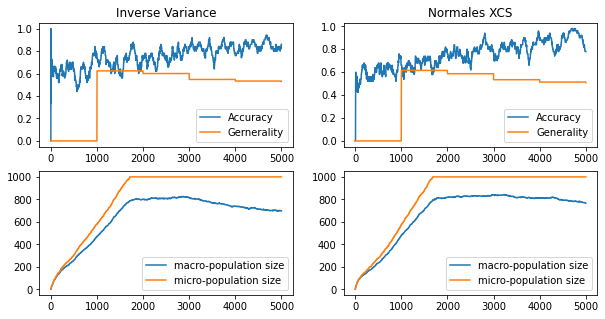

In [16]:
# Ploting 

fig, ((ax1,ax2), (ax3, ax4)) = plt.subplots(nrows=2, 
                                            ncols=2,
                                            figsize=(10,5))

ax1.plot(td_inv_var.accuracy, label="Accuracy")
ax1.plot(td_inv_var.generality, label="Gernerality")
ax1.legend()
ax1.set(title="Inverse Variance")

ax2.plot(td.accuracy, label="Accuracy")
ax2.plot(td.generality, label="Generality")
ax2.legend()
ax2.set(title="Normales XCS")

ax3.plot(td_inv_var.macroPop, label="macro-population size")
ax3.plot(td_inv_var.microPop, label="micro-population size")
ax3.legend()

ax4.plot(td.macroPop, label="macro-population size")
ax4.plot(td.microPop, label="micro-population size")
ax4.legend()
